<a href="https://colab.research.google.com/github/h30e07/E4sosei/blob/main/AB_Syllabus_Completed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

AかつBの単語を1とする。
<br>
Aから見てBとどれだけ類似しているかを出力する。つまり、$w_a$と$w_b$を入れ替えると出力が変化する。
$$
similarityAtoB = \dfrac{1}{|A|}(\dfrac{|A-A\cap{B}|}{|A-A\cap{B}||B-A\cap{B}|}{\sum_{w_a\in{(A-A\cap{B})}}}\;{\sum_{w_b\in{(B-A\cap{B})}}}f(w_a, w_b)+\sum_{w_a\in{(A\cap{B})}}1)
\\A:シラバスAに現れる全単語の集合,
\\B:シラバスBに現れる全単語の集合,
\\f(w_a, w_b):単語w_aと単語w_bの関連度合いを-1～1の値で返す関数,
$$


# Google Drive マウント
（一番最初にこれを実行してください）

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# シラバスクラス

In [2]:
import re
class Syllabus:
    def __init__(self, path):
        self.path = path
        self.subject_name = re.sub('([0-9]+)', '', path.replace('/content/drive/MyDrive/sosei/meishi/meishi_', '').replace('.txt', '')).replace('()', '').replace('（）', '')
        self.subject_code = re.search('[0-9]{4}', path).group()
        self.grade = re.findall('_([0-9]{1})', path)[0]
        self.words = ""
        self.words_set = {}

    def set_words_set(self):
        with open(self.path) as s:
            self.words = s.read()
        self.words_set = set(self.words.split())
        return self.words_set

    def get_dict():
        output = {
            'path': self.path,
            'words': self.words,
            'words_set': self.words_set,
        }
        return output

# get_all_combinations関数

In [3]:
def get_all_combinations(sa_words, sb_words):
    all_combinations = []
    for sa_word in sa_words:
        for sb_word in sb_words:
            try:
                all_combinations.append(
                    {
                        'word1': sa_word,
                        'word2': sb_word,
                        'similarity': float(w2v_model.similarity(sa_word, sb_word))
                    }
                )
            except KeyError:
                pass
    sorted_all_combinations = sorted(all_combinations, key=lambda x: x['similarity'], reverse=True)
    return sorted_all_combinations

#関連性クラス

In [4]:
class Similarity:
    def __init__(self, words_combinations):
        self.words_combinations = words_combinations
        self.similarity = 0
        self.key_data = {}
        self.distribution = []

    def calc_similarity(self, sa_words_count, sb_words_count, sa_and_sb_count):  #重複している単語を1とする
        for  word_combination in self.words_combinations:
            self.similarity += word_combination['similarity']
        self.similarity = (self.similarity / sb_words_count + sa_and_sb_count) / (sa_words_count + sa_and_sb_count)
        return self.similarity
    
    def set_key_data(self, sa_subject_name, sb_subject_name):
        self.key_data = {
            'word_combination_sum': len(self.words_combinations),
            'min_similarity_value': self.words_combinations[-1]['similarity'],
            'max_similarity_value': self.words_combinations[0]['similarity'],
            'distribution': self.show_distribution(sa_subject_name, sb_subject_name)
        }
        return self.key_data


    def show_distribution(self, sa_subject_name, sb_subject_name):
        import numpy as np
        import pandas as pd
        import matplotlib.pyplot as plt
        fig = plt.figure()
        similarity_list = [d.get('similarity') for d in self.words_combinations]
        bins = np.arange(-1, 1, 0.1) # 等差数列
        sr = pd.Series(similarity_list)
        sr1 = pd.cut(sr, bins=bins)
        vc = sr1.value_counts(sort=False)
        y, ind, pacthes = plt.hist(sr,bins = bins.size-2, range =(-1,1))
        print('y', y)
        print('ind', ind)
        plt.xlabel("similarity")
        plt.ylabel("number of combinations")
        # plt.title(f"{sa_path.replace('/content/drive/MyDrive/sosei/meishi/meishi_', '')}, {sb_path.replace('/content/drive/MyDrive/sosei/meishi/meishi_', '')}", fontname="MS Gothic")
        plt.show()
        fig.savefig(f"/content/drive/MyDrive/sosei/result_data/AB_Syllabus_Completedの画像/{sa_subject_name}_{sb_subject_name}.png")
        return self.distribution
    
    def get_dict(self):
        output = {
            'similarity': self.similarity,
            #'key_data': self.key_data,
            #'words_combinations': self.words_combinations,
        }
        return output

# similarityを求める関数（計算方法を変えた場合はこの関数の内容を変えればよい）

In [ ]:
"""
sa_and_sb_set = sa.words_set & sb.words_set # AかつBの集合
sa_remained_set = sa.words_set - sa_and_sb_set
sb_remained_set = sb.words_set - sa_and_sb_set
similarity = Similarity(get_all_combinations(sa_remained_set, sb_remained_set))
if len(sa_remained_set) != 0:   # AがBの部分集合出ないとき
    similarity.calc_similarity(len(sa_remained_set), len(sb_remained_set),len(sa_and_sb_set))
    similarity.set_key_data(sa.subject_name, sb.subject_name)
else:
    similarity.similarity = 1
"""

# シラバスの全組み合わせを返す関数

In [5]:
def get_all_syllabus_combination():
    import glob
    import itertools
    output = []
    files = glob.glob(f"/content/drive/MyDrive/sosei/meishi/*")
    print(len(files))
    output = list(itertools.combinations(files, 2))
    return output

In [6]:
def syllabus_similarity(sa_path, sb_path):
    """
    AかつBの単語を1として計算するメイン関数。
    入力の2つのファイルから求められたあらゆるデータは変数outputに格納される。

    Parameters
    ----------
    sa_path : string
        シラバスaの形態素解析済みのファイルのパス
    sb_path : string
        シラバスbの形態素解析済みのファイルのパス
    """
    
    sa = Syllabus(sa_path)
    sb = Syllabus(sb_path)
    sa.set_words_set()
    sb.set_words_set()
    
    # 本処理 
    sa_and_sb_set = sa.words_set & sb.words_set # AかつBの集合
    sa_remained_set = sa.words_set - sa_and_sb_set
    sb_remained_set = sb.words_set - sa_and_sb_set
    similarity = Similarity(get_all_combinations(sa_remained_set, sb_remained_set))
    if len(sa_remained_set) != 0:   # AがBの部分集合出ないとき
        similarity.calc_similarity(len(sa_remained_set), len(sb_remained_set),len(sa_and_sb_set))
        similarity.set_key_data(sa.subject_name, sb.subject_name)
    else:
        similarity.similarity = 1

    output = {
        's1': sa.path,
        's2': sb.path,
        'similarity': similarity.get_dict()['similarity']
    }
    print('output', output)
    return output

# メインプログラム　AかつBの単語は1とする
（準備ができたらこれを実行してください）

44


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.800e+01 2.980e+02
 1.229e+03 2.401e+03 2.652e+03 2.073e+03 1.085e+03 5.040e+02 2.200e+02
 6.700e+01 1.700e+01 1.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


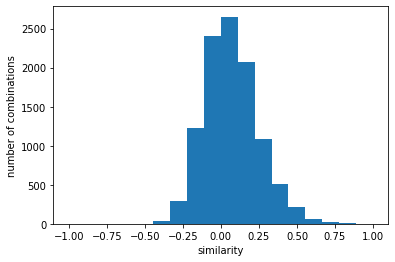

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 'similarity': 0.5395098201139621}
y [  0.   0.   0.   0.   0.   6.  42. 285. 678. 817. 630. 459. 268. 137.
  76.  39.   6.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


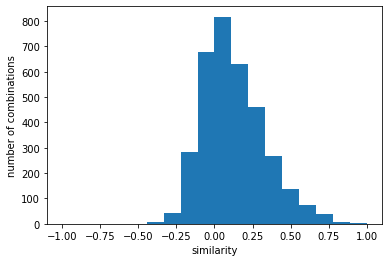

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 'similarity': 0.7125891564036486}
y [  0.   0.   0.   0.   1.  11.  46. 286. 639. 824. 742. 525. 329. 174.
 117.  44.  10.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


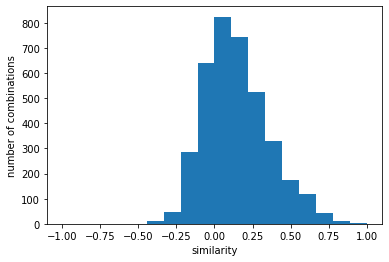

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 'similarity': 0.7533188705963509}
y [  0.   0.   0.   0.   0.   7.  37. 284. 623. 875. 724. 465. 310. 167.
 104.  67.  29.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


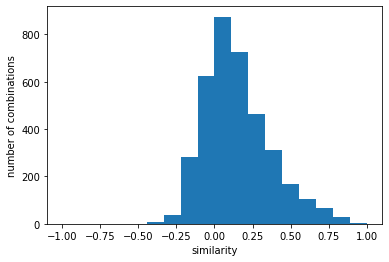

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 'similarity': 0.7547599627838549}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   41.  294. 1058. 2029. 2463. 2063. 1176.
  658.  245.  102.   42.   19.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


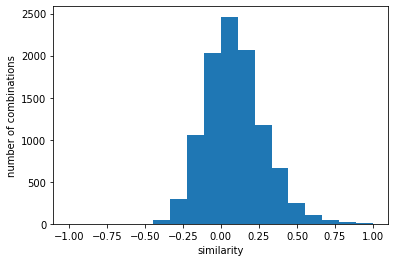

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 'similarity': 0.5525397142135523}
y [  0.   0.   0.   0.   0.   5.  41. 274. 571. 761. 664. 450. 276. 149.
  81.  51.  25.  15.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


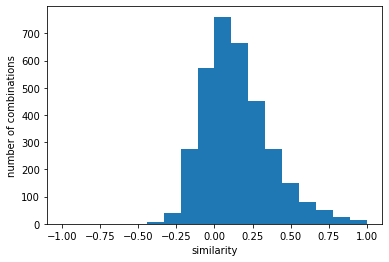

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 'similarity': 0.7407248996250322}
y [  0.   0.   0.   0.   0.   3.  14. 124. 264. 387. 376. 320. 195. 100.
  52.  29.   8.   0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


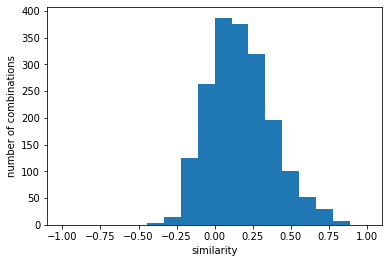

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 'similarity': 0.8383685460402228}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 2.110e+02
 7.760e+02 1.494e+03 1.745e+03 1.550e+03 1.121e+03 6.320e+02 2.770e+02
 1.250e+02 5.000e+01 2.000e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


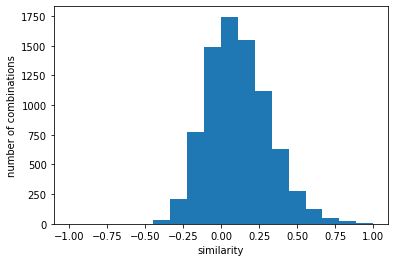

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 'similarity': 0.6533851032736834}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   33.  264.  934. 1868. 2269. 1803. 1164.
  571.  228.   93.   26.    7.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


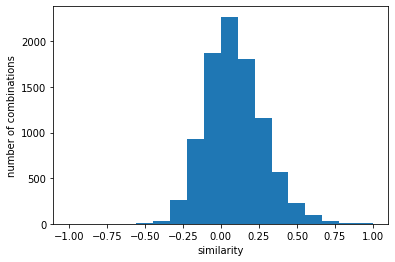

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.5811386789686751}
y [   0.    0.    0.    0.    0.   14.  136.  455. 1136. 1082.  737.  376.
  200.  102.   80.   44.   12.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


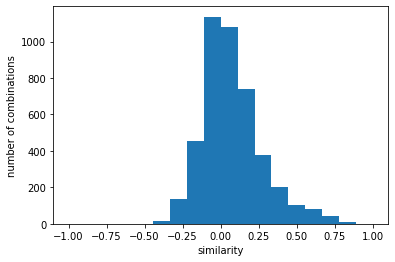

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.7545364572999923}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.800e+01 1.620e+02
 7.030e+02 1.259e+03 1.555e+03 1.430e+03 9.530e+02 5.150e+02 2.330e+02
 1.020e+02 4.300e+01 1.800e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


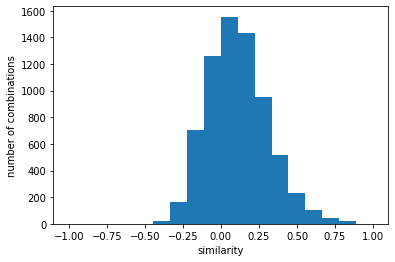

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5815839329234559}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.500e+01 2.040e+02
 7.900e+02 1.615e+03 2.016e+03 1.686e+03 1.011e+03 5.520e+02 2.330e+02
 9.300e+01 3.200e+01 1.100e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


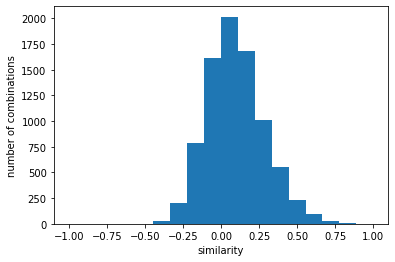

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5922687971635408}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.390e+02
 6.030e+02 1.285e+03 1.517e+03 1.379e+03 8.370e+02 4.900e+02 1.950e+02
 6.400e+01 1.900e+01 3.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


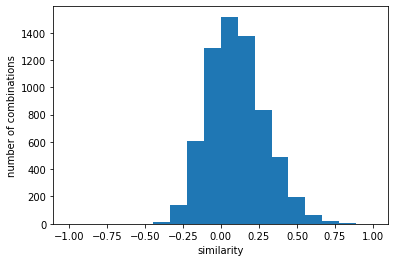

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.6188703299630667}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 1.780e+02
 7.030e+02 1.423e+03 1.735e+03 1.323e+03 8.650e+02 5.090e+02 2.600e+02
 1.010e+02 3.900e+01 7.000e+00 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


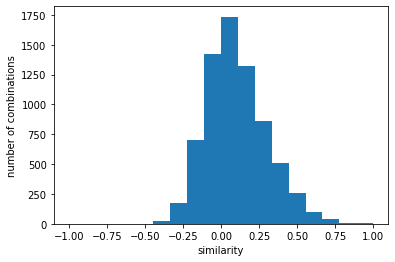

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5818601435894355}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   35.  282. 1100. 2101. 2750. 2244. 1591.
  824.  335.  145.   49.   21.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


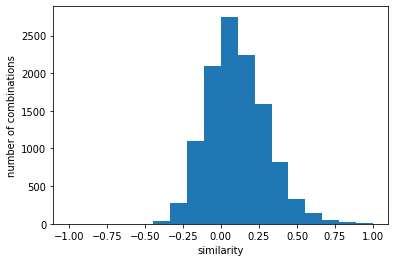

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.5504227480893409}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.300e+01 2.290e+02
 8.850e+02 1.558e+03 1.850e+03 1.492e+03 9.570e+02 5.510e+02 2.090e+02
 1.330e+02 5.900e+01 1.800e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


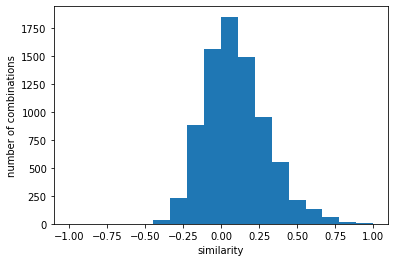

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.6331939389351572}
y [   0.    0.    0.    0.    0.    8.  101.  380.  883. 1084. 1006.  695.
  402.  181.   78.   53.   21.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


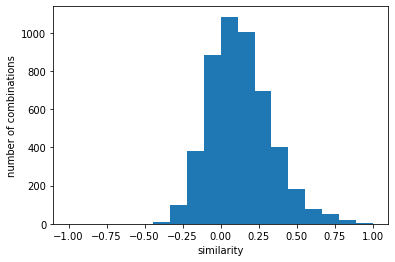

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.6949832947383663}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.500e+01 2.080e+02
 7.860e+02 1.479e+03 1.735e+03 1.530e+03 8.890e+02 4.840e+02 2.230e+02
 8.300e+01 2.800e+01 8.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


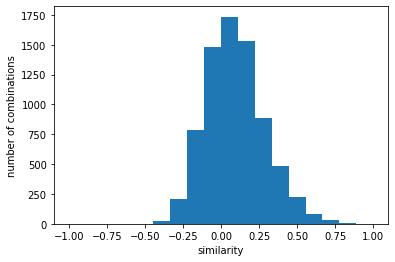

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.6042933861174298}
y [   0.    0.    0.    0.    0.   13.   87.  372.  876. 1164. 1147.  789.
  431.  221.  105.   65.   21.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


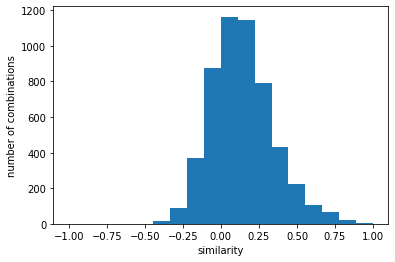

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.702156351115572}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.790e+02
 5.970e+02 1.247e+03 1.559e+03 1.276e+03 7.920e+02 4.150e+02 1.770e+02
 8.800e+01 3.400e+01 1.600e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


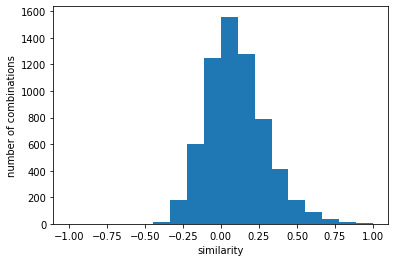

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6406466989764162}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   39.  291. 1086. 2146. 2610. 2074. 1371.
  740.  379.  142.   60.   26.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


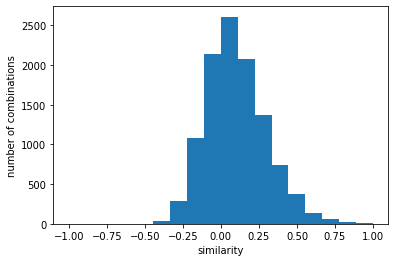

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5513131710959379}
y [   0.    0.    0.    0.    0.    8.   69.  359.  812. 1021.  832.  595.
  338.  157.   82.   58.   19.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


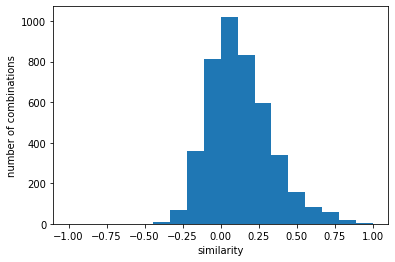

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.7067989085124693}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 9.200e+01
 3.640e+02 8.220e+02 1.101e+03 1.056e+03 7.770e+02 4.020e+02 2.010e+02
 1.090e+02 5.600e+01 1.900e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


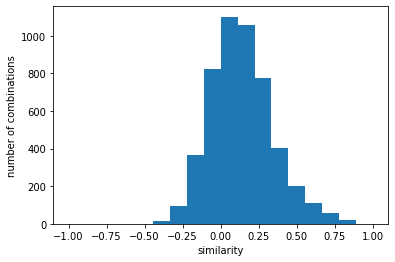

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.7067249339579054}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 1.920e+02
 6.380e+02 1.239e+03 1.528e+03 1.230e+03 7.850e+02 4.590e+02 2.170e+02
 9.000e+01 3.300e+01 5.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


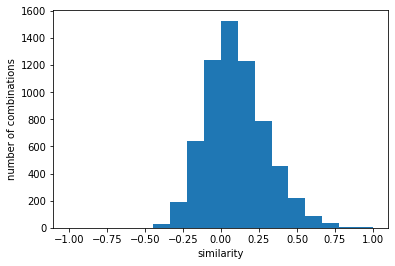

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.6008650720581351}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+00 7.100e+01
 3.420e+02 7.750e+02 1.032e+03 8.710e+02 6.190e+02 3.850e+02 1.580e+02
 7.900e+01 5.900e+01 1.900e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


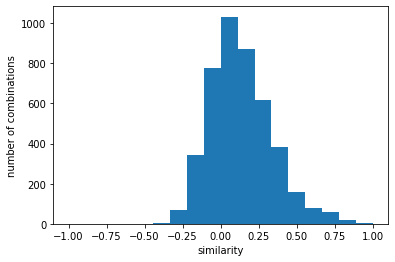

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6997485907569688}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+01 1.120e+02
 5.840e+02 1.112e+03 1.378e+03 1.138e+03 7.150e+02 3.530e+02 1.440e+02
 5.500e+01 2.000e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


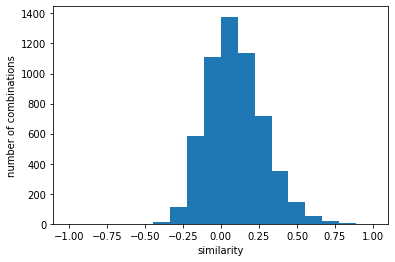

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.610798336441495}
y [   0.    0.    0.    0.    0.   14.   96.  416. 1011. 1138.  932.  597.
  390.  212.  107.   51.   13.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


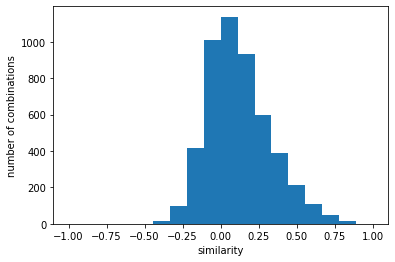

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6600433531467633}
y [  0.   0.   0.   0.   1.  10.  52. 346. 715. 926. 844. 623. 358. 173.
 104.  49.  15.   5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


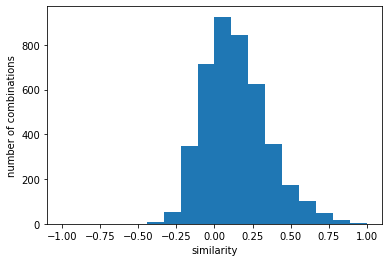

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.7119575581812041}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.500e+01 3.240e+02
 1.192e+03 2.495e+03 2.954e+03 2.277e+03 1.483e+03 7.680e+02 3.610e+02
 1.750e+02 5.500e+01 2.400e+01 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


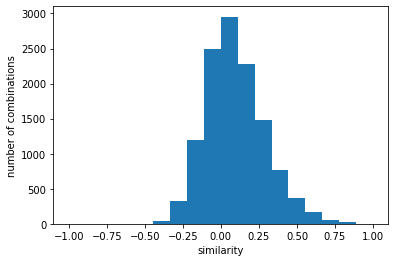

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.6031259300300621}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   15.  177.  635. 1215. 1509. 1291.  870.
  514.  233.  109.   48.   19.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


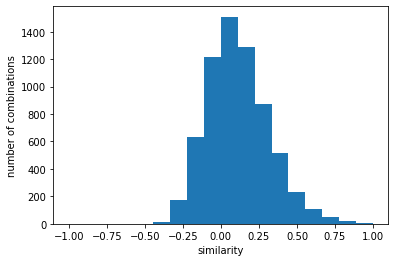

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6255950323530288}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 1.760e+02
 6.950e+02 1.372e+03 1.658e+03 1.271e+03 7.580e+02 4.330e+02 2.150e+02
 1.090e+02 6.000e+01 2.600e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


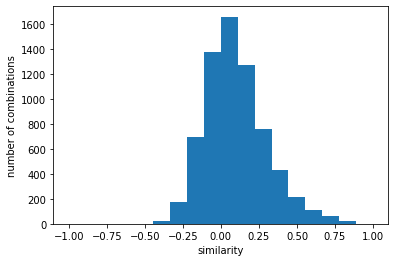

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6070069943317445}
y [  0.   0.   0.   0.   0.   5.  66. 361. 751. 982. 887. 570. 337. 161.
 102.  48.  14.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


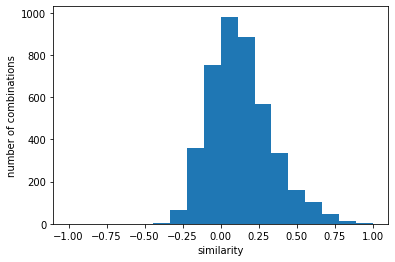

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6986987397508254}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   26.  171.  782. 1666. 2002. 1693. 1052.
  599.  248.  123.   69.   22.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


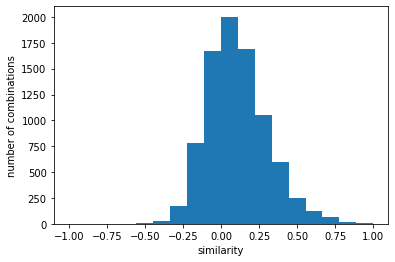

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5888678320843064}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.000e+01 2.090e+02
 8.990e+02 1.850e+03 2.358e+03 1.804e+03 1.200e+03 6.190e+02 2.940e+02
 1.360e+02 5.900e+01 1.800e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


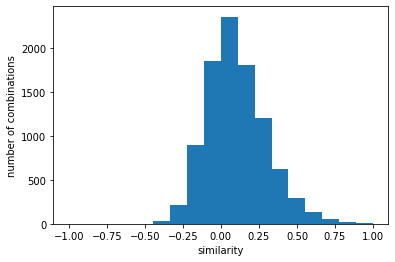

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5989208691374904}
y [  0.   0.   0.   0.   0.   4.  53. 298. 619. 796. 684. 440. 276. 138.
  83.  43.   9.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


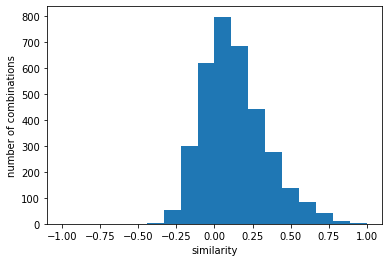

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.7068863837160366}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   26.  195.  848. 1743. 2139. 1772. 1132.
  580.  245.  127.   76.   19.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


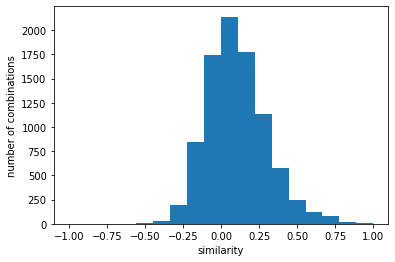

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5882929369252189}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.600e+01 1.570e+02
 7.360e+02 1.516e+03 1.868e+03 1.524e+03 9.600e+02 5.310e+02 2.630e+02
 1.270e+02 3.200e+01 9.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


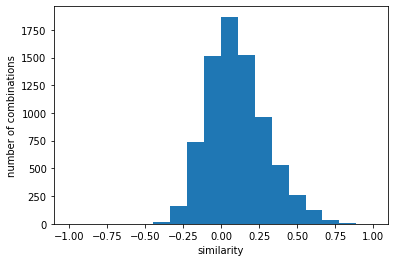

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.615732243177688}
y [  0.   0.   0.   0.   0.   1.  57. 334. 747. 952. 848. 580. 342. 177.
 129.  44.  11.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


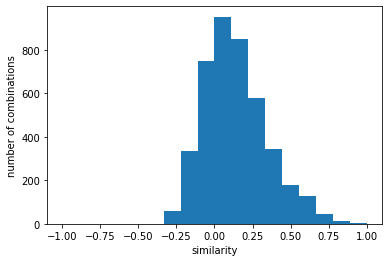

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.709832839197795}
y [   0.    0.    0.    0.    0.   44.  228.  820. 1620. 1903. 1367.  906.
  460.  190.   67.   28.   17.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


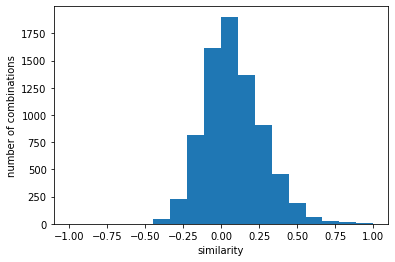

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6072371575274722}
y [   0.    0.    0.    0.    0.    5.   68.  354.  825. 1061.  974.  637.
  372.  173.   92.   40.   18.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


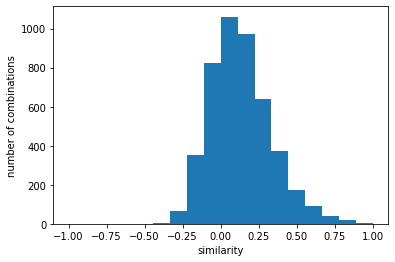

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6995084139047134}
y [   0.    0.    0.    0.    0.   12.  121.  613. 1194. 1469. 1252.  818.
  473.  251.  120.   47.   14.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


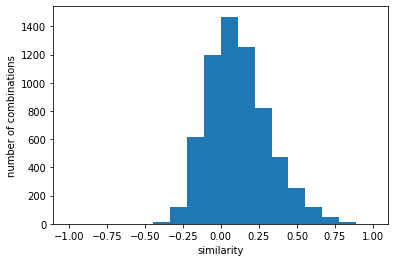

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6290357892044386}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.100e+01 1.930e+02
 8.590e+02 1.735e+03 2.171e+03 1.877e+03 1.228e+03 6.610e+02 3.280e+02
 1.380e+02 4.000e+01 1.200e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


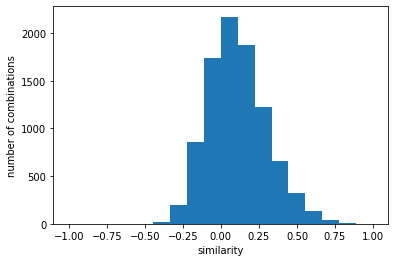

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6130391934042627}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   20.  157.  720. 1544. 1922. 1689. 1052.
  575.  237.  112.   49.   18.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


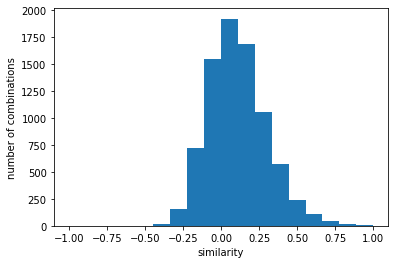

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学E(0078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6040539862202506}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.400e+01 3.360e+02
 1.390e+03 2.966e+03 3.069e+03 2.229e+03 1.126e+03 5.000e+02 2.200e+02
 9.200e+01 2.300e+01 1.700e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


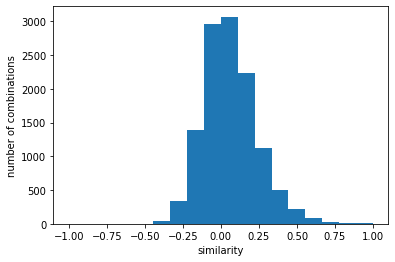

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 'similarity': 0.45665308115918235}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.100e+01 3.950e+02
 1.550e+03 3.173e+03 3.448e+03 2.513e+03 1.258e+03 5.780e+02 2.340e+02
 9.400e+01 2.100e+01 2.300e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


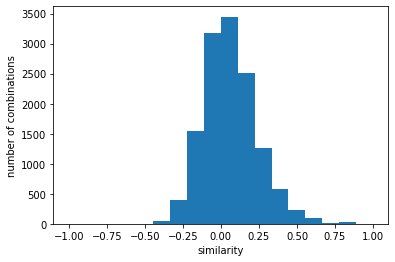

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 'similarity': 0.4824165499844709}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   40.  364. 1585. 3383. 3761. 2643. 1340.
  597.  243.  112.   33.   51.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


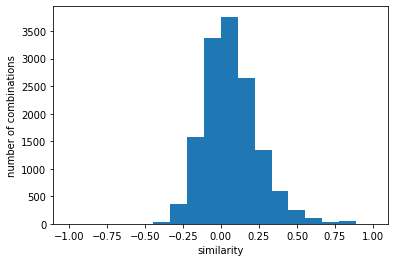

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 'similarity': 0.46712195155383746}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.500e+01 2.650e+02
 1.037e+03 1.982e+03 2.435e+03 1.945e+03 1.146e+03 6.090e+02 2.450e+02
 7.300e+01 2.600e+01 7.000e+00 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


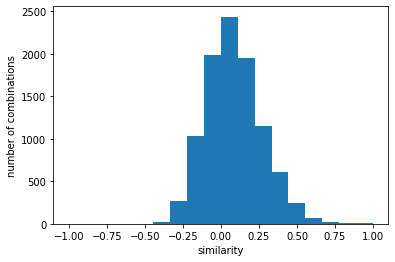

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 'similarity': 0.5593196298171667}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   44.  353. 1441. 2999. 3382. 2359. 1188.
  551.  252.   98.   30.   45.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


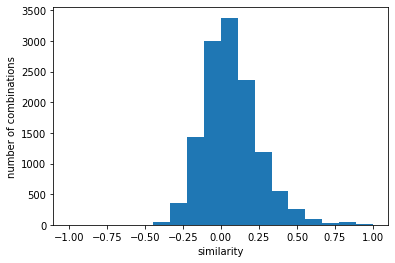

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 'similarity': 0.46700467253263445}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.500e+01 3.380e+02
 1.430e+03 2.750e+03 2.934e+03 2.205e+03 1.157e+03 5.550e+02 2.370e+02
 8.500e+01 2.200e+01 2.100e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


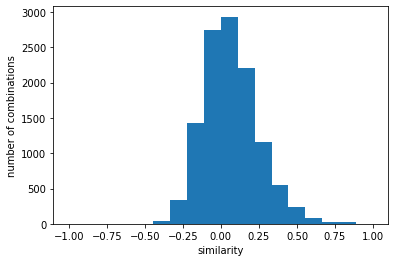

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 'similarity': 0.5200415160122774}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.100e+01 3.600e+02
 1.331e+03 2.556e+03 2.667e+03 2.172e+03 1.178e+03 5.790e+02 2.470e+02
 7.600e+01 1.900e+01 1.100e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


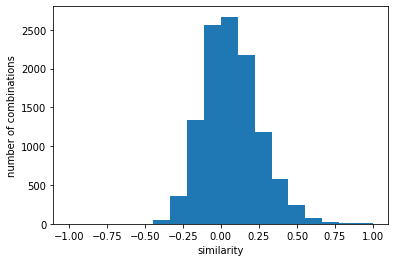

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 'similarity': 0.5651127928488248}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   29.  328. 1174. 2344. 2710. 2254. 1402.
  673.  273.   89.   29.   17.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


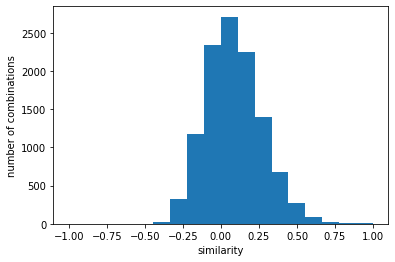

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.5368406701879342}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   63.  505. 1755. 3440. 3221. 1936.  876.
  444.  183.   55.   17.   32.   19.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


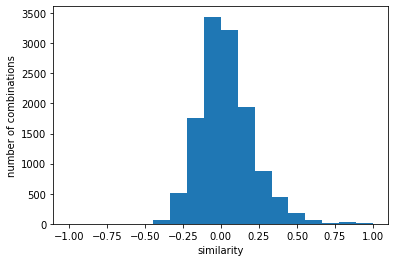

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.527571527367819}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.100e+01 2.680e+02
 1.043e+03 2.004e+03 2.118e+03 1.616e+03 8.300e+02 3.720e+02 1.680e+02
 4.100e+01 2.000e+01 1.000e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


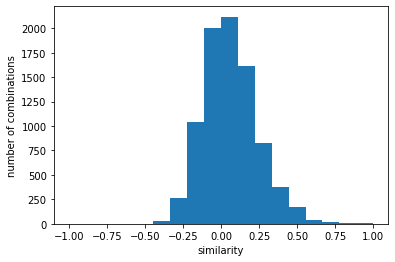

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5211048854239598}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.100e+01 3.140e+02
 1.105e+03 2.189e+03 2.434e+03 1.881e+03 9.510e+02 4.430e+02 1.690e+02
 5.300e+01 1.300e+01 1.300e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


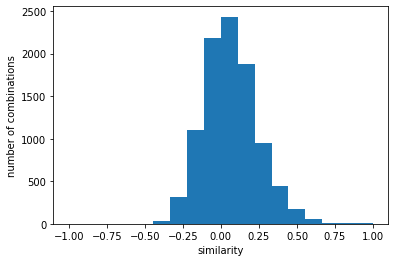

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5477111979336987}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   20.  193.  868. 1674. 2146. 1714.  953.
  448.  154.   36.   13.    6.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


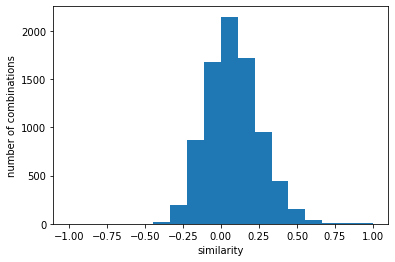

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5655698526336905}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  271. 1063. 2188. 2464. 1878. 1025.
  452.  227.   48.   18.   27.   14.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


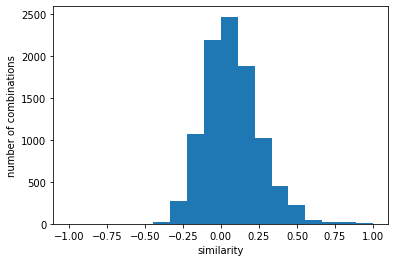

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5092587998364386}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.300e+01 2.700e+02
 9.210e+02 1.933e+03 2.334e+03 1.997e+03 1.310e+03 6.610e+02 2.750e+02
 9.500e+01 4.000e+01 8.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


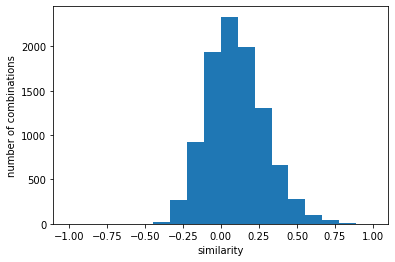

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.5809301859484689}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.900e+01 3.860e+02
 1.369e+03 2.645e+03 2.914e+03 2.269e+03 1.199e+03 5.950e+02 2.580e+02
 8.800e+01 3.300e+01 1.400e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


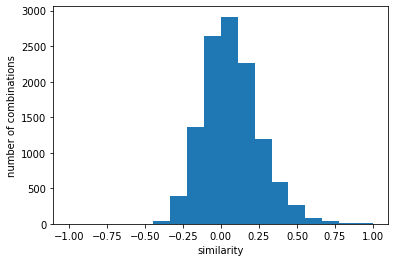

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.5392344446453692}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.400e+01 3.380e+02
 1.210e+03 2.446e+03 2.618e+03 1.856e+03 1.014e+03 5.360e+02 2.360e+02
 6.900e+01 1.600e+01 1.400e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


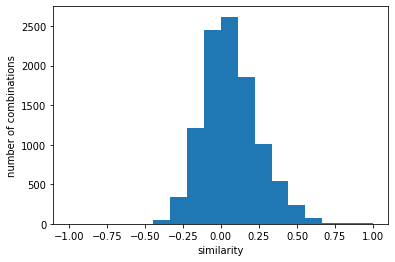

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.5274812454493186}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.400e+01 2.580e+02
 9.000e+02 1.815e+03 2.094e+03 1.663e+03 9.390e+02 4.110e+02 1.700e+02
 4.900e+01 2.300e+01 7.000e+00 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


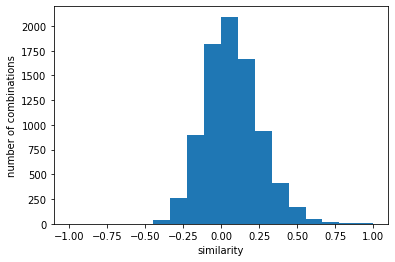

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5738201499052318}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+01 3.470e+02
 1.256e+03 2.556e+03 2.733e+03 1.965e+03 1.032e+03 5.340e+02 2.340e+02
 6.300e+01 1.800e+01 1.400e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


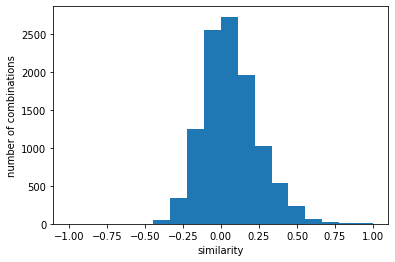

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.5351141144242425}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.200e+01 2.740e+02
 1.006e+03 1.932e+03 2.191e+03 1.599e+03 9.150e+02 4.490e+02 1.630e+02
 5.100e+01 1.800e+01 6.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


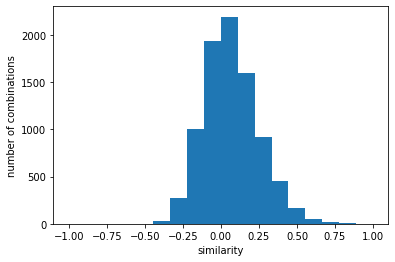

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.5694999510061035}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.700e+01 4.550e+02
 1.534e+03 3.037e+03 3.320e+03 2.627e+03 1.384e+03 6.520e+02 2.660e+02
 7.000e+01 2.600e+01 6.000e+00 1.500e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


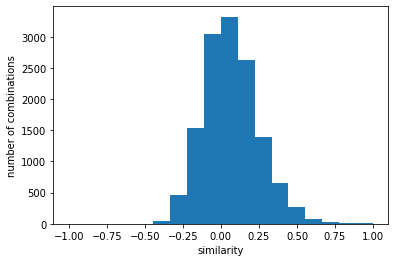

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.4884088614774855}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   39.  310. 1215. 2475. 2677. 1925.  987.
  480.  193.   64.   19.   13.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


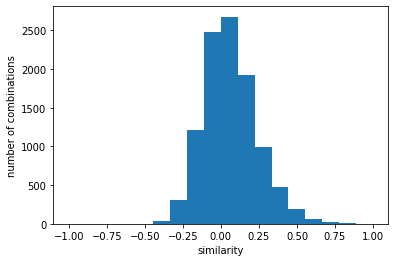

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.521561614370367}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.200e+01 3.590e+02
 1.266e+03 2.536e+03 2.665e+03 1.974e+03 1.084e+03 5.280e+02 2.380e+02
 7.300e+01 1.600e+01 1.500e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


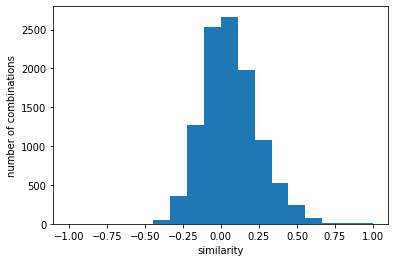

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.5317893114900722}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  275. 1058. 2155. 2374. 1936. 1055.
  463.  202.   50.   18.    9.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


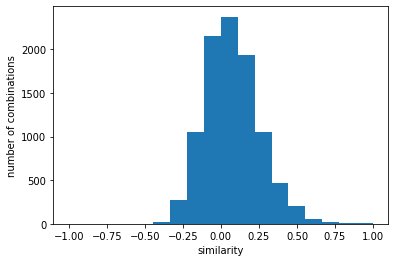

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5123039379697728}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   32.  257. 1137. 2300. 2647. 2012. 1056.
  519.  211.   78.   23.   14.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


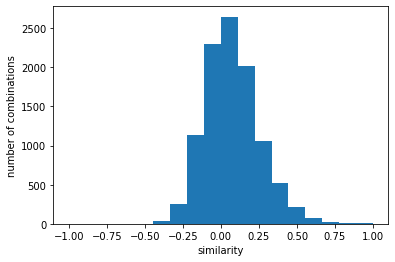

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5221437647198337}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  242.  988. 1977. 2176. 1692.  867.
  397.  168.   53.   17.    4.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


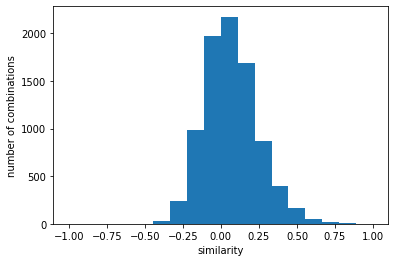

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5201515617027693}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   49.  249. 1174. 2365. 2376. 1541.  730.
  350.  165.   48.   14.   15.   19.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


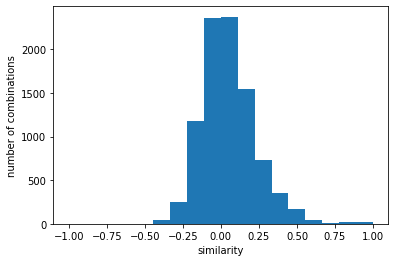

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5120101555891059}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.600e+01 2.430e+02
 1.013e+03 2.113e+03 2.205e+03 1.636e+03 8.740e+02 4.250e+02 1.870e+02
 6.100e+01 1.600e+01 1.100e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


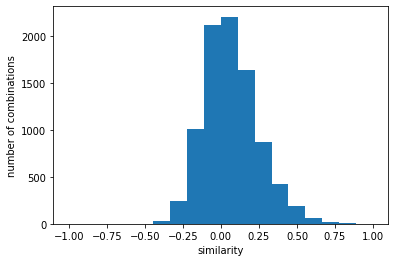

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.5547887385628532}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.100e+01 5.540e+02
 1.997e+03 3.885e+03 4.177e+03 3.162e+03 1.665e+03 7.290e+02 2.960e+02
 1.000e+02 3.000e+01 2.400e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


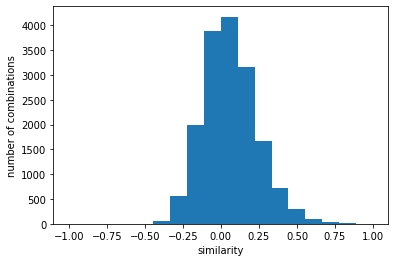

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5094094783923266}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   40.  331. 1163. 2275. 2481. 1937. 1081.
  495.  203.   52.   18.    7.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


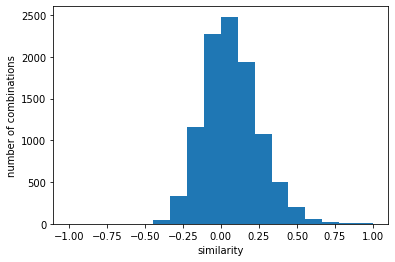

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.524156588570045}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   38.  342. 1393. 2685. 2936. 2167. 1150.
  523.  178.   72.   21.   14.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


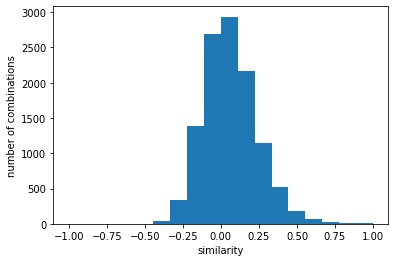

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.48222268005992863}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  303. 1107. 2240. 2482. 1787.  939.
  469.  217.   72.   20.   15.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


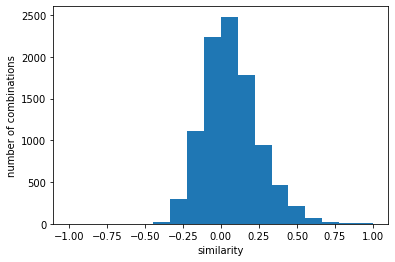

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.5281275265620154}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.900e+01 2.920e+02
 1.111e+03 2.388e+03 2.644e+03 2.012e+03 1.100e+03 4.980e+02 2.110e+02
 5.900e+01 2.600e+01 7.000e+00 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


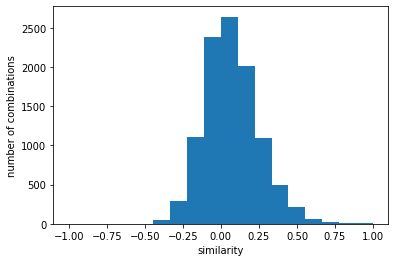

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5297213636067029}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 5.400e+01 4.010e+02
 1.525e+03 3.191e+03 3.528e+03 2.682e+03 1.453e+03 6.470e+02 2.510e+02
 7.100e+01 2.800e+01 1.300e+01 1.400e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


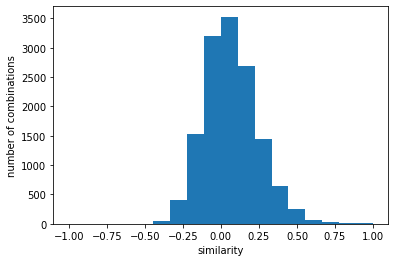

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.4974161445747829}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   27.  235.  933. 1935. 2074. 1515.  804.
  410.  175.   57.   21.   11.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


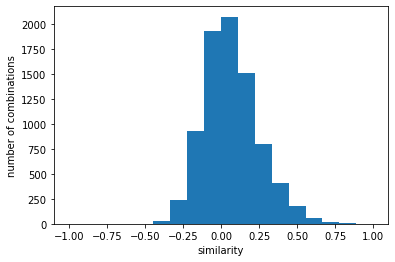

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.5413600104153067}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.400e+01 3.150e+02
 1.252e+03 2.413e+03 2.748e+03 2.008e+03 1.092e+03 5.050e+02 2.190e+02
 6.700e+01 2.700e+01 6.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


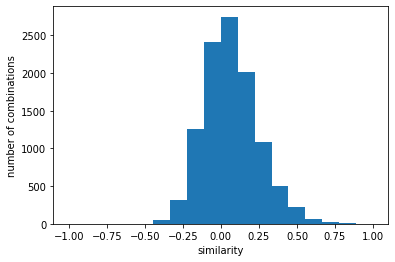

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5329646605886499}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   28.  273. 1024. 2105. 2353. 1809.  985.
  494.  219.   77.   26.    7.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


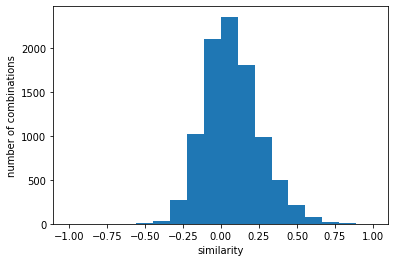

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5629221339113225}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  300. 1198. 2399. 2602. 1878.  954.
  495.  231.   68.   22.   14.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


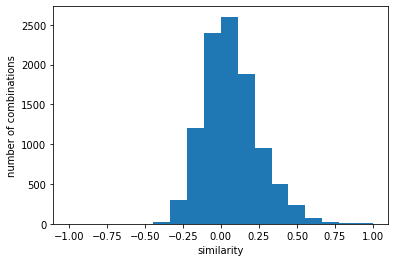

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5233561345608062}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+00 4.300e+01 2.890e+02
 9.980e+02 2.051e+03 2.263e+03 1.798e+03 1.033e+03 5.080e+02 2.070e+02
 7.500e+01 3.100e+01 7.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


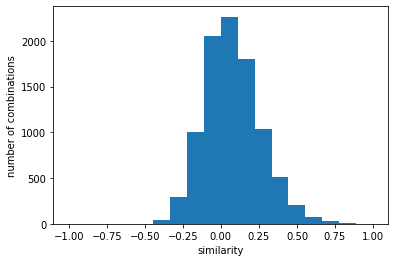

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5642166738583927}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  297. 1104. 2291. 2510. 1908.  995.
  515.  228.   82.   22.   14.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


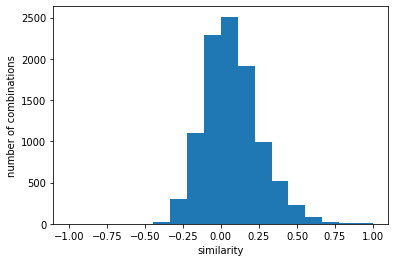

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5348280012194632}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.600e+01 2.600e+02
 9.850e+02 2.113e+03 2.318e+03 1.853e+03 1.044e+03 4.840e+02 1.950e+02
 5.300e+01 2.100e+01 6.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


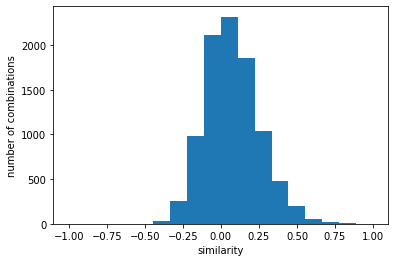

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5377335749046136}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   35.  347. 1272. 2588. 2988. 2240. 1196.
  551.  237.   84.   27.    8.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


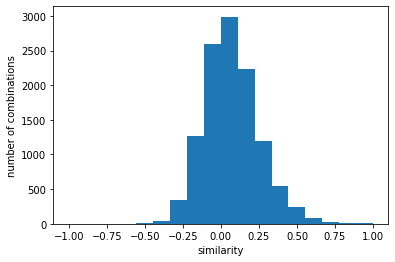

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5479281097249696}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 2.330e+02
 8.890e+02 1.721e+03 2.089e+03 1.765e+03 1.056e+03 5.320e+02 2.390e+02
 6.000e+01 2.600e+01 8.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


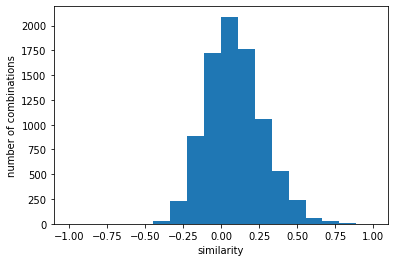

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1ものづくり基礎(0907).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5816234732597986}
y [  0.   0.   0.   0.   0.   3.  25. 114. 289. 377. 346. 262. 164.  96.
  52.  23.   5.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


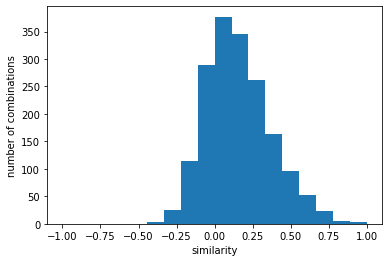

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 'similarity': 0.8605679855678583}
y [  0.   0.   0.   0.   0.   4.  20. 127. 363. 497. 465. 295. 219. 113.
  72.  70.  33.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


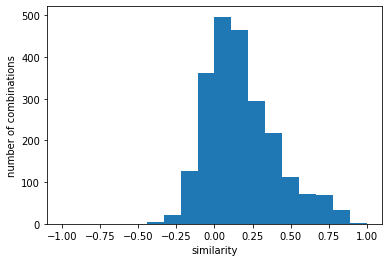

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 'similarity': 0.8334085663102216}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   42.  282. 1127. 2282. 2607. 1949. 1135.
  643.  266.  120.   52.   29.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


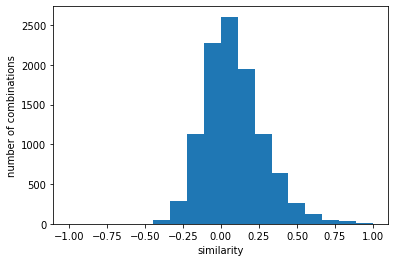

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 'similarity': 0.5341647470871679}
y [  0.   0.   0.   0.   0.   8.  26. 156. 398. 480. 460. 339. 201.  97.
  63.  36.  14.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


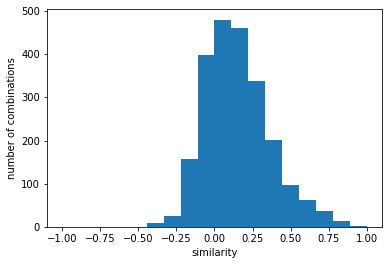

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 'similarity': 0.8113638977472887}
y [  0.   0.   0.   0.   0.   4.  24. 217. 598. 742. 573. 383. 196. 127.
  67.  27.  11.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


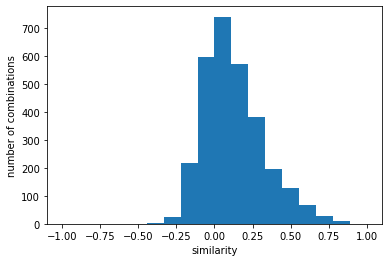

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 'similarity': 0.7926650462029183}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.400e+01 3.000e+02
 1.157e+03 2.404e+03 2.644e+03 2.084e+03 1.360e+03 7.680e+02 3.960e+02
 1.890e+02 5.900e+01 1.800e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


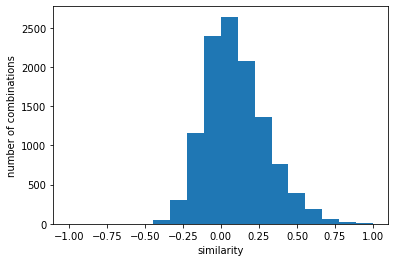

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 'similarity': 0.5639645426641752}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 8.000e+00 4.600e+01 2.820e+02
 1.108e+03 2.321e+03 2.700e+03 1.994e+03 1.280e+03 6.180e+02 2.660e+02
 1.010e+02 3.200e+01 7.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


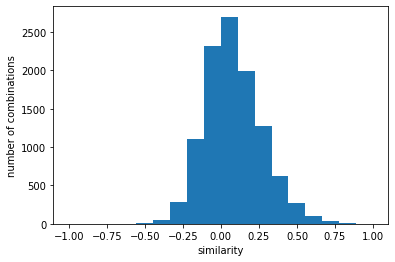

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.5520905067429828}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.900e+01 1.820e+02
 7.000e+02 1.980e+03 2.106e+03 1.273e+03 7.890e+02 4.060e+02 1.660e+02
 1.190e+02 4.400e+01 2.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


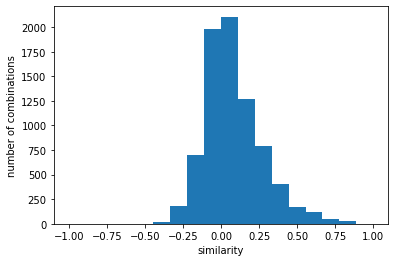

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.6602204534779497}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   16.  191.  990. 2022. 2252. 1841. 1139.
  619.  294.  156.   58.   22.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


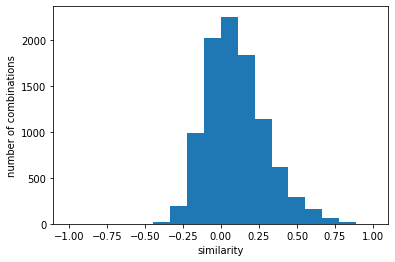

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5232525631574577}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.500e+01 2.570e+02
 1.076e+03 2.233e+03 2.531e+03 1.975e+03 1.219e+03 6.830e+02 3.140e+02
 1.610e+02 4.500e+01 1.800e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


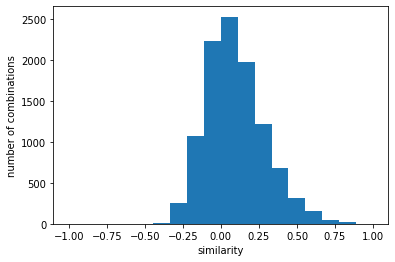

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5471203694838885}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.900e+01 1.880e+02
 8.290e+02 1.933e+03 2.085e+03 1.634e+03 9.930e+02 5.430e+02 2.640e+02
 1.190e+02 3.100e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


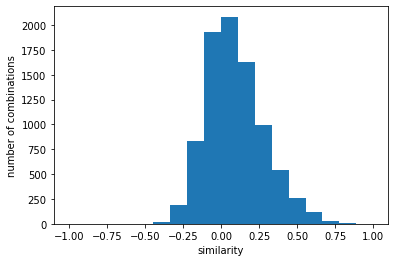

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5559625897932057}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.000e+01 2.630e+02
 1.033e+03 1.969e+03 2.177e+03 1.726e+03 1.186e+03 6.440e+02 3.340e+02
 1.700e+02 4.400e+01 1.200e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


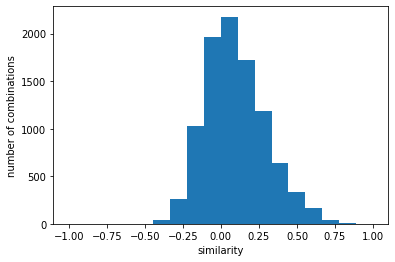

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5198929361292215}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.400e+01 3.620e+02
 1.283e+03 2.646e+03 3.182e+03 2.445e+03 1.652e+03 8.720e+02 3.900e+02
 1.650e+02 6.000e+01 3.300e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


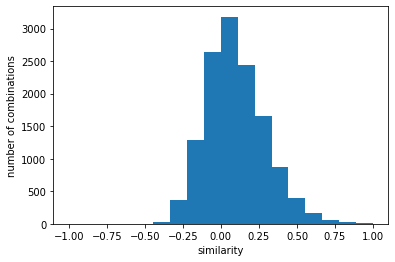

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.5184877971579018}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.300e+01 2.810e+02
 1.247e+03 2.453e+03 2.638e+03 1.925e+03 1.231e+03 6.850e+02 3.440e+02
 2.100e+02 7.400e+01 2.400e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


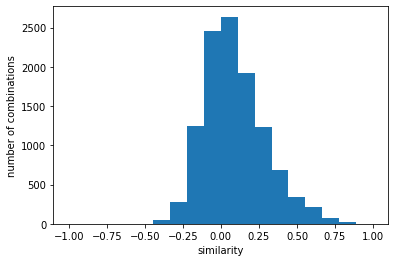

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.5662867105100596}
y [   0.    0.    0.    0.    0.    9.  106.  581. 1247. 1460. 1241.  770.
  449.  244.  130.   62.   34.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


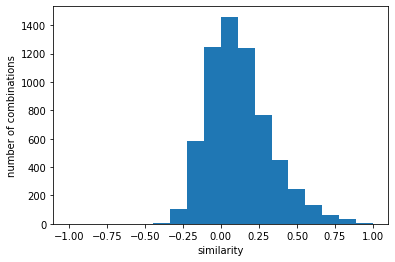

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.664379703944464}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.100e+01 2.450e+02
 9.600e+02 1.984e+03 2.265e+03 1.718e+03 1.049e+03 5.440e+02 2.810e+02
 1.200e+02 4.800e+01 9.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


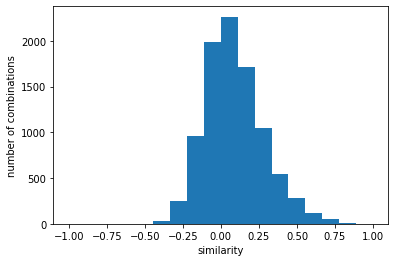

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5736857481464098}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 8.000e+00 1.040e+02
 5.760e+02 1.301e+03 1.568e+03 1.287e+03 7.630e+02 3.960e+02 2.080e+02
 1.180e+02 5.500e+01 3.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


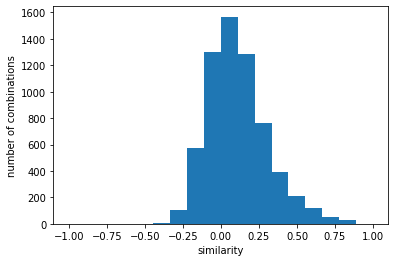

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6748074789272204}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 2.490e+02
 9.880e+02 2.091e+03 2.342e+03 1.814e+03 1.138e+03 5.820e+02 2.990e+02
 1.430e+02 6.700e+01 2.700e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


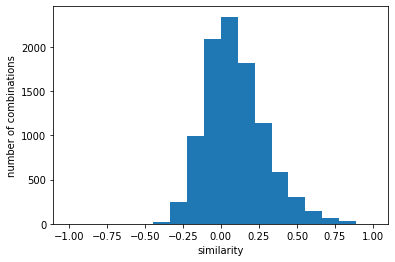

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.5486979230861876}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.500e+01 3.210e+02
 1.183e+03 2.197e+03 2.580e+03 1.971e+03 1.443e+03 8.060e+02 4.280e+02
 1.890e+02 8.500e+01 2.600e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


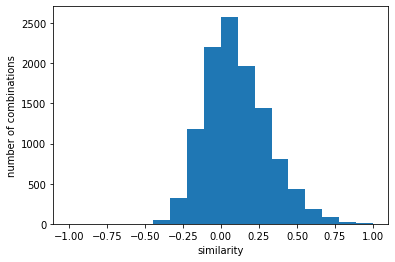

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5519771039322842}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.400e+01 9.100e+01
 5.420e+02 1.335e+03 1.596e+03 1.195e+03 7.610e+02 4.740e+02 2.530e+02
 1.290e+02 7.900e+01 4.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


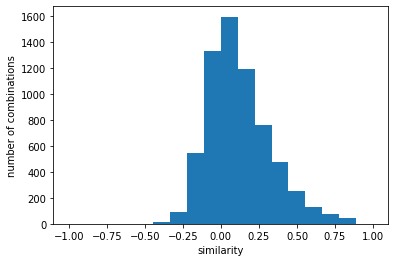

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6612570673657888}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.100e+01 1.230e+02
 6.240e+02 1.253e+03 1.393e+03 1.151e+03 6.810e+02 3.590e+02 1.990e+02
 1.080e+02 3.400e+01 2.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


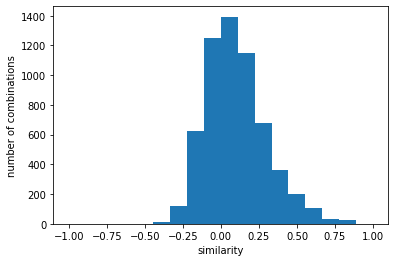

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6867599455707512}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.000e+01 2.500e+02
 1.008e+03 2.025e+03 2.206e+03 1.686e+03 1.113e+03 6.220e+02 3.230e+02
 1.710e+02 4.600e+01 1.200e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


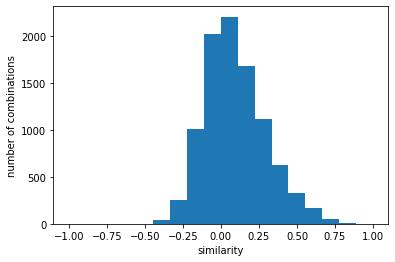

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5331117873627362}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 9.000e+00 7.100e+01
 4.670e+02 1.239e+03 1.518e+03 1.173e+03 7.620e+02 4.590e+02 2.290e+02
 1.140e+02 5.800e+01 3.000e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


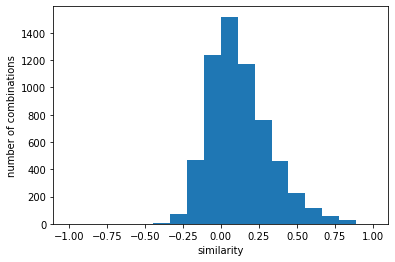

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6660752977615193}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   19.  184.  899. 1839. 2127. 1587. 1002.
  468.  264.  114.   36.   11.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


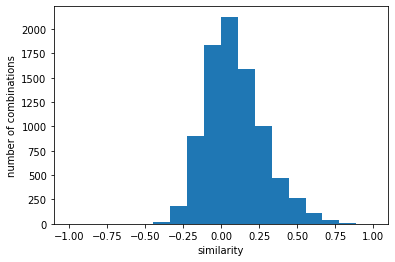

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5425384789074065}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 1.170e+02
 5.800e+02 1.697e+03 1.727e+03 1.183e+03 7.330e+02 4.020e+02 2.330e+02
 1.270e+02 4.300e+01 2.200e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


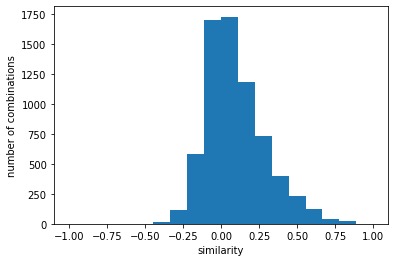

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5953922619143198}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.400e+01 9.900e+01
 5.690e+02 1.260e+03 1.461e+03 1.138e+03 7.390e+02 3.950e+02 2.090e+02
 1.100e+02 4.600e+01 2.300e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


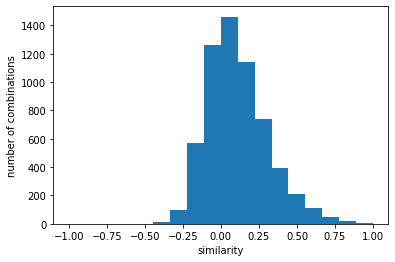

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6509102546993741}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.900e+01 4.210e+02
 1.561e+03 3.170e+03 3.445e+03 2.529e+03 1.591e+03 8.720e+02 4.480e+02
 2.170e+02 8.200e+01 2.700e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


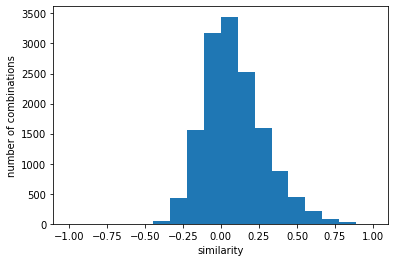

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5445294045072592}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.600e+01 2.540e+02
 9.830e+02 2.030e+03 2.310e+03 1.788e+03 1.170e+03 6.980e+02 3.440e+02
 1.620e+02 8.600e+01 2.500e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


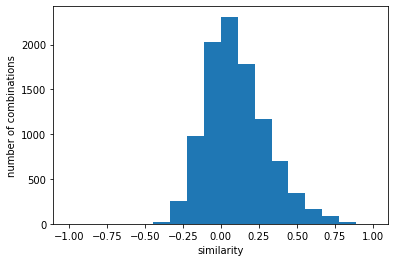

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5530078034969143}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   23.  214.  986. 1974. 2177. 1584.  975.
  566.  298.  183.   82.   46.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


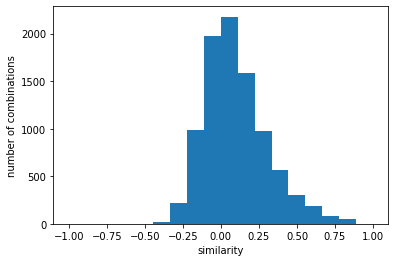

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.558990267074451}
y [   0.    0.    0.    0.    0.   13.   82.  522. 1131. 1259.  936.  567.
  349.  184.  117.   52.   22.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


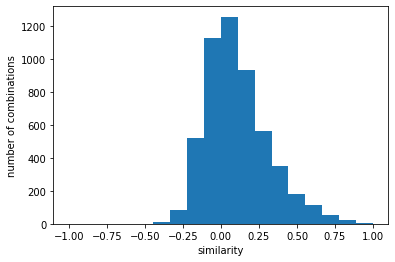

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6833052567505389}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.200e+01 2.340e+02
 9.760e+02 2.087e+03 2.427e+03 1.797e+03 1.075e+03 5.690e+02 2.870e+02
 1.590e+02 6.200e+01 2.800e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


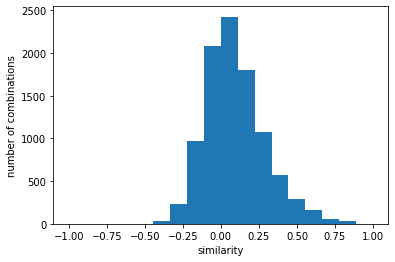

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.56731232178269}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.400e+01 2.540e+02
 1.189e+03 2.447e+03 2.746e+03 2.080e+03 1.376e+03 7.580e+02 3.850e+02
 2.220e+02 8.400e+01 2.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


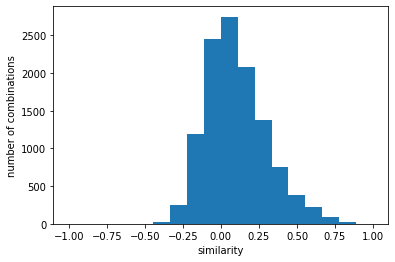

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5595008561815143}
y [   0.    0.    0.    0.    0.    7.   70.  487. 1158. 1436. 1056.  659.
  362.  213.  107.   46.   22.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


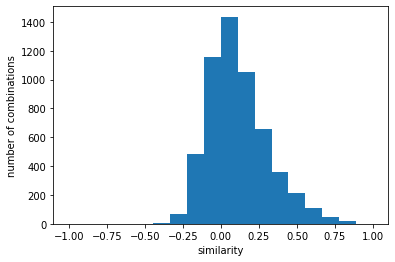

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6483473331969929}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 2.300e+02
 1.061e+03 2.258e+03 2.557e+03 1.820e+03 1.116e+03 5.610e+02 2.840e+02
 1.720e+02 7.400e+01 2.700e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


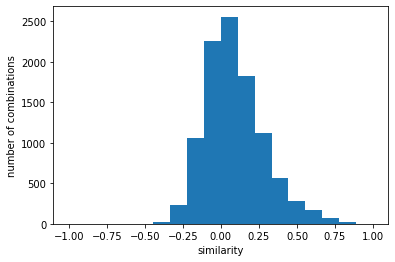

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5666044002974053}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.500e+01 2.300e+02
 1.126e+03 2.305e+03 2.540e+03 1.789e+03 1.044e+03 5.660e+02 2.910e+02
 1.660e+02 4.100e+01 1.200e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


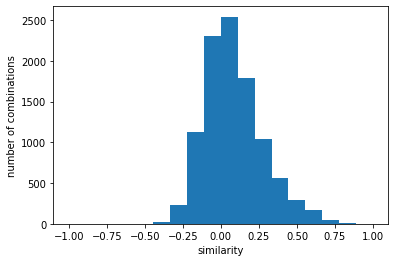

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5428778147880267}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 7.000e+00 7.600e+01
 4.440e+02 1.064e+03 1.178e+03 8.980e+02 5.750e+02 3.480e+02 2.080e+02
 1.220e+02 6.200e+01 2.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


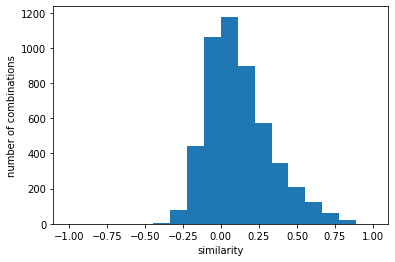

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.7009613750880413}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 6.200e+01 3.490e+02
 1.236e+03 2.451e+03 2.653e+03 1.839e+03 1.210e+03 5.870e+02 3.090e+02
 1.140e+02 3.200e+01 1.600e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


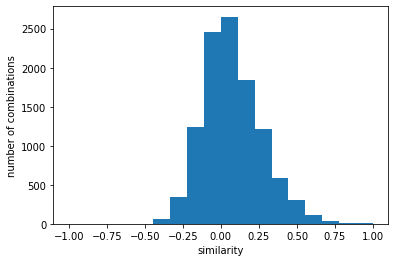

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5208293458776586}
y [   0.    0.    0.    0.    0.    9.   88.  519. 1218. 1324. 1044.  640.
  362.  200.  114.   39.   17.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


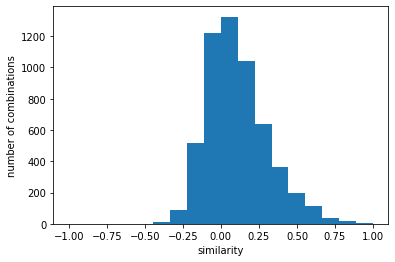

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6782395087168369}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 2.150e+02
 1.089e+03 2.188e+03 2.391e+03 1.789e+03 1.088e+03 6.080e+02 3.260e+02
 2.010e+02 6.500e+01 1.700e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


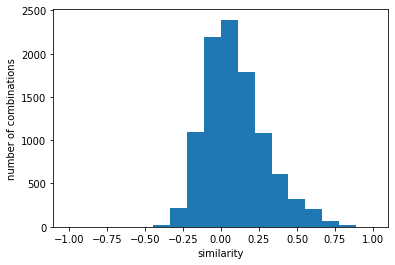

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.525239380510787}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.700e+01 2.840e+02
 1.239e+03 2.498e+03 2.771e+03 2.102e+03 1.294e+03 7.080e+02 3.830e+02
 1.910e+02 4.500e+01 1.400e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


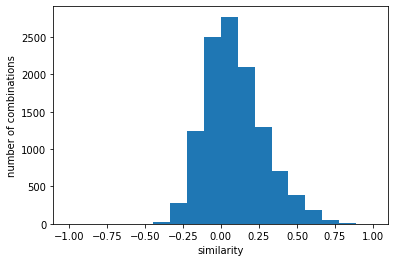

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5622781737321662}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   31.  211. 1041. 2353. 2626. 1995. 1171.
  638.  297.  123.   43.   25.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


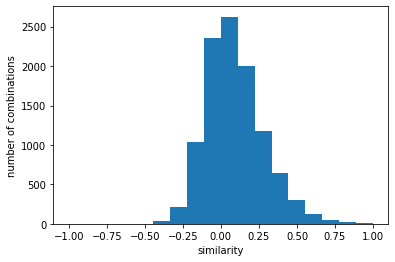

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学B(0075).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5369866650248475}
y [  0.   0.   0.   0.   1.   8.  33. 179. 484. 658. 571. 436. 263. 122.
  76.  90.  45.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


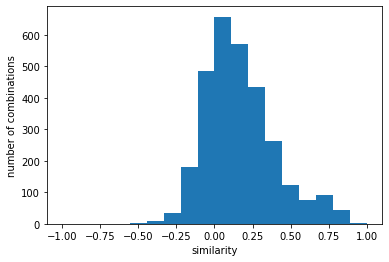

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 'similarity': 0.7696983366412805}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   44.  342. 1202. 2384. 2849. 2192. 1282.
  690.  315.  133.   64.   35.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


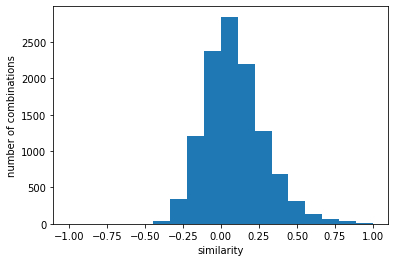

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 'similarity': 0.5080749682410791}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [  0.   0.   0.   0.   1.   3.  22. 126. 319. 449. 470. 348. 241. 134.
  91.  73.  29.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


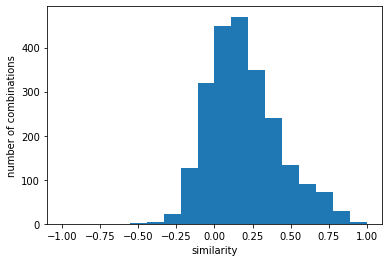

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 'similarity': 0.7796012600547919}
y [  0.   0.   0.   0.   1.   1.  30. 209. 504. 655. 603. 395. 232. 135.
  78.  55.  14.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


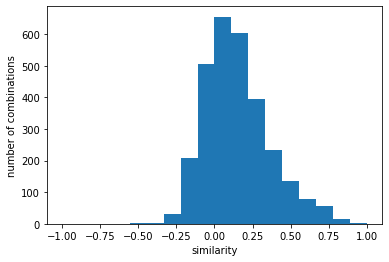

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 'similarity': 0.7650367453696593}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    7.   48.  309. 1119. 2297. 2624. 2153. 1360.
  795.  395.  189.   80.   21.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


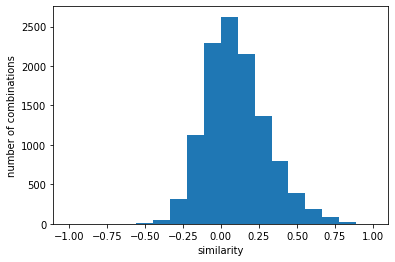

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 'similarity': 0.5597373910439675}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.100e+01 4.900e+01 3.380e+02
 1.258e+03 2.400e+03 2.865e+03 2.150e+03 1.343e+03 6.370e+02 2.680e+02
 9.500e+01 2.600e+01 7.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


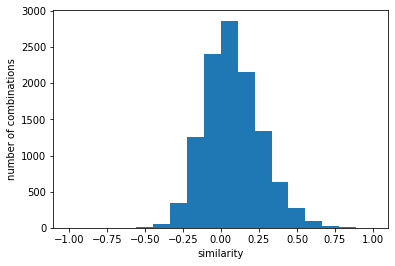

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.5332429373508837}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 1.600e+02
 6.740e+02 1.864e+03 2.180e+03 1.530e+03 7.490e+02 4.310e+02 1.940e+02
 1.260e+02 8.200e+01 2.900e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


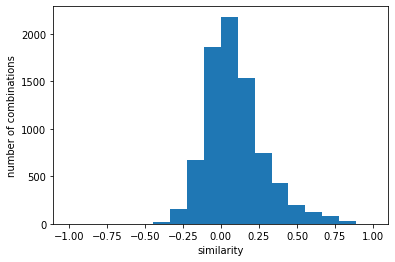

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.6415448102729054}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 2.130e+02
 9.680e+02 1.830e+03 2.195e+03 1.874e+03 1.174e+03 6.720e+02 3.490e+02
 1.420e+02 5.500e+01 2.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


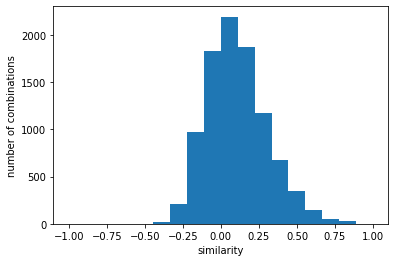

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5225284158033263}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   17.  227.  988. 2110. 2495. 1975. 1247.
  678.  329.  165.   38.   18.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


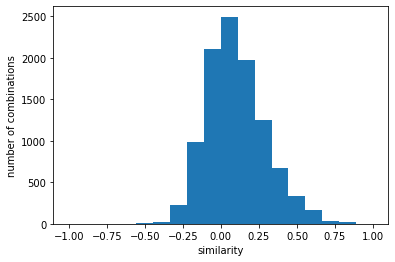

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5500306392112587}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   17.  191.  855. 1904. 2242. 1738. 1126.
  626.  338.  147.   28.    5.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


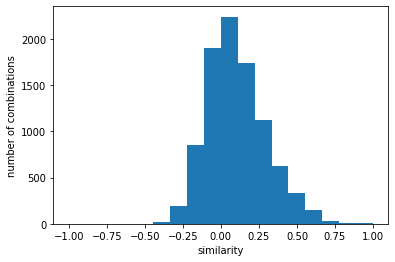

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5347120310565372}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   39.  284. 1039. 1935. 2267. 1784. 1172.
  637.  347.  163.   51.   15.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


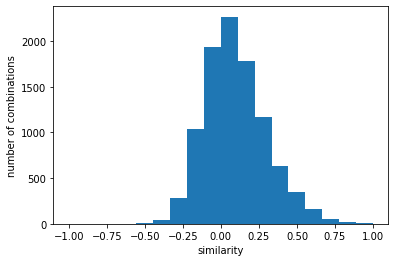

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5066830568817631}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   34.  378. 1432. 2899. 3489. 2749. 1793.
  950.  380.  167.   70.   38.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


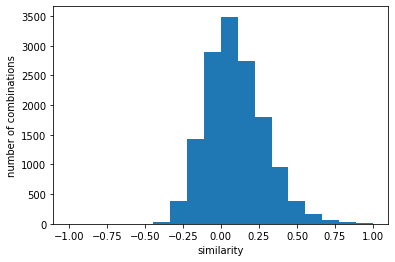

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.49809454061414665}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 7.000e+00 5.300e+01 3.050e+02
 1.231e+03 2.395e+03 2.689e+03 2.042e+03 1.291e+03 6.870e+02 3.200e+02
 2.000e+02 7.000e+01 2.000e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


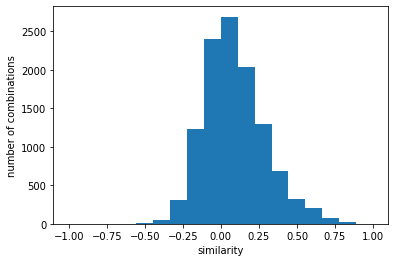

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.5604946486292673}
y [   0.    0.    0.    0.    3.   12.  156.  616. 1304. 1678. 1450.  877.
  481.  266.  141.  100.   38.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


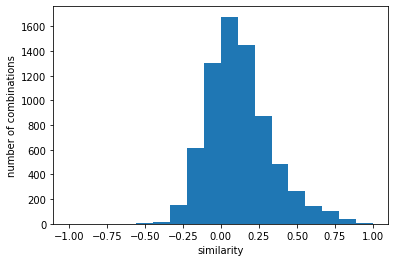

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.6295468908291834}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.700e+01 2.350e+02
 9.520e+02 1.892e+03 2.259e+03 1.709e+03 1.042e+03 5.900e+02 2.880e+02
 1.340e+02 5.500e+01 1.200e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


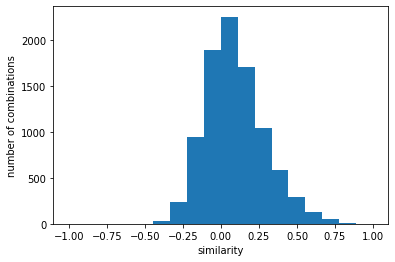

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.574242683509547}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+00 1.200e+01 1.320e+02
 6.050e+02 1.357e+03 1.775e+03 1.460e+03 8.480e+02 4.560e+02 2.440e+02
 1.370e+02 8.400e+01 2.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


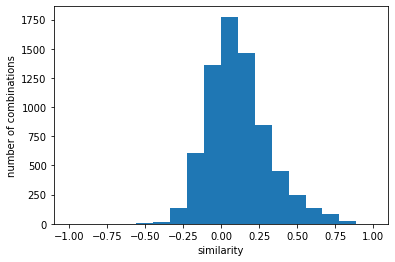

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6425206562241449}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   28.  280.  985. 2043. 2490. 1928. 1242.
  652.  343.  167.   80.   25.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


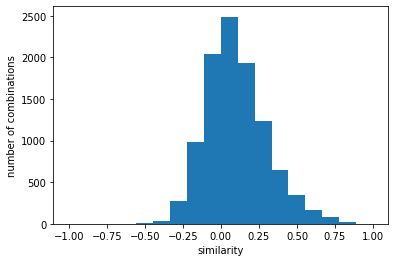

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.5314823819919688}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   44.  327. 1236. 2332. 2802. 2304. 1707.
  995.  503.  241.  120.   33.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


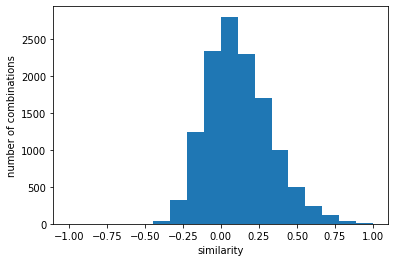

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.53005630588952}
y [   0.    0.    0.    0.    2.   10.   83.  489. 1221. 1454. 1169.  735.
  443.  249.  125.  119.   38.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


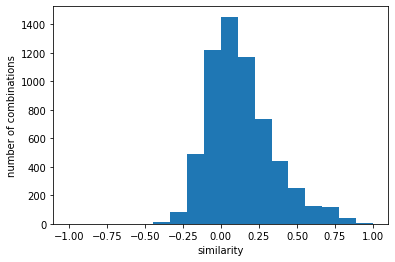

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.656872888863906}
y [   0.    0.    0.    0.    4.   10.  127.  574. 1255. 1584. 1314.  822.
  454.  257.  135.   76.   28.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


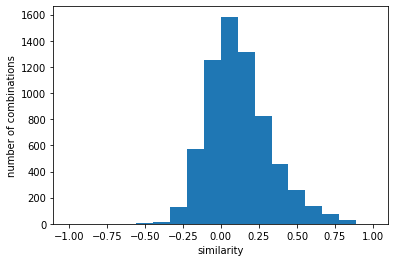

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6580787413155563}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   34.  268. 1021. 1942. 2291. 1777. 1139.
  613.  347.  167.   59.   13.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


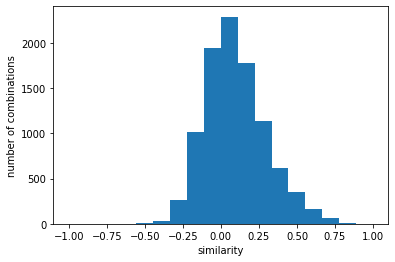

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5243615232387426}
y [   0.    0.    0.    0.    3.   14.   85.  499. 1191. 1432. 1156.  747.
  439.  227.  121.   99.   32.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


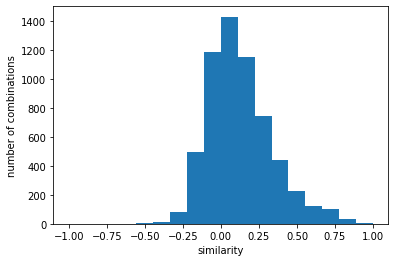

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6507844753295331}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.600e+01 1.680e+02
 8.390e+02 1.670e+03 2.095e+03 1.672e+03 1.026e+03 4.920e+02 2.960e+02
 1.110e+02 4.800e+01 1.400e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


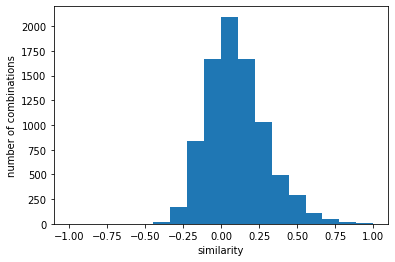

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5410226363189815}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.080e+02
 5.710e+02 1.546e+03 1.804e+03 1.349e+03 8.070e+02 4.270e+02 2.700e+02
 1.250e+02 7.500e+01 2.700e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


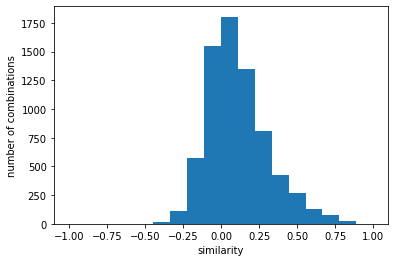

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5745643372853788}
y [   0.    0.    0.    0.    3.   16.   88.  529. 1053. 1246. 1026.  688.
  327.  202.   85.   58.   23.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


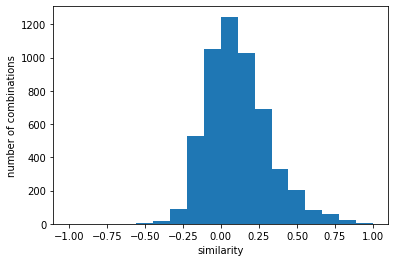

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6474078739895106}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.300e+01 4.420e+02
 1.604e+03 3.069e+03 3.401e+03 2.619e+03 1.694e+03 9.110e+02 4.760e+02
 2.380e+02 8.200e+01 3.100e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


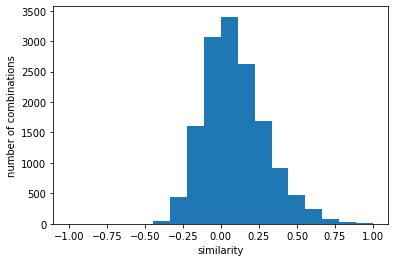

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5424463736088307}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    7.   17.  254.  915. 1880. 2402. 1972. 1245.
  724.  416.  185.  115.   28.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


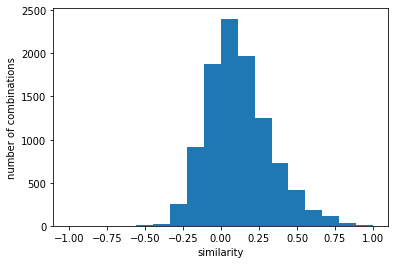

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5473738305080219}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 5.000e+00 2.100e+01 2.030e+02
 9.080e+02 1.824e+03 2.098e+03 1.639e+03 9.830e+02 5.930e+02 3.370e+02
 2.000e+02 1.040e+02 4.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


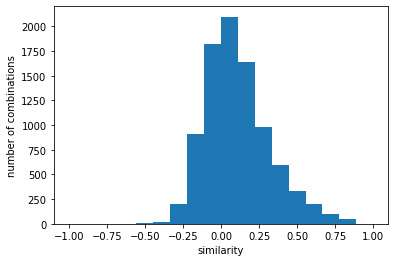

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5592000662655626}
y [0.00e+00 0.00e+00 0.00e+00 0.00e+00 1.00e+00 5.00e+00 6.20e+01 4.57e+02
 1.05e+03 1.28e+03 1.01e+03 5.57e+02 3.30e+02 1.73e+02 9.90e+01 6.70e+01
 3.80e+01 6.00e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


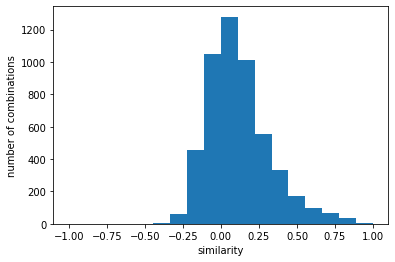

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6674035558143302}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   27.  246. 1092. 2215. 2695. 2105. 1270.
  747.  363.  190.  111.   44.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


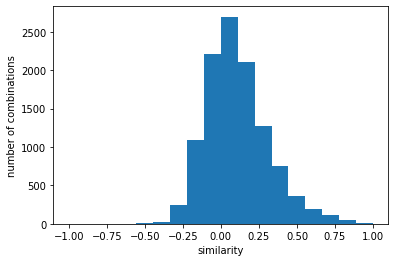

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5441909923181499}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   27.  245. 1210. 2477. 2902. 2376. 1591.
  893.  464.  277.  126.   27.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


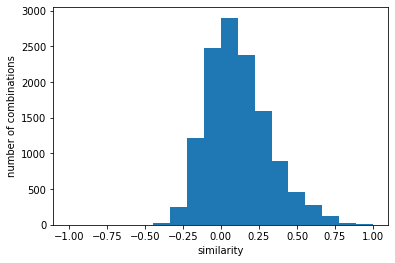

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.544591044534056}
y [   0.    0.    0.    0.    2.   10.   84.  453. 1059. 1360. 1009.  598.
  305.  203.  100.   61.   24.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


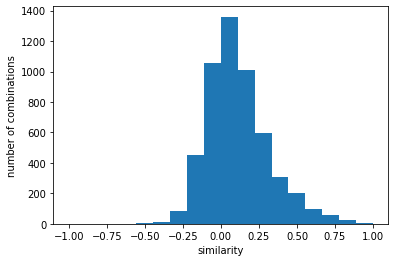

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6372553682030296}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   27.  278. 1182. 2370. 2829. 2152. 1326.
  720.  385.  219.  121.   42.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


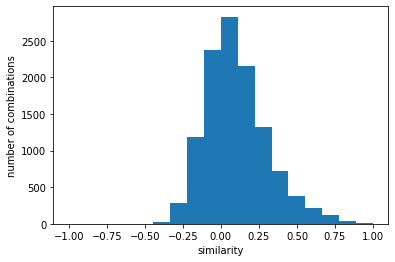

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5385182165519378}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.400e+01 2.350e+02
 1.086e+03 2.242e+03 2.558e+03 1.898e+03 1.102e+03 5.950e+02 3.260e+02
 1.640e+02 4.300e+01 1.300e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


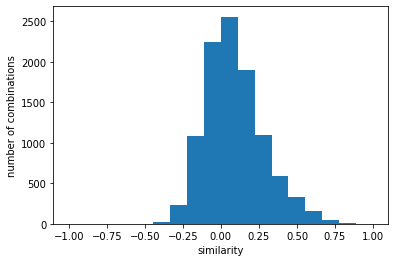

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5332335604479205}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 6.000e+00 7.600e+01
 4.230e+02 1.039e+03 1.234e+03 9.670e+02 5.180e+02 3.140e+02 1.870e+02
 8.700e+01 5.700e+01 2.400e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


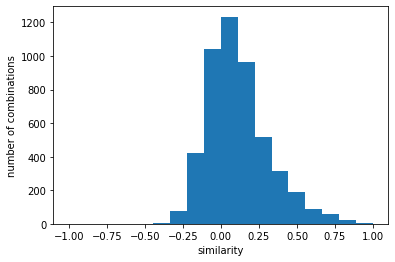

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.678284175748135}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   59.  353. 1218. 2437. 2745. 1928. 1224.
  560.  310.  106.   42.   19.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


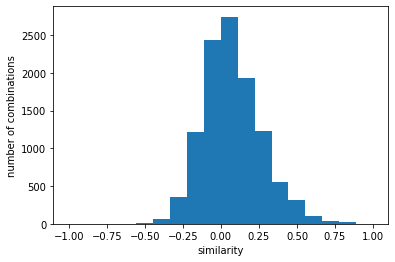

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5110642797498691}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 7.000e+00 9.300e+01
 5.000e+02 1.195e+03 1.424e+03 1.180e+03 6.620e+02 3.650e+02 1.960e+02
 1.200e+02 6.100e+01 2.200e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


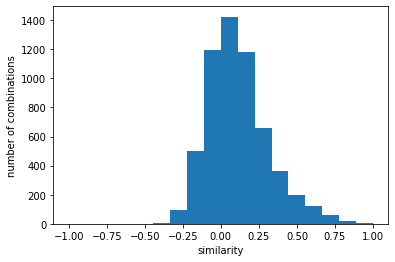

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6537611290108571}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.700e+01 2.050e+02
 1.032e+03 2.037e+03 2.309e+03 1.848e+03 1.177e+03 6.900e+02 3.760e+02
 2.100e+02 8.300e+01 2.400e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


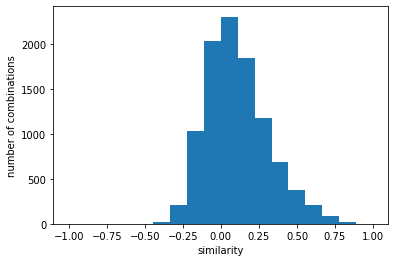

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5216974828636971}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.300e+01 2.800e+02
 1.155e+03 2.421e+03 2.841e+03 2.272e+03 1.450e+03 7.430e+02 4.760e+02
 2.000e+02 6.300e+01 1.800e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


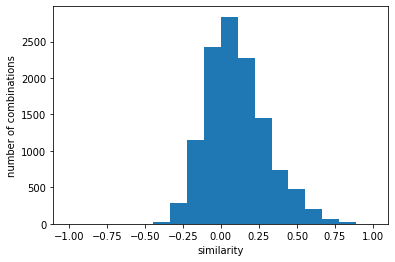

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5587497497276757}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   29.  218. 1065. 2381. 2847. 2156. 1307.
  737.  329.  152.   56.   33.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


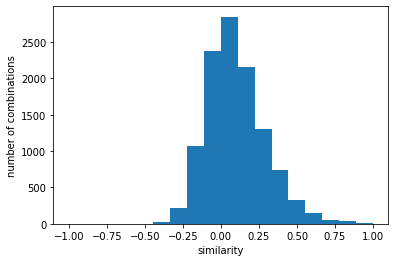

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学C(0076).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5171661617311584}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   46.  334. 1179. 2507. 2957. 2214. 1323.
  767.  307.  114.   59.   53.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


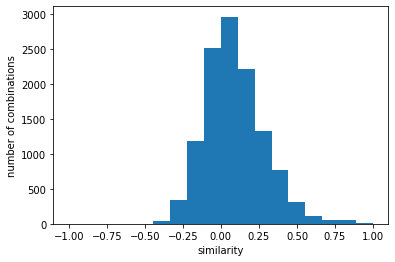

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 'similarity': 0.5048269420258823}
y [  0.   0.   0.   0.   0.   7.  28. 110. 294. 385. 304. 233. 161. 101.
  75.  69.  40.   6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


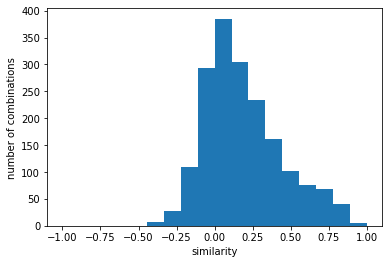

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 'similarity': 0.7967600397745959}
y [  0.   0.   0.   0.   0.   6.  26. 243. 592. 931. 765. 480. 233. 148.
 119.  79.  35.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


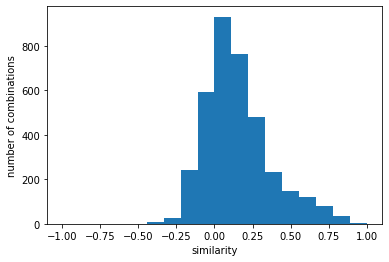

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 'similarity': 0.7400259437666671}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   38.  292. 1088. 2249. 2572. 2073. 1398.
  829.  404.  195.   98.   41.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


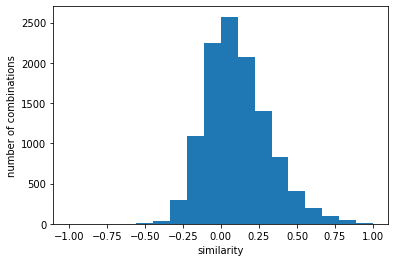

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 'similarity': 0.567369955636151}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 7.000e+00 4.500e+01 2.700e+02
 1.086e+03 2.152e+03 2.674e+03 2.053e+03 1.324e+03 6.790e+02 2.770e+02
 9.300e+01 3.700e+01 1.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


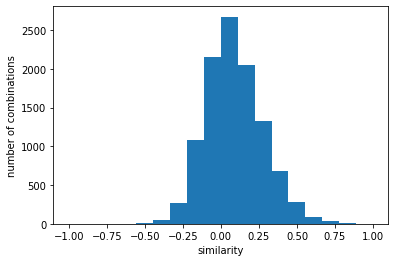

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.550460696667537}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   12.  161.  650. 1735. 2152. 1405.  705.
  315.  153.  127.   82.   77.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


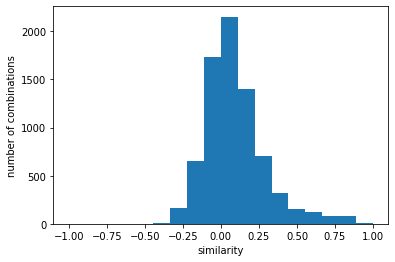

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.6503213611364149}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.900e+01 1.940e+02
 9.130e+02 1.867e+03 2.279e+03 1.969e+03 1.252e+03 7.330e+02 3.340e+02
 1.690e+02 6.700e+01 3.300e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


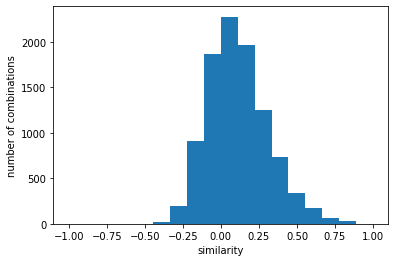

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5168462123712676}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+00 2.500e+01 2.450e+02
 9.740e+02 2.148e+03 2.572e+03 2.021e+03 1.302e+03 7.440e+02 3.510e+02
 1.500e+02 4.100e+01 2.600e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


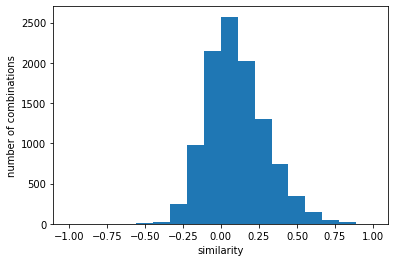

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5427570803303741}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 1.820e+02
 8.190e+02 1.928e+03 2.246e+03 1.757e+03 1.094e+03 6.200e+02 3.010e+02
 1.230e+02 3.000e+01 1.000e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


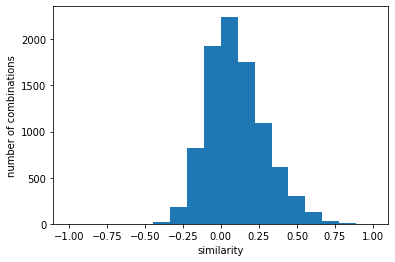

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5379957334777701}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.000e+01 2.530e+02
 9.450e+02 1.846e+03 2.229e+03 1.853e+03 1.332e+03 7.740e+02 3.530e+02
 1.640e+02 5.600e+01 1.400e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


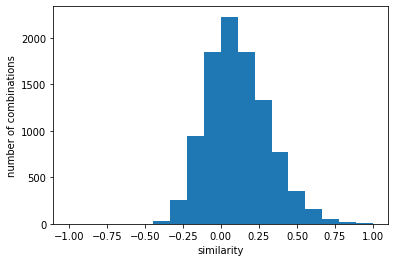

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5131430556131151}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.000e+01 3.510e+02
 1.406e+03 2.913e+03 3.627e+03 2.824e+03 1.905e+03 1.011e+03 3.790e+02
 1.560e+02 6.900e+01 5.900e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


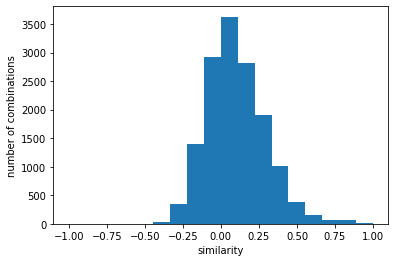

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.49112623211534834}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   38.  287. 1131. 2246. 2427. 1876. 1271.
  678.  306.  192.   75.   37.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


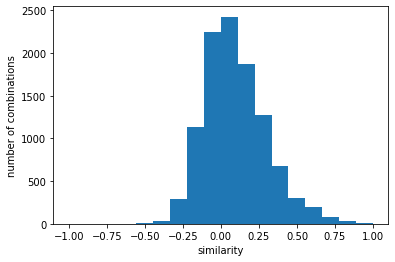

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.57527117547945}
y [   0.    0.    0.    0.    0.   13.  125.  568. 1269. 1624. 1378.  877.
  448.  252.  153.  105.   55.   13.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


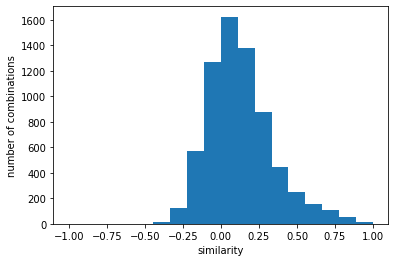

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.6360415494424344}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.800e+01 2.490e+02
 9.870e+02 1.996e+03 2.392e+03 1.853e+03 1.116e+03 6.170e+02 2.760e+02
 1.110e+02 4.600e+01 1.700e+01 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


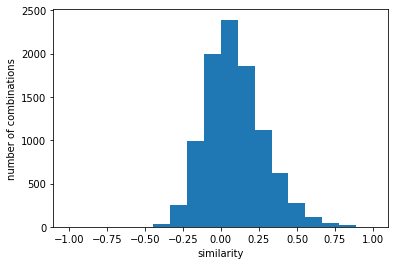

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5509844496795863}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   14.  129.  597. 1336. 1832. 1556.  945.
  542.  263.  174.  109.   60.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


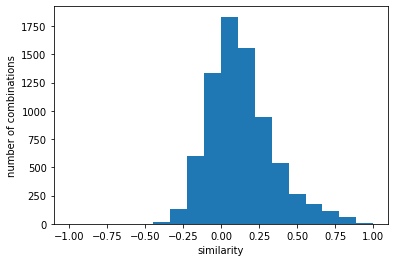

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6366341379530774}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   23.  258.  955. 1995. 2434. 1827. 1185.
  634.  336.  167.   97.   54.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


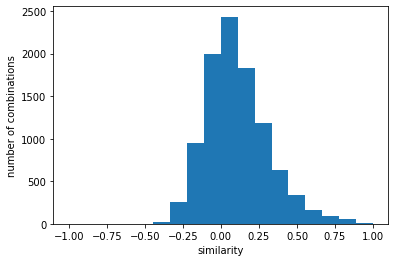

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.541851251439482}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   44.  327. 1240. 2328. 2732. 2259. 1551.
  982.  515.  203.   86.   43.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


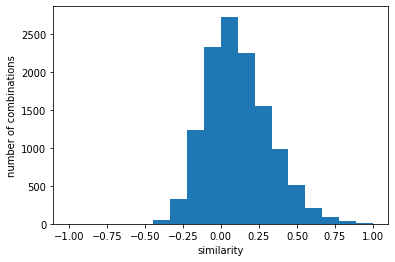

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5313091332966705}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   12.   92.  518. 1227. 1647. 1210.  727.
  389.  229.  153.  104.   60.   16.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


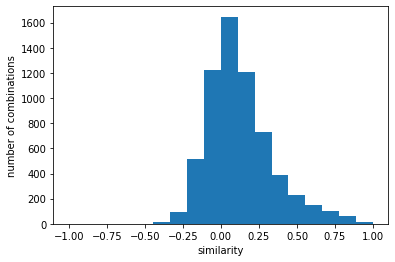

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6430398943683886}
y [   0.    0.    0.    0.    3.   17.  154.  638. 1325. 1695. 1411.  887.
  514.  265.  158.   98.   54.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


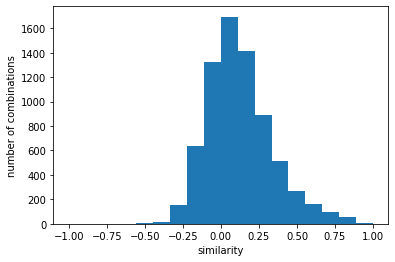

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6388892554440402}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.000e+01 2.570e+02
 9.280e+02 1.949e+03 2.375e+03 1.866e+03 1.252e+03 7.240e+02 3.450e+02
 1.690e+02 6.600e+01 2.300e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


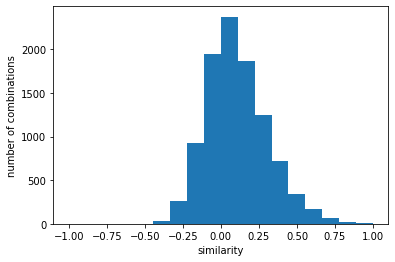

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5200708178001329}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 6.600e+01
 4.420e+02 1.087e+03 1.592e+03 1.200e+03 7.760e+02 4.340e+02 2.340e+02
 1.170e+02 9.600e+01 6.100e+01 1.300e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


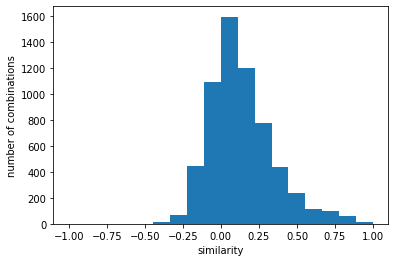

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6457353518963838}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.300e+01 1.560e+02
 7.600e+02 1.457e+03 1.800e+03 1.428e+03 8.710e+02 4.330e+02 2.410e+02
 8.700e+01 3.500e+01 1.800e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


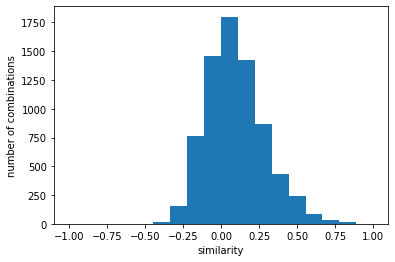

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5632049552030198}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 1.140e+02
 5.370e+02 1.514e+03 1.874e+03 1.327e+03 7.400e+02 3.610e+02 2.660e+02
 1.370e+02 9.700e+01 6.400e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


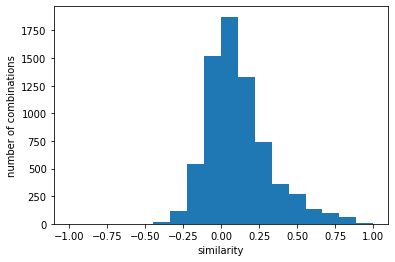

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5811305858267196}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 9.300e+01
 5.360e+02 1.188e+03 1.487e+03 1.192e+03 7.380e+02 4.130e+02 2.390e+02
 1.250e+02 9.200e+01 6.000e+01 1.300e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


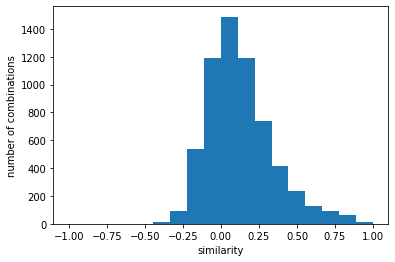

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6293569469820826}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.800e+01 4.260e+02
 1.582e+03 3.215e+03 3.618e+03 2.763e+03 1.747e+03 9.610e+02 4.740e+02
 2.430e+02 9.700e+01 4.500e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


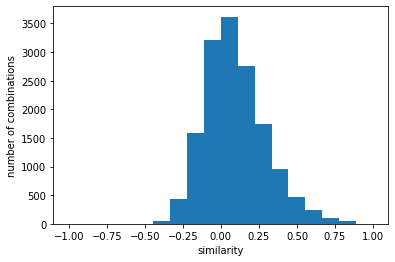

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5356705864632123}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   18.  273.  919. 1867. 2325. 1802. 1157.
  726.  368.  188.  143.   73.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


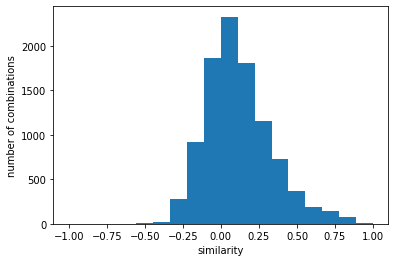

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5513728848534858}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   20.  221.  860. 1828. 2176. 1627.  920.
  569.  316.  170.   98.   58.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


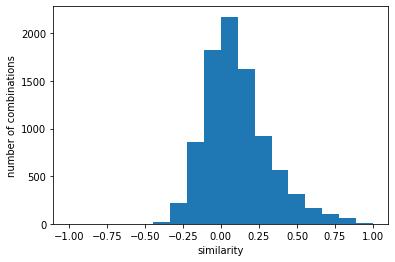

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5575879773986181}
y [   0.    0.    0.    0.    0.    8.   77.  476. 1070. 1258. 1002.  567.
  324.  194.  105.   70.   54.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


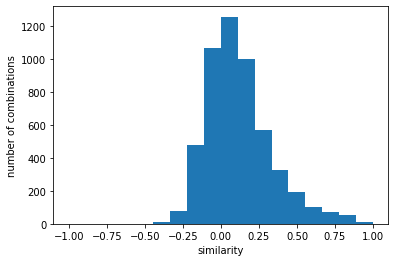

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6594356198254196}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   29.  237. 1058. 2282. 2742. 2176. 1337.
  762.  356.  246.  137.   68.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


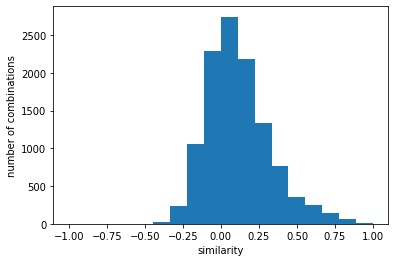

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.528807009458708}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+00 3.100e+01 2.420e+02
 1.092e+03 2.292e+03 2.594e+03 1.945e+03 1.282e+03 7.660e+02 4.070e+02
 2.020e+02 9.300e+01 3.900e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


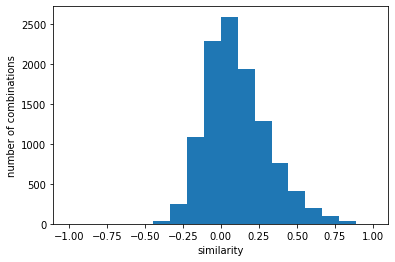

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5685946203890706}
y [   0.    0.    0.    0.    0.    8.   64.  433.  944. 1356. 1058.  597.
  316.  224.   99.   67.   37.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


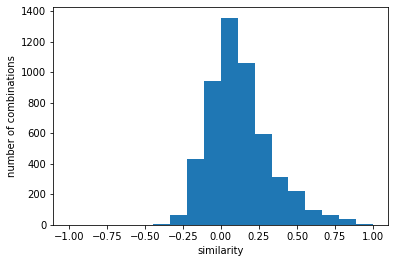

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6419143231362406}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   29.  254. 1093. 2381. 2809. 2179. 1338.
  718.  328.  237.  121.   59.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


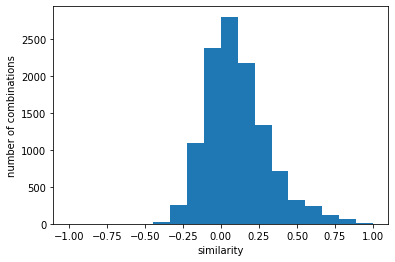

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5343118169720181}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.400e+01 2.030e+02
 1.016e+03 2.090e+03 2.559e+03 1.865e+03 1.084e+03 5.920e+02 3.190e+02
 1.640e+02 5.000e+01 2.300e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


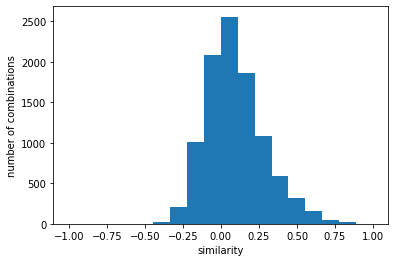

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.544162778064089}
y [   0.    0.    0.    0.    0.    5.   71.  458. 1103. 1350. 1069.  618.
  356.  235.  152.  121.   57.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


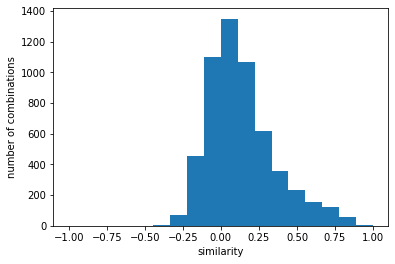

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6611933115836977}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 5.700e+01 3.450e+02
 1.255e+03 2.531e+03 2.996e+03 2.088e+03 1.295e+03 6.680e+02 3.110e+02
 1.110e+02 4.600e+01 4.600e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


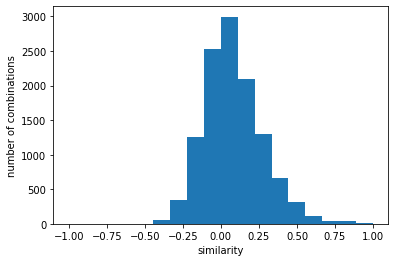

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5017556636634584}
y [   0.    0.    0.    0.    0.    6.   91.  522. 1202. 1436. 1158.  696.
  411.  268.  133.   94.   45.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


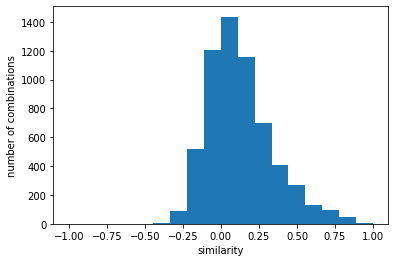

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6509231979551299}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.500e+01 1.740e+02
 9.330e+02 1.915e+03 2.193e+03 1.648e+03 1.032e+03 5.880e+02 3.450e+02
 1.750e+02 8.600e+01 2.900e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


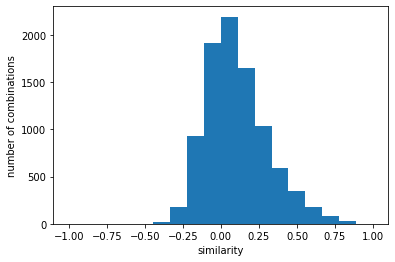

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5410244872952846}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.500e+01 2.340e+02
 1.049e+03 2.126e+03 2.510e+03 1.955e+03 1.217e+03 7.090e+02 4.520e+02
 1.910e+02 6.200e+01 2.900e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


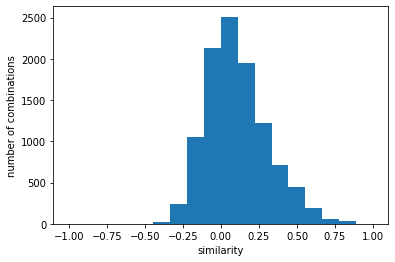

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5839965775405344}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   28.  193. 1044. 2273. 2788. 2152. 1325.
  760.  343.  180.   79.   45.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


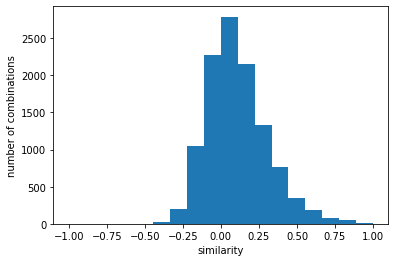

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学A(0074).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5203500864821172}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   45.  309. 1176. 2431. 2801. 2142. 1271.
  709.  306.  112.   69.   52.   13.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


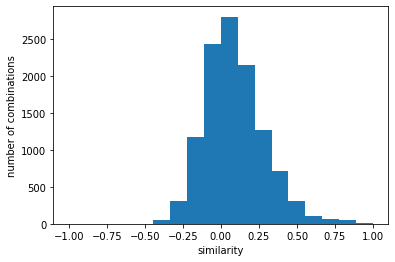

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 'similarity': 0.5011540509918263}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.600e+01 3.280e+02
 1.116e+03 2.227e+03 2.604e+03 2.125e+03 1.288e+03 7.000e+02 2.880e+02
 1.220e+02 5.100e+01 2.400e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


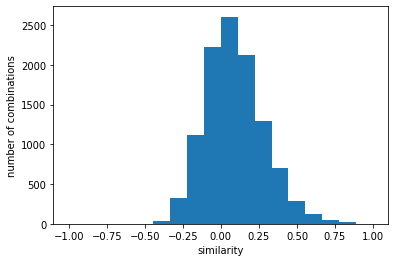

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 'similarity': 0.5459458467588413}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.600e+01 3.340e+02
 1.162e+03 2.377e+03 2.719e+03 2.280e+03 1.519e+03 8.300e+02 3.980e+02
 1.590e+02 4.300e+01 8.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


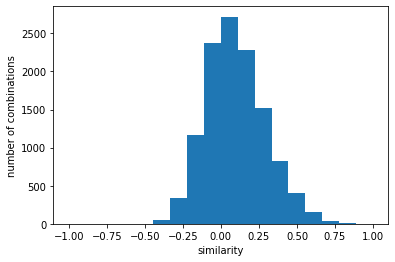

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 'similarity': 0.5636612421221165}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.500e+01 2.470e+02
 9.340e+02 2.129e+03 2.554e+03 2.010e+03 1.302e+03 6.440e+02 2.780e+02
 1.110e+02 2.000e+01 1.000e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


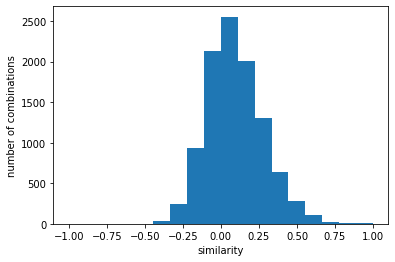

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.5587321137752091}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.500e+01 4.640e+02
 1.454e+03 2.902e+03 3.227e+03 2.251e+03 1.237e+03 7.020e+02 2.780e+02
 1.190e+02 4.700e+01 2.000e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


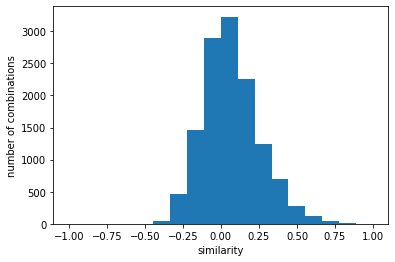

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.5354029287011018}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 5.000e+00 2.400e+01 2.510e+02
 8.480e+02 1.906e+03 2.174e+03 1.885e+03 1.250e+03 6.840e+02 3.210e+02
 1.160e+02 2.500e+01 1.300e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


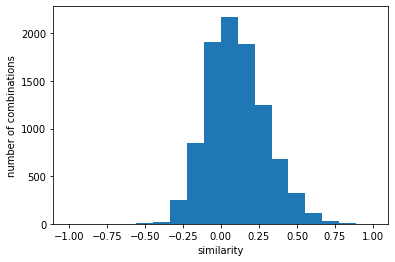

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5166621568298416}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.700e+01 2.220e+02
 8.470e+02 1.786e+03 2.244e+03 1.901e+03 1.235e+03 6.900e+02 3.200e+02
 9.900e+01 2.800e+01 4.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


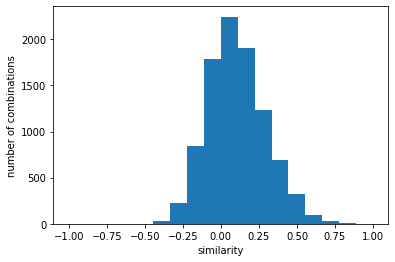

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5660072705962921}
y [   0.    0.    0.    0.    0.   17.  140.  620. 1271. 1585. 1357.  953.
  553.  255.   82.   15.    5.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


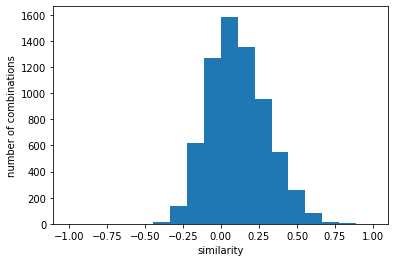

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.6147279962312611}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 2.270e+02
 9.410e+02 2.027e+03 2.422e+03 1.986e+03 1.267e+03 6.860e+02 3.550e+02
 1.150e+02 3.900e+01 2.200e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


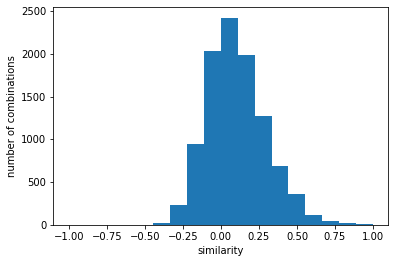

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5119247688862889}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.600e+01 1.810e+02
 6.200e+02 1.266e+03 1.728e+03 1.575e+03 1.073e+03 6.030e+02 2.420e+02
 9.300e+01 3.000e+01 2.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


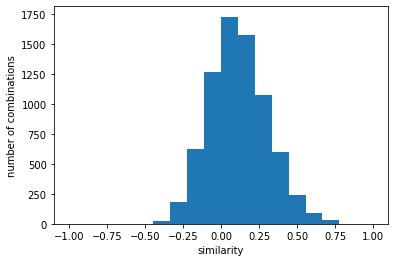

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.6393705144297107}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   38.  321. 1153. 2469. 2740. 2212. 1425.
  813.  400.  161.   51.   10.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


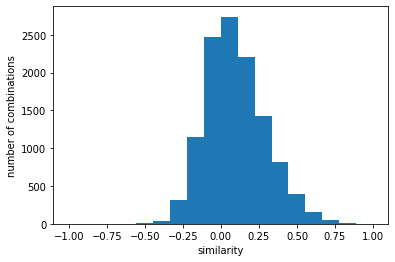

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.5488197686447674}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   30.  279. 1032. 2145. 2512. 1925. 1262.
  801.  375.  156.   67.   17.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


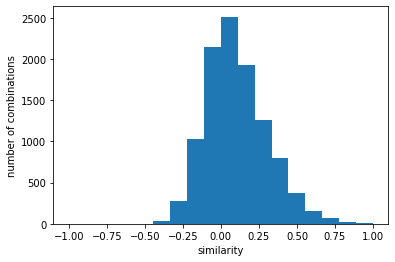

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.5373644772855801}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.900e+01 1.880e+02
 6.620e+02 1.336e+03 1.649e+03 1.336e+03 8.510e+02 4.460e+02 1.970e+02
 8.200e+01 2.700e+01 1.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


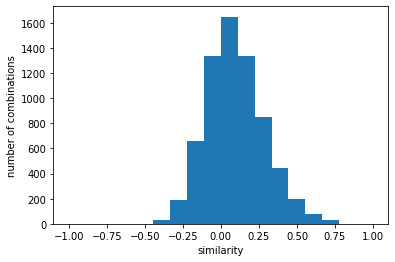

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.6275956063937372}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   35.  312. 1147. 2205. 2532. 1978. 1284.
  723.  347.  149.   62.   18.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


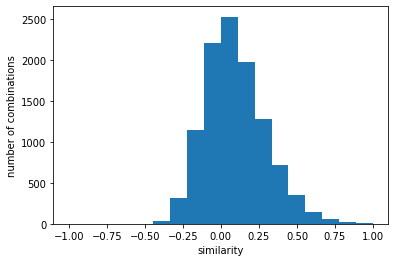

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.5462805771112152}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+00 3.400e+01 2.690e+02
 9.200e+02 1.923e+03 2.360e+03 2.017e+03 1.314e+03 6.930e+02 2.850e+02
 1.190e+02 4.600e+01 1.000e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


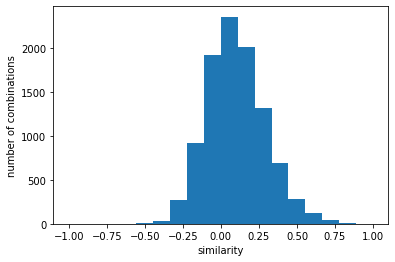

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.5521801610683217}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.000e+01 3.260e+02
 1.126e+03 2.222e+03 2.655e+03 2.147e+03 1.450e+03 8.360e+02 3.850e+02
 1.570e+02 5.700e+01 1.200e+01 1.000e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


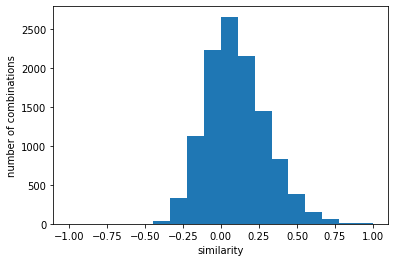

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.540278880888341}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   33.  266.  917. 1912. 2221. 1731. 1058.
  607.  275.  119.   58.   14.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


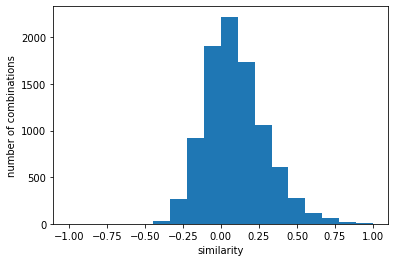

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.5586712366671784}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   35.  298. 1042. 2071. 2429. 1947. 1265.
  732.  345.  152.   52.   18.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


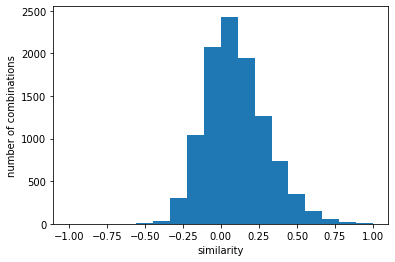

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.5532665536780189}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 2.060e+02
 7.780e+02 1.719e+03 2.098e+03 1.819e+03 1.145e+03 6.270e+02 3.260e+02
 1.080e+02 2.600e+01 1.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


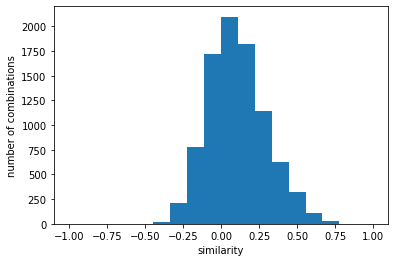

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5411948132344401}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.500e+01 2.220e+02
 8.060e+02 1.714e+03 2.056e+03 1.651e+03 1.039e+03 5.920e+02 2.560e+02
 1.060e+02 5.300e+01 1.500e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


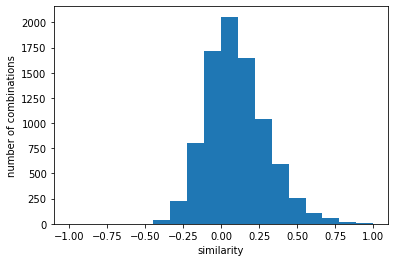

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5689007942376314}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+01 1.760e+02
 7.540e+02 1.652e+03 1.937e+03 1.516e+03 9.840e+02 5.100e+02 2.350e+02
 9.000e+01 2.000e+01 5.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


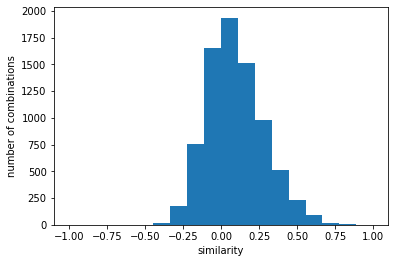

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5474252842466643}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.700e+01 2.910e+02
 1.044e+03 2.162e+03 2.303e+03 1.629e+03 9.640e+02 5.870e+02 2.960e+02
 1.280e+02 4.900e+01 1.800e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


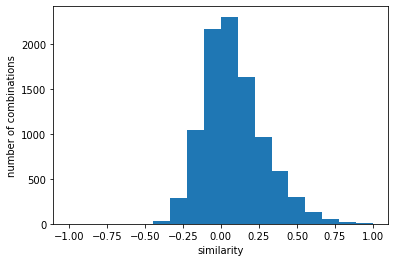

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5159178353838196}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 2.270e+02
 8.730e+02 1.719e+03 2.006e+03 1.655e+03 1.078e+03 5.810e+02 2.950e+02
 1.140e+02 4.300e+01 1.400e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


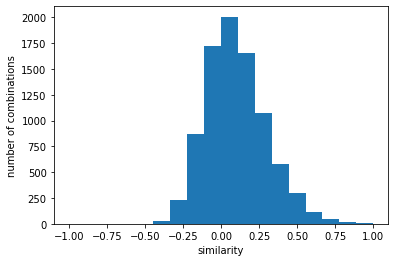

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.5708736154146209}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.800e+01 3.840e+02
 1.434e+03 2.864e+03 3.429e+03 2.715e+03 1.821e+03 9.320e+02 4.660e+02
 2.000e+02 4.200e+01 2.500e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


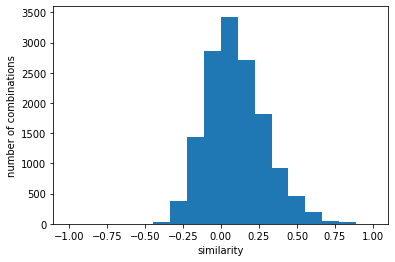

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5620176435447073}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.800e+01 2.710e+02
 8.990e+02 1.913e+03 2.346e+03 1.992e+03 1.389e+03 7.290e+02 3.070e+02
 1.570e+02 4.700e+01 1.100e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


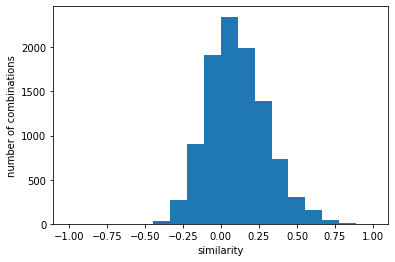

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5397761982875016}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+01 2.300e+02
 9.420e+02 1.819e+03 2.122e+03 1.653e+03 1.078e+03 6.100e+02 2.730e+02
 1.070e+02 3.300e+01 1.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


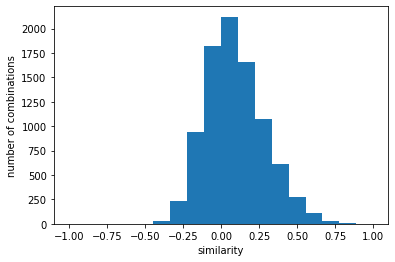

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5498620572027824}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   32.  307. 1087. 2109. 2445. 1859. 1167.
  681.  351.  163.   64.   18.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


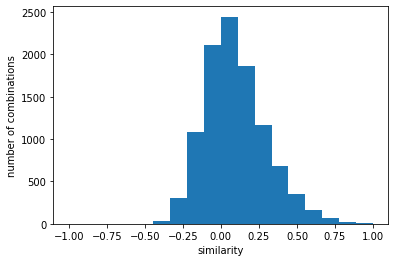

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.5249631287708194}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 2.060e+02
 7.550e+02 1.630e+03 2.079e+03 1.758e+03 1.117e+03 6.200e+02 2.920e+02
 1.160e+02 3.500e+01 9.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


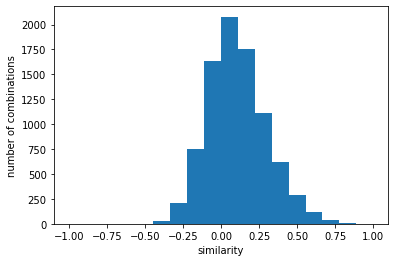

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5812766181966317}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.600e+01 2.640e+02
 1.007e+03 2.303e+03 2.824e+03 2.298e+03 1.550e+03 8.460e+02 4.200e+02
 1.770e+02 5.200e+01 1.500e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


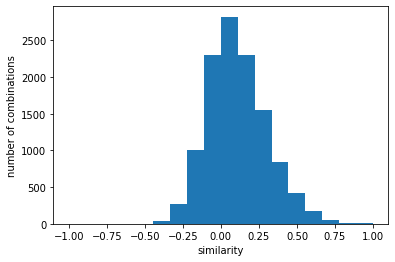

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5516182119733041}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.900e+01 2.430e+02
 9.000e+02 1.890e+03 2.200e+03 1.772e+03 1.078e+03 5.770e+02 2.840e+02
 1.180e+02 4.200e+01 1.300e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


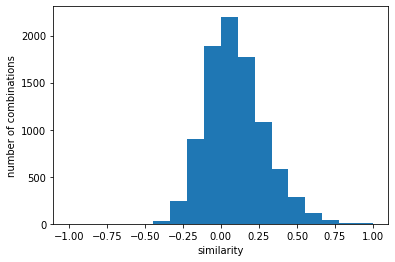

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.5289791401159074}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 2.220e+02
 8.070e+02 1.601e+03 1.891e+03 1.555e+03 9.610e+02 5.670e+02 2.360e+02
 9.300e+01 3.100e+01 9.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


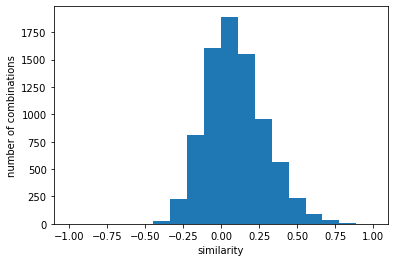

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6026762369378482}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.900e+01 2.330e+02
 9.460e+02 1.929e+03 2.421e+03 2.029e+03 1.268e+03 7.060e+02 2.940e+02
 1.180e+02 2.800e+01 6.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


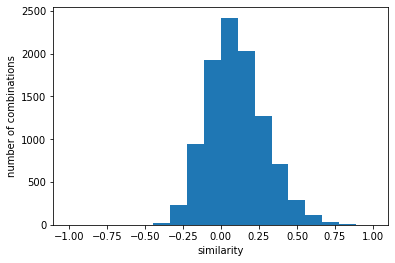

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5593735030541755}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   36.  326. 1090. 2116. 2450. 1872. 1219.
  678.  364.  169.   56.   17.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


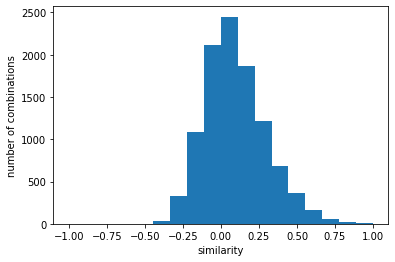

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5294970785305526}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.200e+01 2.910e+02
 1.011e+03 2.040e+03 2.343e+03 1.995e+03 1.226e+03 6.540e+02 3.530e+02
 1.130e+02 2.700e+01 8.000e+00 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


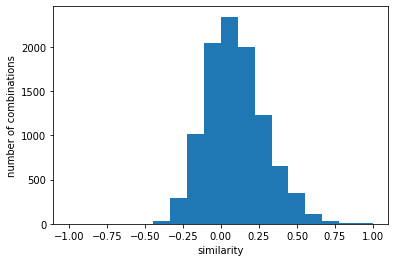

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5533552228884937}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   36.  342. 1147. 2258. 2606. 1993. 1276.
  741.  379.  162.   58.   19.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


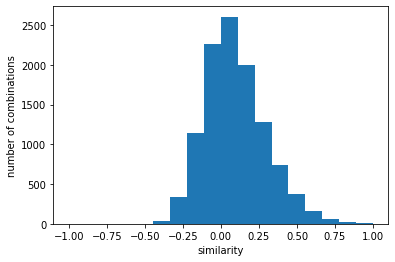

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5210386070790858}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 2.290e+02
 8.530e+02 1.802e+03 2.215e+03 1.949e+03 1.344e+03 7.430e+02 3.860e+02
 1.610e+02 4.400e+01 1.300e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


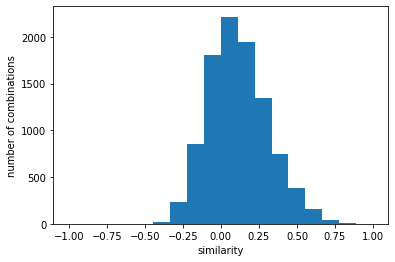

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5462432540999528}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   26.  254.  994. 2122. 2613. 2214. 1492.
  824.  377.  164.   42.    6.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


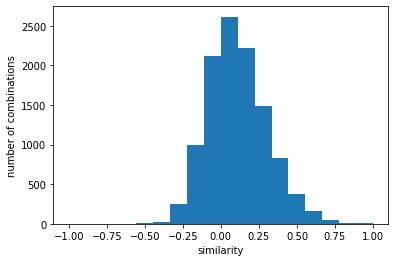

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5708632690474974}
y [   0.    0.    0.    0.    0.   24.  147.  522. 1040. 1424. 1214.  773.
  481.  184.   91.   22.    6.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


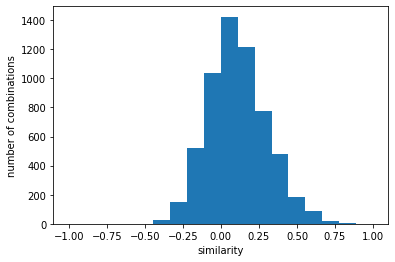

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1力学Ⅰ(0231).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6545521169529037}
y [  0.   0.   0.   0.   0.   2.  42. 240. 562. 800. 623. 388. 212. 132.
  74.  48.  27.  12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


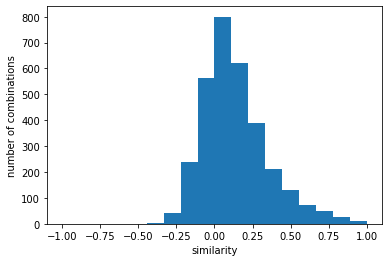

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 'similarity': 0.7646441995206522}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   42.  271. 1021. 2073. 2302. 1787. 1240.
  720.  365.  184.   68.   38.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


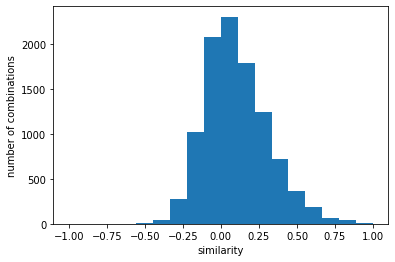

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 'similarity': 0.5850534618234896}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    8.   42.  271. 1130. 2270. 2571. 1901. 1210.
  612.  272.   96.   37.   21.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


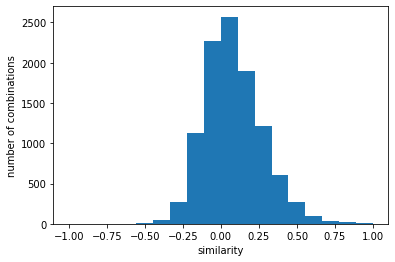

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.5500884230224545}
y [   0.    0.    0.    0.    0.   13.  142.  538. 1507. 1878. 1035.  536.
  245.  108.  119.   70.   63.   16.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


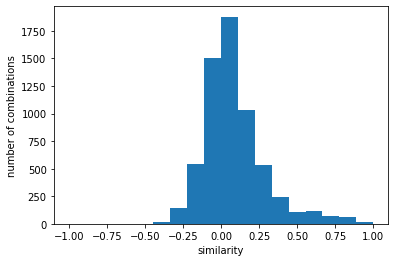

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.6873535125420409}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  213.  935. 1798. 2097. 1853. 1177.
  656.  336.  151.   62.   43.   14.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


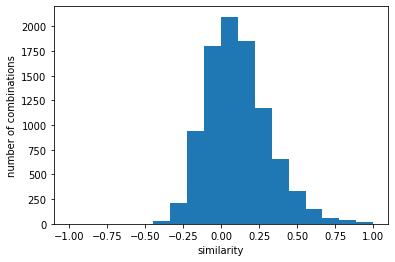

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.523868319741946}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   20.  229.  969. 2080. 2413. 1973. 1233.
  672.  352.  143.   50.   35.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


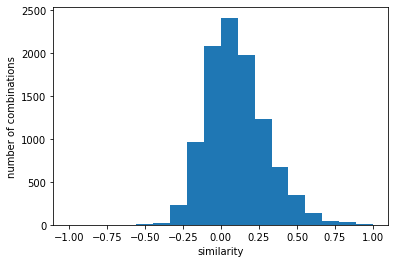

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5489165126940121}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.900e+01 1.680e+02
 7.970e+02 1.861e+03 2.136e+03 1.645e+03 9.710e+02 5.650e+02 2.990e+02
 1.120e+02 3.400e+01 2.000e+01 1.200e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


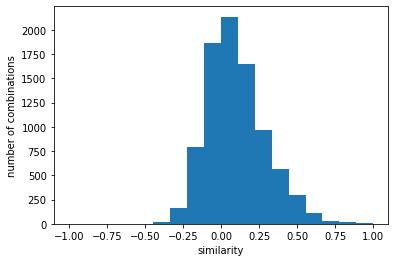

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5477863785779752}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.000e+01 2.560e+02
 9.240e+02 1.765e+03 2.102e+03 1.691e+03 1.152e+03 6.590e+02 3.490e+02
 1.670e+02 5.200e+01 1.500e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


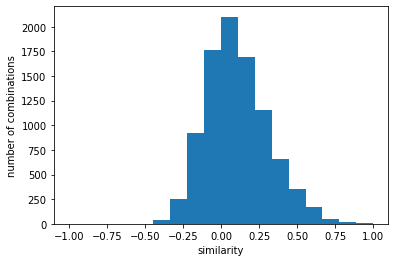

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.523370544663123}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+00 3.900e+01 3.650e+02
 1.374e+03 2.740e+03 3.374e+03 2.646e+03 1.744e+03 9.570e+02 3.990e+02
 1.640e+02 7.700e+01 5.700e+01 1.300e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


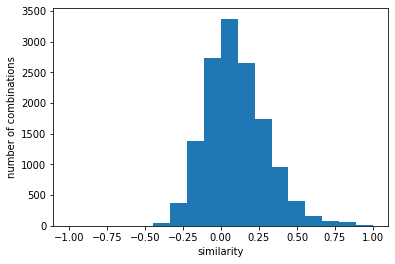

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.49869856898417986}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   39.  247. 1037. 2005. 2166. 1650. 1095.
  597.  281.  202.   89.   43.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


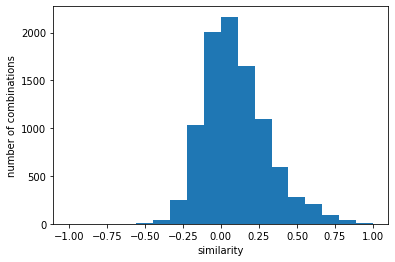

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.5967621298144029}
y [   0.    0.    0.    0.    0.    9.  141.  528. 1197. 1545. 1254.  793.
  434.  243.  123.   64.   47.   13.]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


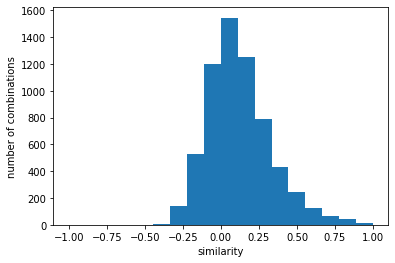

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.6476056378708535}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   28.  225.  969. 2018. 2307. 1788. 1073.
  564.  319.  116.   55.   24.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


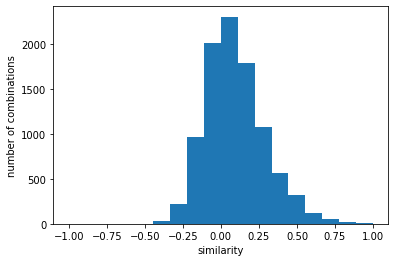

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5596218759278171}
y [   0.    0.    0.    0.    2.   10.  118.  526. 1201. 1629. 1316.  820.
  405.  227.  133.   61.   53.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


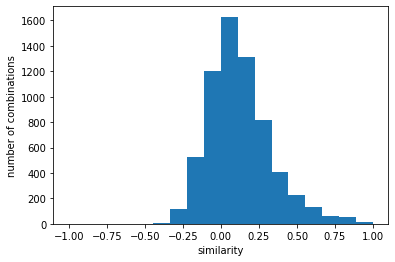

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6599145914204029}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   23.  233.  842. 1692. 2054. 1634. 1014.
  569.  316.  148.   82.   34.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


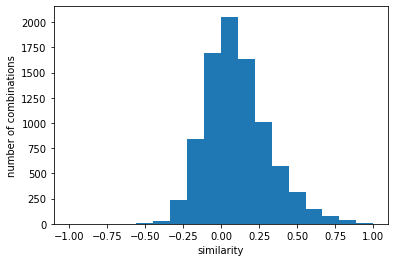

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.5688720797469099}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   34.  272. 1102. 2120. 2472. 2093. 1449.
  877.  439.  181.   89.   39.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


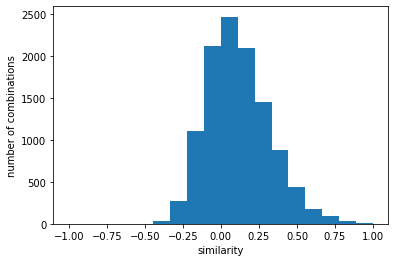

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5497964690053485}
y [   0.    0.    0.    0.    0.    7.   62.  438. 1019. 1343. 1006.  624.
  359.  217.  121.   83.   44.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


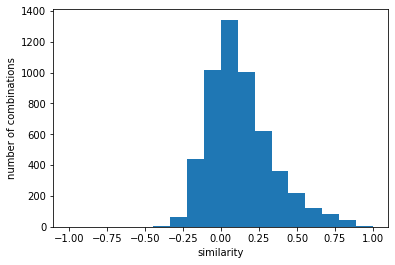

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6801601828587692}
y [   0.    0.    0.    0.    3.    8.  109.  477. 1044. 1359. 1055.  649.
  336.  209.  103.   41.   35.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


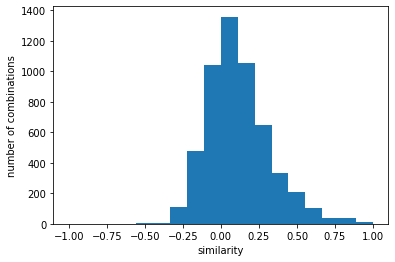

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6890202439625552}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.700e+01 2.440e+02
 9.360e+02 1.890e+03 2.259e+03 1.729e+03 1.107e+03 6.370e+02 3.570e+02
 1.700e+02 7.400e+01 3.300e+01 1.200e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


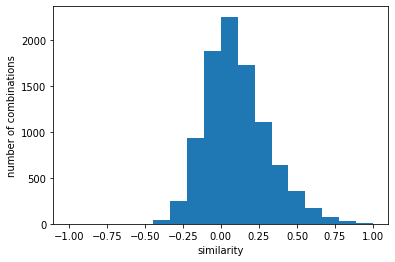

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5282109273346322}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 7.500e+01
 4.400e+02 1.049e+03 1.415e+03 1.078e+03 7.110e+02 4.360e+02 2.340e+02
 1.260e+02 8.000e+01 4.000e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


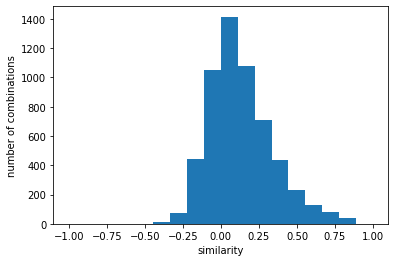

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.664197835909762}
y [   0.    0.    0.    0.    0.   12.  144.  714. 1408. 1723. 1379.  793.
  389.  224.   68.   27.   21.   14.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


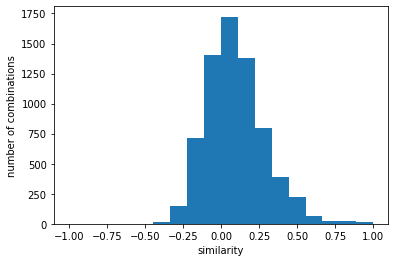

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5736594799799946}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   14.   98.  484. 1385. 1651. 1158.  672.
  338.  267.  129.   53.   79.   23.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


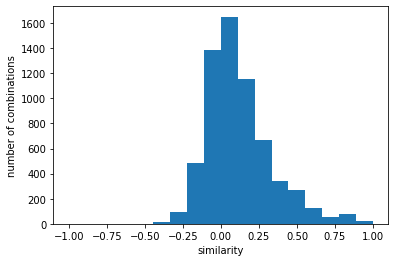

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6026592251444343}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+01 8.800e+01
 4.650e+02 9.880e+02 1.198e+03 9.790e+02 6.220e+02 2.960e+02 1.900e+02
 1.000e+02 6.700e+01 3.400e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


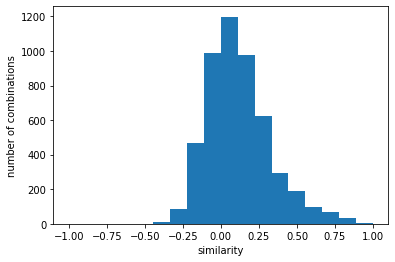

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6659543409463053}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 5.000e+01 4.340e+02
 1.574e+03 3.185e+03 3.574e+03 2.788e+03 1.870e+03 1.028e+03 5.460e+02
 2.480e+02 9.900e+01 4.400e+01 1.100e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


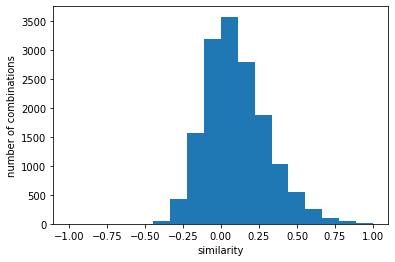

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.526746194702047}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   13.  205.  791. 1591. 2027. 1642. 1103.
  682.  370.  167.  107.   36.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


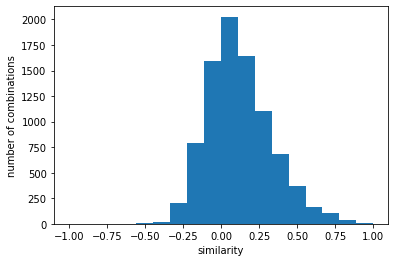

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5759054789068805}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   20.  197.  858. 1737. 1998. 1495.  871.
  538.  325.  166.   92.   59.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


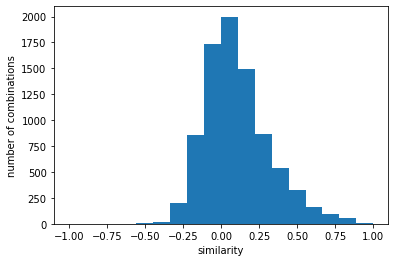

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5689234437963729}
y [   0.    0.    0.    0.    0.    4.   64.  431. 1015. 1215.  922.  561.
  323.  196.  113.   65.   45.   16.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


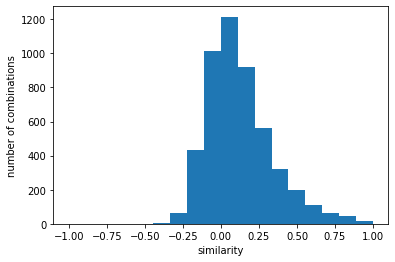

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6780346082573371}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    7.   34.  245. 1032. 2249. 2682. 2022. 1249.
  713.  400.  203.   98.   66.   16.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


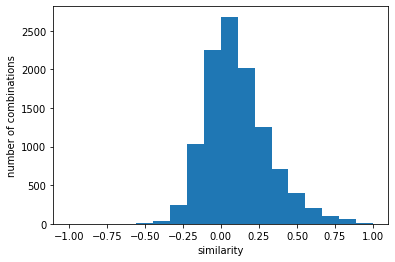

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5364401681600952}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   27.  215. 1037. 2133. 2584. 2020. 1371.
  764.  390.  195.   90.   43.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


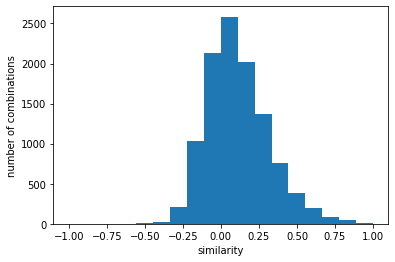

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5697505349104531}
y [   0.    0.    0.    0.    0.    7.   78.  468. 1093. 1415. 1036.  600.
  316.  220.  101.   65.   40.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


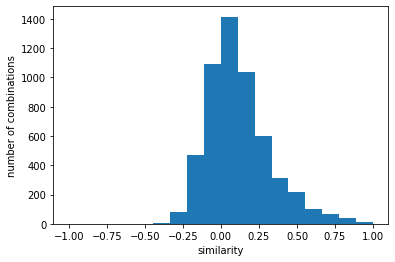

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6370543589491953}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   30.  247.  989. 2226. 2634. 2024. 1198.
  655.  340.  171.   87.   58.   17.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


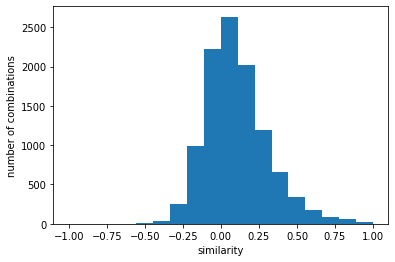

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5518322406937496}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   22.  181.  967. 2083. 2350. 1699.  987.
  543.  313.  161.   48.   33.   13.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


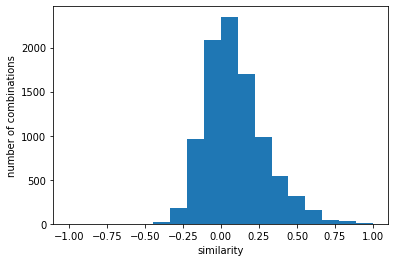

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.554480256043591}
y [   0.    0.    0.    0.    0.    6.   86.  461. 1098. 1300.  990.  628.
  355.  237.  145.   97.   56.   16.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


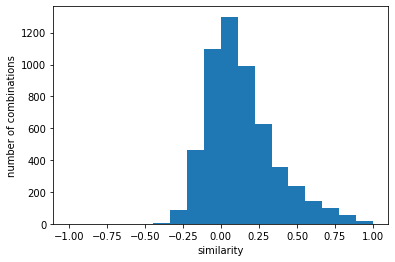

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6727194663658966}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 6.200e+01 2.980e+02
 1.102e+03 2.244e+03 2.612e+03 1.860e+03 1.200e+03 5.920e+02 3.100e+02
 1.120e+02 5.500e+01 3.900e+01 1.300e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


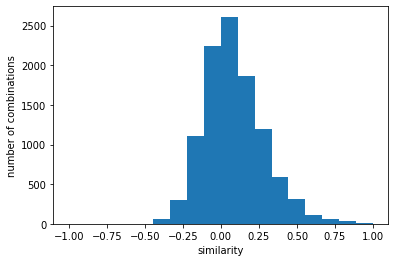

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.525559460013761}
y [   0.    0.    0.    0.    0.    6.   94.  439. 1106. 1324. 1057.  635.
  358.  227.  109.   60.   43.   14.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


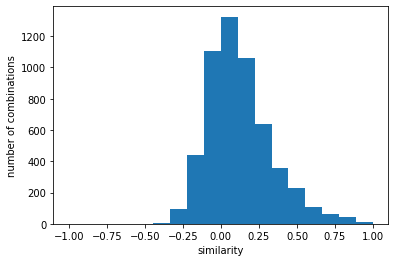

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6686780962259058}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   15.  176.  903. 1880. 2126. 1657. 1000.
  619.  341.  168.   80.   39.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


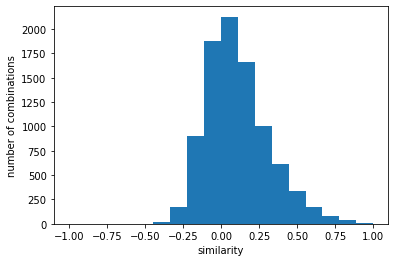

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5436459125925618}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   22.  214. 1023. 2142. 2492. 1930. 1205.
  723.  413.  181.   51.   32.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


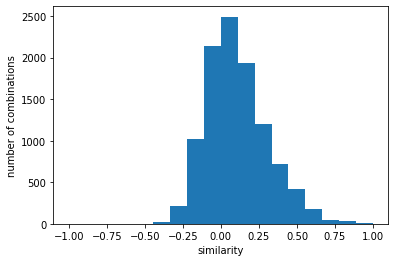

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5829481795274792}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.300e+01 2.070e+02
 1.022e+03 2.361e+03 2.734e+03 2.074e+03 1.233e+03 6.880e+02 3.540e+02
 1.730e+02 7.300e+01 5.800e+01 2.000e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


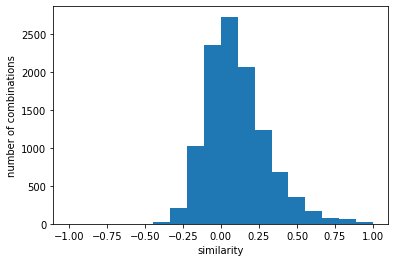

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学D(0077).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5243060052885655}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.300e+01 2.270e+02
 8.370e+02 1.617e+03 1.784e+03 1.496e+03 1.079e+03 6.160e+02 3.090e+02
 1.470e+02 5.300e+01 1.500e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


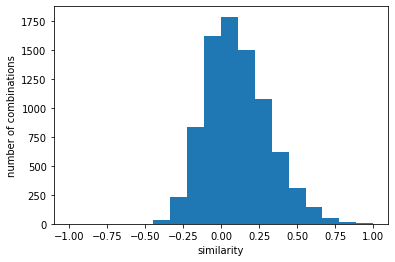

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 'similarity': 0.6395582226611803}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   37.  276.  997. 1924. 2218. 1712. 1120.
  561.  248.   82.   22.    7.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


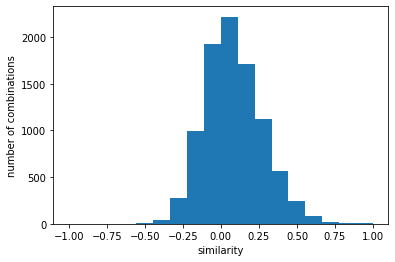

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.574221322738665}
y [   0.    0.    0.    0.    0.   12.  128.  453. 1182. 1212.  790.  446.
  269.  111.   51.   24.    2.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


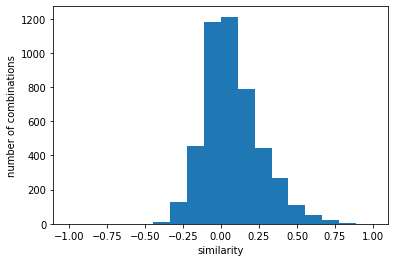

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.7468496571096476}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.800e+01 1.700e+02
 8.010e+02 1.480e+03 1.784e+03 1.614e+03 1.069e+03 6.080e+02 2.760e+02
 1.380e+02 5.800e+01 1.700e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


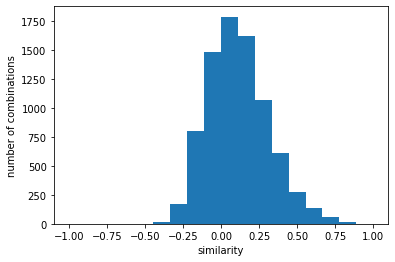

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5498413797779234}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   20.  202.  826. 1616. 1994. 1627. 1046.
  564.  289.  126.   43.   13.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


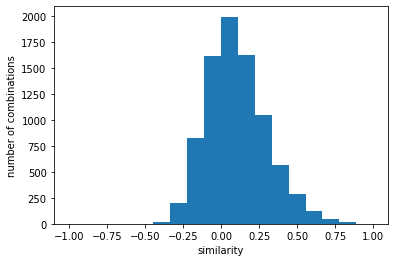

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5896660939471211}
y [   0.    0.    0.    0.    0.   16.  136.  617. 1401. 1630. 1421.  932.
  519.  271.   99.   24.    2.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


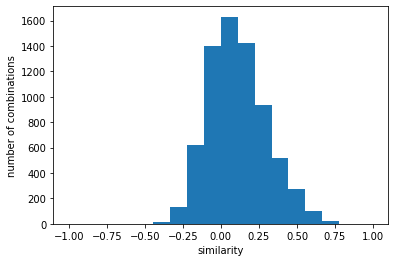

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5988491287962089}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.800e+01 2.180e+02
 8.430e+02 1.655e+03 2.019e+03 1.649e+03 1.074e+03 6.110e+02 3.120e+02
 1.320e+02 4.900e+01 1.200e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


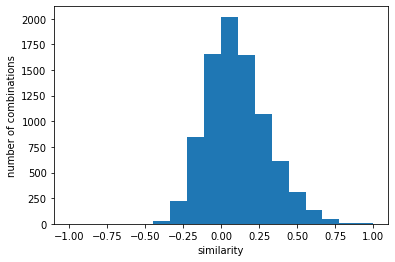

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.541772623539147}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.300e+01 2.990e+02
 1.219e+03 2.433e+03 2.918e+03 2.372e+03 1.675e+03 9.310e+02 3.850e+02
 1.660e+02 6.400e+01 2.800e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


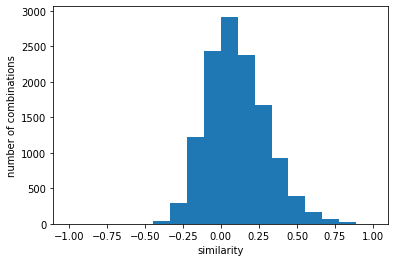

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.5269904769232193}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.400e+01 2.610e+02
 1.023e+03 1.875e+03 2.019e+03 1.612e+03 1.009e+03 5.390e+02 2.680e+02
 1.520e+02 6.000e+01 2.200e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


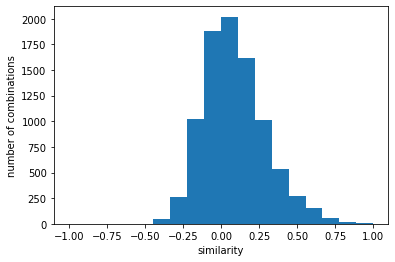

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.6028202895364833}
y [   0.    0.    0.    0.    2.   11.   95.  436.  944. 1252. 1152.  718.
  376.  220.  111.   46.   28.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


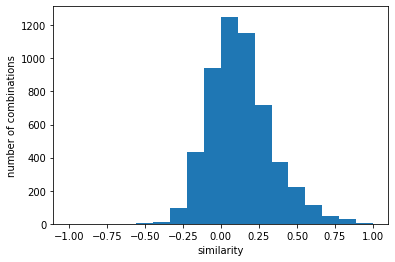

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.6685687636513836}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 1.890e+02
 8.060e+02 1.609e+03 1.894e+03 1.607e+03 1.001e+03 5.270e+02 2.650e+02
 1.180e+02 4.000e+01 5.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


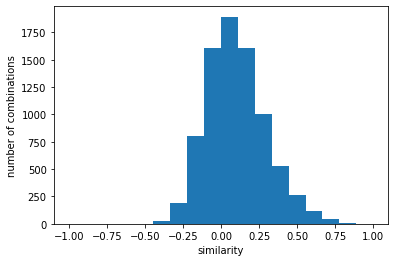

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5891040186113663}
y [   0.    0.    0.    0.    0.   11.   93.  442.  933. 1249. 1171.  709.
  412.  226.   88.   38.   26.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


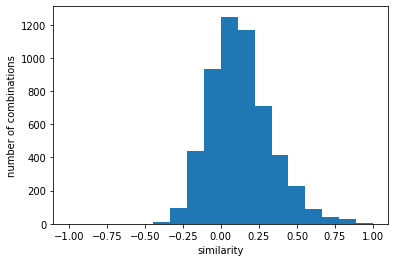

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6889131614986482}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 2.020e+02
 6.880e+02 1.449e+03 1.683e+03 1.454e+03 9.390e+02 5.400e+02 2.810e+02
 1.190e+02 5.700e+01 2.400e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


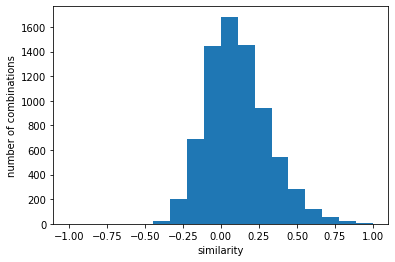

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6086667779639033}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   37.  295. 1131. 2261. 2605. 2076. 1423.
  786.  432.  189.   65.   25.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


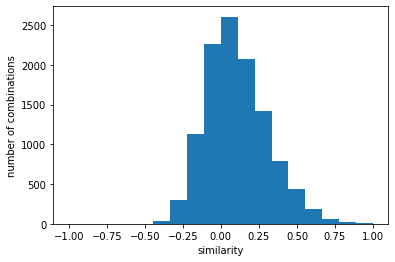

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5412854372202055}
y [   0.    0.    0.    0.    0.   12.   72.  388.  965. 1166. 1022.  653.
  397.  204.  125.   50.   40.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


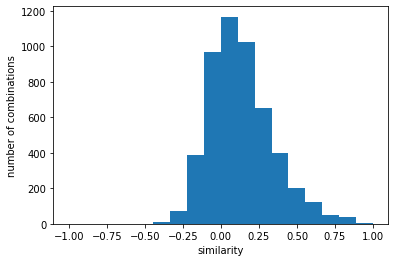

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6791560547118299}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.200e+01 1.000e+02
 4.600e+02 9.570e+02 1.205e+03 1.118e+03 7.510e+02 3.880e+02 2.360e+02
 1.110e+02 3.600e+01 2.500e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


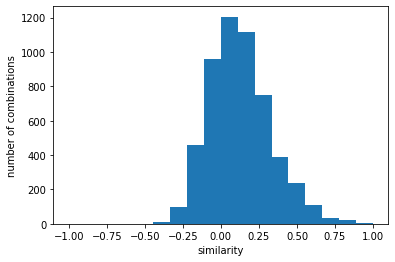

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6859095863109858}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   31.  223.  795. 1494. 1874. 1578.  997.
  563.  267.  119.   45.   10.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


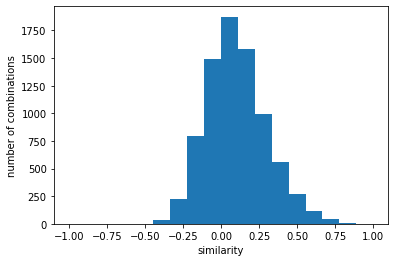

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5554705129758102}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.100e+01 5.900e+01
 4.090e+02 9.230e+02 1.258e+03 1.128e+03 7.480e+02 4.550e+02 2.270e+02
 1.310e+02 5.800e+01 3.500e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


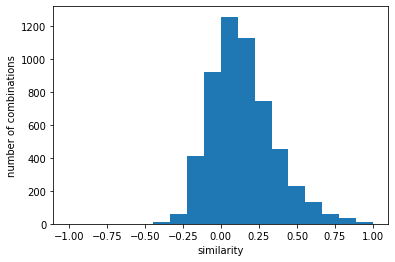

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6655523155698805}
y [   0.    0.    0.    0.    0.   16.  127.  568. 1069. 1336. 1132.  735.
  348.  166.   75.   27.    6.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


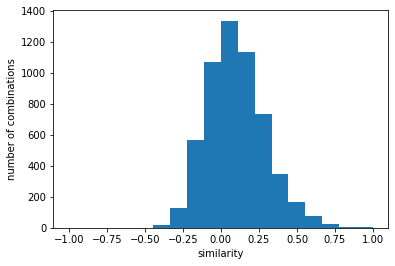

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6023936077719264}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.500e+01 9.500e+01
 4.280e+02 1.068e+03 1.263e+03 9.710e+02 6.170e+02 3.370e+02 1.960e+02
 6.500e+01 2.600e+01 1.800e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


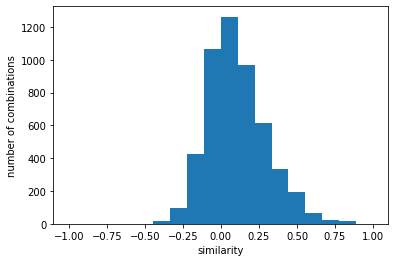

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6388147059195386}
y [  0.   0.   0.   0.   1.  10.  62. 394. 789. 994. 928. 626. 344. 188.
 100.  45.  29.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


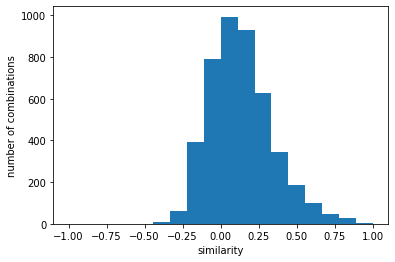

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6926302337878765}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   36.  345. 1317. 2665. 2966. 2276. 1524.
  802.  432.  215.   86.   26.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


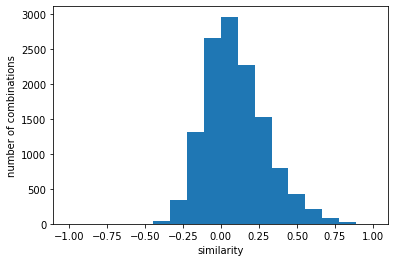

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5896757934698574}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   18.  205.  700. 1448. 1753. 1474.  979.
  599.  314.  126.   75.   20.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


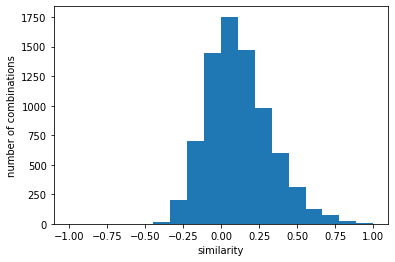

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.591620413410041}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.500e+01 1.800e+02
 7.120e+02 1.412e+03 1.708e+03 1.315e+03 8.140e+02 4.750e+02 2.750e+02
 1.610e+02 5.800e+01 3.800e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


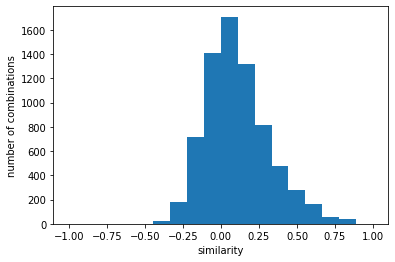

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5921250000031562}
y [   0.    0.    0.    0.    0.    7.   66.  410.  858. 1060.  953.  551.
  322.  182.  117.   40.   19.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


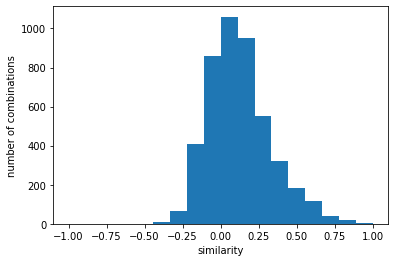

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.679200504700555}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   27.  180.  820. 1737. 2105. 1734. 1098.
  595.  350.  174.   63.   34.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


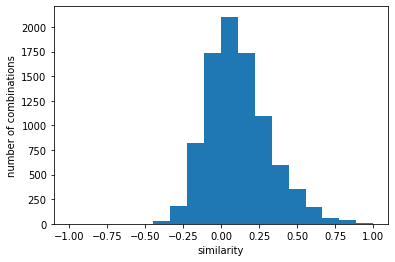

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5788893339226278}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.200e+01 2.380e+02
 9.950e+02 2.094e+03 2.555e+03 1.969e+03 1.241e+03 7.110e+02 3.590e+02
 1.850e+02 6.000e+01 1.600e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


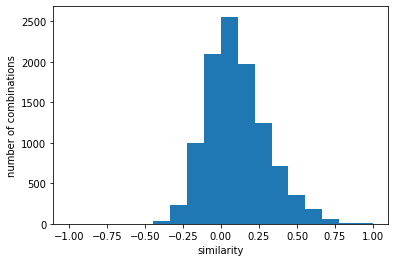

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.572992834351369}
y [  0.   0.   0.   0.   0.   5.  51. 372. 670. 949. 822. 523. 314. 183.
  98.  40.  21.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


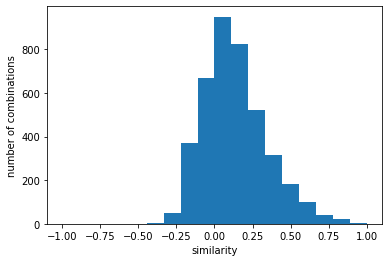

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6732285513085856}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   21.  185.  850. 1721. 2072. 1692. 1033.
  541.  277.  166.   60.   24.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


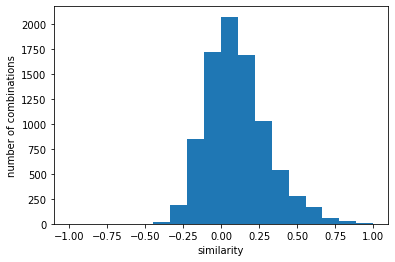

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.592581964460966}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.700e+01 1.870e+02
 8.730e+02 1.797e+03 2.080e+03 1.597e+03 9.760e+02 5.300e+02 2.920e+02
 1.440e+02 3.700e+01 8.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


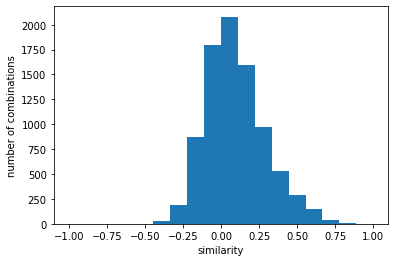

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5853005874307707}
y [   0.    0.    0.    0.    0.    6.   51.  346.  763. 1013.  901.  564.
  332.  197.  128.   65.   34.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


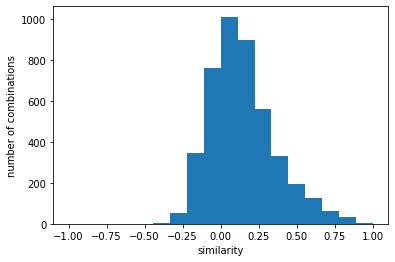

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6976059255927111}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.600e+01 2.960e+02
 1.028e+03 2.010e+03 2.249e+03 1.656e+03 1.136e+03 5.440e+02 2.770e+02
 9.900e+01 3.600e+01 1.900e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


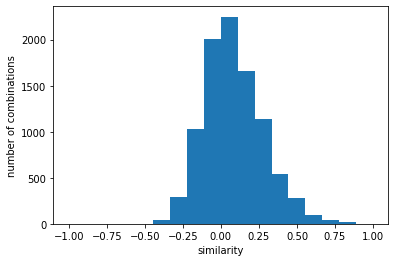

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5599386007360015}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 6.000e+00 7.300e+01
 4.000e+02 8.660e+02 1.092e+03 9.930e+02 5.810e+02 3.240e+02 1.980e+02
 9.900e+01 3.200e+01 1.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


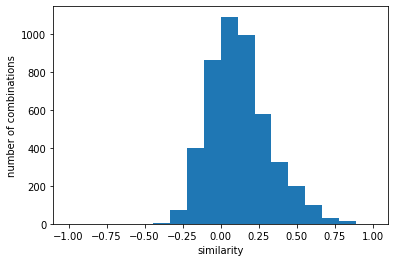

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6822918428600951}
y [   0.    0.    0.    0.    0.   14.  143.  724. 1353. 1552. 1320.  821.
  488.  268.  159.   46.   10.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


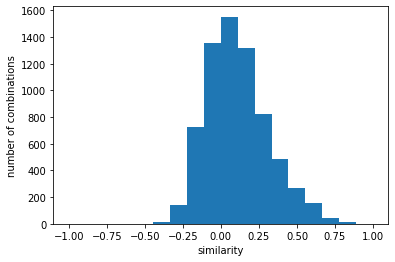

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6036723299102421}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 2.250e+02
 9.710e+02 2.060e+03 2.367e+03 1.932e+03 1.249e+03 6.400e+02 3.720e+02
 1.420e+02 4.000e+01 1.100e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


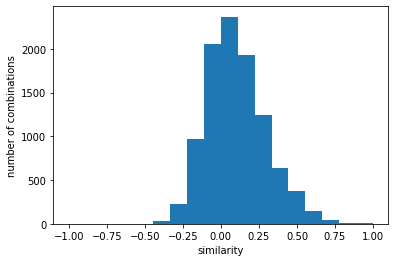

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5869734760438918}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   24.  156.  811. 1784. 2115. 1765. 1126.
  643.  288.  135.   41.   27.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


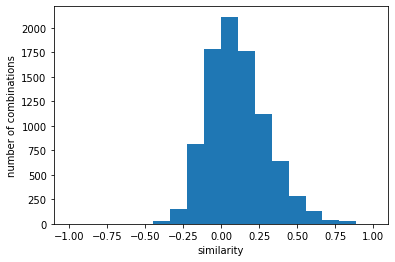

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎数学F(0079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5825756980635194}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.000e+00 2.200e+01 2.450e+02
 7.880e+02 1.603e+03 1.885e+03 1.589e+03 1.119e+03 6.430e+02 3.390e+02
 1.250e+02 4.300e+01 1.100e+01 1.100e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


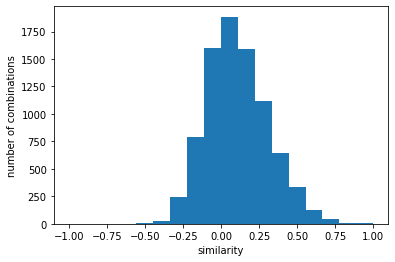

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 'similarity': 0.6097150498407921}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   39.  282. 1159. 2346. 2141. 1510.  942.
  524.  237.  145.   80.  160.   35.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


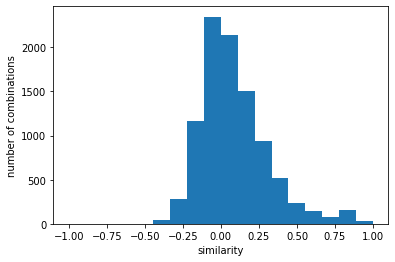

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.6088474394962826}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  177.  784. 1609. 1879. 1625. 1232.
  769.  414.  136.   36.    7.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


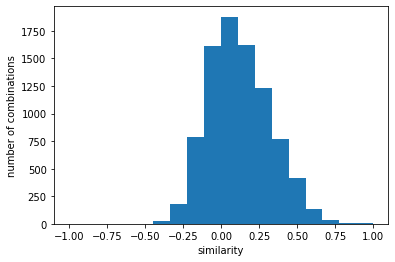

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5419134381300532}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   36.  232.  766. 1506. 1779. 1684. 1124.
  677.  319.  108.   33.   11.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


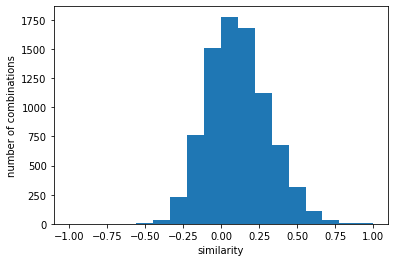

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5923503112608831}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 1.920e+02
 6.970e+02 1.439e+03 1.682e+03 1.549e+03 1.303e+03 7.300e+02 3.620e+02
 1.090e+02 1.600e+01 2.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


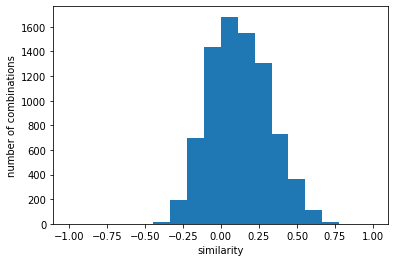

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5825010403532576}
y [   0.    0.    0.    0.    0.   22.  110.  501. 1196. 1461. 1140.  799.
  533.  317.  114.   44.   15.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


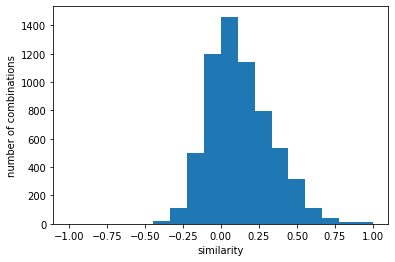

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.6031717842142069}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.300e+01 3.230e+02
 1.181e+03 2.226e+03 2.632e+03 2.380e+03 1.731e+03 1.044e+03 4.700e+02
 2.130e+02 5.400e+01 1.300e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


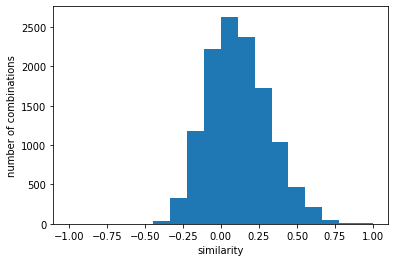

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.5440578292244866}
y [  0.   0.   0.   0.   1.  14. 123. 354. 645. 694. 553. 382. 228. 105.
  47.  29.  12.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


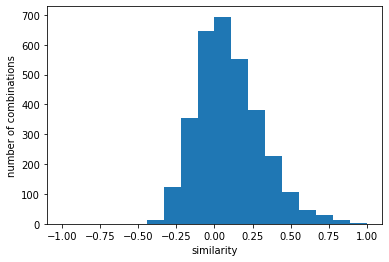

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.7565207900708666}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.300e+01 2.920e+02
 9.560e+02 1.951e+03 2.157e+03 1.751e+03 1.212e+03 8.070e+02 3.710e+02
 1.740e+02 5.900e+01 2.100e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


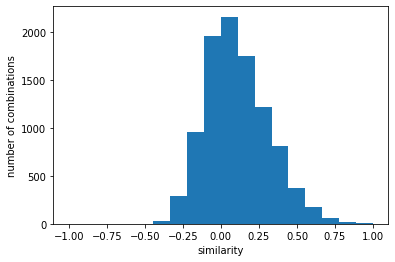

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.5586580386397602}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.900e+01 2.340e+02
 7.150e+02 1.652e+03 1.833e+03 1.618e+03 1.127e+03 6.760e+02 3.170e+02
 1.120e+02 2.400e+01 4.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


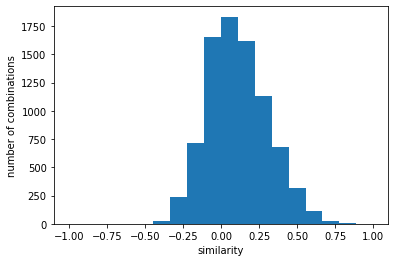

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5845422796847072}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   34.  258.  874. 1707. 2003. 1774. 1217.
  791.  367.  168.   58.   16.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


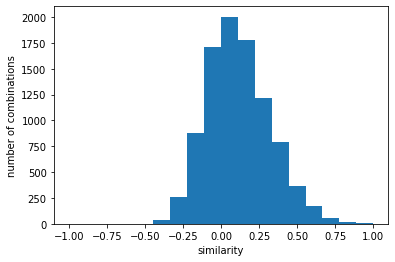

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.5883199339305892}
y [   0.    0.    0.    0.    0.    7.   93.  408. 1004. 1129.  994.  759.
  522.  300.  116.   39.   17.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


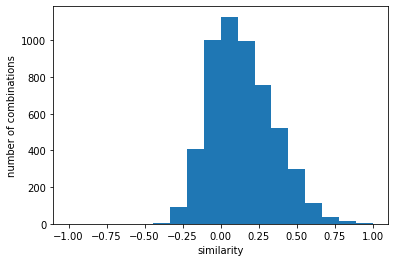

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6697806259090578}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+00 4.600e+01 3.750e+02
 1.153e+03 2.121e+03 2.601e+03 2.235e+03 1.502e+03 9.410e+02 4.910e+02
 1.890e+02 5.100e+01 1.700e+01 1.600e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


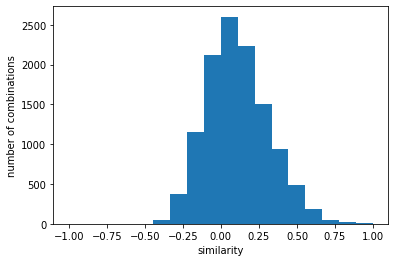

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5431055386680581}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.100e+01 2.530e+02
 8.230e+02 1.758e+03 1.990e+03 1.617e+03 1.073e+03 6.800e+02 3.280e+02
 1.550e+02 4.700e+01 2.600e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


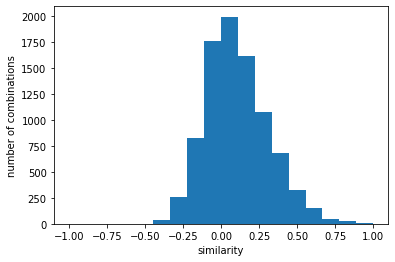

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.5734942841986853}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   41.  284.  923. 1822. 2105. 1771. 1245.
  830.  381.  169.   56.   15.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


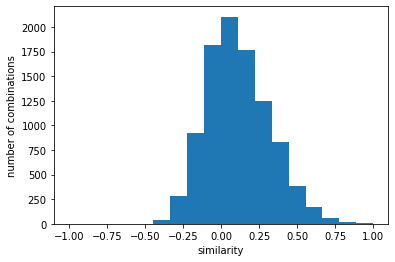

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.5762841203557059}
y [   0.    0.    0.    0.    0.   26.  148.  541. 1181. 1395. 1168.  799.
  519.  286.  109.   46.   16.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


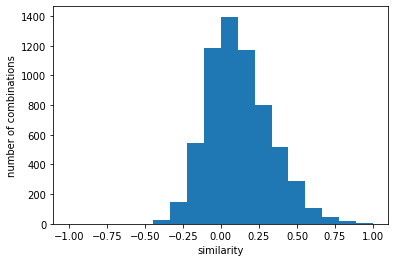

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.6026424223436159}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.600e+01 2.360e+02
 8.500e+02 1.701e+03 2.011e+03 1.689e+03 1.113e+03 6.910e+02 3.170e+02
 1.390e+02 4.600e+01 2.100e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


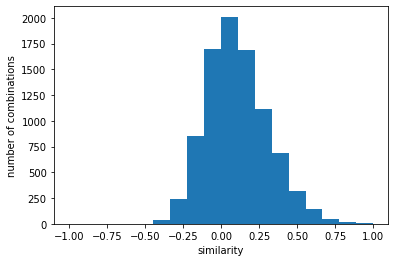

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5655131606475763}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 1.450e+02
 5.410e+02 1.120e+03 1.323e+03 1.061e+03 7.570e+02 4.310e+02 2.620e+02
 1.030e+02 2.700e+01 4.000e+00 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


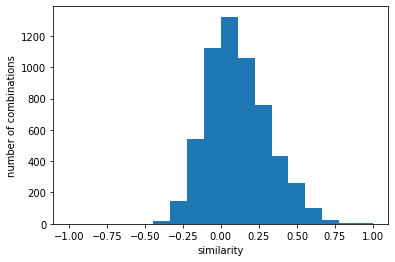

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5998463404148398}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.500e+01 2.130e+02
 8.040e+02 1.605e+03 1.669e+03 1.193e+03 8.440e+02 5.310e+02 2.770e+02
 1.100e+02 4.900e+01 4.400e+01 3.700e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


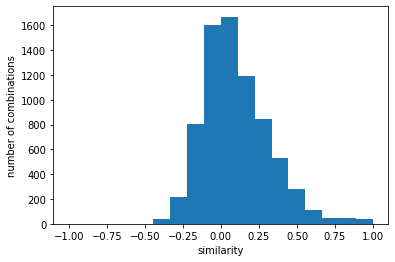

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5671781805353143}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.900e+01 1.670e+02
 6.910e+02 1.468e+03 1.574e+03 1.199e+03 8.660e+02 5.800e+02 2.980e+02
 1.460e+02 5.300e+01 2.500e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


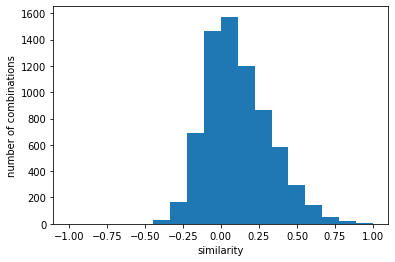

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6074701819611412}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 5.200e+01 3.640e+02
 1.483e+03 3.276e+03 3.711e+03 2.957e+03 2.060e+03 1.225e+03 6.480e+02
 2.280e+02 7.000e+01 2.300e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


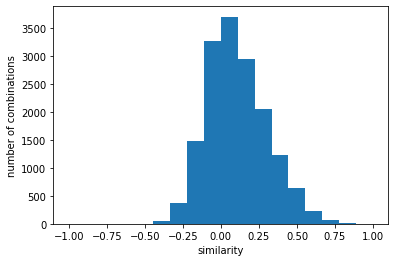

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5487983045764161}
y [   0.    0.    0.    0.    2.   10.  116.  424.  914. 1052.  945.  714.
  457.  312.  144.   48.   15.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


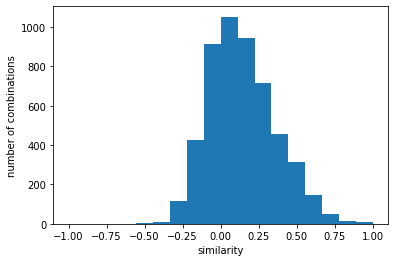

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6620078342172625}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 7.000e+00 3.600e+01 2.630e+02
 7.920e+02 1.556e+03 1.765e+03 1.456e+03 1.030e+03 6.280e+02 3.420e+02
 1.130e+02 4.200e+01 1.500e+01 1.000e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


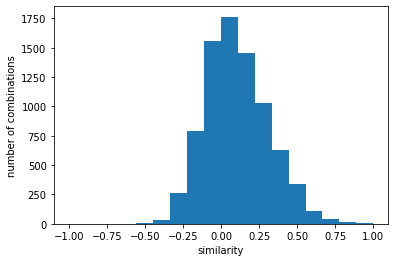

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5727278900885142}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.200e+01 2.540e+02
 8.890e+02 1.768e+03 2.015e+03 1.668e+03 1.056e+03 6.640e+02 2.970e+02
 1.330e+02 3.400e+01 1.300e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


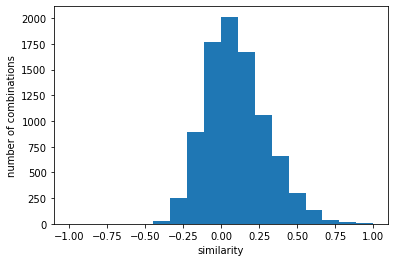

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.558082779981028}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   41.  248.  899. 1891. 2172. 1812. 1273.
  804.  446.  140.   35.   15.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


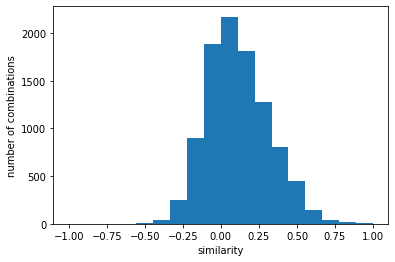

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5607362143968492}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.200e+01 2.490e+02
 9.440e+02 2.098e+03 2.586e+03 2.216e+03 1.643e+03 1.015e+03 5.070e+02
 2.020e+02 5.000e+01 1.100e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


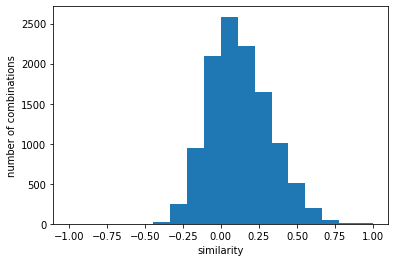

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5730976178459144}
y 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


[0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 2.020e+02
 6.230e+02 1.251e+03 1.334e+03 1.089e+03 7.050e+02 4.820e+02 2.320e+02
 1.190e+02 4.900e+01 1.700e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


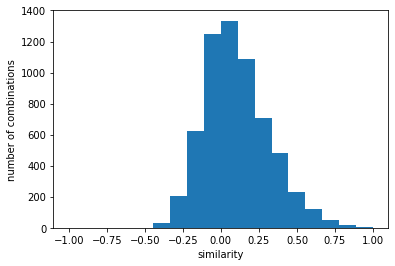

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.5983083138592612}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   34.  250.  970. 2019. 2343. 1983. 1446.
  858.  459.  136.   25.    8.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


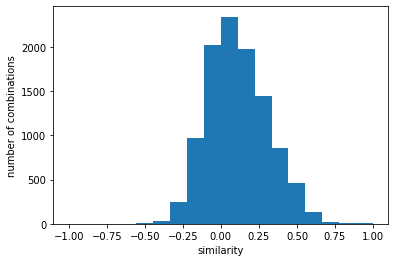

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5579247575380153}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   29.  188.  745. 1494. 1743. 1512.  975.
  548.  340.  110.   20.   11.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


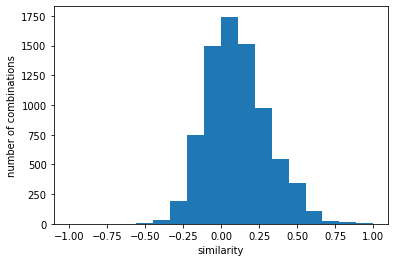

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6096060300066743}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.100e+01 2.280e+02
 8.330e+02 1.699e+03 2.015e+03 1.665e+03 1.146e+03 7.160e+02 3.650e+02
 1.760e+02 6.100e+01 2.200e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


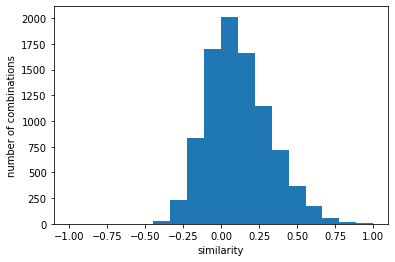

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5692416977708005}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.780e+02
 6.270e+02 1.282e+03 1.494e+03 1.138e+03 8.210e+02 4.560e+02 2.720e+02
 1.080e+02 2.700e+01 1.100e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


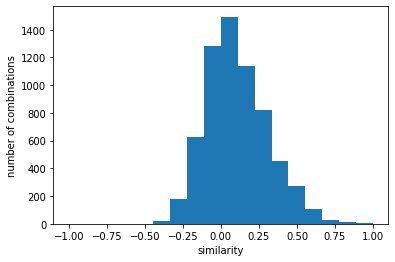

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6370484028371898}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 2.180e+02
 7.560e+02 1.555e+03 1.756e+03 1.487e+03 1.010e+03 5.990e+02 2.830e+02
 1.340e+02 3.500e+01 1.200e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


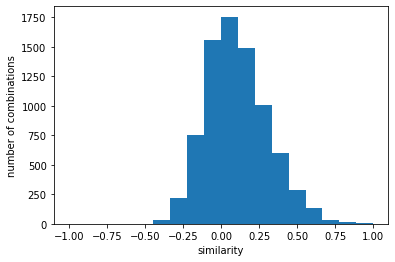

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5921432354497965}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.000e+01 1.120e+02
 5.240e+02 1.215e+03 1.468e+03 1.346e+03 1.072e+03 7.310e+02 3.700e+02
 1.330e+02 4.700e+01 7.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


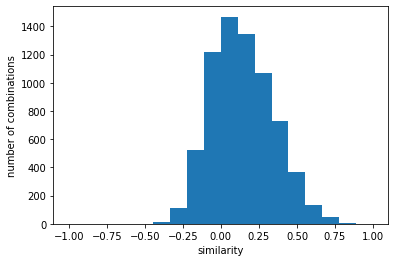

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6195506209970819}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   38.  266.  994. 1898. 2183. 1897. 1292.
  742.  414.  138.   20.    6.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


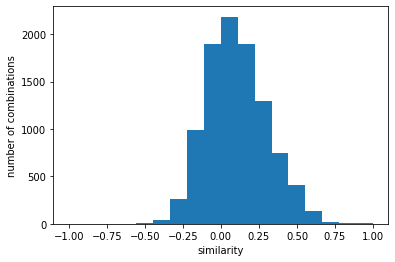

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.597426872879536}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   32.  186.  717. 1644. 1768. 1683. 1251.
  793.  353.  131.   40.    9.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


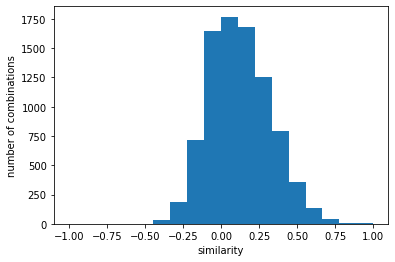

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1プログラミングⅠ(2040).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5927512691867126}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+00 5.600e+01 4.140e+02
 1.862e+03 3.260e+03 3.029e+03 2.090e+03 1.252e+03 5.410e+02 2.390e+02
 1.000e+02 5.100e+01 1.800e+01 3.200e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


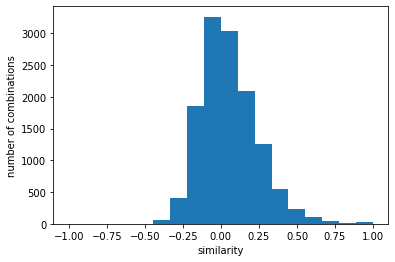

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 'similarity': 0.5150559901541669}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.200e+01 1.920e+02
 8.110e+02 1.716e+03 2.003e+03 1.752e+03 1.165e+03 6.450e+02 2.830e+02
 9.400e+01 2.500e+01 6.000e+00 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


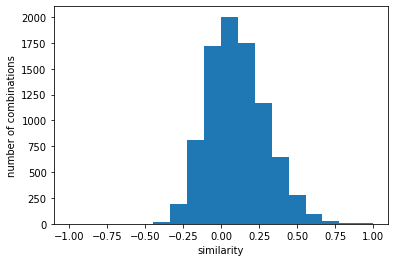

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5399503509375106}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   28.  219.  874. 1863. 2232. 1928. 1270.
  652.  276.  114.   28.    3.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


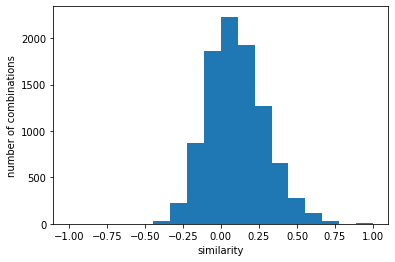

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5688205596254722}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.700e+01 1.770e+02
 7.700e+02 1.746e+03 2.207e+03 1.938e+03 1.211e+03 5.720e+02 2.540e+02
 8.800e+01 2.200e+01 3.000e+00 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


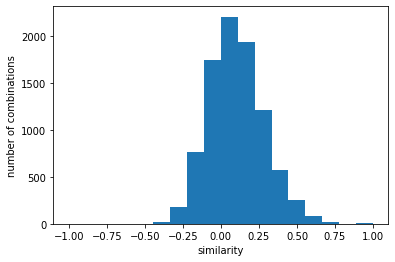

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5410757086279274}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+00 3.700e+01 2.080e+02
 7.360e+02 1.423e+03 1.846e+03 1.617e+03 1.058e+03 5.870e+02 3.220e+02
 1.140e+02 4.000e+01 1.200e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


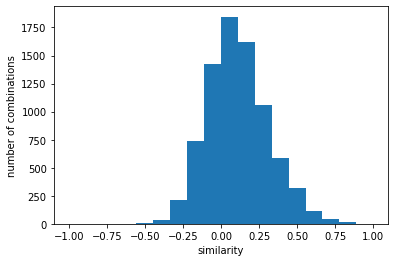

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5512812436127174}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 2.540e+02
 9.880e+02 2.107e+03 2.781e+03 2.508e+03 1.663e+03 9.430e+02 3.800e+02
 1.570e+02 4.600e+01 1.700e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


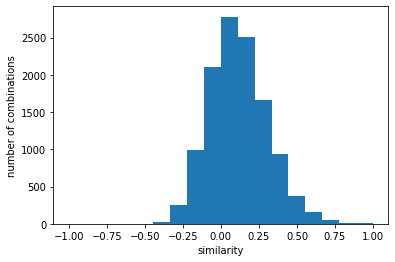

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.5544513210451565}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 7.000e+00 4.000e+01 2.700e+02
 8.750e+02 1.637e+03 1.983e+03 1.595e+03 1.102e+03 6.820e+02 3.420e+02
 1.150e+02 5.100e+01 1.200e+01 1.000e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


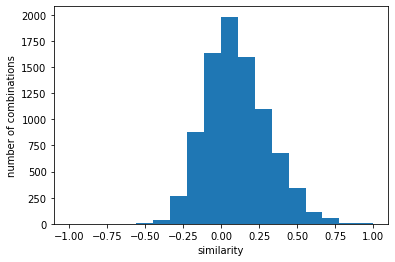

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.6215339274033357}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   35.  264. 1043. 2100. 2516. 1957. 1260.
  661.  280.  114.   34.    9.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


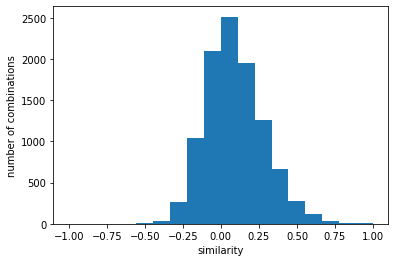

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.5458817761368185}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.700e+01 2.120e+02
 7.890e+02 1.778e+03 2.193e+03 1.899e+03 1.259e+03 6.190e+02 2.740e+02
 9.800e+01 2.700e+01 2.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


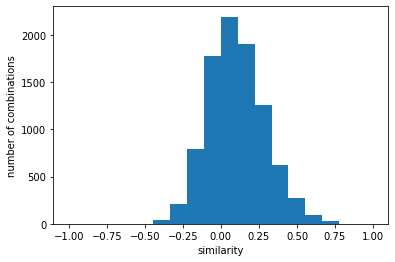

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5701490736621404}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   25.  267. 1023. 2132. 2534. 2022. 1355.
  685.  314.  110.   25.    7.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


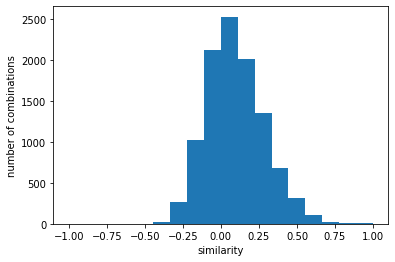

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.55949910118528}
y [   0.    0.    0.    0.    2.   16.  165.  626. 1325. 1564. 1362.  982.
  516.  249.   87.   24.    9.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


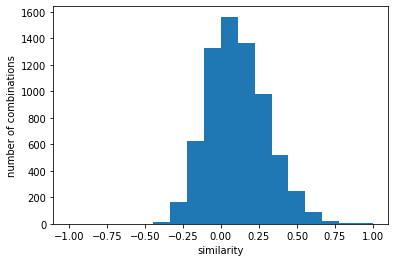

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6090960116016488}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.500e+01 3.290e+02
 1.195e+03 2.206e+03 2.715e+03 2.232e+03 1.495e+03 8.250e+02 3.500e+02
 1.190e+02 4.000e+01 8.000e+00 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


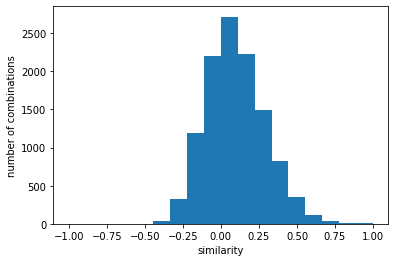

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5431906449578691}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   33.  271. 1019. 2087. 2434. 1792. 1093.
  562.  235.   89.   30.   16.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


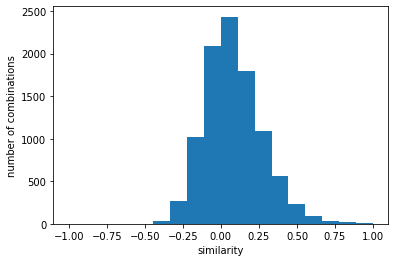

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.5500846569232108}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   32.  280. 1069. 2135. 2502. 1990. 1319.
  700.  323.  111.   28.    8.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


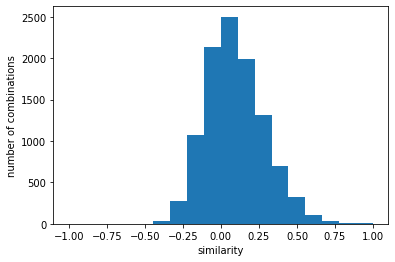

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.5553961815371741}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+00 3.600e+01 1.980e+02
 7.140e+02 1.448e+03 1.782e+03 1.540e+03 1.015e+03 5.630e+02 3.040e+02
 1.110e+02 4.100e+01 1.400e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


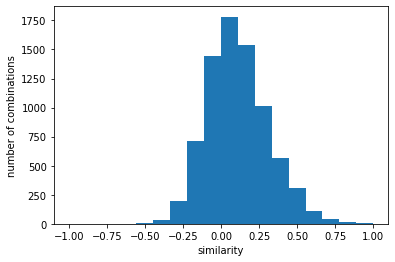

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.572105537022136}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   22.  191.  780. 1721. 1997. 1617. 1001.
  529.  227.   93.   32.   12.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


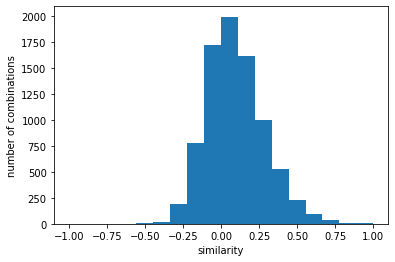

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5797461998132862}
y [   0.    0.    0.    0.    0.   11.  150.  639. 1330. 1649. 1400.  986.
  481.  231.   88.   26.    5.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


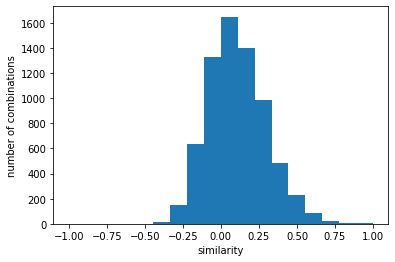

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.578737245867717}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   34.  273. 1207. 2293. 2287. 1609. 1077.
  510.  239.   93.   34.    9.   22.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


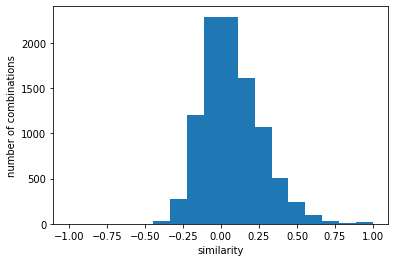

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.49343854900367773}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   33.  229.  888. 1961. 2214. 1659. 1010.
  504.  226.   80.   27.   15.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


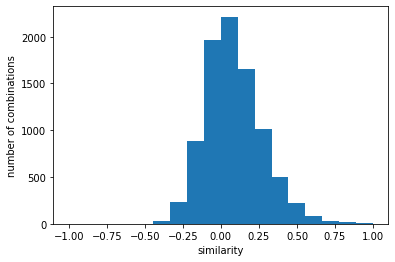

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.54473416242182}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 8.000e+00 6.300e+01 4.070e+02
 1.541e+03 3.057e+03 3.529e+03 2.732e+03 1.683e+03 8.540e+02 3.600e+02
 1.390e+02 3.800e+01 7.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


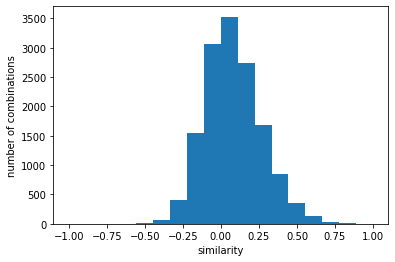

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.544645107542024}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   14.  170.  649. 1500. 1823. 1494. 1071.
  546.  272.  106.   28.   13.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


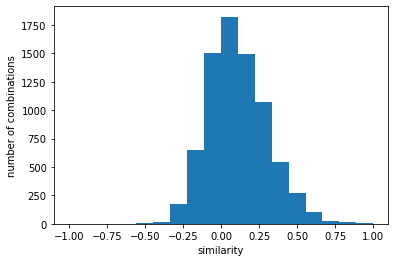

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5986080352997203}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 8.000e+00 3.500e+01 2.150e+02
 9.120e+02 1.799e+03 2.032e+03 1.531e+03 9.320e+02 4.460e+02 1.910e+02
 5.700e+01 3.000e+01 8.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


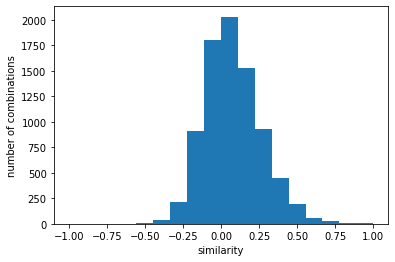

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.563799787135716}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   25.  252. 1035. 2157. 2513. 1975. 1264.
  655.  292.  118.   34.   12.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


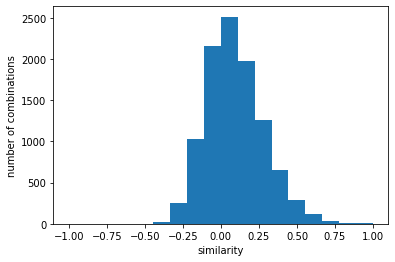

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.530025366735084}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   34.  213.  956. 2083. 2510. 2100. 1315.
  646.  272.  103.   28.   12.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


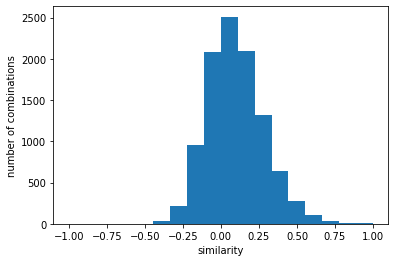

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5481503561425506}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.400e+01 2.540e+02
 1.095e+03 2.461e+03 2.880e+03 2.289e+03 1.542e+03 7.580e+02 3.140e+02
 1.060e+02 3.000e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


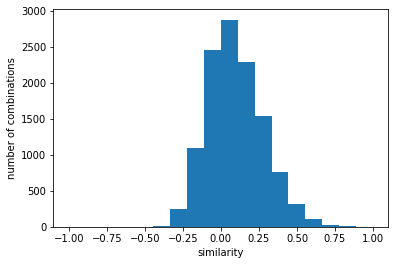

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5593015416812832}
y [   0.    0.    0.    0.    3.   22.  181.  710. 1385. 1605. 1217.  809.
  411.  194.   81.   23.    5.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


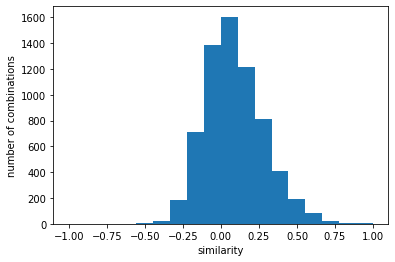

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.5893289648710942}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   32.  228. 1059. 2215. 2608. 2144. 1296.
  627.  248.  104.   26.    8.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


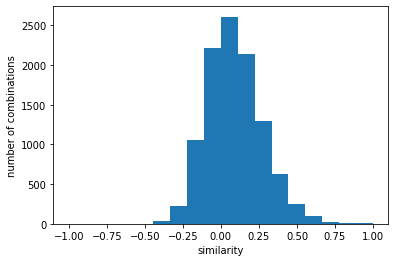

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5500376865213539}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.600e+01 2.310e+02
 8.880e+02 1.713e+03 2.040e+03 1.644e+03 1.049e+03 5.530e+02 2.540e+02
 1.000e+02 2.600e+01 4.000e+00 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


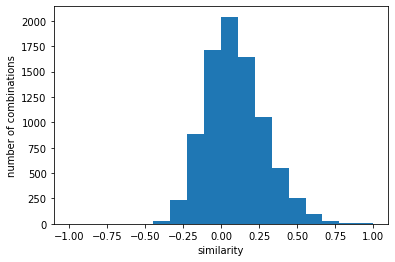

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5732859761904302}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   24.  245.  984. 2095. 2510. 1942. 1285.
  675.  316.  124.   40.   12.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


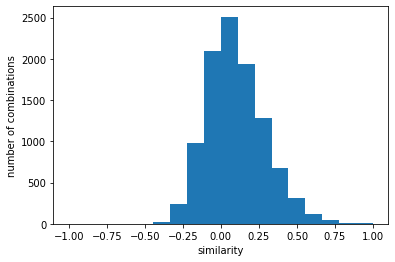

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5407303887850218}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+00 3.900e+01 2.830e+02
 9.210e+02 1.768e+03 1.894e+03 1.585e+03 1.077e+03 5.740e+02 2.860e+02
 1.110e+02 5.100e+01 1.800e+01 1.100e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


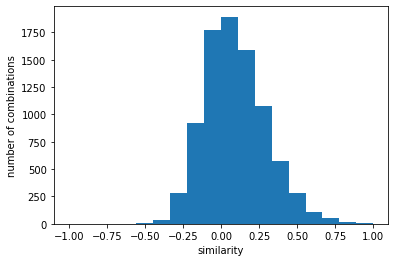

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5710140819593802}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   26.  255. 1006. 2103. 2523. 2018. 1354.
  699.  307.  130.   38.    9.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


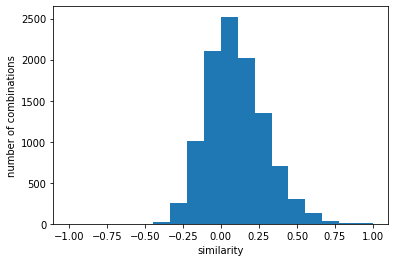

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.540999327826555}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 9.000e+00 2.090e+02
 8.010e+02 1.846e+03 2.187e+03 1.819e+03 1.264e+03 6.760e+02 2.640e+02
 9.100e+01 2.600e+01 5.000e+00 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


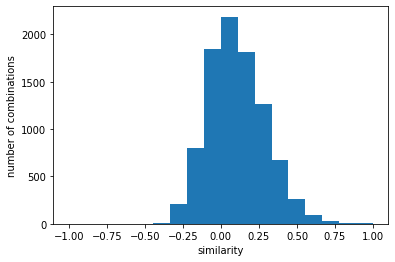

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5433427121943997}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.000e+01 2.740e+02
 1.089e+03 2.206e+03 2.591e+03 2.171e+03 1.335e+03 6.950e+02 3.270e+02
 1.240e+02 3.800e+01 3.000e+00 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


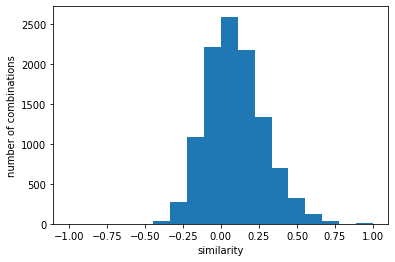

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5771182568091405}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.700e+01 1.880e+02
 7.740e+02 1.756e+03 2.208e+03 1.885e+03 1.329e+03 6.700e+02 2.800e+02
 1.200e+02 3.100e+01 6.000e+00 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


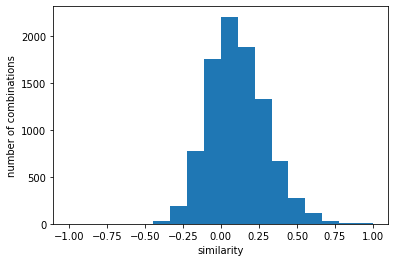

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1情報リテラシー（0905）_1.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5598590583637806}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.960e+02
 8.330e+02 1.944e+03 2.001e+03 1.616e+03 8.730e+02 4.840e+02 2.800e+02
 1.140e+02 5.300e+01 3.800e+01 1.400e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


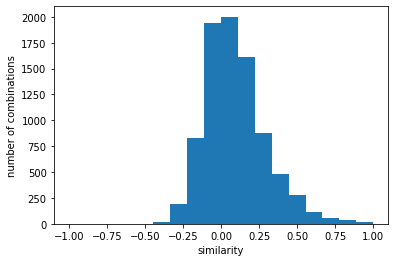

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 'similarity': 0.5171605897761623}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   33.  218.  856. 2062. 2342. 1689.  996.
  542.  263.  114.   36.   22.   26.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


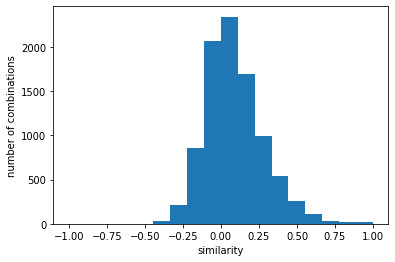

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.5574607640178905}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.870e+02
 9.030e+02 1.931e+03 1.868e+03 1.332e+03 7.820e+02 5.780e+02 3.050e+02
 1.220e+02 3.400e+01 7.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


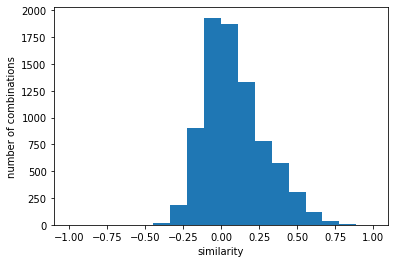

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.5498910622418748}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.500e+01 2.720e+02
 8.980e+02 2.196e+03 2.400e+03 1.546e+03 8.800e+02 5.760e+02 2.510e+02
 1.330e+02 4.500e+01 1.600e+01 3.300e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


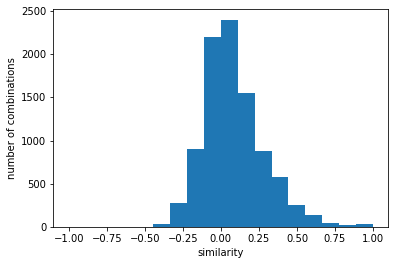

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5094557503560744}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 6.300e+01 5.400e+02
 1.677e+03 3.469e+03 3.370e+03 2.358e+03 1.367e+03 8.110e+02 2.830e+02
 1.130e+02 5.400e+01 2.500e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


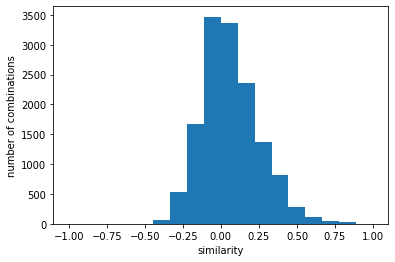

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.47353451884294284}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   49.  300. 1291. 2671. 2452. 1676. 1035.
  528.  255.  157.   87.  183.   19.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


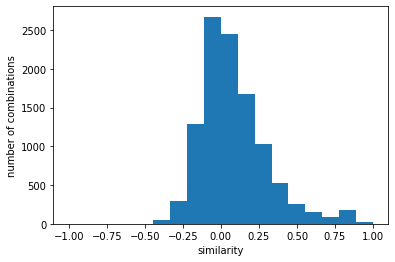

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.5521442216000626}
y [   0.    0.    0.    0.    0.   10.  137.  611. 1546. 1596. 1021.  565.
  331.  202.  108.   40.   16.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


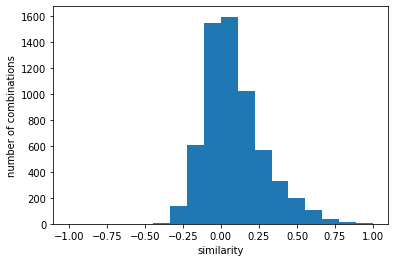

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.6170673856938423}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.300e+01 2.390e+02
 9.020e+02 2.106e+03 2.071e+03 1.460e+03 8.180e+02 4.810e+02 2.600e+02
 1.010e+02 3.800e+01 5.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


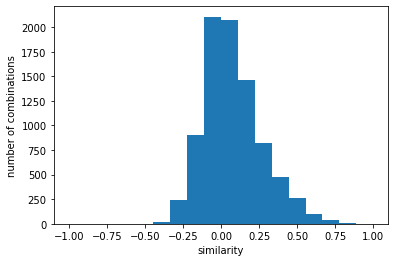

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5554414884057817}
y [   0.    0.    0.    0.    0.   15.  122.  567. 1428. 1784. 1279.  757.
  431.  201.   86.   51.   27.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


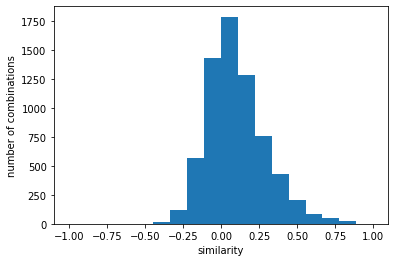

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6313056226015492}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 2.170e+02
 7.380e+02 1.771e+03 1.830e+03 1.270e+03 7.090e+02 4.160e+02 2.300e+02
 1.130e+02 7.400e+01 5.200e+01 3.100e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


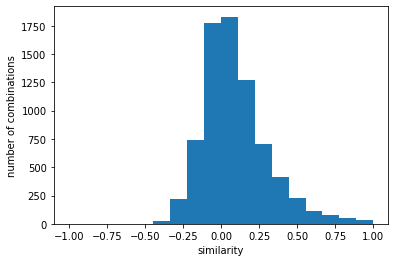

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.5880800094328436}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 5.900e+01 4.170e+02
 1.514e+03 2.733e+03 3.386e+03 2.468e+03 1.334e+03 8.770e+02 4.260e+02
 1.720e+02 6.500e+01 4.300e+01 3.400e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


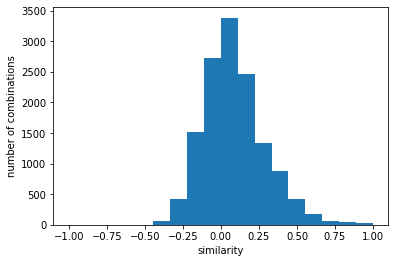

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.49228935735066764}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   15.  107.  563. 1332. 1682. 1260.  684.
  376.  195.  149.   70.   47.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


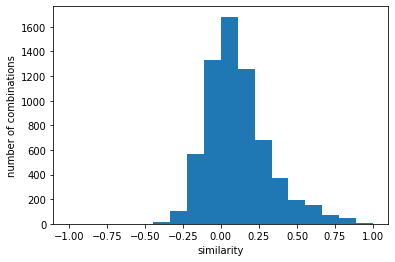

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6195855698099658}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.200e+01 1.200e+02
 5.410e+02 1.294e+03 1.491e+03 1.014e+03 6.350e+02 3.560e+02 1.830e+02
 9.600e+01 2.800e+01 7.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


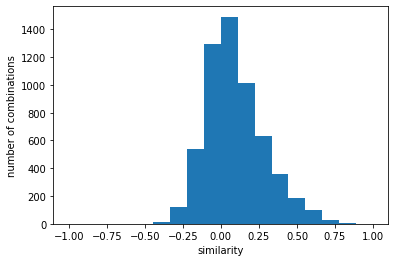

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6480419473814187}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.300e+01 2.440e+02
 8.290e+02 2.043e+03 2.267e+03 1.539e+03 8.890e+02 5.720e+02 2.250e+02
 1.250e+02 4.600e+01 1.700e+01 2.500e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


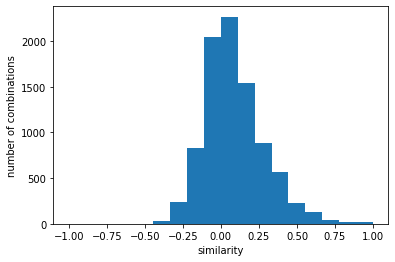

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5211802262121106}
y [   0.    0.    0.    0.    0.   19.  129.  755. 1458. 1929. 1297.  747.
  421.  200.  131.   67.   39.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


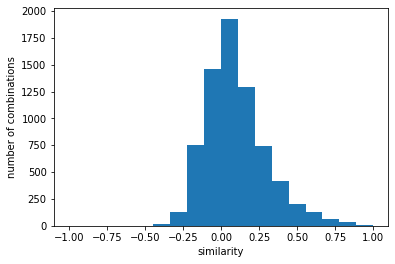

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5924693363988264}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 1.760e+02
 6.550e+02 1.418e+03 1.752e+03 1.319e+03 7.010e+02 3.730e+02 1.830e+02
 6.900e+01 2.600e+01 2.600e+01 1.400e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


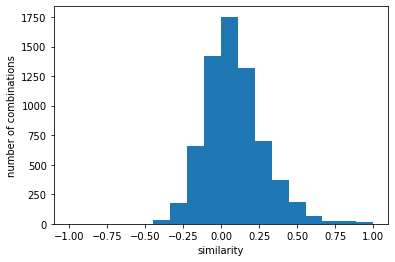

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5495488644293501}
y [  0.   0.   0.   0.   1.   6.  64. 263. 627. 868. 596. 349. 208. 145.
  55.  44. 228. 116.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


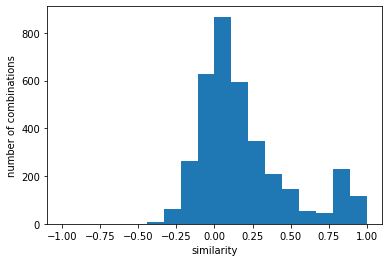

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6797603815731748}
y [   0.    0.    0.    0.    0.   12.   71.  499. 1220. 1383.  757.  407.
  215.  117.   97.   59.   31.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


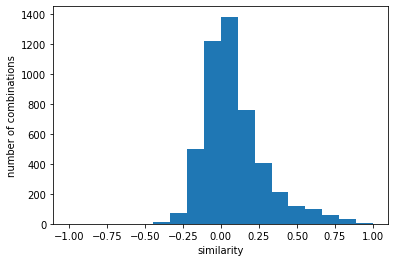

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6451492794297454}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 5.600e+01 4.880e+02
 1.775e+03 3.884e+03 4.137e+03 3.040e+03 1.627e+03 8.930e+02 4.190e+02
 1.790e+02 7.600e+01 3.600e+01 2.600e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


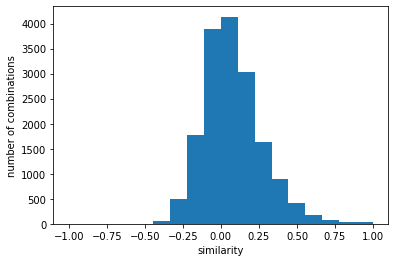

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5114365170566715}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 2.440e+02
 8.060e+02 1.614e+03 1.847e+03 1.430e+03 7.830e+02 4.690e+02 2.470e+02
 9.900e+01 8.300e+01 5.500e+01 2.700e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


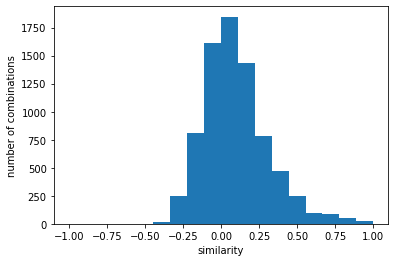

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5726210879634329}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.100e+01 2.200e+02
 9.100e+02 1.940e+03 2.292e+03 1.581e+03 9.270e+02 6.060e+02 3.400e+02
 1.680e+02 6.200e+01 4.900e+01 1.600e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


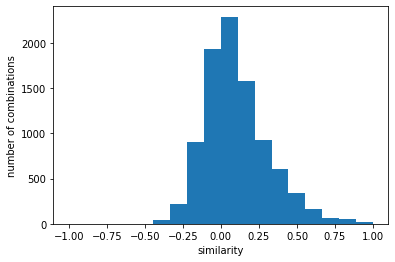

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5312953296652747}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   15.  104.  558. 1425. 1715. 1216.  765.
  455.  226.  133.   37.   11.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


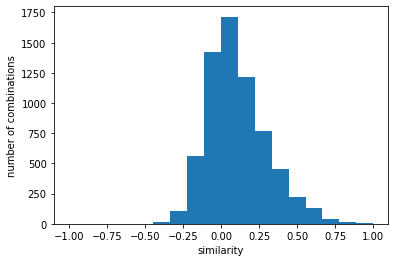

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6027368406104341}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   30.  319. 1030. 2040. 2349. 1569.  824.
  515.  257.  124.   54.   48.   18.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


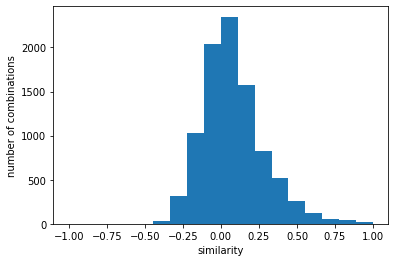

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5461923060031072}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.100e+01 1.800e+02
 9.210e+02 2.294e+03 2.881e+03 2.061e+03 1.244e+03 6.860e+02 3.450e+02
 1.480e+02 5.300e+01 4.700e+01 2.100e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


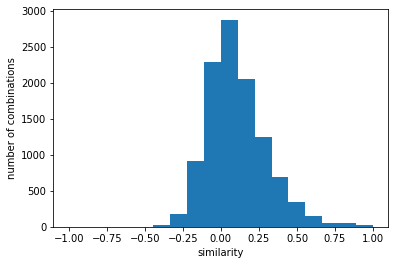

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5539593156803302}
y [   0.    0.    0.    0.    0.   15.  108.  401.  889. 1127.  652.  377.
  217.  122.   84.   36.   11.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


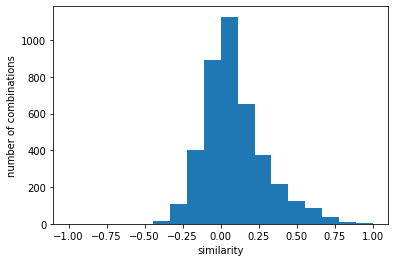

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6364544641155891}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   29.  293. 1074. 2252. 2820. 1801.  961.
  531.  292.  157.   56.   37.   17.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


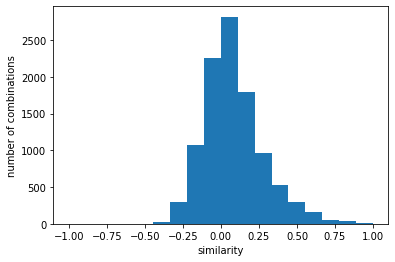

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5370065631396338}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 1.920e+02
 1.068e+03 2.153e+03 2.378e+03 1.524e+03 8.280e+02 4.790e+02 2.880e+02
 1.510e+02 4.600e+01 3.800e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


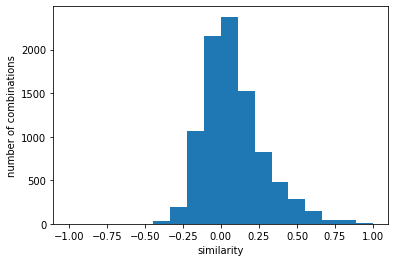

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5512861773133536}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   18.  122.  576. 1448. 1662. 1229.  752.
  461.  272.  156.   68.   23.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


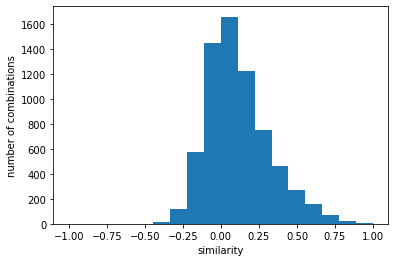

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6095578781807504}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.900e+01 3.080e+02
 1.078e+03 2.494e+03 2.610e+03 1.706e+03 9.250e+02 4.620e+02 2.120e+02
 9.700e+01 2.400e+01 6.100e+01 2.900e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


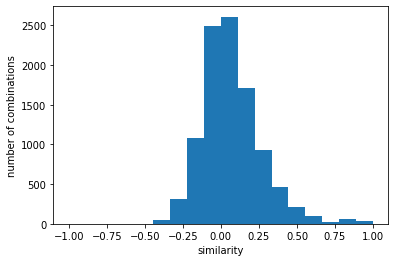

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.527622230209769}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   15.  117.  597. 1532. 1586. 1241.  779.
  429.  194.  117.   34.    7.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


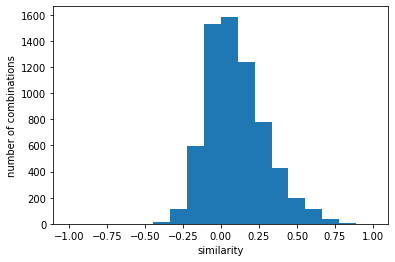

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6066714864287363}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   14.  132.  713. 1746. 1952. 1362.  787.
  515.  273.  132.   62.   14.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


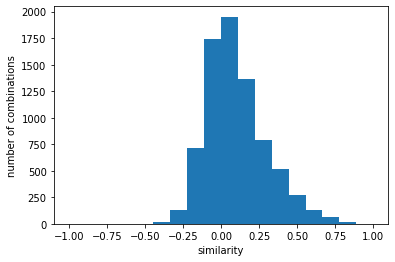

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.563741931202562}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.900e+01 2.580e+02
 1.235e+03 2.396e+03 2.581e+03 1.728e+03 9.910e+02 6.390e+02 3.990e+02
 1.590e+02 4.300e+01 2.100e+01 2.400e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


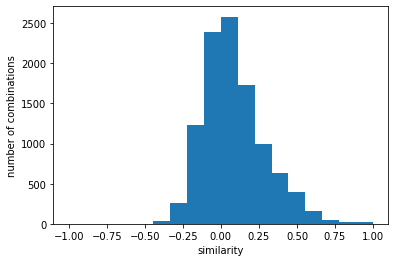

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5604026766477158}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   49.  262. 1022. 2323. 2353. 1466.  799.
  501.  205.  125.   32.   16.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


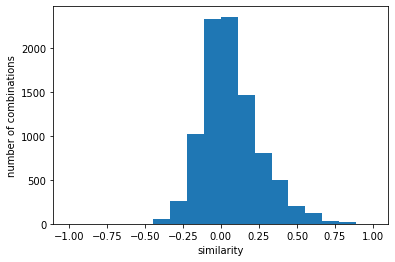

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1解析学Ⅰ(0280).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5454524913888752}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+01 1.240e+02
 4.280e+02 9.180e+02 1.193e+03 1.156e+03 8.970e+02 5.300e+02 2.710e+02
 9.600e+01 1.800e+01 3.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


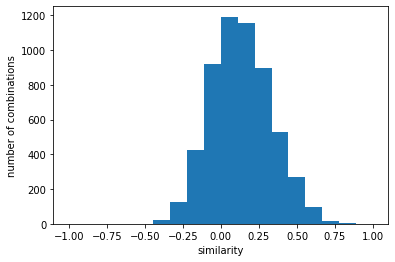

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 'similarity': 0.6946230235919402}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.300e+01 1.500e+02
 4.880e+02 1.080e+03 1.212e+03 1.187e+03 9.030e+02 5.270e+02 2.500e+02
 8.200e+01 1.800e+01 2.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


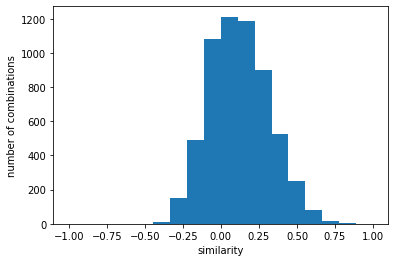

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.63892528372246}
y [   0.    0.    0.    0.    2.   15.  128.  569. 1168. 1482. 1206.  856.
  533.  307.   92.   25.    8.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


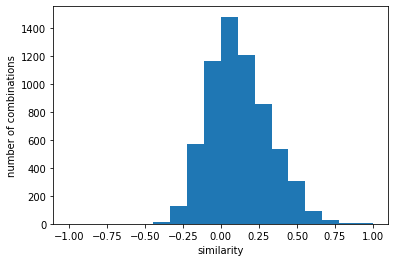

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.6096042443450477}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 1.980e+02
 8.610e+02 1.858e+03 2.187e+03 1.896e+03 1.318e+03 7.920e+02 3.420e+02
 1.150e+02 2.900e+01 1.300e+01 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


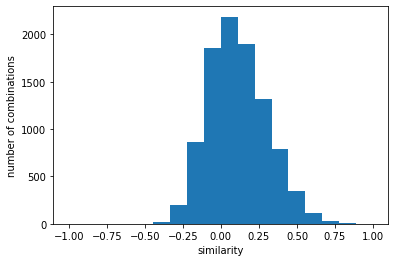

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.6016999705956804}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   25.  181.  721. 1478. 1620. 1481. 1063.
  671.  323.  120.   39.    9.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


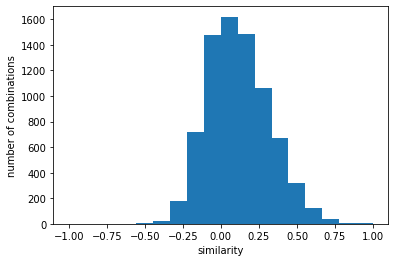

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.6589415073406873}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   17.  159.  668. 1231. 1484. 1301.  918.
  545.  270.  124.   58.   14.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


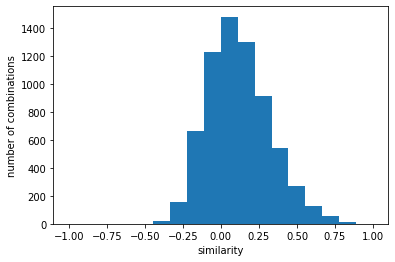

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.6489627615162582}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.900e+01 1.410e+02
 5.330e+02 1.119e+03 1.250e+03 1.198e+03 9.190e+02 5.170e+02 2.490e+02
 1.010e+02 2.000e+01 5.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


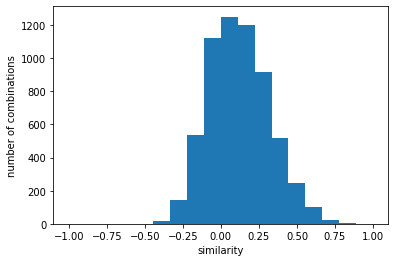

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.6673061548464472}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.500e+02
 6.680e+02 1.313e+03 1.596e+03 1.468e+03 1.021e+03 6.020e+02 3.140e+02
 1.500e+02 5.700e+01 1.700e+01 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


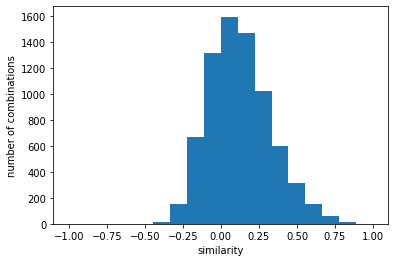

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6513004528291791}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   13.  105.  506. 1103. 1337. 1313.  920.
  590.  283.  120.   32.    9.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


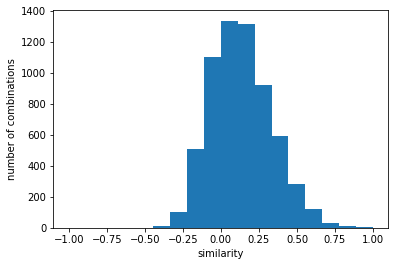

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6490232855326435}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.700e+01 2.720e+02
 9.090e+02 1.716e+03 2.037e+03 1.773e+03 1.320e+03 8.360e+02 4.300e+02
 1.840e+02 4.600e+01 1.700e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


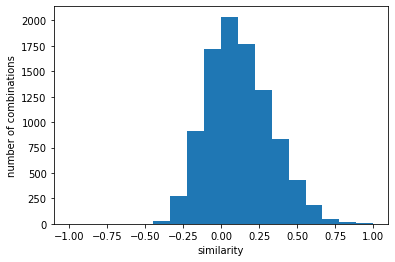

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5983481071770289}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   19.  179.  746. 1545. 1825. 1545. 1006.
  624.  326.  129.   52.   18.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


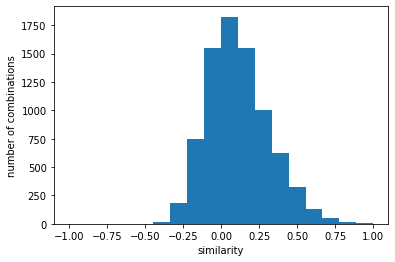

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6104874504514659}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   21.  179.  692. 1261. 1513. 1398. 1002.
  610.  306.  161.   68.   16.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


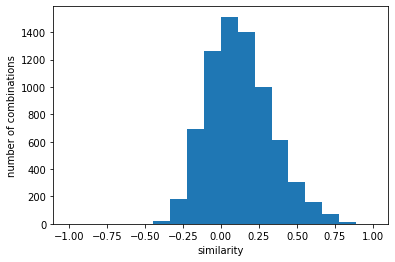

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6522082841246706}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.600e+01 1.230e+02
 4.980e+02 1.024e+03 1.245e+03 1.158e+03 8.420e+02 5.230e+02 2.900e+02
 9.300e+01 2.500e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


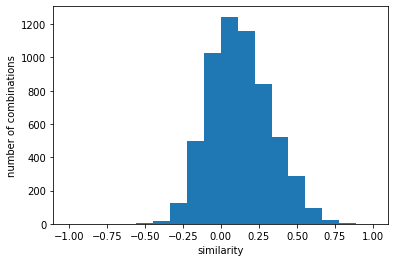

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.6459323219235966}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.420e+02
 7.070e+02 1.468e+03 1.752e+03 1.491e+03 1.022e+03 6.300e+02 3.210e+02
 1.460e+02 5.900e+01 1.800e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


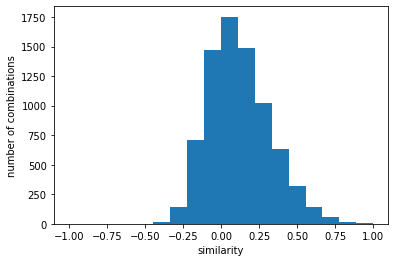

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6130544110638783}
y [   0.    0.    0.    0.    0.   10.   97.  388.  824. 1010.  993.  690.
  437.  243.  101.   29.    8.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


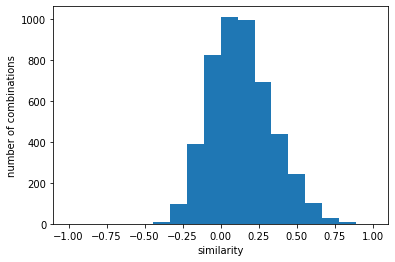

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6696763561348051}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.700e+01 1.510e+02
 6.810e+02 1.425e+03 1.456e+03 1.205e+03 7.640e+02 4.510e+02 2.390e+02
 1.090e+02 4.900e+01 1.300e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


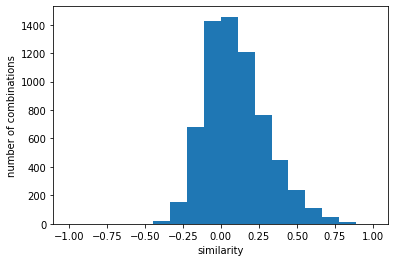

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5930609610315248}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.300e+01 1.440e+02
 7.120e+02 1.311e+03 1.530e+03 1.305e+03 8.260e+02 5.240e+02 2.960e+02
 1.130e+02 4.900e+01 1.300e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


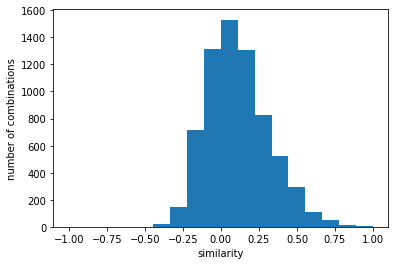

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6164925006672404}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.800e+01 2.410e+02
 9.930e+02 2.176e+03 2.608e+03 2.190e+03 1.457e+03 8.730e+02 4.270e+02
 1.770e+02 4.900e+01 1.900e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


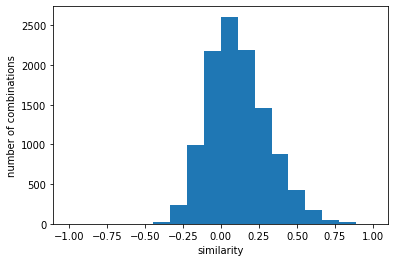

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.6129265468604046}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.290e+02
 5.020e+02 1.080e+03 1.276e+03 1.257e+03 9.700e+02 6.680e+02 3.180e+02
 1.420e+02 4.800e+01 1.300e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


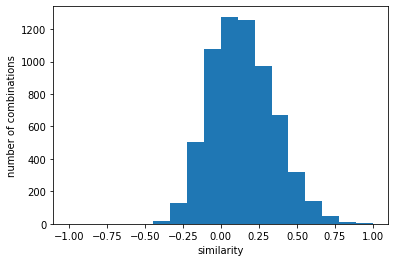

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6582010074169442}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 1.960e+02
 7.190e+02 1.299e+03 1.458e+03 1.334e+03 9.920e+02 6.040e+02 2.980e+02
 1.290e+02 4.000e+01 1.200e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


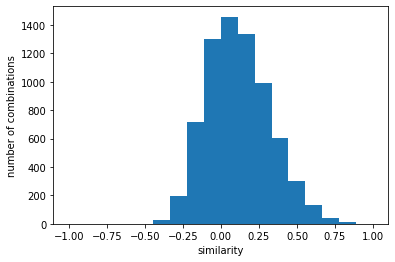

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6205836990210838}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   17.  163.  649. 1228. 1514. 1355.  888.
  504.  243.  131.   53.   19.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


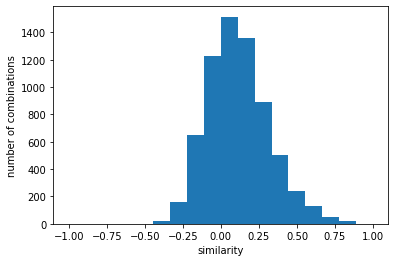

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6335066290724677}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 1.310e+02
 6.680e+02 1.483e+03 1.841e+03 1.567e+03 1.111e+03 6.320e+02 3.410e+02
 1.400e+02 5.700e+01 1.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


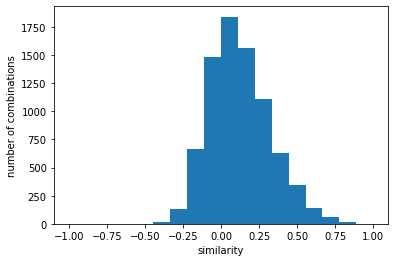

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6192534816835764}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   19.  137.  681. 1606. 2049. 1859. 1385.
  850.  419.  178.   46.   10.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


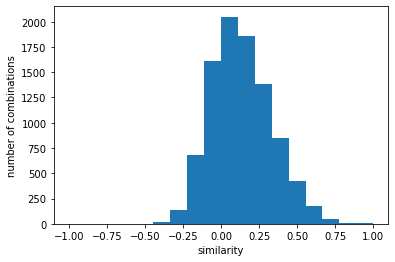

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.626931395463266}
y [   0.    0.    0.    0.    0.   13.  116.  600. 1111. 1274. 1143.  718.
  407.  238.   95.   45.   12.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


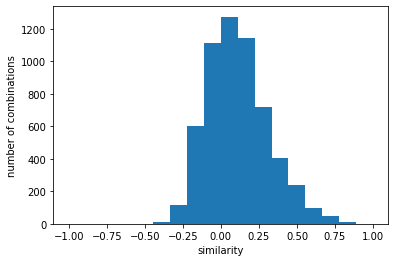

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6413845875065936}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.660e+02
 7.090e+02 1.494e+03 1.889e+03 1.618e+03 1.118e+03 6.490e+02 3.390e+02
 1.530e+02 5.300e+01 1.100e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


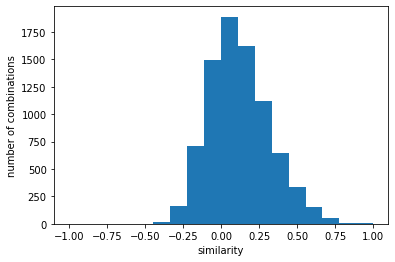

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.623810702936312}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   17.  133.  680. 1288. 1509. 1279.  868.
  568.  277.  129.   32.    6.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


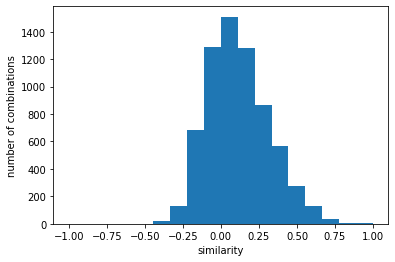

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6366610877819737}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   14.  141.  646. 1253. 1504. 1347.  919.
  517.  289.  133.   45.   17.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


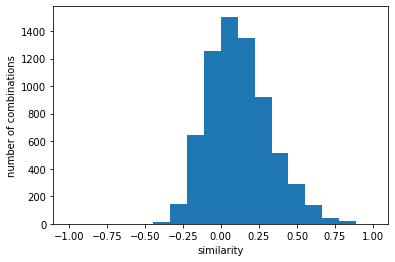

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6402130165929456}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 1.710e+02
 7.240e+02 1.496e+03 1.803e+03 1.456e+03 1.027e+03 6.020e+02 2.960e+02
 1.010e+02 2.300e+01 1.200e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


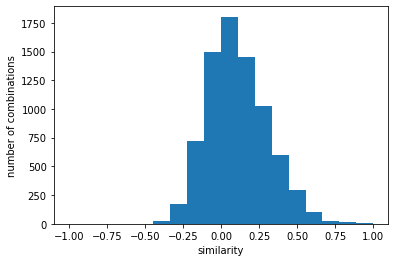

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6076533006719496}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   19.  153.  686. 1244. 1534. 1412.  960.
  513.  262.  129.   49.   14.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


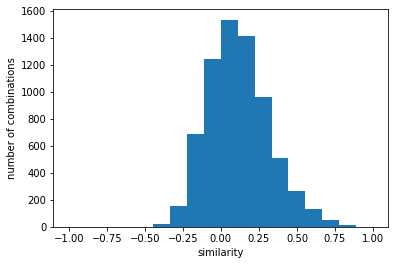

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6389900320588335}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.200e+01 1.100e+02
 5.690e+02 1.146e+03 1.426e+03 1.317e+03 1.025e+03 6.090e+02 3.150e+02
 1.290e+02 4.000e+01 9.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


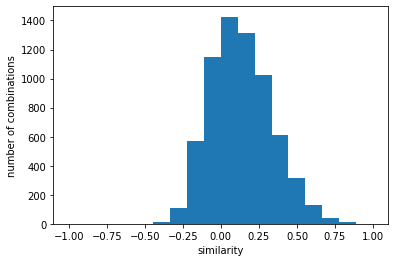

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6217665800347807}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 1.470e+02
 6.850e+02 1.337e+03 1.643e+03 1.394e+03 9.670e+02 6.520e+02 3.230e+02
 1.320e+02 3.500e+01 8.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


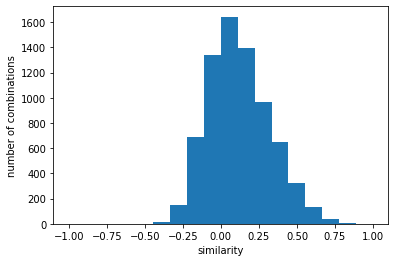

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6742045359030595}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.900e+01 1.630e+02
 7.060e+02 1.467e+03 1.786e+03 1.537e+03 1.089e+03 6.210e+02 2.940e+02
 1.170e+02 3.200e+01 8.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


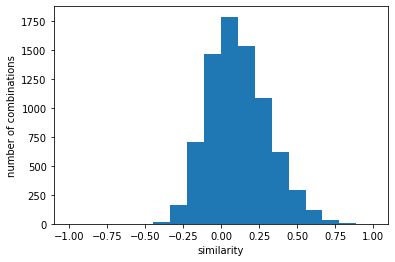

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1基礎製図(0906).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.603773715987268}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.100e+01 9.100e+01
 4.840e+02 9.600e+02 1.248e+03 1.215e+03 8.510e+02 5.560e+02 2.930e+02
 1.240e+02 3.500e+01 9.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


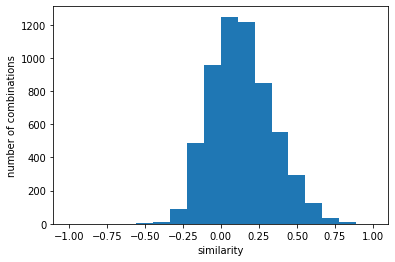

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 'similarity': 0.6214367271415724}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   28.  157.  577. 1248. 1570. 1339.  923.
  533.  278.   92.   25.    4.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


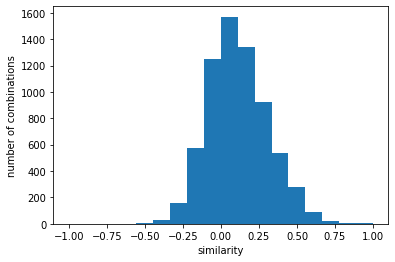

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5905236819727566}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.400e+01 2.520e+02
 9.720e+02 1.910e+03 2.374e+03 1.991e+03 1.324e+03 7.310e+02 3.280e+02
 1.110e+02 3.500e+01 6.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


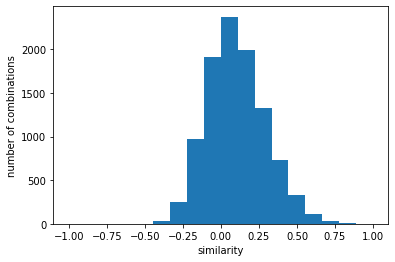

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.5749971444996619}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   34.  207.  812. 1544. 1818. 1660. 1083.
  612.  301.   84.   40.   15.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


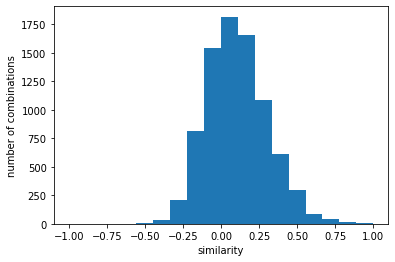

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.6258520405474317}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+00 1.700e+01 2.020e+02
 7.090e+02 1.392e+03 1.750e+03 1.363e+03 9.240e+02 5.760e+02 2.780e+02
 1.160e+02 5.000e+01 1.400e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


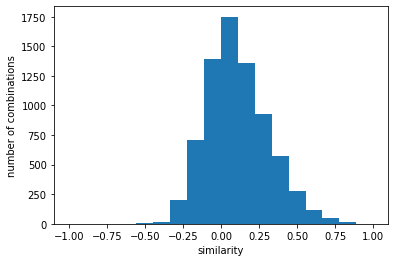

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.6143036945299375}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 1.220e+02
 5.280e+02 1.029e+03 1.269e+03 1.166e+03 7.790e+02 4.520e+02 2.220e+02
 9.200e+01 1.300e+01 3.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


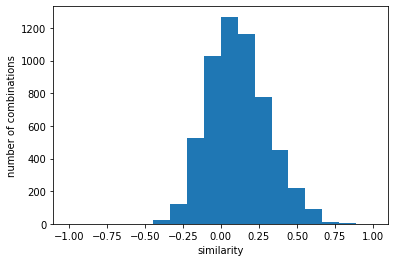

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.6504159366029002}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.800e+01 2.040e+02
 7.250e+02 1.411e+03 1.702e+03 1.416e+03 1.003e+03 5.980e+02 3.000e+02
 1.260e+02 4.300e+01 1.300e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


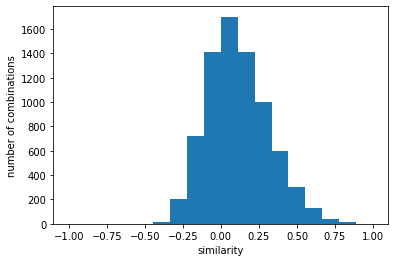

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.632365262001884}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 1.590e+02
 5.440e+02 1.123e+03 1.408e+03 1.350e+03 9.470e+02 5.580e+02 2.960e+02
 9.400e+01 2.800e+01 1.100e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


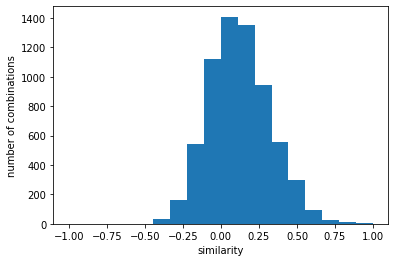

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.623315461047876}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.100e+01 2.300e+02
 8.210e+02 1.446e+03 1.784e+03 1.554e+03 1.113e+03 6.390e+02 3.010e+02
 1.020e+02 3.800e+01 1.500e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


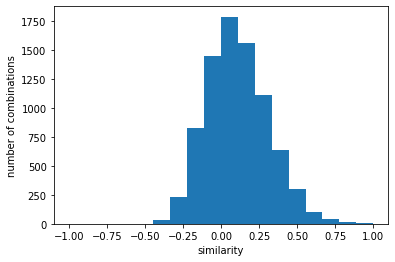

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.6224035954262664}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   12.  159.  716. 1606. 1928. 1630. 1049.
  647.  312.  144.   54.   14.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


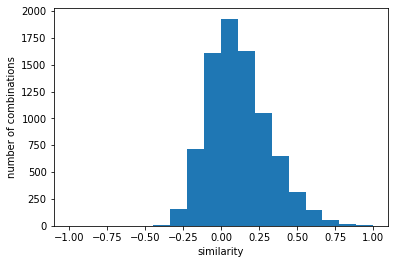

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.5930013497618505}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.800e+01 1.920e+02
 7.030e+02 1.359e+03 1.645e+03 1.406e+03 9.980e+02 5.890e+02 2.980e+02
 1.260e+02 4.400e+01 1.300e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


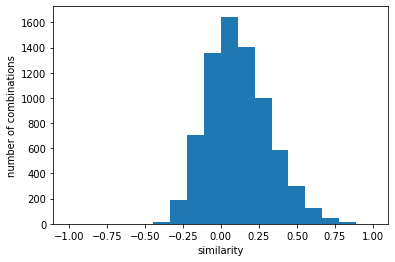

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6293024014321892}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 6.000e+00 2.200e+01 1.220e+02
 4.730e+02 9.790e+02 1.274e+03 1.260e+03 9.000e+02 5.190e+02 2.600e+02
 9.100e+01 2.500e+01 2.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


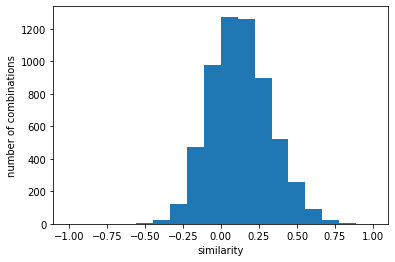

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.6334842087623129}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   17.  155.  740. 1552. 1905. 1670. 1101.
  685.  296.  163.   53.   16.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


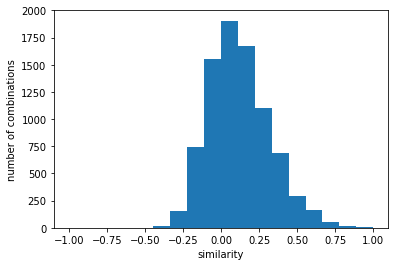

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5858057879870195}
y [0.00e+00 0.00e+00 0.00e+00 0.00e+00 2.00e+00 1.70e+01 9.60e+01 3.77e+02
 7.84e+02 1.03e+03 9.16e+02 6.91e+02 3.51e+02 1.81e+02 7.80e+01 3.40e+01
 2.00e+00 1.00e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


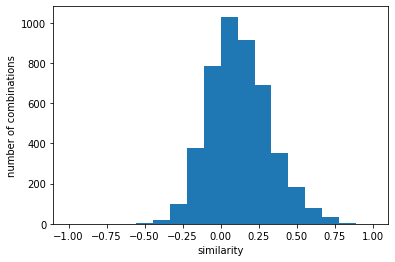

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6442506598470578}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   21.  193.  736. 1548. 1752. 1308.  807.
  509.  243.  105.   40.    8.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


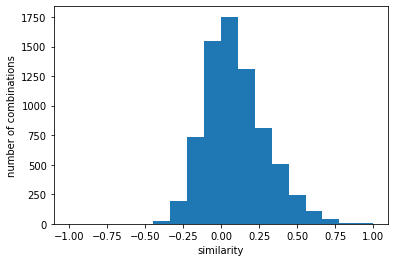

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5515950042644635}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   21.  156.  637. 1302. 1550. 1194.  767.
  495.  249.  108.   40.   10.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


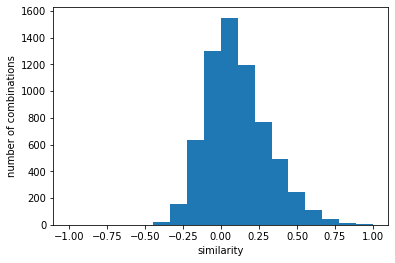

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6066942276314001}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+00 4.000e+01 2.940e+02
 1.159e+03 2.515e+03 2.968e+03 2.562e+03 1.715e+03 9.830e+02 4.660e+02
 1.970e+02 5.600e+01 1.100e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


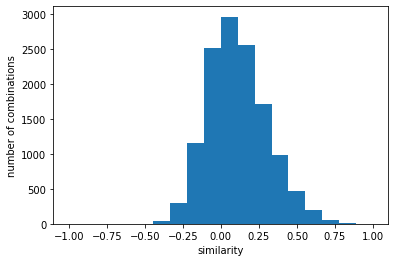

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.571490203505074}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   21.  133.  500. 1034. 1249. 1287.  998.
  620.  303.  116.   34.   11.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


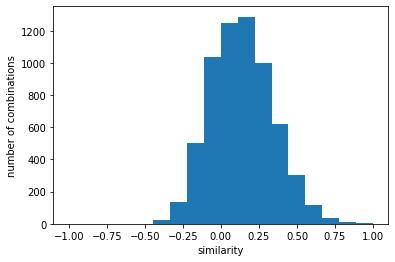

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6416052768869723}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   11.  140.  530. 1013. 1261. 1184.  799.
  454.  218.  124.   65.   19.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


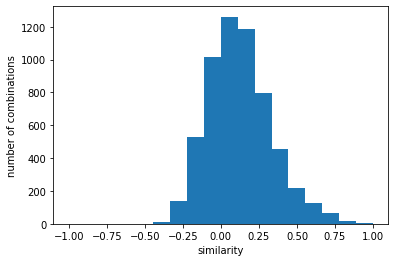

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6348783121302404}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   13.  170.  708. 1414. 1654. 1316.  800.
  482.  236.  106.   38.   11.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


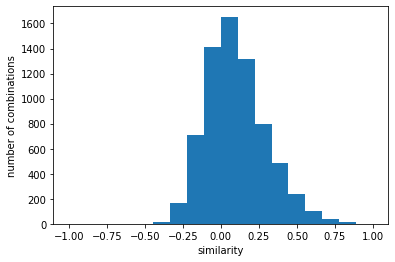

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6060093914977001}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+00 2.400e+01 1.450e+02
 6.200e+02 1.302e+03 1.759e+03 1.506e+03 1.024e+03 6.210e+02 3.440e+02
 1.600e+02 4.900e+01 9.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


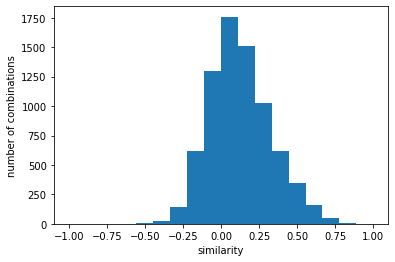

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6120201435213235}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.200e+01 1.200e+02
 5.680e+02 1.305e+03 1.639e+03 1.375e+03 1.090e+03 6.370e+02 2.660e+02
 1.020e+02 3.400e+01 8.000e+00 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


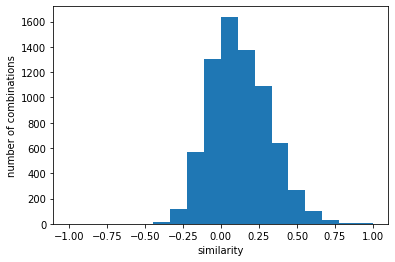

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.65379736835577}
y [   0.    0.    0.    0.    2.   16.  134.  540. 1109. 1343. 1046.  645.
  376.  189.   98.   38.    6.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


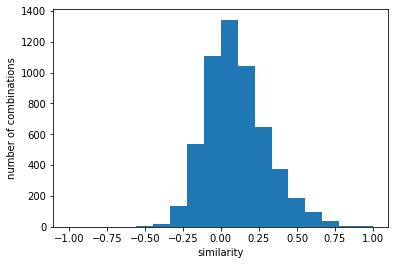

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6236662566405575}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   27.  191.  744. 1453. 1914. 1680. 1124.
  650.  359.  161.   52.    9.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


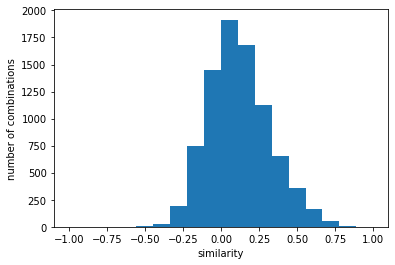

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6023812913150038}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   18.  135.  597. 1176. 1412. 1223.  799.
  433.  244.  142.   47.    6.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


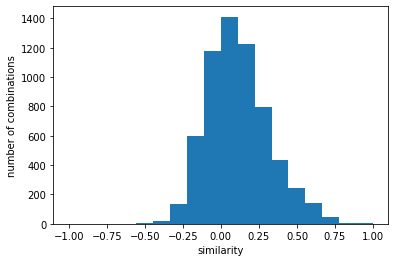

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6293469833275563}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   16.  177.  722. 1454. 1708. 1404.  909.
  518.  272.  155.   37.   11.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


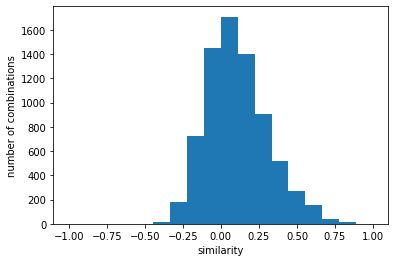

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.605340219300439}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   45.  199.  793. 1497. 1708. 1381.  861.
  436.  236.   95.   34.   11.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


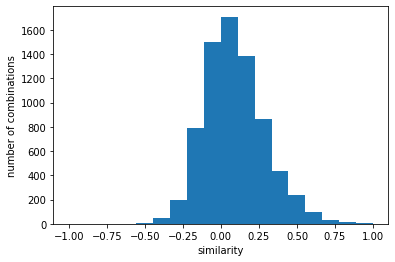

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6032436698253539}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   18.  197.  754. 1553. 1796. 1457.  941.
  549.  287.  131.   39.   14.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


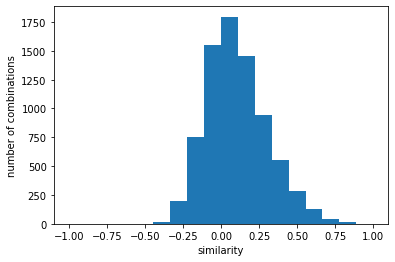

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6000912499623982}
y [   0.    0.    0.    0.    2.   15.  114.  498. 1017. 1143. 1082.  879.
  508.  281.  132.   45.    9.    2.]
ind

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


 [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


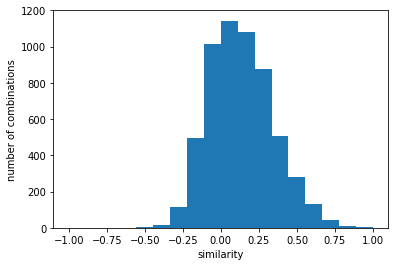

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6256515221515091}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   14.  139.  625. 1231. 1586. 1375.  923.
  538.  321.  159.   53.    4.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


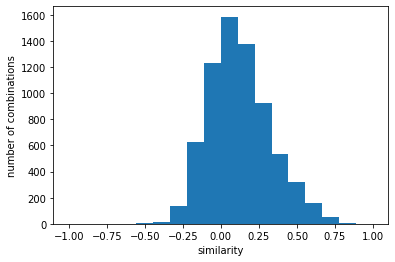

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6647291769866914}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 1.570e+02
 6.400e+02 1.328e+03 1.648e+03 1.391e+03 8.800e+02 5.630e+02 2.640e+02
 1.130e+02 3.200e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


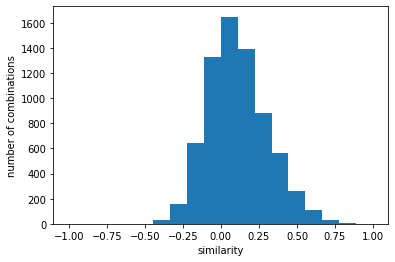

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1電気基礎Ⅰ(2085).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6035931747348386}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 1.390e+02
 6.170e+02 1.335e+03 1.535e+03 1.344e+03 1.091e+03 6.590e+02 3.240e+02
 1.140e+02 2.900e+01 7.000e+00 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


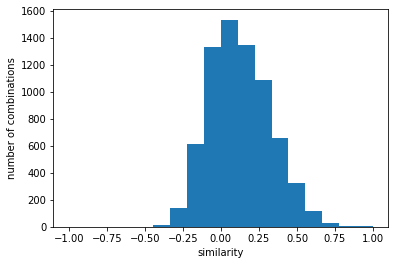

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 'similarity': 0.5902664179077821}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.490e+02
 7.070e+02 1.481e+03 1.843e+03 1.620e+03 1.192e+03 7.450e+02 2.970e+02
 1.230e+02 3.600e+01 5.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


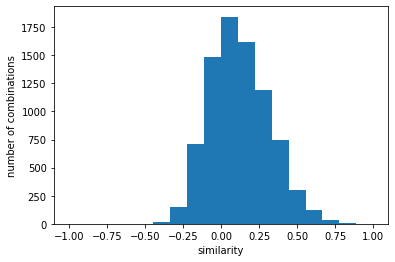

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.624949888328131}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.700e+02
 7.670e+02 1.667e+03 1.864e+03 1.509e+03 1.208e+03 6.210e+02 2.830e+02
 1.020e+02 2.600e+01 4.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


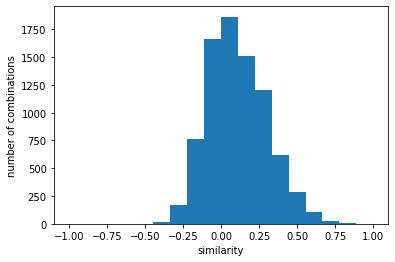

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.6289435026450083}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.500e+01 1.500e+02
 5.540e+02 1.281e+03 1.519e+03 1.217e+03 8.310e+02 4.950e+02 2.950e+02
 1.270e+02 3.600e+01 4.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


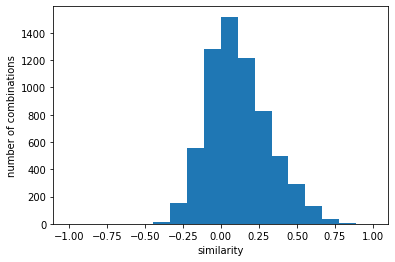

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.639378442395366}
y [  0.   0.   0.   0.   0.   6.  42. 169. 349. 523. 573. 453. 267. 154.
  65.  17.   2.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


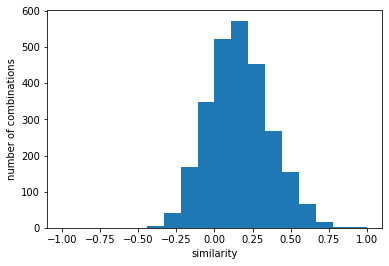

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.7806707069931591}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.700e+01 1.430e+02
 6.020e+02 1.333e+03 1.619e+03 1.306e+03 8.310e+02 4.970e+02 2.880e+02
 1.170e+02 3.100e+01 4.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


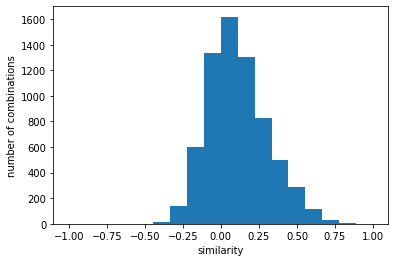

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6462753013678103}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.200e+01 1.150e+02
 4.570e+02 1.040e+03 1.309e+03 1.245e+03 8.800e+02 5.730e+02 2.850e+02
 1.060e+02 3.500e+01 9.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


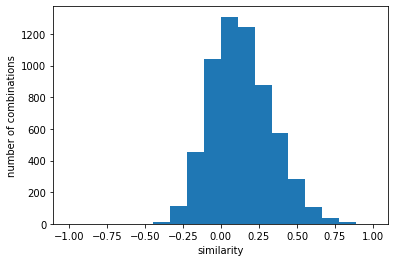

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6626315313397134}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 2.200e+01 2.150e+02
 8.300e+02 1.584e+03 1.854e+03 1.731e+03 1.262e+03 8.240e+02 4.530e+02
 2.160e+02 7.400e+01 2.100e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


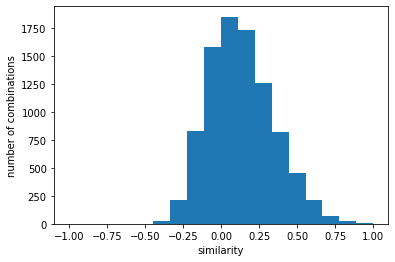

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.6009098412841215}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   17.  152.  646. 1444. 1631. 1284.  924.
  579.  335.  140.   37.    7.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


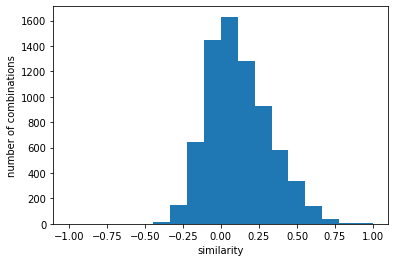

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6176487366960813}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.700e+01 1.380e+02
 5.930e+02 1.280e+03 1.544e+03 1.272e+03 8.050e+02 5.150e+02 3.000e+02
 1.370e+02 3.400e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


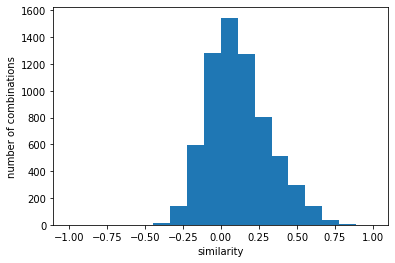

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6487387234027194}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.100e+01 1.040e+02
 5.340e+02 1.164e+03 1.410e+03 1.365e+03 1.085e+03 6.570e+02 3.190e+02
 1.180e+02 3.000e+01 5.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


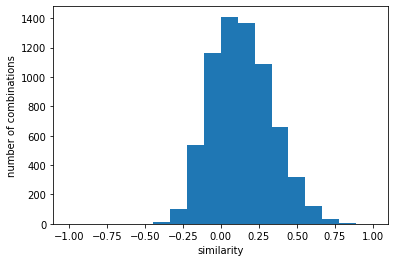

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.60583815019935}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.900e+01 1.520e+02
 6.300e+02 1.448e+03 1.666e+03 1.358e+03 9.270e+02 5.940e+02 3.130e+02
 1.430e+02 3.600e+01 6.000e+00 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


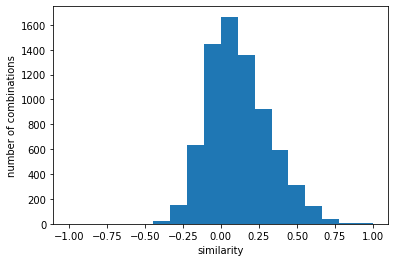

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6084523517185949}
y [  0.   0.   0.   0.   0.   8.  85. 312. 741. 872. 811. 602. 374. 197.
 110.  18.   8.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


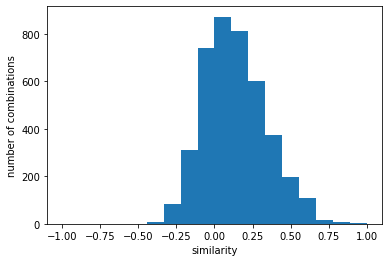

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6729403592486525}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 1.170e+02
 6.350e+02 1.330e+03 1.317e+03 9.350e+02 5.830e+02 4.510e+02 2.390e+02
 1.110e+02 2.200e+01 4.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


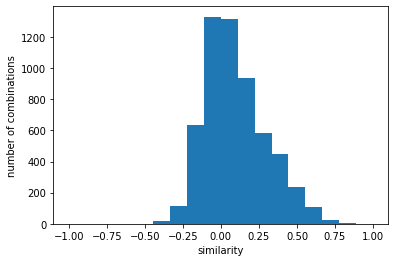

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6194724358940101}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 1.420e+02
 6.060e+02 1.295e+03 1.399e+03 1.163e+03 8.150e+02 5.210e+02 2.730e+02
 1.220e+02 3.100e+01 7.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


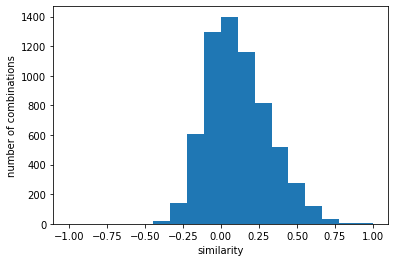

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6352040787979926}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   17.  222.  926. 2049. 2366. 2241. 1652.
  954.  546.  223.   52.   11.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


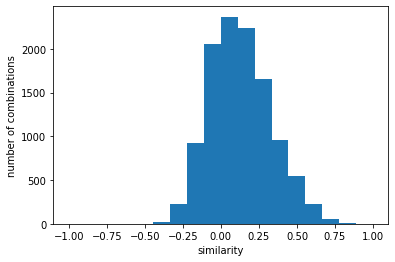

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.6287275382856936}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.190e+02
 4.770e+02 1.077e+03 1.324e+03 1.283e+03 9.830e+02 6.660e+02 3.170e+02
 1.490e+02 4.300e+01 1.400e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


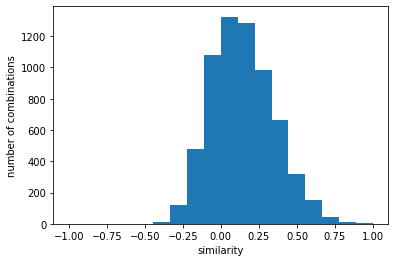

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6412409045108074}
y [  0.   0.   0.   0.   0.  14.  96. 449. 754. 837. 791. 666. 448. 253.
 145.  80.  19.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


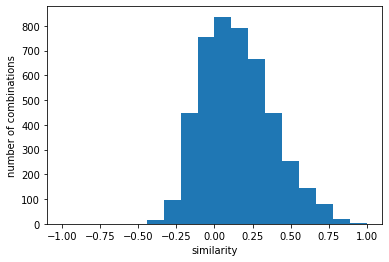

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6885590497642086}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.800e+01 1.420e+02
 6.250e+02 1.360e+03 1.593e+03 1.259e+03 7.620e+02 4.440e+02 2.670e+02
 1.400e+02 2.400e+01 1.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


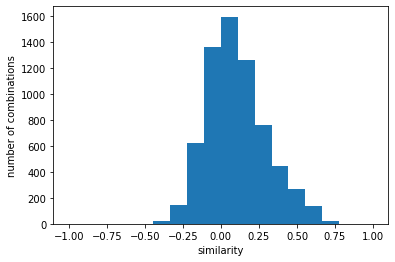

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6172445417836415}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.600e+01 9.200e+01
 3.420e+02 7.720e+02 1.007e+03 8.690e+02 6.890e+02 4.330e+02 2.860e+02
 1.480e+02 5.800e+01 1.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


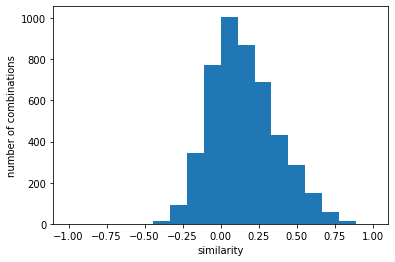

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.7022233600708541}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   19.  116.  583. 1319. 1776. 1598. 1176.
  712.  441.  221.   72.   18.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


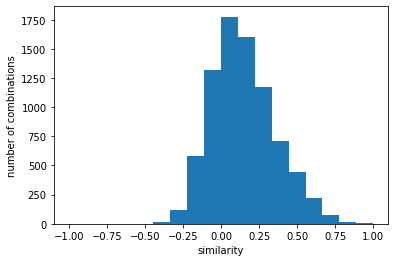

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.6499017873317324}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.200e+02
 4.870e+02 1.139e+03 1.297e+03 1.060e+03 6.440e+02 3.780e+02 2.030e+02
 1.000e+02 2.200e+01 4.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


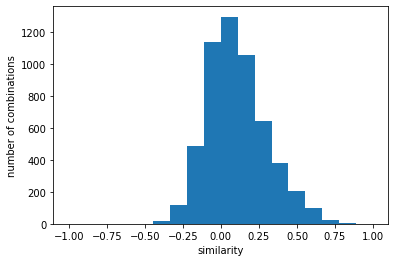

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6304970555147014}
y [   0.    0.    0.    0.    0.   15.  107.  462.  955. 1141. 1003.  789.
  480.  309.  153.   49.   13.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


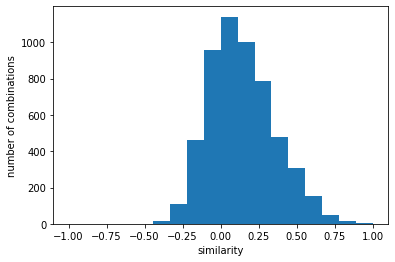

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6872128036641133}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+01 8.900e+01
 4.490e+02 9.200e+02 1.182e+03 9.810e+02 7.270e+02 4.130e+02 2.510e+02
 1.770e+02 6.700e+01 2.600e+01 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


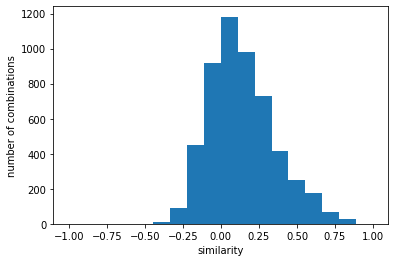

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6979638545534105}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.100e+01 1.590e+02
 5.970e+02 1.342e+03 1.645e+03 1.293e+03 8.190e+02 4.990e+02 3.190e+02
 1.530e+02 2.400e+01 1.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


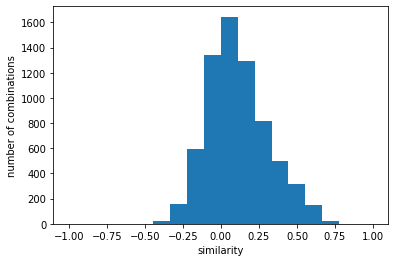

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6204134224259662}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 1.960e+02
 7.400e+02 1.454e+03 1.700e+03 1.368e+03 1.009e+03 5.430e+02 2.500e+02
 1.170e+02 3.500e+01 9.000e+00 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


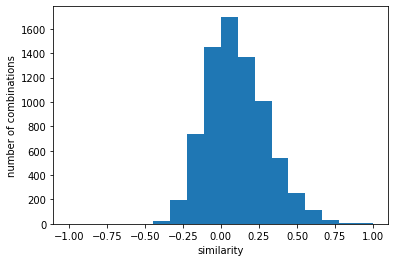

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6202141973655364}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.100e+01 1.360e+02
 6.090e+02 1.382e+03 1.672e+03 1.362e+03 8.630e+02 5.140e+02 2.940e+02
 1.480e+02 2.300e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


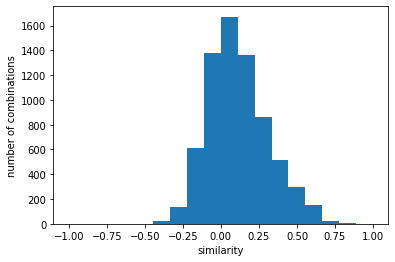

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6206913055245137}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.000e+02
 4.400e+02 8.990e+02 1.114e+03 1.082e+03 8.120e+02 5.280e+02 3.430e+02
 2.150e+02 6.500e+01 1.000e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


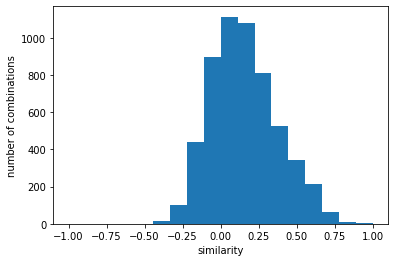

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6653232581436022}
y [   0.    0.    0.    0.    2.   11.  100.  485.  935. 1229. 1110.  839.
  519.  307.  188.   75.   26.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


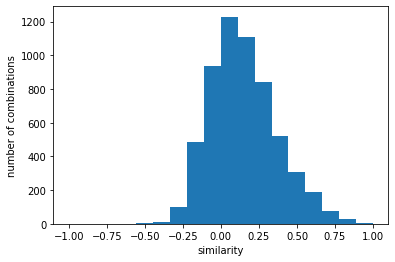

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.7075948592876249}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.400e+01 8.000e+01
 3.260e+02 7.730e+02 1.058e+03 9.230e+02 6.680e+02 4.150e+02 2.070e+02
 1.010e+02 2.700e+01 6.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


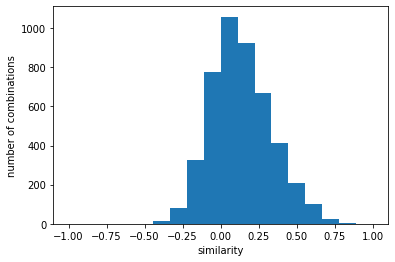

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2エネルギー物理学Ⅰ(0232).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.7078124192963983}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 2.420e+02
 9.290e+02 2.040e+03 2.350e+03 2.019e+03 1.401e+03 8.220e+02 4.150e+02
 1.480e+02 4.900e+01 2.700e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


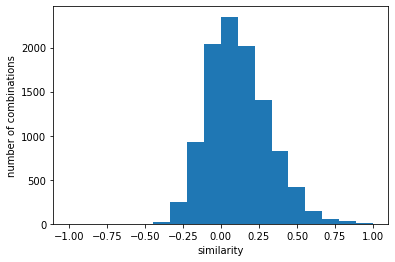

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 'similarity': 0.5640293520866765}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   27.  177.  637. 1308. 1590. 1211.  724.
  448.  277.   96.   42.   15.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


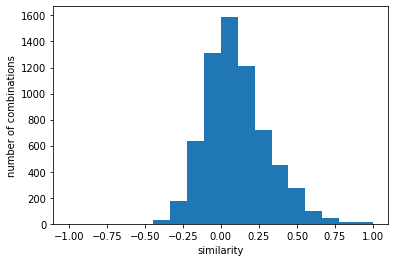

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.6642473205160533}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+00 3.600e+01 2.710e+02
 8.830e+02 1.748e+03 2.187e+03 1.548e+03 1.124e+03 7.550e+02 3.560e+02
 1.510e+02 5.700e+01 7.000e+00 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


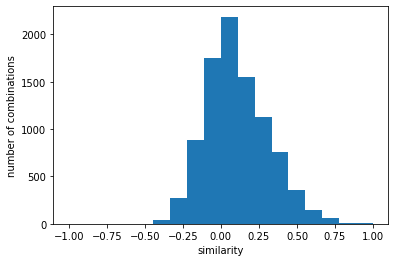

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.5700214644534382}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   20.  193.  724. 1496. 1725. 1470. 1039.
  619.  313.  110.   35.    9.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


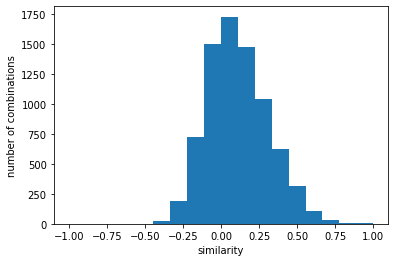

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5972928288289697}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.200e+01 2.450e+02
 8.110e+02 1.614e+03 2.081e+03 1.628e+03 1.150e+03 7.410e+02 3.480e+02
 1.360e+02 5.400e+01 8.000e+00 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


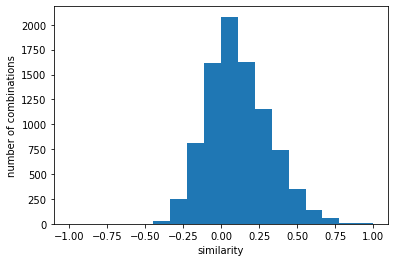

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.5948814346134972}
y [   0.    0.    0.    0.    0.   16.  126.  498. 1086. 1303. 1099.  752.
  560.  262.  122.   39.   13.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


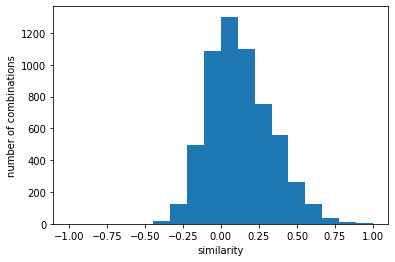

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6604608789452024}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   47.  252.  832. 1666. 1893. 1677. 1202.
  789.  411.  169.   56.   18.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


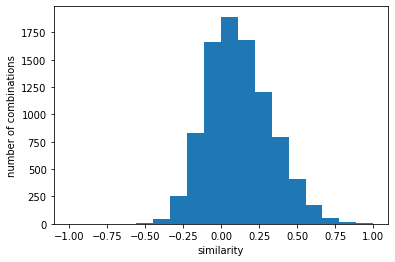

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.6016716942621578}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   28.  220.  703. 1576. 1795. 1311.  920.
  613.  300.  119.   59.   23.   13.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


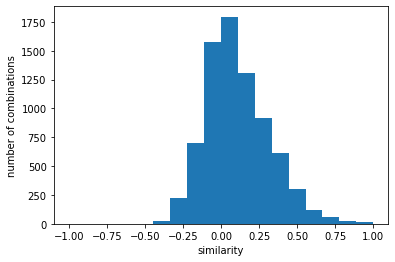

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6022496298679536}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.900e+01 2.600e+02
 8.440e+02 1.687e+03 2.124e+03 1.615e+03 1.150e+03 7.550e+02 3.740e+02
 1.520e+02 5.400e+01 8.000e+00 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


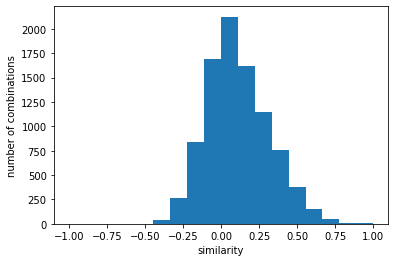

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.5861330377709947}
y [ 0.  0.  0.  0.  0.  0.  1.  3. 17. 18. 18. 10. 13.  0.  4. 12.  4.  8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


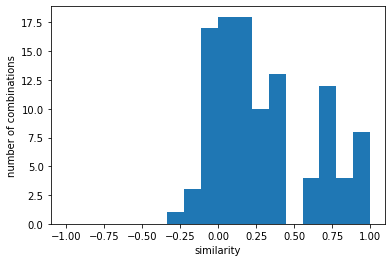

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.9613027773448266}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   21.  198.  754. 1688. 1978. 1536. 1090.
  665.  323.  156.   69.   25.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


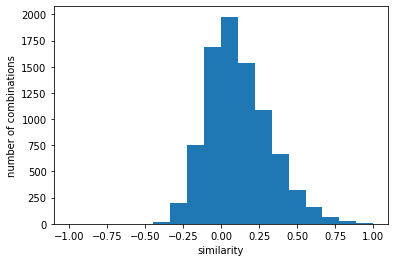

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5775580461103239}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   23.  119.  522. 1205. 1368. 1026.  774.
  437.  233.   96.   30.    6.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


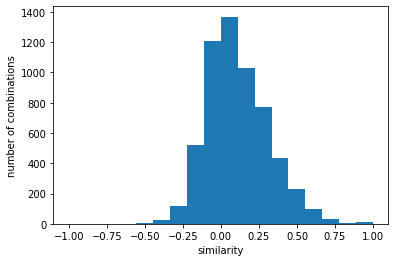

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6075269150052147}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   33.  217.  751. 1754. 1841. 1180.  769.
  546.  310.   98.   35.   11.   23.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


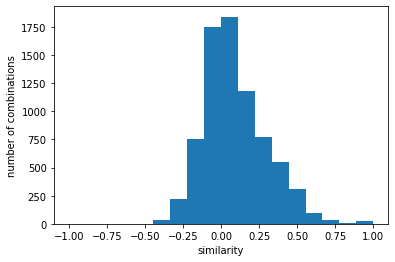

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.558090522136878}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   24.  150.  580. 1300. 1496. 1053.  726.
  479.  252.   95.   28.   23.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


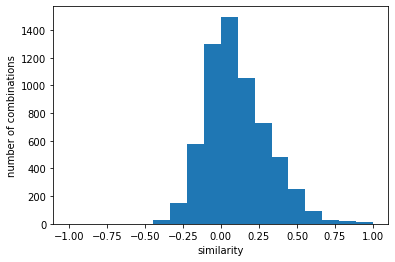

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6334469070086778}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   33.  240.  934. 2001. 2455. 2162. 1665.
  994.  516.  215.   66.    9.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


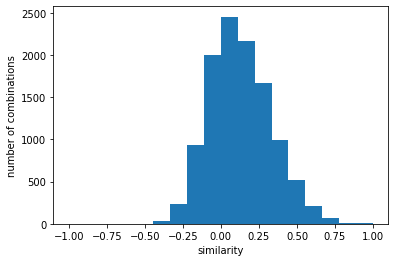

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.6144676420159347}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   21.  139.  505. 1138. 1361. 1092.  765.
  561.  311.  140.   50.   23.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


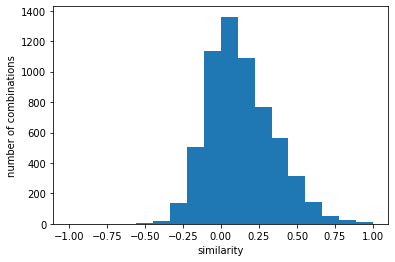

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6463452132842901}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+00 2.800e+01 1.950e+02
 6.350e+02 1.326e+03 1.522e+03 1.256e+03 9.020e+02 6.210e+02 2.800e+02
 1.180e+02 4.700e+01 7.000e+00 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


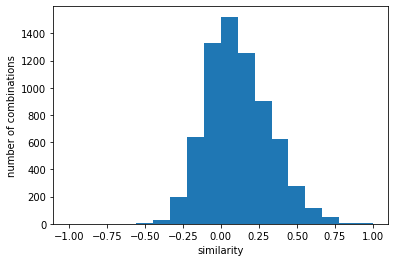

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6034883141079123}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   29.  203.  753. 1573. 1876. 1461.  988.
  593.  289.  133.   53.   19.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


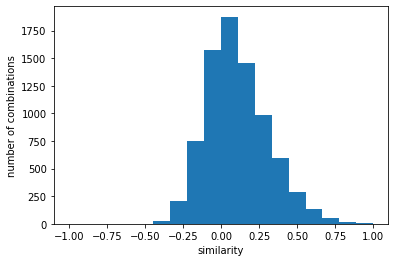

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.5834250451361636}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   27.  192.  750. 1734. 2070. 1674. 1179.
  726.  380.  127.   45.   24.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


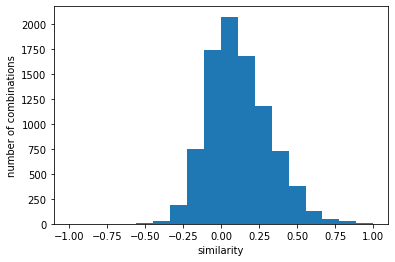

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5733766153238349}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.400e+01 1.650e+02
 8.160e+02 1.826e+03 2.167e+03 1.917e+03 1.443e+03 9.810e+02 4.790e+02
 1.980e+02 5.700e+01 1.000e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


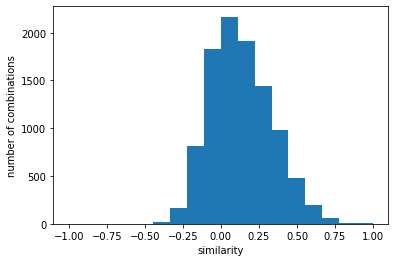

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.587737203282712}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   21.  164.  590. 1289. 1464. 1078.  694.
  427.  227.   84.   29.    9.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


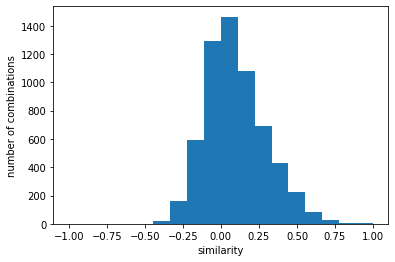

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6115784711702746}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   25.  202.  836. 1810. 2214. 1888. 1329.
  816.  424.  149.   43.   17.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


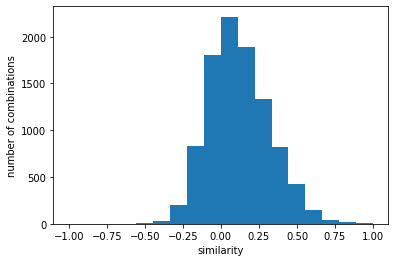

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5669003823076321}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   18.  141.  591. 1239. 1501. 1293.  892.
  521.  297.  108.   25.    5.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


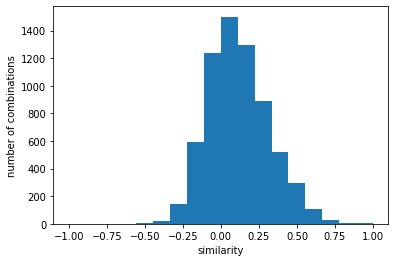

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6368949362168442}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   23.  181.  739. 1548. 1867. 1433.  990.
  566.  322.  131.   43.   18.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


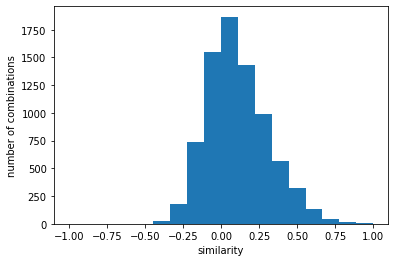

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5937104323436919}
y [   0.    0.    0.    0.    2.   15.   88.  345.  821. 1005.  708.  467.
  306.  170.   80.   46.   25.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


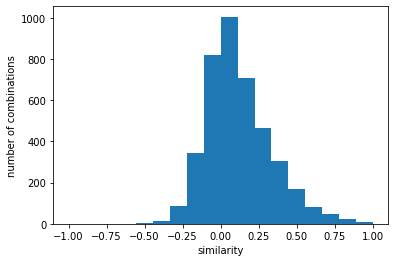

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.7251887007458766}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  213.  762. 1523. 1863. 1436.  966.
  588.  286.  127.   41.   17.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


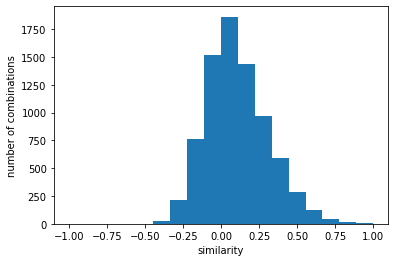

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5966558724028174}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+00 1.280e+02
 5.700e+02 1.345e+03 1.558e+03 1.348e+03 1.095e+03 7.380e+02 4.040e+02
 1.380e+02 3.800e+01 1.000e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


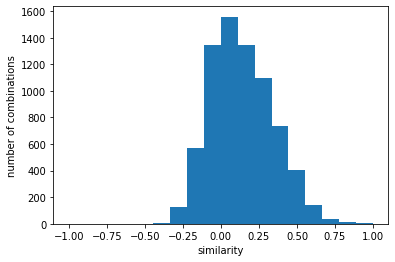

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6019162532414616}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   22.  175.  684. 1503. 1821. 1571. 1108.
  668.  362.  132.   35.    8.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


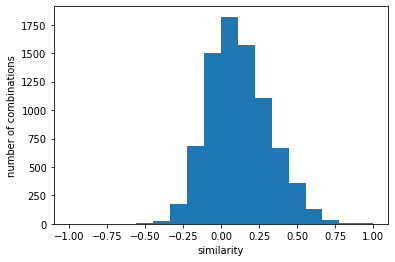

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6340299050403203}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   17.  178.  716. 1634. 1997. 1670. 1249.
  777.  361.  120.   30.   15.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


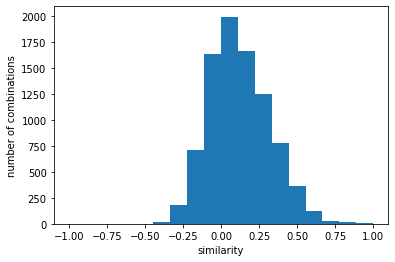

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2コンピュータグラフィックス（2145）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5800687593887102}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.400e+01 3.170e+02
 1.170e+03 2.190e+03 2.422e+03 2.057e+03 1.405e+03 8.510e+02 4.390e+02
 1.670e+02 5.300e+01 1.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


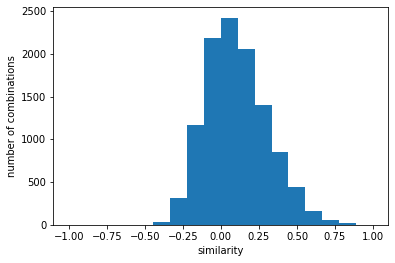

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 'similarity': 0.5801408779587933}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.600e+01 3.080e+02
 1.104e+03 2.190e+03 2.537e+03 2.017e+03 1.418e+03 8.720e+02 3.850e+02
 1.410e+02 5.100e+01 2.300e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


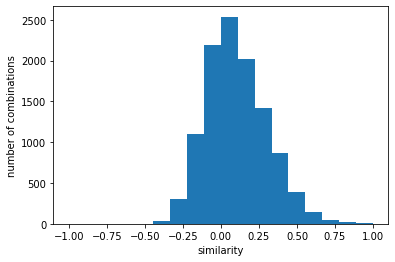

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.5425182575494963}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   18.  188.  719. 1472. 1773. 1511. 1058.
  577.  235.  105.   37.    2.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


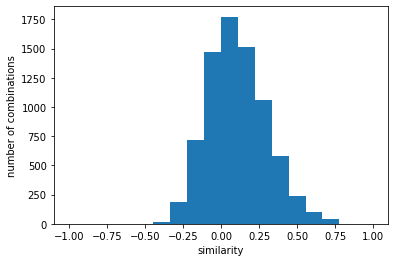

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.6104848847356945}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.900e+01 3.170e+02
 1.171e+03 2.294e+03 2.627e+03 2.155e+03 1.470e+03 9.090e+02 3.690e+02
 1.240e+02 5.100e+01 1.800e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


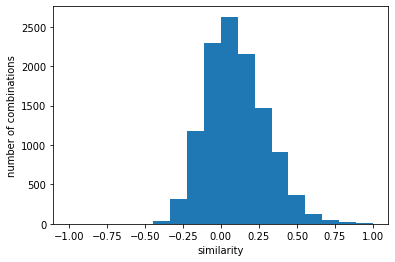

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.5487657496421686}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+00 3.100e+01 2.550e+02
 9.520e+02 2.020e+03 2.526e+03 2.177e+03 1.569e+03 9.130e+02 4.020e+02
 1.430e+02 5.300e+01 1.100e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


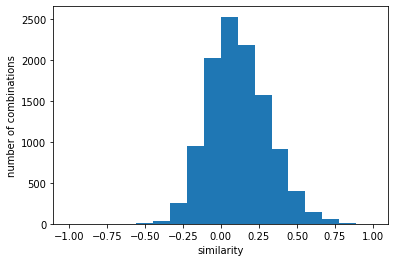

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.5319929788163403}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+00 4.900e+01 4.280e+02
 1.353e+03 2.530e+03 3.241e+03 2.693e+03 1.878e+03 1.112e+03 4.880e+02
 1.840e+02 6.100e+01 1.200e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


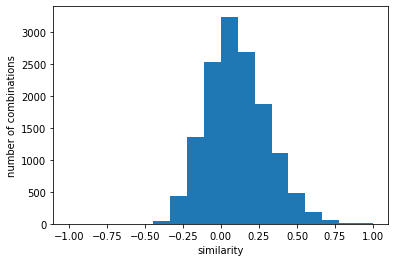

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5113899198432702}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   29.  272. 1058. 2087. 2489. 1940. 1306.
  739.  324.  126.   58.   19.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


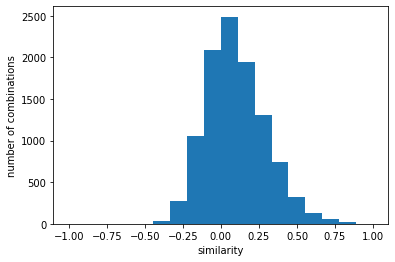

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.5482887914811583}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.500e+01 3.330e+02
 1.231e+03 2.332e+03 2.691e+03 2.231e+03 1.530e+03 9.300e+02 4.160e+02
 1.500e+02 5.800e+01 2.500e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


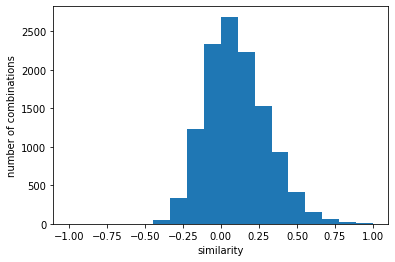

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.538881612228961}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.900e+01 2.150e+02
 8.280e+02 1.803e+03 2.063e+03 1.925e+03 1.354e+03 8.130e+02 3.890e+02
 1.450e+02 4.200e+01 8.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


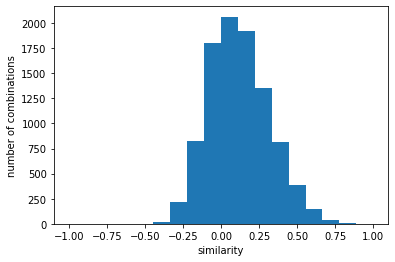

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.54373575068877}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.300e+01 2.280e+02
 9.630e+02 1.942e+03 2.582e+03 2.123e+03 1.458e+03 8.200e+02 3.640e+02
 1.500e+02 5.500e+01 2.200e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


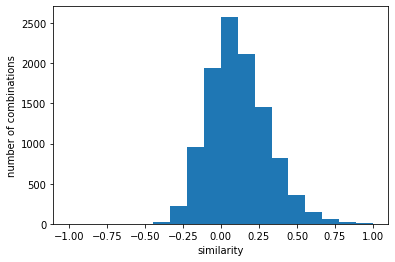

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5426676447630142}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   14.  187.  869. 1700. 2029. 1699. 1246.
  725.  272.  143.   38.    5.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


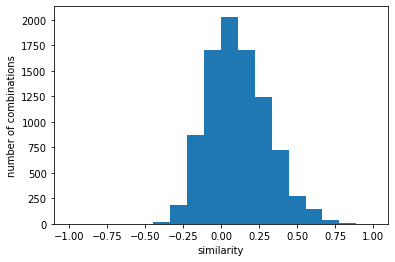

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5434793019476277}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.900e+01 3.430e+02
 1.217e+03 2.360e+03 2.482e+03 1.735e+03 1.108e+03 6.790e+02 2.980e+02
 1.060e+02 4.700e+01 2.100e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


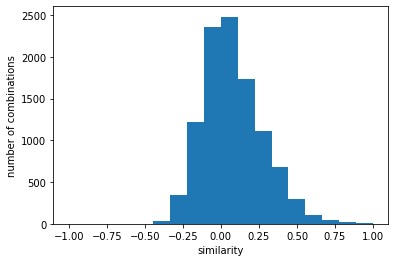

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.48712445426528983}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 2.610e+02
 1.033e+03 2.084e+03 2.425e+03 1.969e+03 1.308e+03 7.690e+02 3.220e+02
 1.230e+02 4.800e+01 1.900e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


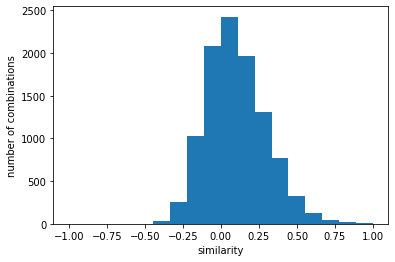

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.526646894388237}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.200e+01 4.240e+02
 1.608e+03 3.378e+03 3.945e+03 3.327e+03 2.131e+03 1.154e+03 4.760e+02
 1.780e+02 4.700e+01 3.200e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


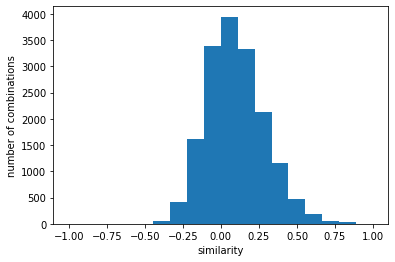

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5222816397342153}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.400e+01 2.610e+02
 9.240e+02 1.953e+03 2.489e+03 2.201e+03 1.616e+03 9.630e+02 4.440e+02
 2.000e+02 6.200e+01 1.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


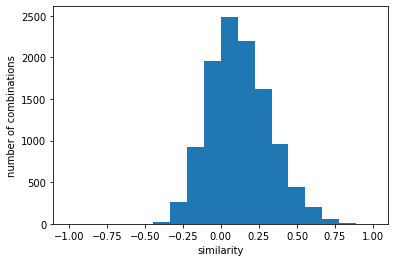

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.541323905404457}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+00 4.200e+01 3.020e+02
 1.168e+03 2.224e+03 2.563e+03 2.147e+03 1.456e+03 8.460e+02 3.670e+02
 1.430e+02 4.400e+01 2.100e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


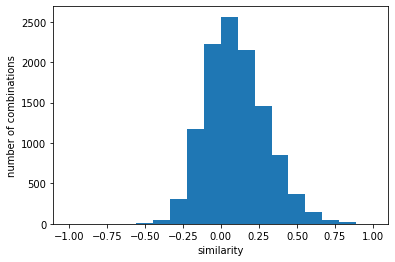

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5168862221066876}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 2.830e+02
 1.076e+03 2.088e+03 2.463e+03 1.996e+03 1.317e+03 7.400e+02 3.130e+02
 1.380e+02 4.000e+01 2.100e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


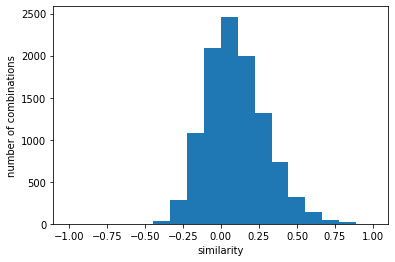

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.5351198938422955}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  201.  784. 1741. 2233. 1906. 1297.
  783.  323.  114.   44.   12.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


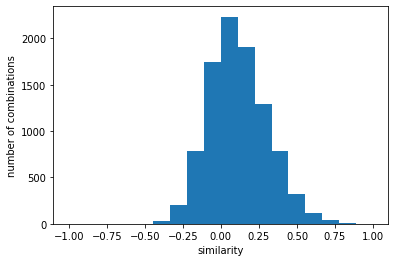

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5796680667698582}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   43.  289. 1201. 2621. 3382. 2801. 1921.
 1082.  437.  177.   58.   18.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


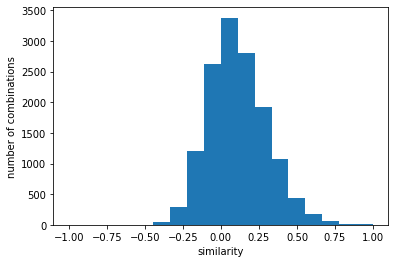

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.528987499302265}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.100e+01 2.190e+02
 8.660e+02 1.769e+03 2.090e+03 1.668e+03 1.157e+03 6.670e+02 2.800e+02
 1.060e+02 4.500e+01 1.700e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


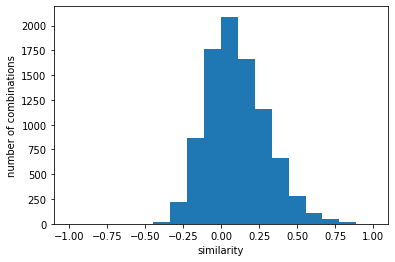

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.5497050185599323}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  199.  818. 1745. 2185. 1725. 1254.
  755.  310.  134.   39.   11.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


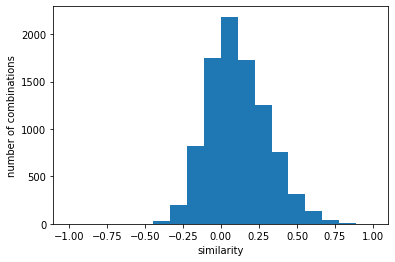

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5950646339792897}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   21.  267. 1042. 2109. 2608. 2116. 1493.
  838.  371.  158.   50.    6.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


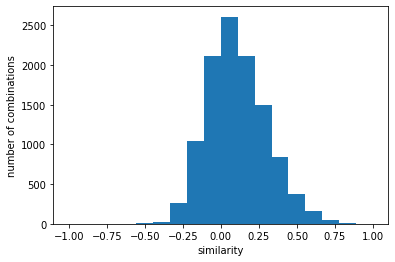

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5346502270294168}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 2.940e+02
 1.083e+03 2.082e+03 2.564e+03 2.013e+03 1.386e+03 8.150e+02 3.590e+02
 1.440e+02 5.400e+01 2.000e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


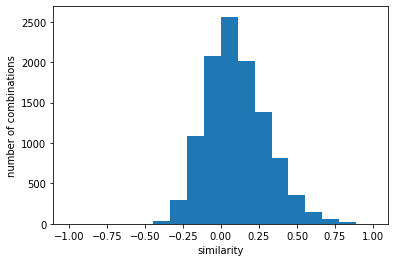

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5380646713036388}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   32.  329. 1078. 1945. 2348. 1968. 1327.
  751.  359.  154.   43.   13.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


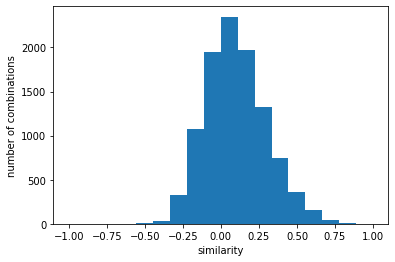

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5443410991762712}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.500e+01 3.010e+02
 1.061e+03 2.123e+03 2.562e+03 2.100e+03 1.458e+03 8.340e+02 3.800e+02
 1.410e+02 5.400e+01 2.100e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


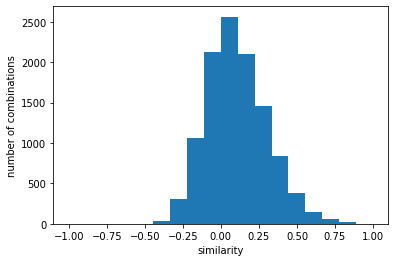

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.539264684530108}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.500e+01 2.280e+02
 9.090e+02 1.930e+03 2.491e+03 2.168e+03 1.515e+03 9.260e+02 3.710e+02
 1.400e+02 5.000e+01 8.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


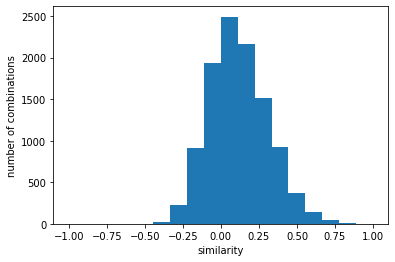

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5208020900967137}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   29.  304. 1109. 2319. 2936. 2506. 1736.
 1002.  435.  193.   58.    8.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


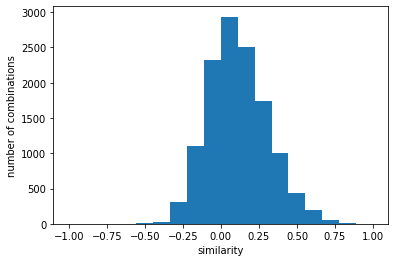

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5606580539359165}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 1.310e+02
 5.560e+02 1.196e+03 1.605e+03 1.397e+03 1.125e+03 7.440e+02 2.880e+02
 1.420e+02 4.200e+01 8.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


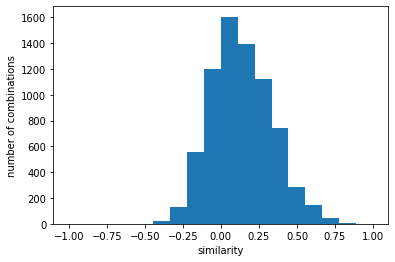

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_1物理学概説(0230).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6206827211048628}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.600e+01 3.060e+02
 1.097e+03 2.125e+03 2.275e+03 1.785e+03 1.246e+03 7.890e+02 3.690e+02
 1.780e+02 7.500e+01 2.700e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


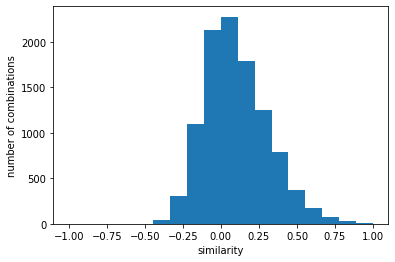

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 'similarity': 0.5578848616721367}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 2.400e+02
 8.310e+02 1.770e+03 1.993e+03 1.682e+03 1.210e+03 6.410e+02 2.970e+02
 1.080e+02 3.500e+01 6.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


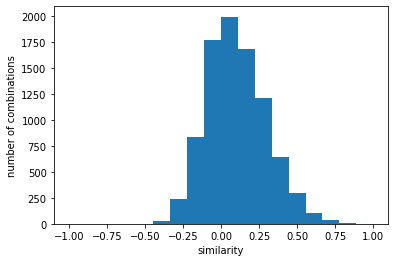

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.5849130198072974}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.000e+01 3.000e+02
 1.041e+03 1.896e+03 2.153e+03 1.908e+03 1.263e+03 7.630e+02 3.550e+02
 1.630e+02 6.500e+01 2.600e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


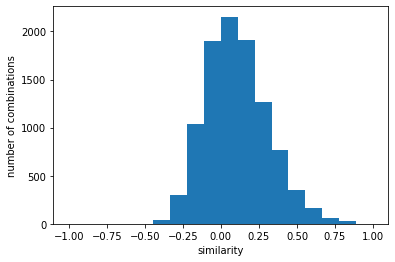

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.5832449490595766}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   28.  170.  618. 1304. 1494. 1296.  826.
  565.  270.  127.   46.   16.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


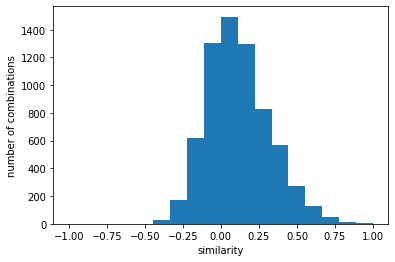

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6218488005299122}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    7.   49.  411. 1260. 2185. 2532. 2119. 1376.
  800.  435.  172.   57.   17.   13.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


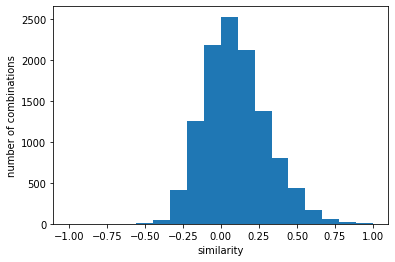

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5549456825611566}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.100e+01 2.600e+02
 9.890e+02 1.909e+03 2.228e+03 1.698e+03 1.037e+03 6.140e+02 3.020e+02
 1.520e+02 5.900e+01 2.400e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


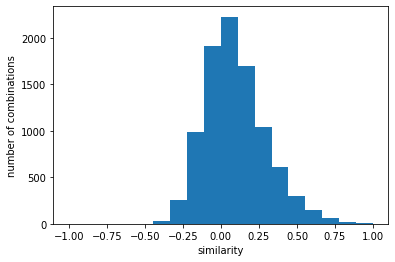

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.5708778749569845}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.400e+01 3.080e+02
 1.024e+03 1.872e+03 2.133e+03 1.860e+03 1.284e+03 7.810e+02 3.750e+02
 1.820e+02 7.200e+01 2.500e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


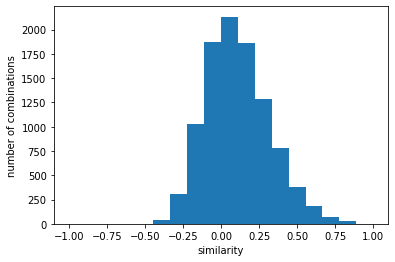

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.581433235123859}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   23.  146.  522. 1051. 1300. 1078.  663.
  410.  251.   83.   34.   15.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


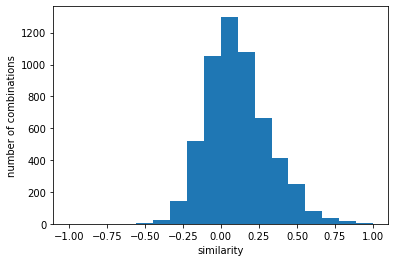

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.6296664991856952}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.800e+01 2.290e+02
 9.860e+02 1.826e+03 2.127e+03 1.670e+03 1.104e+03 6.200e+02 3.230e+02
 1.630e+02 7.400e+01 2.500e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


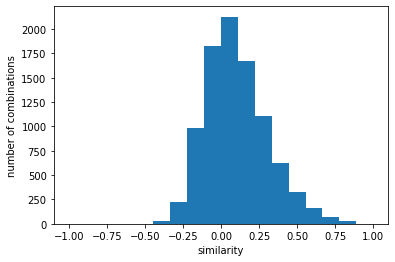

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5693770664245896}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   23.  159.  662. 1369. 1477. 1284.  898.
  470.  244.  123.   36.    7.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


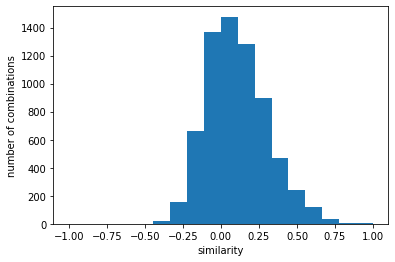

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5894420162868783}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.300e+01 2.060e+02
 8.930e+02 1.742e+03 1.652e+03 1.196e+03 8.470e+02 4.720e+02 2.480e+02
 1.270e+02 6.000e+01 5.400e+01 2.900e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


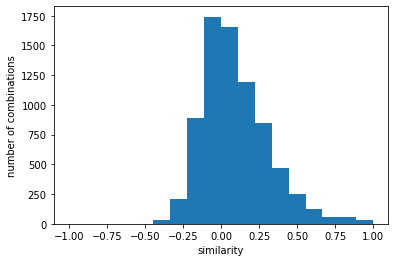

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5550578072243166}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   42.  230.  903. 1715. 1896. 1470.  948.
  565.  311.  140.   48.   22.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


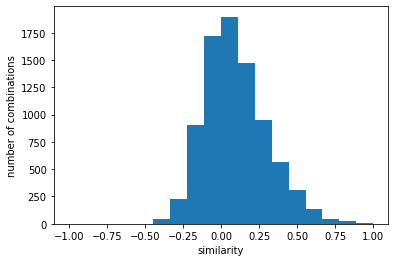

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.5690930668814417}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 5.000e+00 5.200e+01 4.560e+02
 1.548e+03 3.165e+03 3.458e+03 2.841e+03 1.875e+03 9.930e+02 5.190e+02
 1.760e+02 6.700e+01 2.400e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


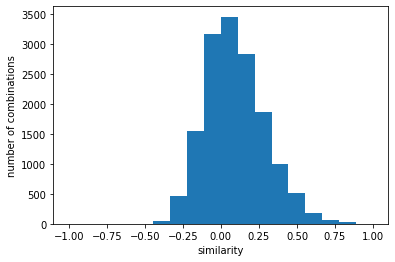

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5491563814885213}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   23.  155.  584. 1096. 1315. 1197.  887.
  549.  284.  167.   60.   22.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


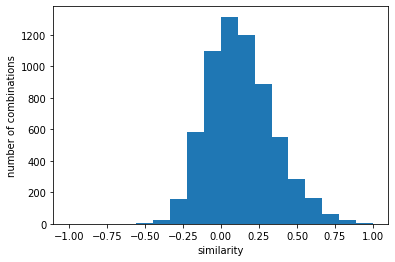

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6442034154911073}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 8.000e+00 3.300e+01 2.410e+02
 8.600e+02 1.503e+03 1.610e+03 1.345e+03 9.220e+02 5.200e+02 2.760e+02
 7.800e+01 5.000e+01 1.800e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


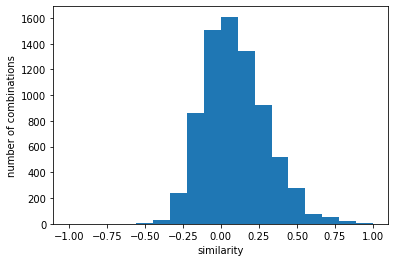

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5940374879638721}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 2.390e+02
 9.240e+02 1.716e+03 1.897e+03 1.645e+03 9.800e+02 6.070e+02 3.120e+02
 1.530e+02 5.900e+01 2.300e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


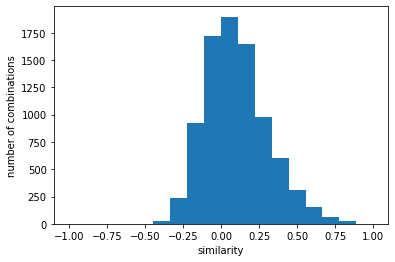

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.5768110555193605}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    7.   46.  279. 1040. 2149. 2351. 1914. 1340.
  774.  407.  156.   37.   19.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


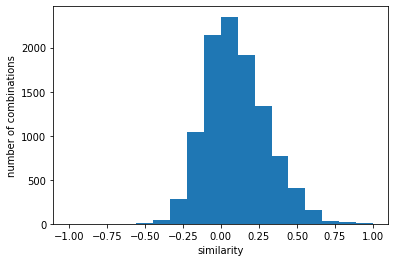

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.554726662021672}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   20.  245.  918. 2016. 2468. 2019. 1590.
  852.  440.  177.   53.    7.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


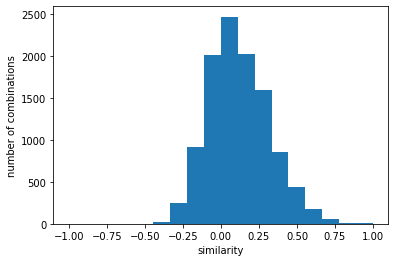

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5916057111116136}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.400e+01 2.230e+02
 7.830e+02 1.382e+03 1.548e+03 1.247e+03 7.940e+02 4.850e+02 2.530e+02
 1.160e+02 5.400e+01 1.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


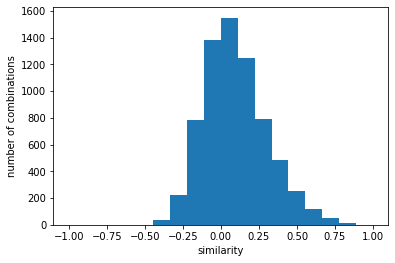

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.5905698066924133}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   40.  284. 1062. 2201. 2462. 2062. 1386.
  776.  403.  137.   41.    9.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


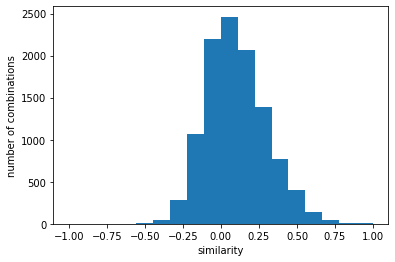

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5590366268922558}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   23.  210.  867. 1549. 1798. 1480.  952.
  513.  298.  100.   35.    5.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


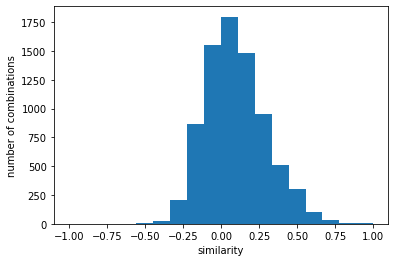

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5973138915892557}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.100e+01 2.550e+02
 9.810e+02 1.821e+03 2.044e+03 1.668e+03 1.060e+03 6.290e+02 3.430e+02
 1.720e+02 6.700e+01 2.000e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


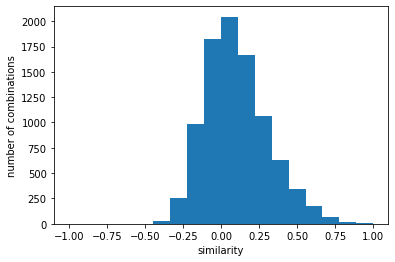

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5735944127807876}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   38.  243.  754. 1333. 1568. 1160.  788.
  425.  260.   85.   29.   18.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


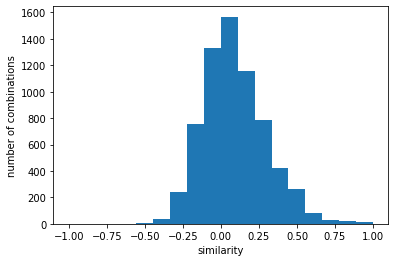

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6198678261863887}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.800e+01 2.820e+02
 9.430e+02 1.716e+03 1.888e+03 1.608e+03 1.076e+03 6.160e+02 3.160e+02
 1.560e+02 7.200e+01 2.300e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


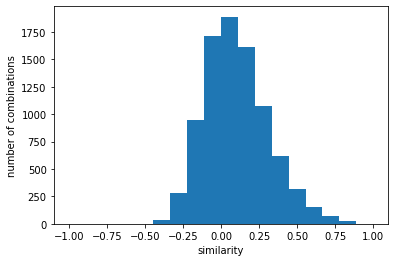

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5854356179452134}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   24.  182.  698. 1415. 1660. 1438. 1082.
  670.  342.  123.   48.    7.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


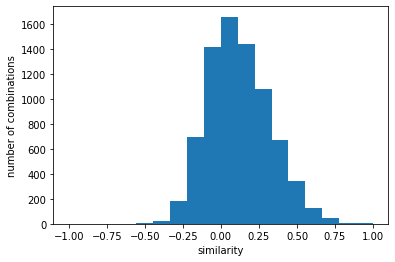

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5847835119326201}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    7.   26.  238.  958. 1825. 2129. 1771. 1240.
  671.  363.  125.   39.    8.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


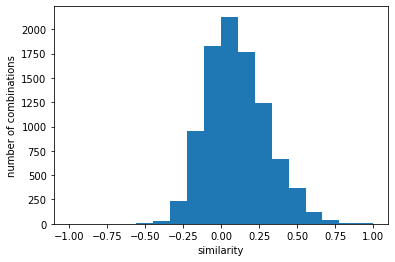

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6195469198674323}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   41.  240.  917. 2032. 2161. 1854. 1291.
  796.  376.  140.   38.   11.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


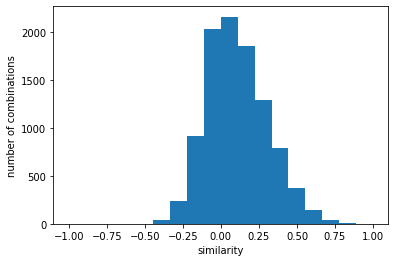

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2プログラミングⅡ（2041）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5541421415719355}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 1.950e+02
 6.980e+02 1.425e+03 1.608e+03 1.347e+03 9.030e+02 5.110e+02 2.700e+02
 1.080e+02 4.200e+01 8.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


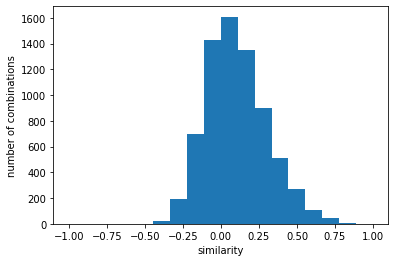

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 'similarity': 0.6228894447536876}
y [  0.   0.   0.   0.   0.   1.  24.  99. 224. 292. 290. 230. 108.  68.
  41.  27.  21.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


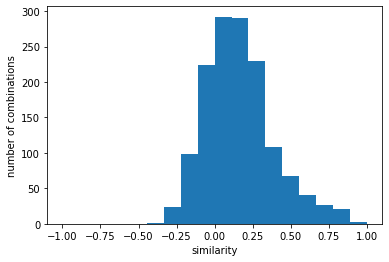

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.8560839082207603}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   18.  198.  676. 1391. 1507. 1323.  819.
  490.  248.  119.   64.   27.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


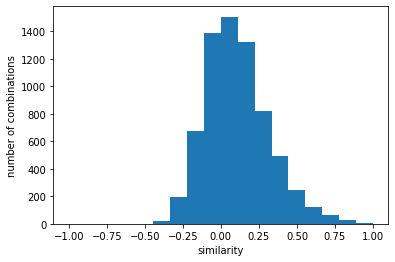

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6207095339050005}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 3.200e+01 3.570e+02
 1.247e+03 2.238e+03 2.568e+03 2.083e+03 1.449e+03 8.900e+02 4.540e+02
 1.970e+02 7.100e+01 3.800e+01 1.400e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


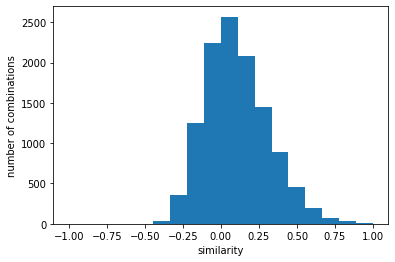

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5532610777890268}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.200e+01 1.070e+02
 3.770e+02 8.450e+02 1.097e+03 8.710e+02 5.900e+02 3.690e+02 1.780e+02
 1.030e+02 4.200e+01 2.500e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


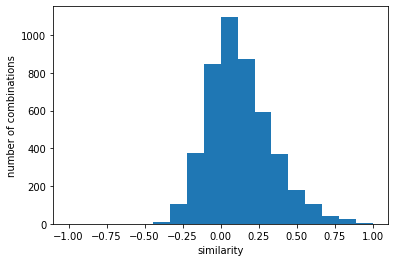

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.7072679846514079}
y [  0.   0.   0.   0.   0.   1.  31.  84. 169. 210. 197. 181.  94.  54.
  30.  15.  13.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


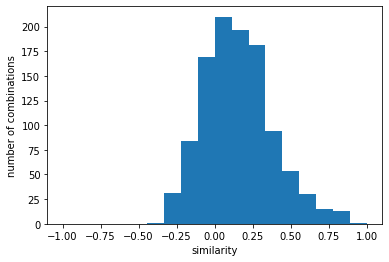

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.8716790370205324}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+00 3.400e+01 2.660e+02
 7.920e+02 1.559e+03 1.939e+03 1.517e+03 1.105e+03 7.400e+02 3.310e+02
 1.490e+02 5.800e+01 5.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


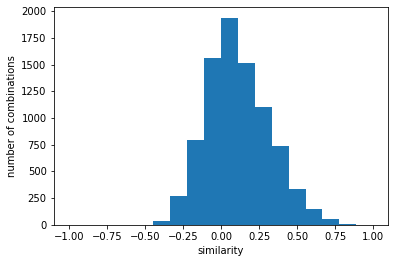

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.56751518747905}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 7.000e+00 8.000e+01
 3.590e+02 7.710e+02 1.069e+03 9.230e+02 6.310e+02 3.790e+02 1.760e+02
 9.300e+01 3.300e+01 2.100e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


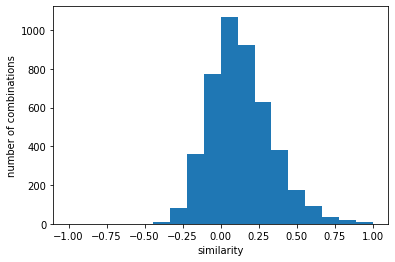

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.7050055263544877}
y [   0.    0.    0.    0.    0.   13.  162.  530. 1252. 1436. 1182.  758.
  391.  210.   77.   35.    6.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


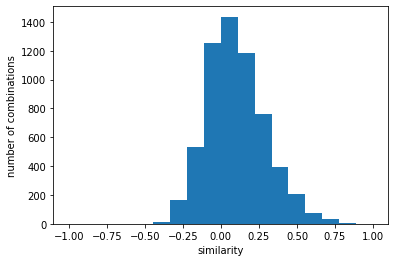

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6071945128696724}
y [   0.    0.    0.    0.    0.    6.  106.  406.  962. 1055.  732.  427.
  283.  171.   69.   23.   14.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


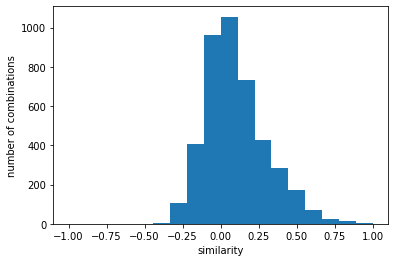

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6523279369266646}
y [  0.   0.   0.   0.   1.  12.  78. 303. 679. 831. 664. 433. 282. 151.
  92.  40.  12.   6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


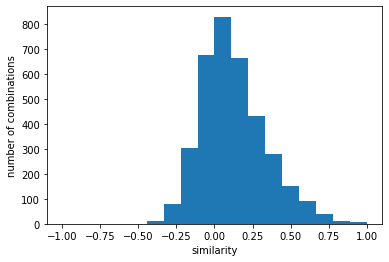

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.7167708676672171}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 5.100e+01 4.620e+02
 1.575e+03 3.121e+03 3.543e+03 2.903e+03 1.874e+03 9.890e+02 4.960e+02
 2.190e+02 8.500e+01 2.800e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


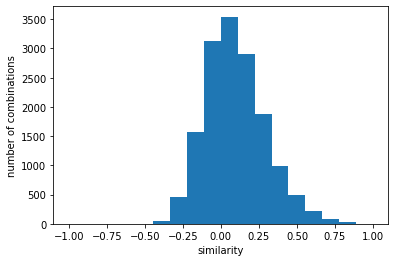

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5344065943176312}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.    9.  225.  708. 1324. 1474. 1281.  824.
  577.  292.  140.   73.   34.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


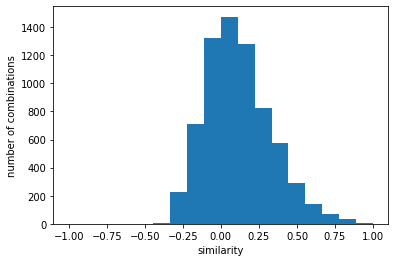

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6292691851109964}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.500e+01 2.250e+02
 7.960e+02 1.458e+03 1.634e+03 1.252e+03 7.860e+02 4.780e+02 2.570e+02
 1.280e+02 5.600e+01 2.300e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


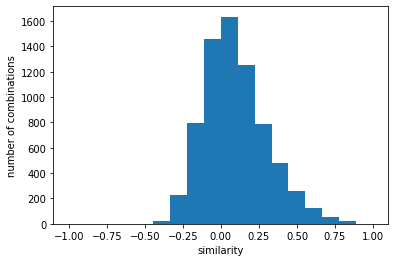

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6033469849512898}
y [  0.   0.   0.   0.   0.   8.  75. 240. 471. 572. 497. 326. 176.  80.
  55.  28.   8.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


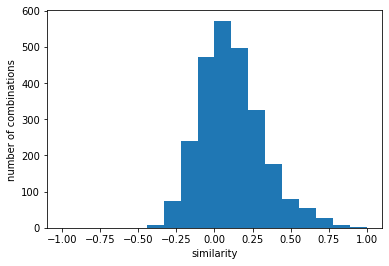

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.7650342766098848}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 1.930e+02
 7.050e+02 1.485e+03 1.693e+03 1.318e+03 8.250e+02 5.150e+02 2.660e+02
 1.200e+02 5.900e+01 1.900e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


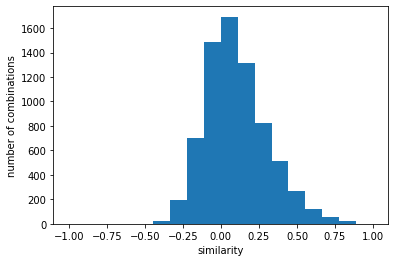

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.623340555692801}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.300e+01 2.270e+02
 1.063e+03 2.201e+03 2.589e+03 2.251e+03 1.528e+03 9.230e+02 4.340e+02
 2.230e+02 7.700e+01 3.700e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


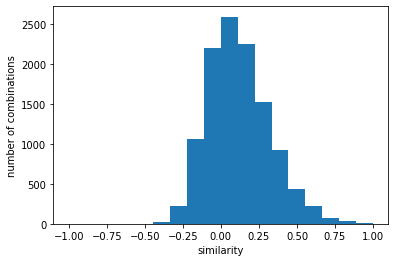

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5698793056849867}
y [  0.   0.   0.   0.   0.   5.  57. 264. 516. 711. 566. 340. 189. 100.
  65.  31.   6.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


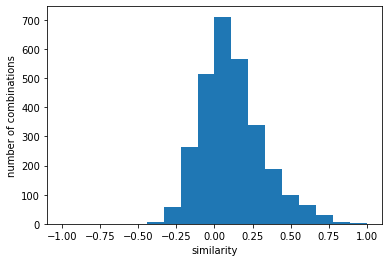

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.7330470666335043}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 2.230e+02
 7.770e+02 1.675e+03 1.835e+03 1.432e+03 8.690e+02 5.140e+02 2.660e+02
 1.300e+02 6.500e+01 1.100e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


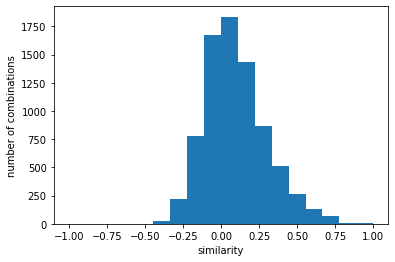

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6176343618643816}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 2.800e+01 2.010e+02
 8.700e+02 1.740e+03 1.903e+03 1.484e+03 8.870e+02 5.070e+02 2.750e+02
 1.490e+02 4.000e+01 1.300e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


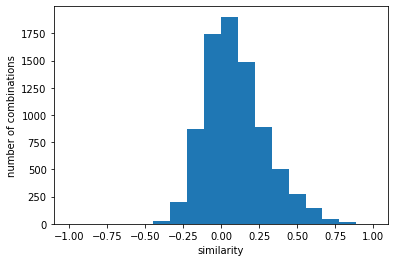

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5885161657820525}
y [  0.   0.   0.   0.   0.   6.  67. 241. 506. 683. 633. 430. 231. 152.
  79.  79.  22.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


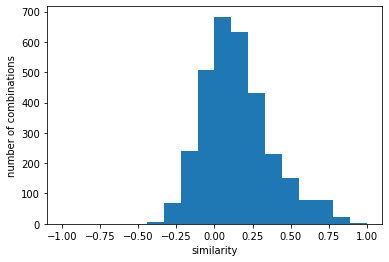

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.7583577456636238}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.600e+01 3.340e+02
 1.054e+03 2.200e+03 2.363e+03 1.684e+03 1.111e+03 6.740e+02 2.610e+02
 1.060e+02 3.400e+01 1.600e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


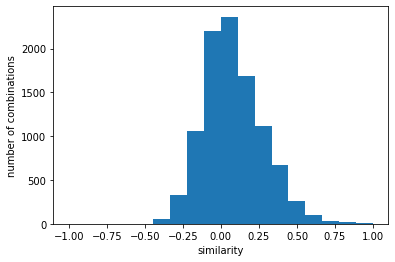

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5413607621511599}
y [  0.   0.   0.   0.   0.   4.  57. 213. 454. 591. 586. 397. 212. 113.
  43.  26.   5.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


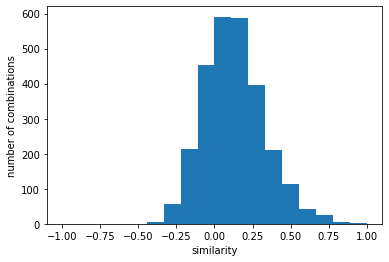

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.7740570364863427}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   13.  157.  783. 1506. 1762. 1519.  969.
  599.  308.  167.   81.   18.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


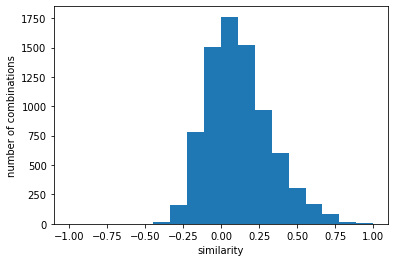

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5775910647073917}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 2.400e+01 2.300e+02
 8.820e+02 1.745e+03 1.908e+03 1.616e+03 9.950e+02 5.870e+02 3.410e+02
 1.660e+02 4.300e+01 1.000e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


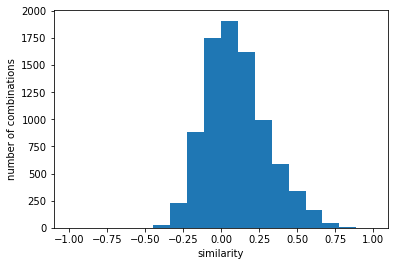

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6328048498315942}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 1.980e+02
 8.430e+02 1.808e+03 2.038e+03 1.648e+03 9.640e+02 6.210e+02 3.010e+02
 1.380e+02 4.400e+01 1.300e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


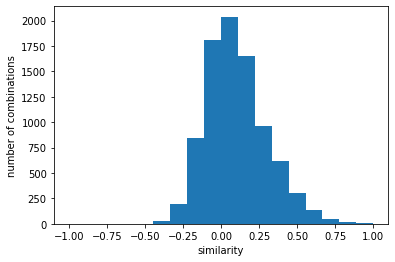

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5739731209831088}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 2.050e+02
 7.850e+02 1.559e+03 1.778e+03 1.533e+03 9.870e+02 5.280e+02 2.670e+02
 9.100e+01 4.600e+01 8.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


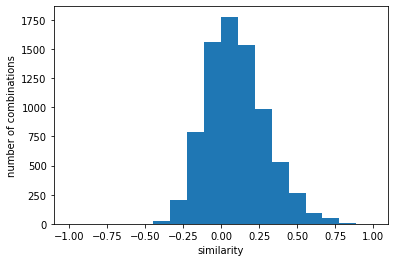

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 'similarity': 0.6185363247988779}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  137.  553. 1217. 1433. 1361.  960.
  535.  269.   91.   42.   14.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


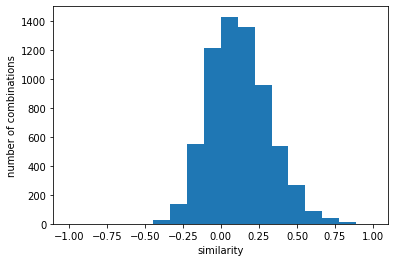

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.621819036601477}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   28.  276.  988. 1800. 2144. 1852. 1357.
  811.  388.  164.   43.   12.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


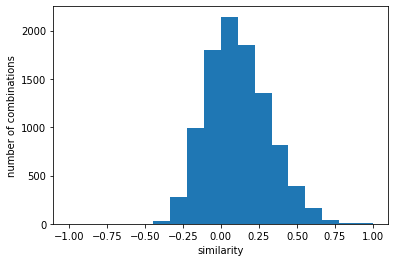

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5807655687974067}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   21.  145.  669. 1337. 1525. 1232.  798.
  500.  249.  100.   51.   12.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


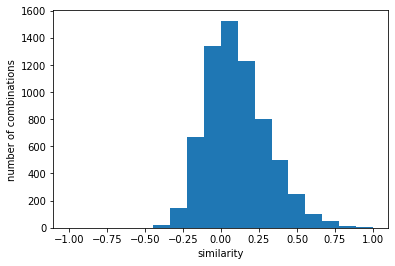

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6346806547476237}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   25.  179.  746. 1435. 1626. 1402.  933.
  500.  286.  112.   43.    9.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


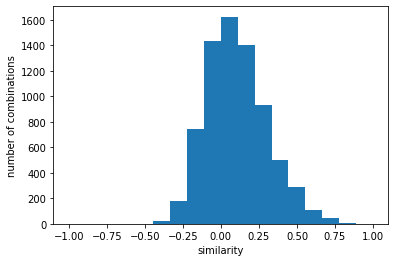

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6347057334532019}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   15.  157.  613. 1239. 1471. 1412. 1016.
  621.  305.  115.   36.    7.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


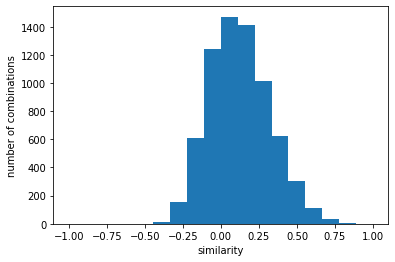

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5972197997804014}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   22.  150.  634. 1238. 1480. 1194.  784.
  514.  227.   91.   43.   13.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


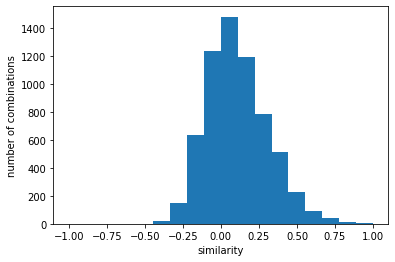

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6347288916537231}
y [   0.    0.    0.    0.    0.   10.  101.  393.  793. 1005.  886.  591.
  336.  174.   75.   17.    8.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


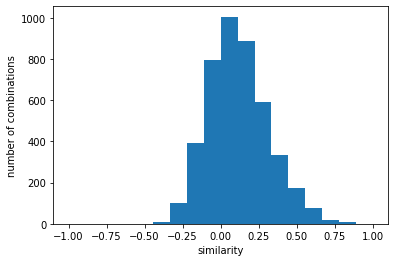

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6547345674071149}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+01 1.550e+02
 6.860e+02 1.488e+03 1.493e+03 1.063e+03 6.990e+02 4.160e+02 2.400e+02
 8.500e+01 3.000e+01 4.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


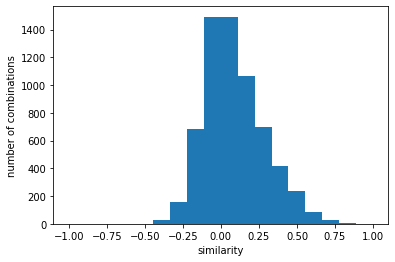

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5773419092965302}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   31.  161.  675. 1350. 1474. 1195.  723.
  446.  260.   91.   45.   13.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


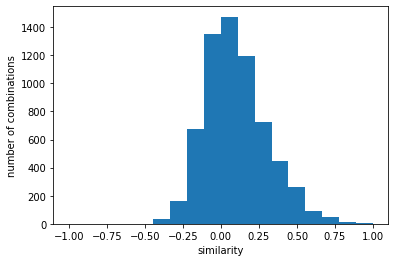

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6131272975294345}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.700e+01 3.000e+02
 1.062e+03 2.221e+03 2.562e+03 2.219e+03 1.427e+03 7.550e+02 4.080e+02
 1.610e+02 5.900e+01 1.800e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


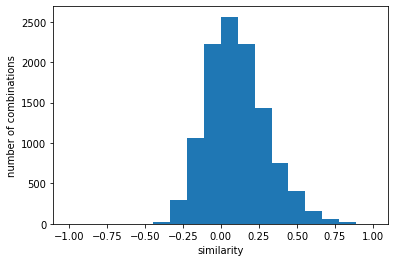

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.606279075799699}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.200e+01 1.440e+02
 5.080e+02 1.152e+03 1.356e+03 1.325e+03 9.740e+02 6.060e+02 2.910e+02
 1.230e+02 4.100e+01 1.400e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


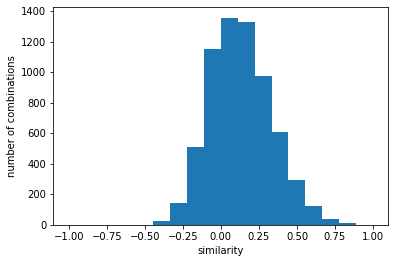

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.635257786479132}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.900e+01 1.350e+02
 5.730e+02 1.044e+03 1.232e+03 1.118e+03 7.960e+02 4.460e+02 2.310e+02
 1.180e+02 3.900e+01 8.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


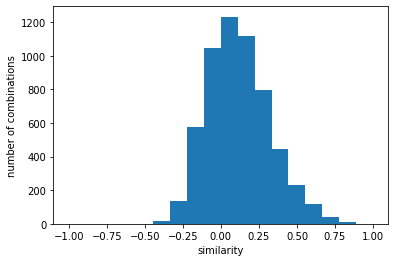

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6413848018088922}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   20.  186.  684. 1341. 1583. 1234.  743.
  411.  219.  100.   26.    5.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


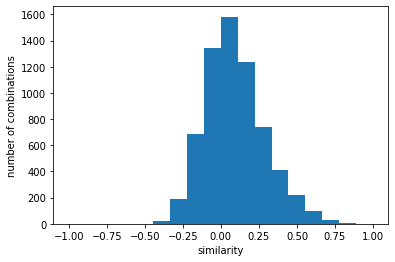

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6205203214148398}
y [  0.   0.   0.   0.   0.  14. 102. 321. 679. 912. 769. 542. 276. 164.
  82.  40.   5.   0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


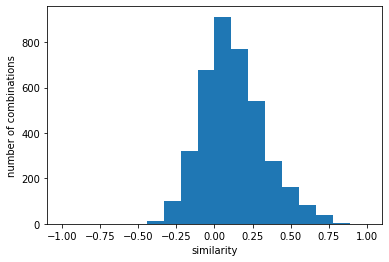

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.7272770655301045}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   19.  182.  691. 1538. 1906. 1685. 1211.
  673.  357.  152.   46.    3.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


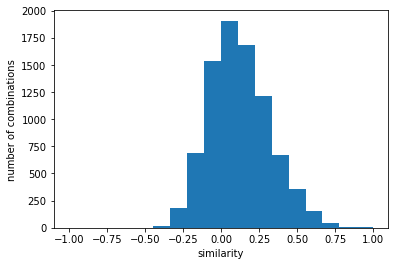

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.6297990091222768}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  137.  493. 1047. 1185.  974.  586.
  305.  197.   68.   32.    7.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


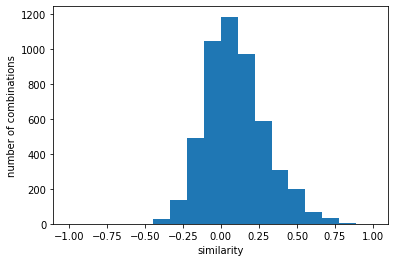

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6382485864147391}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.300e+01 1.280e+02
 4.930e+02 1.010e+03 1.238e+03 1.027e+03 6.880e+02 3.530e+02 2.060e+02
 1.080e+02 4.800e+01 7.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


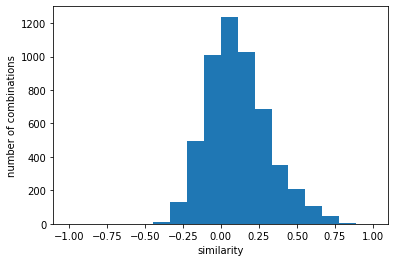

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.687442437883526}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.100e+01 1.530e+02
 6.040e+02 1.245e+03 1.458e+03 1.335e+03 8.850e+02 4.690e+02 2.780e+02
 1.580e+02 2.900e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


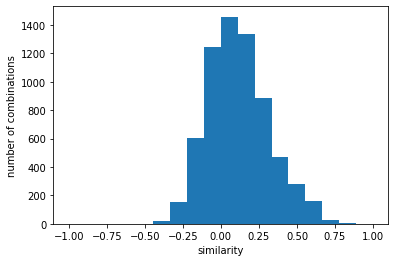

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6271511989199369}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.200e+01 2.060e+02
 6.780e+02 1.296e+03 1.605e+03 1.260e+03 8.190e+02 4.710e+02 2.770e+02
 1.210e+02 3.600e+01 1.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


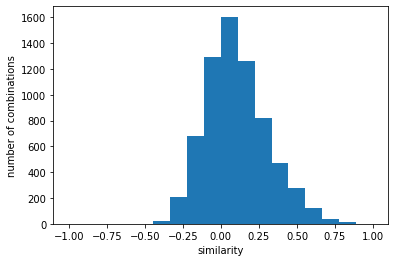

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6252680399308769}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   33.  242.  807. 1598. 1810. 1508.  981.
  545.  254.  107.   26.    7.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


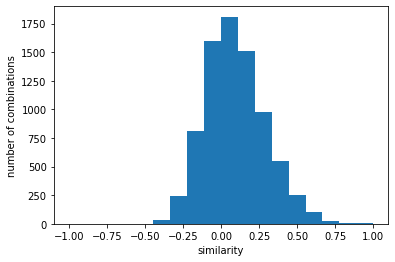

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5865973315150286}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   27.  185.  665. 1349. 1577. 1229.  796.
  448.  240.   87.   34.    5.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


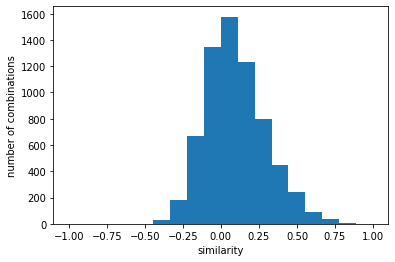

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6258788721072617}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   18.  161.  607. 1214. 1455. 1364.  984.
  593.  357.  137.   44.    5.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


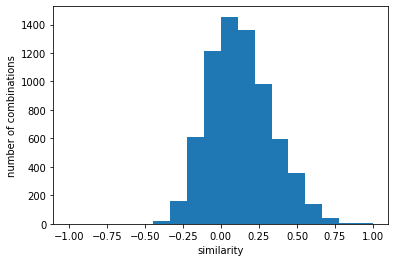

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5996533927133318}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   16.  165.  611. 1237. 1515. 1461. 1052.
  554.  334.  181.   60.   12.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


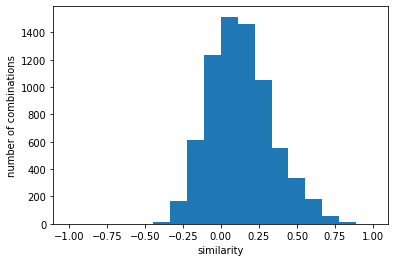

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6686726766253767}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.290e+02
 4.030e+02 9.150e+02 1.146e+03 1.030e+03 7.170e+02 3.920e+02 2.150e+02
 1.050e+02 3.300e+01 8.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


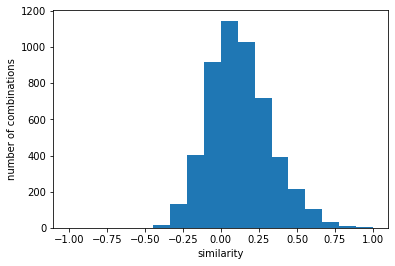

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2力学Ⅱ(0233).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6705857334557238}
y [   0.    0.    0.    0.    0.   15.  157.  536. 1119. 1284. 1206.  815.
  490.  222.  115.   65.   20.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


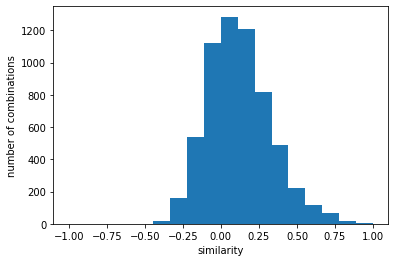

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 'similarity': 0.6408771947706159}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 3.700e+01 3.360e+02
 1.265e+03 2.380e+03 2.788e+03 2.288e+03 1.580e+03 8.870e+02 4.290e+02
 2.020e+02 8.100e+01 3.300e+01 1.300e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


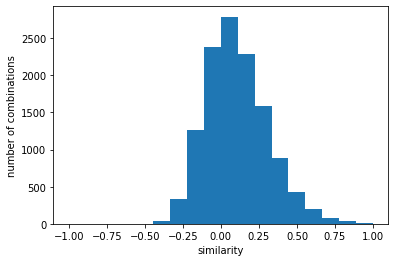

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5384646568612741}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 9.000e+01
 3.530e+02 8.600e+02 1.171e+03 9.830e+02 6.580e+02 3.570e+02 2.090e+02
 9.800e+01 5.400e+01 2.100e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


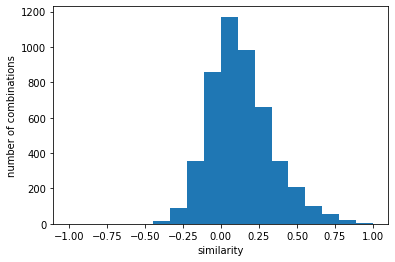

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6928624460273514}
y [  0.   0.   0.   0.   0.   1.   6.  37.  92. 128. 112. 114.  47.  33.
  21.  18.  15.   0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


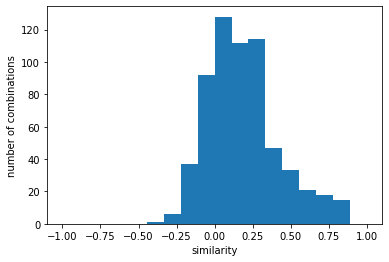

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.8908083551409529}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.500e+01 2.540e+02
 7.900e+02 1.467e+03 1.868e+03 1.619e+03 1.136e+03 7.330e+02 3.270e+02
 1.330e+02 5.500e+01 6.000e+00 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


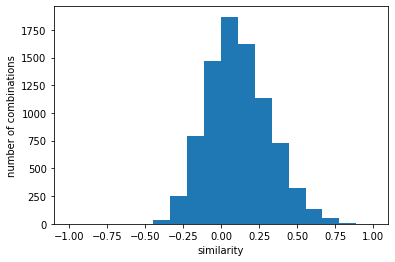

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5655728808869208}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+01 8.500e+01
 3.730e+02 8.450e+02 1.147e+03 1.081e+03 7.200e+02 4.230e+02 2.100e+02
 9.600e+01 5.400e+01 1.800e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


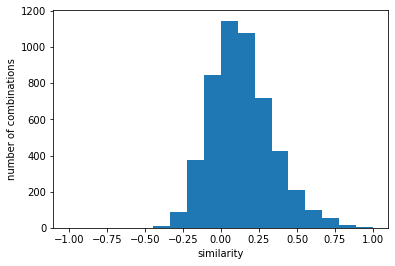

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6827026130787852}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   14.  142.  487. 1136. 1342. 1190.  794.
  377.  200.   76.   31.    5.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


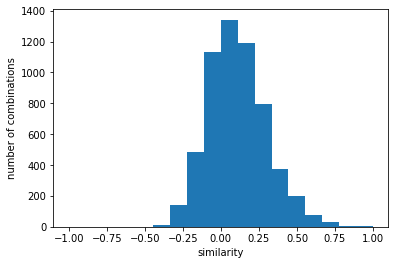

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6090551060404291}
y [   0.    0.    0.    0.    0.   11.   87.  415.  984. 1136.  868.  528.
  330.  147.   32.   18.    7.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


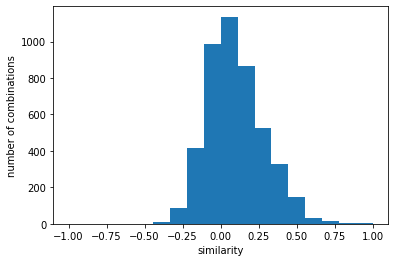

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6331041638575019}
y [  0.   0.   0.   0.   1.  11.  64. 318. 696. 839. 717. 462. 255. 146.
  90.  39.  15.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


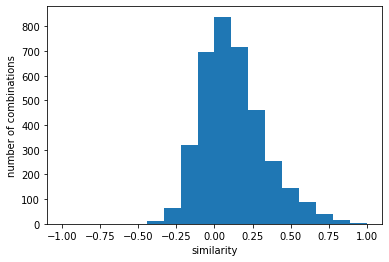

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.7031905682105143}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.500e+01 4.030e+02
 1.449e+03 3.052e+03 3.607e+03 2.968e+03 1.915e+03 1.017e+03 4.820e+02
 2.190e+02 7.500e+01 3.100e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


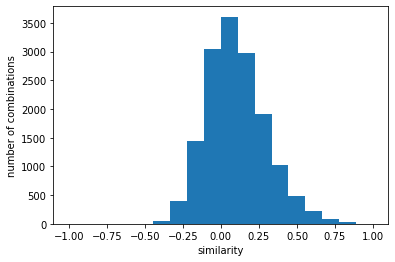

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5387177167913791}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.100e+01 1.730e+02
 5.850e+02 1.053e+03 1.274e+03 1.221e+03 8.500e+02 5.740e+02 2.950e+02
 1.350e+02 8.200e+01 2.000e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


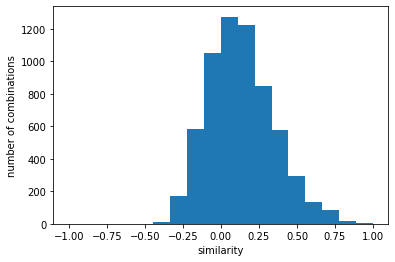

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6462106247400546}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.300e+01 2.030e+02
 7.660e+02 1.473e+03 1.682e+03 1.378e+03 7.800e+02 4.770e+02 2.490e+02
 1.280e+02 5.400e+01 2.400e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


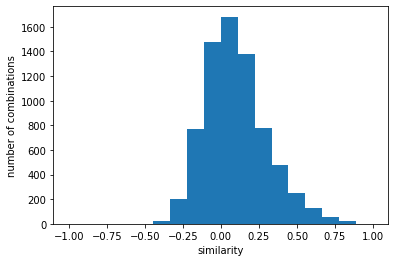

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5953362646497684}
y [  0.   0.   0.   0.   0.  10.  62. 224. 506. 639. 605. 358. 187. 107.
  56.  39.  11.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


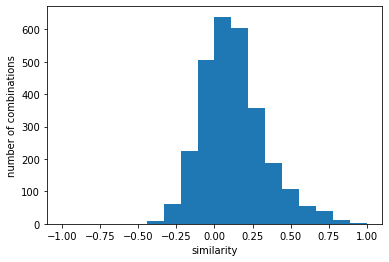

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.7448944783720683}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 1.680e+02
 7.190e+02 1.539e+03 1.775e+03 1.417e+03 9.120e+02 5.400e+02 2.480e+02
 1.310e+02 6.000e+01 1.600e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


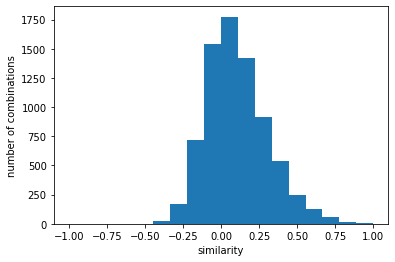

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.610896289888242}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   21.  205.  962. 1994. 2559. 2265. 1543.
  903.  417.  222.   81.   32.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


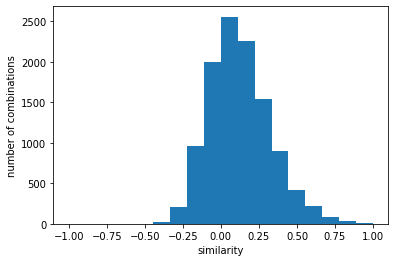

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5773027505952726}
y [  0.   0.   0.   0.   0.   8.  59. 258. 502. 634. 552. 342. 203. 112.
  60.  31.  10.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


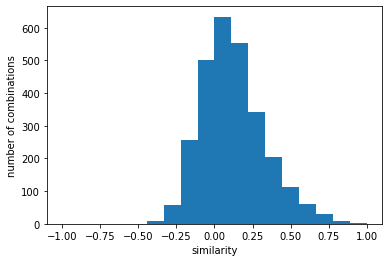

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.7245813578695876}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   20.  190.  730. 1541. 1784. 1397.  858.
  510.  241.  134.   59.   10.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


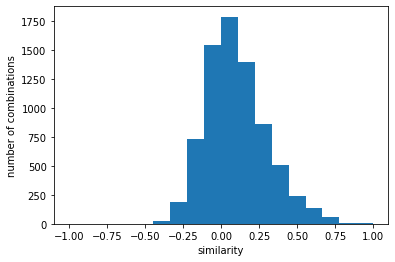

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6219777628211355}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.400e+01 1.920e+02
 7.530e+02 1.633e+03 1.890e+03 1.496e+03 9.020e+02 5.180e+02 2.730e+02
 1.700e+02 4.100e+01 1.000e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


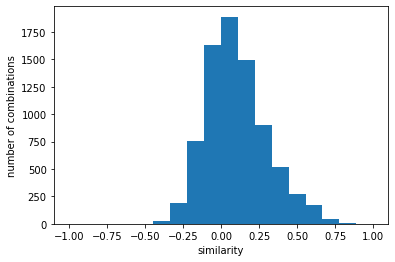

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.591448830623624}
y [  0.   0.   0.   0.   0.   5.  58. 211. 498. 681. 658. 417. 227. 159.
  90.  71.  22.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


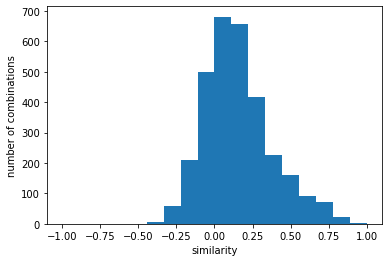

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.7494661480517567}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   53.  301.  939. 1987. 2240. 1752. 1159.
  661.  249.   94.   34.   14.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


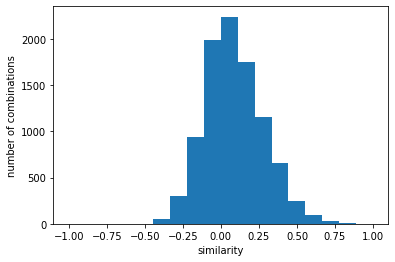

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5503216405471244}
y [  0.   0.   0.   0.   0.   4.  47. 203. 442. 576. 568. 354. 195. 105.
  42.  35.   4.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


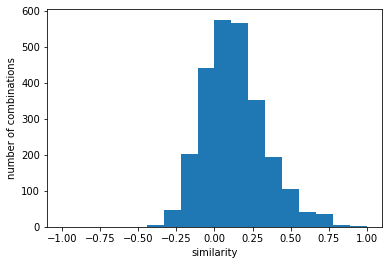

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.7666130449120361}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.100e+01 1.350e+02
 6.860e+02 1.379e+03 1.674e+03 1.537e+03 1.008e+03 6.280e+02 3.030e+02
 1.820e+02 7.700e+01 1.900e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


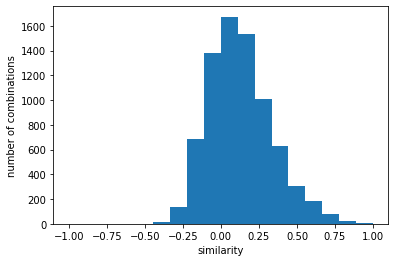

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5825893559324425}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 2.240e+02
 8.190e+02 1.719e+03 2.100e+03 1.786e+03 1.077e+03 6.260e+02 3.720e+02
 1.890e+02 4.300e+01 8.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


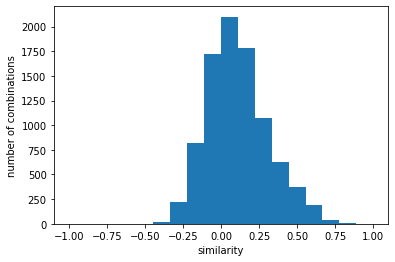

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6222332100955276}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  191.  798. 1676. 1877. 1506.  958.
  565.  295.  129.   38.   12.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


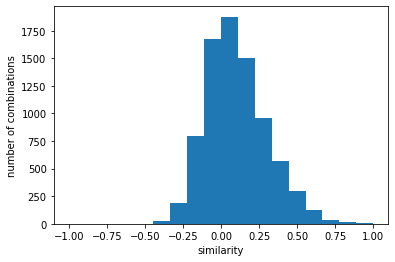

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠC(0227).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5825119614278611}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+00 2.800e+01 3.160e+02
 9.790e+02 1.900e+03 2.277e+03 2.043e+03 1.389e+03 8.870e+02 4.670e+02
 1.630e+02 6.800e+01 2.600e+01 1.300e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


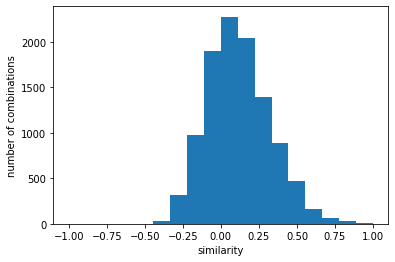

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 'similarity': 0.5775279876803283}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   22.  192.  662. 1421. 1699. 1402.  910.
  507.  246.   97.   49.   13.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


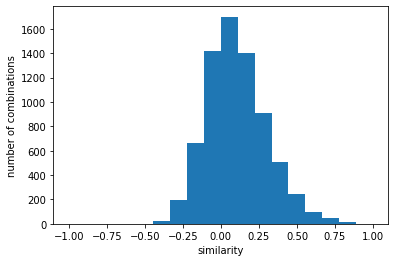

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.6245012219756377}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   17.  173.  574. 1212. 1360. 1235.  873.
  484.  248.  118.   59.   19.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


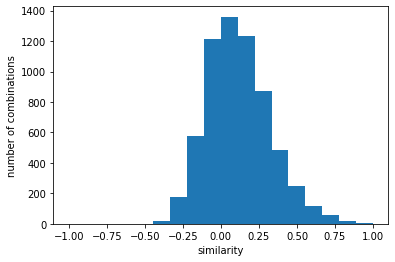

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.6686088989325003}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   18.  147.  538. 1094. 1276. 1164.  768.
  556.  242.  116.   41.   11.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


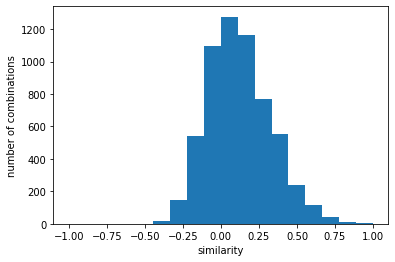

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.6333572339646171}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.800e+01 1.670e+02
 6.450e+02 1.247e+03 1.510e+03 1.316e+03 8.670e+02 4.850e+02 2.340e+02
 8.700e+01 4.700e+01 1.500e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


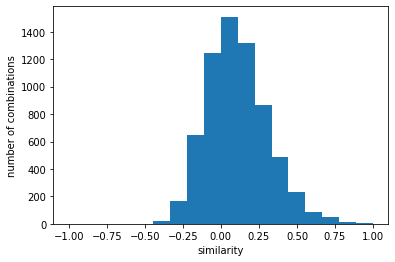

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6341348308137609}
y [   0.    0.    0.    0.    0.    4.  100.  361.  868. 1004.  874.  591.
  356.  203.   75.   26.   16.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


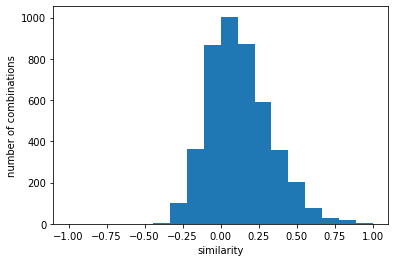

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6610339922817927}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.690e+02
 6.760e+02 1.503e+03 1.574e+03 1.238e+03 7.270e+02 4.510e+02 2.440e+02
 9.400e+01 5.500e+01 4.400e+01 2.800e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


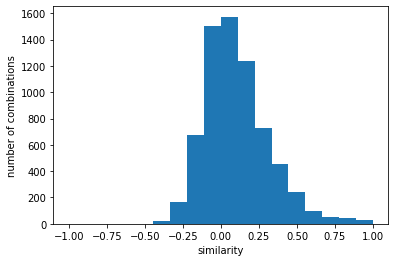

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5973453866481235}
y [   0.    0.    0.    0.    2.   19.  146.  498. 1064. 1215.  945.  681.
  395.  204.   91.   49.   14.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


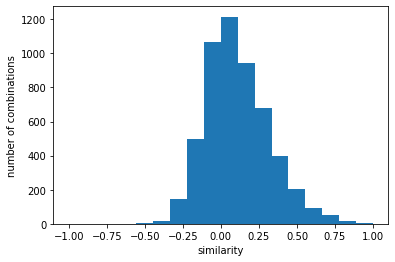

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6751964121312971}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.500e+01 2.650e+02
 9.920e+02 2.319e+03 2.713e+03 2.307e+03 1.670e+03 9.060e+02 4.650e+02
 1.740e+02 4.700e+01 2.200e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


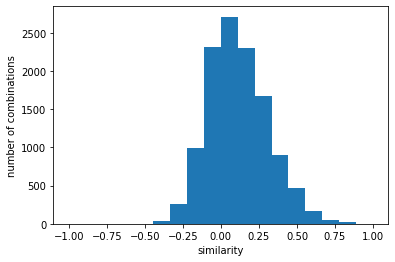

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.6209206207467195}
y [  0.   0.   0.   0.   0.   0.  24.  92. 207. 280. 251. 209. 108.  93.
  39.  17.   9.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


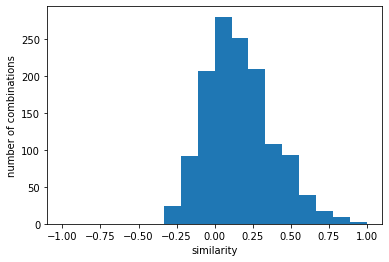

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.8376388909520501}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   22.  192.  627. 1317. 1505. 1326.  867.
  483.  286.   94.   59.   17.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


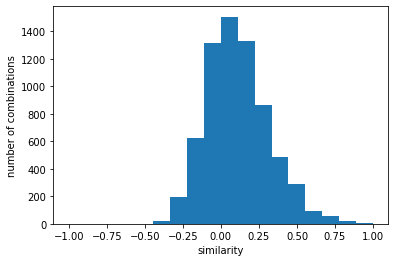

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6171700195528356}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.500e+01 2.020e+02
 7.070e+02 1.495e+03 1.771e+03 1.502e+03 9.530e+02 5.280e+02 2.550e+02
 1.210e+02 6.000e+01 2.900e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


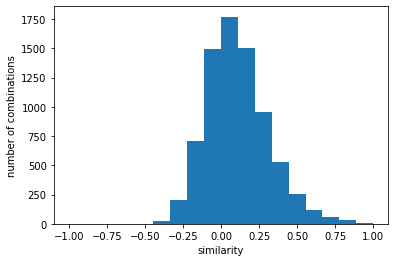

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6034146475809867}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   32.  154.  625. 1438. 1677. 1465. 1004.
  598.  331.  139.   63.   29.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


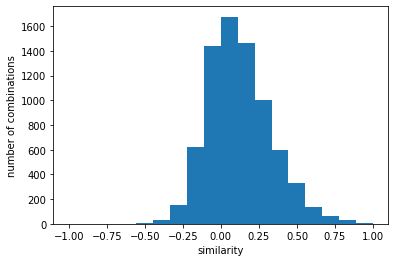

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6221809272391935}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.730e+02
 7.240e+02 1.746e+03 2.186e+03 1.899e+03 1.399e+03 8.300e+02 4.220e+02
 1.660e+02 6.900e+01 3.400e+01 1.000e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


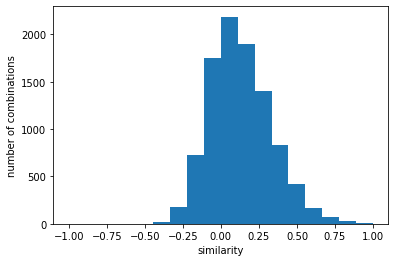

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.611701796820075}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.700e+01 1.370e+02
 4.840e+02 9.710e+02 1.017e+03 8.070e+02 4.850e+02 2.740e+02 1.330e+02
 6.800e+01 4.300e+01 1.200e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


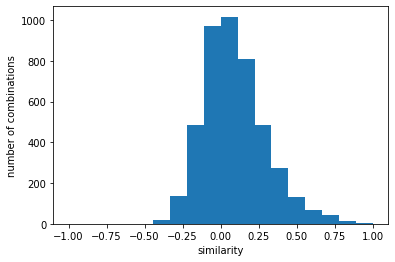

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6671575114163406}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   30.  161.  679. 1500. 1850. 1628. 1097.
  652.  355.  125.   61.   21.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


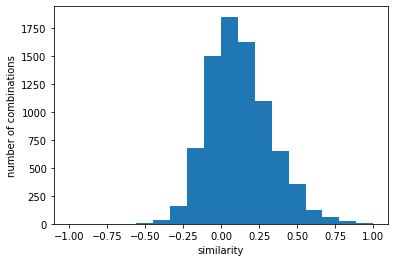

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6187250077220826}
y [   0.    0.    0.    0.    3.   17.  118.  464. 1047. 1209. 1125.  751.
  442.  287.  113.   31.   10.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


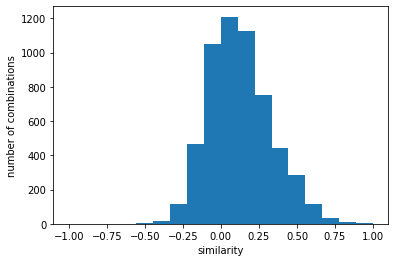

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6846476641571843}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.500e+01 1.860e+02
 6.910e+02 1.474e+03 1.765e+03 1.503e+03 9.900e+02 5.470e+02 3.020e+02
 1.480e+02 7.900e+01 2.800e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


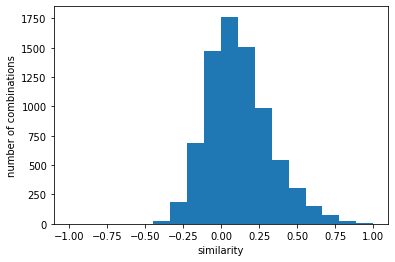

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.611729631388679}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  154.  555. 1237. 1480. 1215.  818.
  491.  214.   89.   23.   11.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


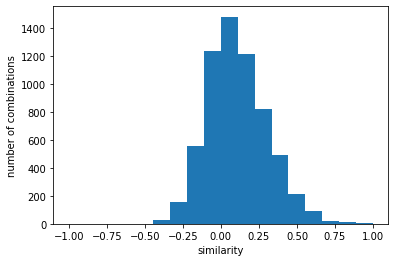

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6579374140213335}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 1.710e+02
 5.990e+02 1.380e+03 1.626e+03 1.403e+03 9.040e+02 5.040e+02 2.610e+02
 1.040e+02 5.400e+01 2.200e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


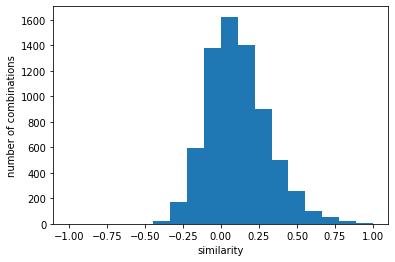

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6318190082791811}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 9.000e+00 9.100e+01
 3.830e+02 1.003e+03 1.152e+03 1.097e+03 8.580e+02 5.210e+02 3.100e+02
 1.140e+02 5.100e+01 1.800e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


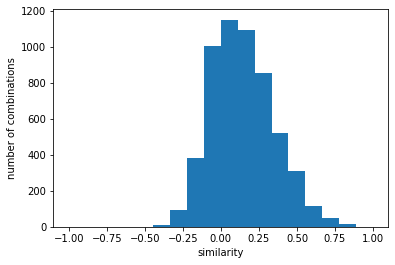

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6676225119667364}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   19.  166.  645. 1462. 1708. 1629. 1057.
  662.  387.  148.   46.   19.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


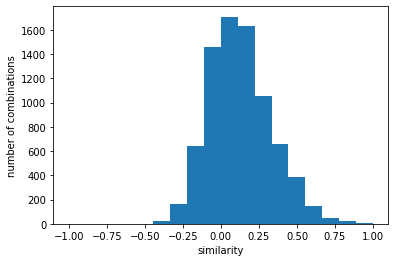

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6553506525095639}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.400e+02
 5.740e+02 1.347e+03 1.643e+03 1.514e+03 1.062e+03 6.280e+02 3.010e+02
 1.060e+02 4.100e+01 1.400e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


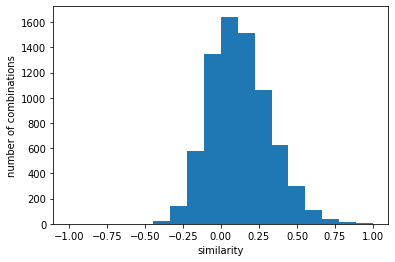

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠB(2094).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6328588689858816}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 2.660e+02
 1.087e+03 2.214e+03 2.448e+03 2.002e+03 1.317e+03 8.340e+02 4.510e+02
 2.020e+02 8.800e+01 3.900e+01 1.400e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


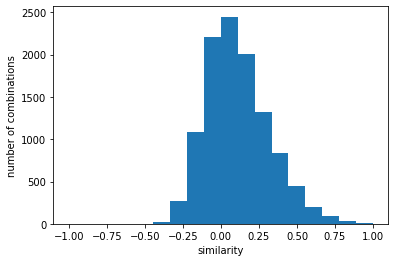

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 'similarity': 0.5376100750002327}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 4.000e+01 3.190e+02
 1.197e+03 2.167e+03 2.450e+03 2.031e+03 1.426e+03 8.560e+02 4.170e+02
 2.020e+02 7.500e+01 3.900e+01 1.200e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


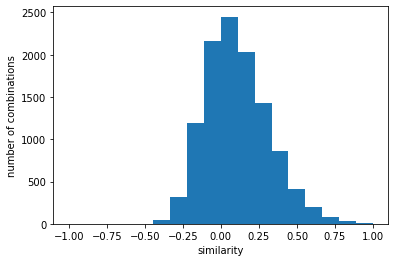

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.5480882126704197}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   43.  251.  855. 1671. 1932. 1660. 1154.
  738.  400.  170.   57.   20.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


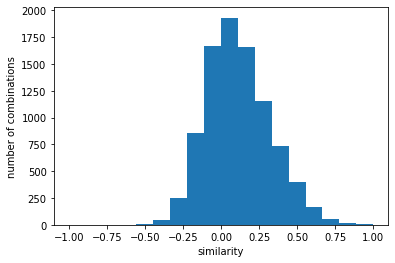

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5539927948863583}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 2.460e+02
 1.068e+03 2.149e+03 2.409e+03 1.996e+03 1.320e+03 8.450e+02 4.640e+02
 2.150e+02 6.900e+01 4.200e+01 1.200e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


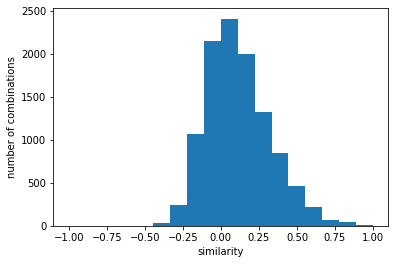

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.5344393122394933}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 1.700e+01 1.440e+02
 6.210e+02 1.279e+03 1.658e+03 1.424e+03 9.210e+02 5.390e+02 2.710e+02
 1.320e+02 4.600e+01 8.000e+00 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


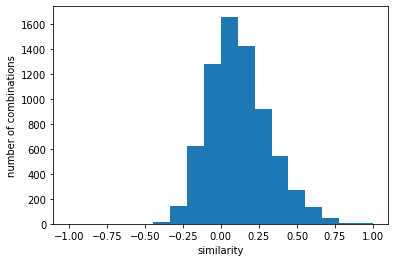

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.5761171306867224}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 2.000e+00 0.000e+00 3.800e+01 3.120e+02
 1.195e+03 2.262e+03 2.500e+03 1.923e+03 1.126e+03 7.270e+02 4.150e+02
 1.760e+02 6.900e+01 2.900e+01 2.600e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


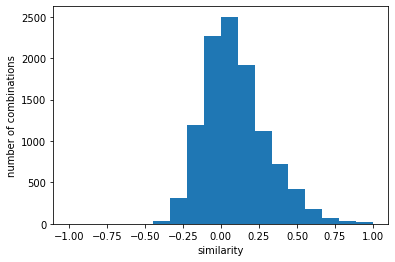

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.47836956220817245}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+00 3.600e+01 2.840e+02
 1.102e+03 2.151e+03 2.428e+03 2.003e+03 1.333e+03 8.580e+02 4.280e+02
 1.920e+02 8.500e+01 3.100e+01 1.100e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


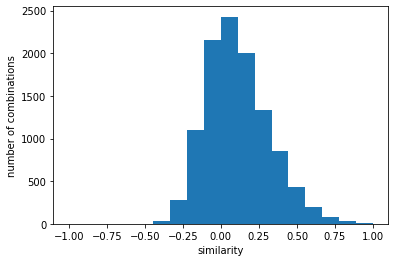

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.5146527288706956}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   54.  414. 1528. 2942. 3373. 2745. 2139.
 1262.  660.  293.  108.   24.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


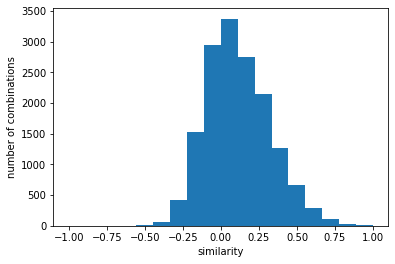

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5363072344887593}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+00 2.800e+01 2.700e+02
 8.580e+02 1.593e+03 1.873e+03 1.781e+03 1.313e+03 9.090e+02 5.160e+02
 2.060e+02 7.700e+01 2.000e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


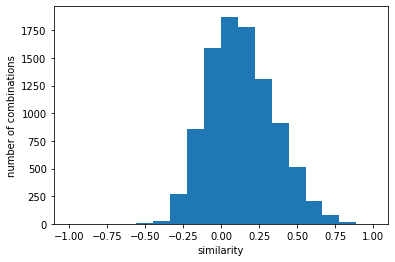

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5709433818269595}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   23.  198.  761. 1382. 1348. 1207.  892.
  526.  302.  140.   59.   32.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


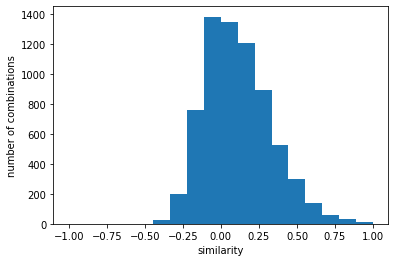

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6030190806885585}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   30.  280. 1144. 2213. 2515. 2062. 1362.
  787.  383.  184.   57.   28.   13.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


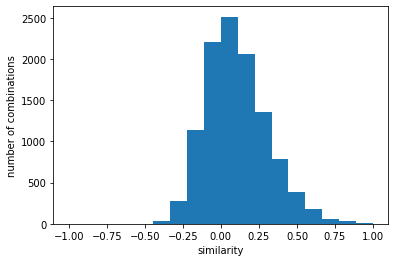

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.5213907426878366}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.700e+01 2.970e+02
 1.084e+03 2.124e+03 2.549e+03 2.108e+03 1.420e+03 9.030e+02 4.920e+02
 2.590e+02 1.010e+02 3.600e+01 1.200e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


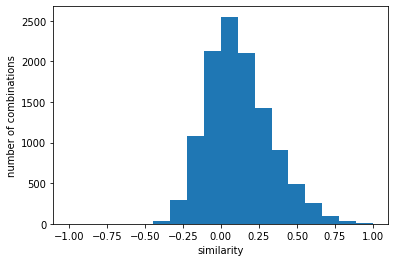

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5323114692194167}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.900e+01 2.280e+02
 7.660e+02 1.492e+03 1.640e+03 1.384e+03 9.390e+02 5.050e+02 2.440e+02
 1.060e+02 3.600e+01 1.200e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


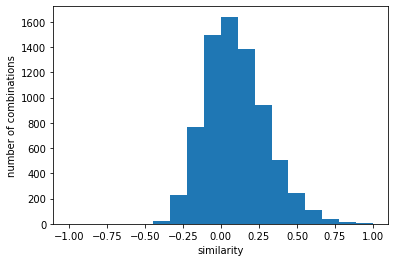

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.645107282512939}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 3.400e+01 2.450e+02
 1.013e+03 2.003e+03 2.272e+03 1.840e+03 1.138e+03 6.700e+02 3.540e+02
 1.580e+02 6.300e+01 3.000e+01 1.000e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


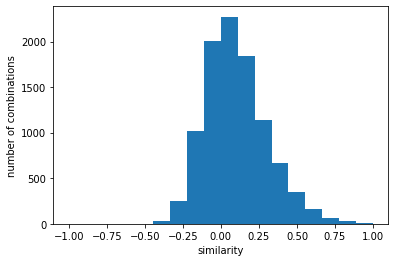

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.5247446125832609}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.200e+01 3.290e+02
 1.182e+03 2.384e+03 2.749e+03 2.254e+03 1.499e+03 9.030e+02 4.810e+02
 2.370e+02 9.400e+01 3.700e+01 1.100e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


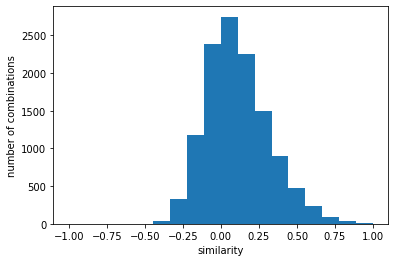

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5257102380347632}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  246.  942. 1839. 2194. 1731. 1082.
  698.  350.  174.   64.   27.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


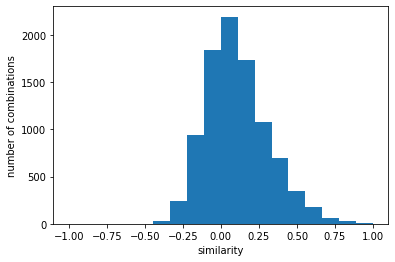

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5562064530848605}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   33.  298. 1149. 2234. 2553. 2081. 1414.
  833.  426.  236.   89.   40.   14.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


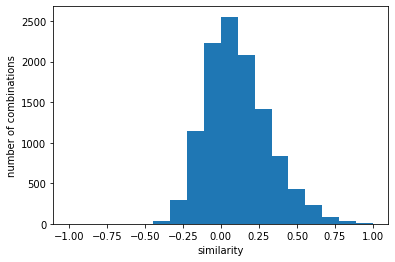

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5253198187561348}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   60.  310. 1017. 1983. 2352. 1825. 1116.
  642.  329.  140.   60.   20.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


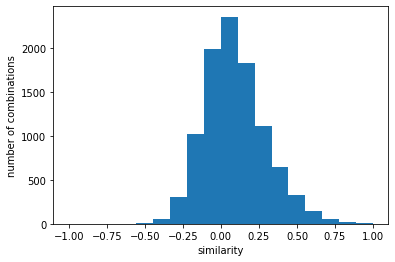

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5444128257264198}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 0.000e+00 2.800e+01 2.910e+02
 1.161e+03 2.198e+03 2.600e+03 2.156e+03 1.431e+03 8.280e+02 4.090e+02
 2.030e+02 7.000e+01 2.600e+01 1.100e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


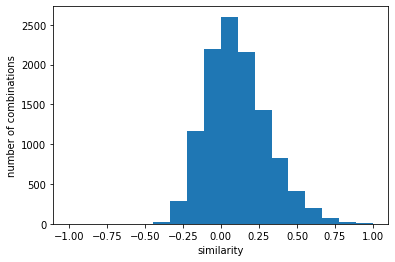

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5276836709054913}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 2.390e+02
 7.820e+02 1.551e+03 1.752e+03 1.531e+03 1.022e+03 6.460e+02 3.700e+02
 1.520e+02 6.600e+01 2.100e+01 1.400e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


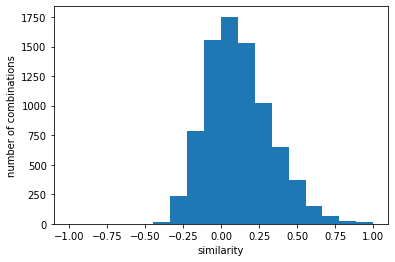

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5610851895397646}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.300e+01 2.730e+02
 1.036e+03 1.921e+03 2.356e+03 1.933e+03 1.258e+03 8.260e+02 4.290e+02
 2.140e+02 6.900e+01 1.800e+01 1.200e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


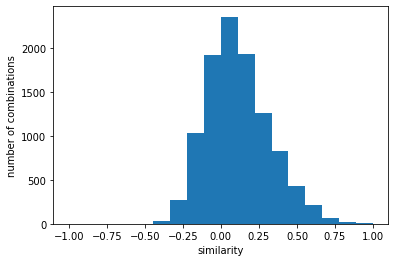

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.589621007918551}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   38.  265. 1071. 2148. 2657. 2205. 1492.
  938.  467.  228.   75.   29.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


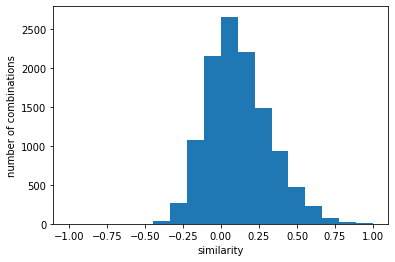

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2電気基礎Ⅱ(2086).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5134242115004344}
y [  0.   0.   0.   0.   2.  13.  75. 329. 764. 999. 879. 573. 330. 186.
 111.  47.  27.   5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


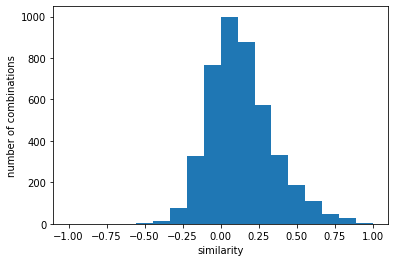

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 'similarity': 0.7423676382865344}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   23.  200.  614. 1274. 1488. 1197.  834.
  539.  258.  109.   49.   10.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


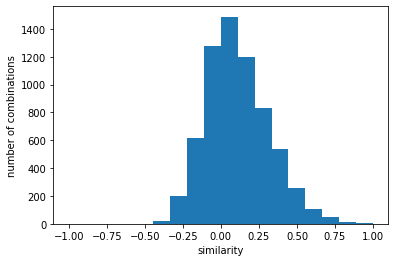

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.6131466712444185}
y [  0.   0.   0.   0.   0.   2.   9.  74. 175. 228. 180. 121.  76.  36.
  13.  11.   2.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


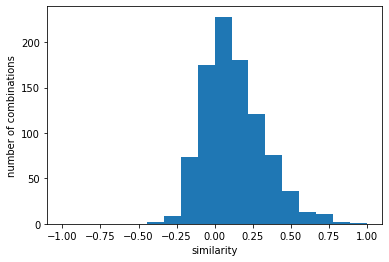

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.8621439292182338}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    8.  105.  522. 1133. 1361. 1138.  743.
  389.  220.   88.   37.   13.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


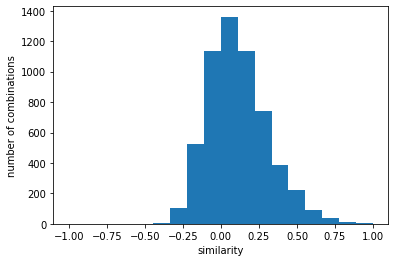

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6202234052333906}
y [   0.    0.    0.    0.    0.   11.   75.  391.  909. 1085.  891.  557.
  285.  195.   75.   22.   35.   12.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


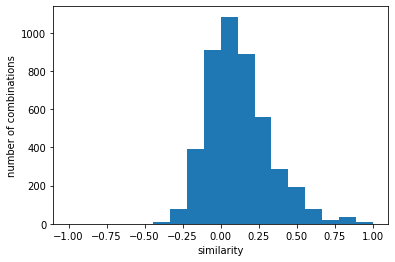

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6511144488181518}
y [  0.   0.   0.   0.   0.   6.  25. 120. 237. 338. 305. 229. 122.  71.
  33.  18.   5.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


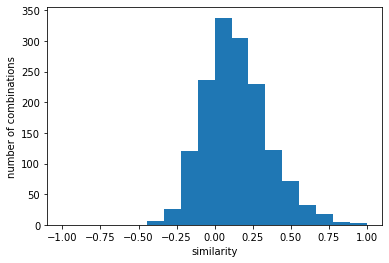

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.8127840268534002}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   45.  367. 1356. 2727. 2917. 2305. 1532.
  838.  450.  208.   90.   40.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


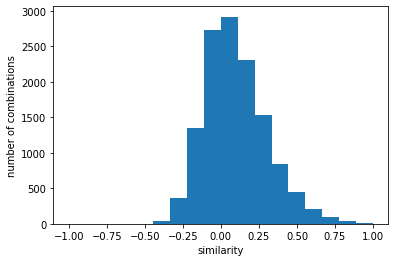

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5776905419311974}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.100e+01 1.730e+02
 5.770e+02 1.165e+03 1.460e+03 1.274e+03 8.830e+02 5.650e+02 3.010e+02
 1.320e+02 7.100e+01 2.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


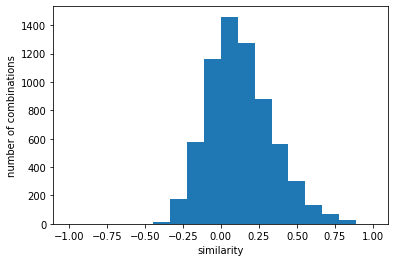

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6430948237010256}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.540e+02
 6.360e+02 1.287e+03 1.388e+03 9.930e+02 6.700e+02 3.930e+02 2.620e+02
 1.180e+02 5.100e+01 2.300e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


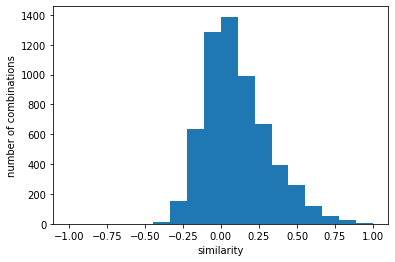

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6365891124628903}
y [  0.   0.   0.   0.   0.   2.  31. 235. 630. 874. 684. 484. 272. 158.
  84.  53.  20.   7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


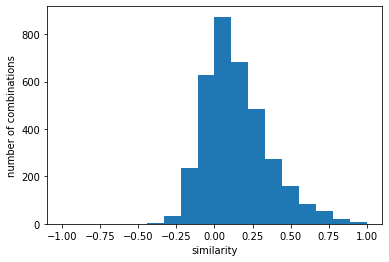

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.7437664125950427}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   35.  164.  783. 1666. 1934. 1514.  913.
  565.  297.  136.   60.   22.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


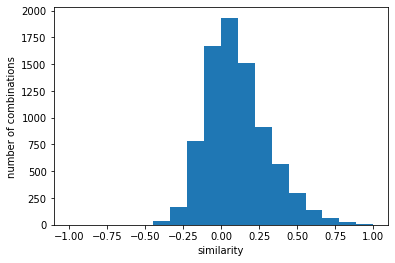

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6088789417352672}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.900e+01 2.020e+02
 9.910e+02 2.085e+03 2.543e+03 1.989e+03 1.354e+03 8.430e+02 4.780e+02
 2.460e+02 1.070e+02 5.400e+01 1.200e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


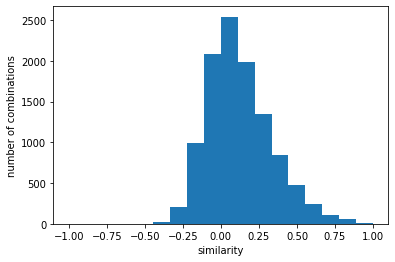

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.584827555927824}
y [  0.   0.   0.   0.   0.   4.  20. 118. 308. 418. 314. 215. 116.  69.
  27.  13.   6.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


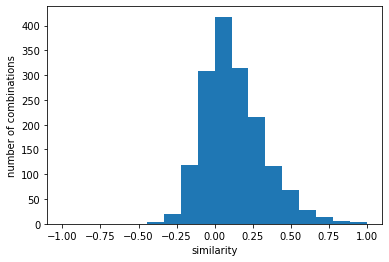

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.7911071003543378}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.800e+01 1.890e+02
 8.700e+02 1.792e+03 2.047e+03 1.586e+03 9.590e+02 5.780e+02 2.890e+02
 1.380e+02 4.100e+01 1.600e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


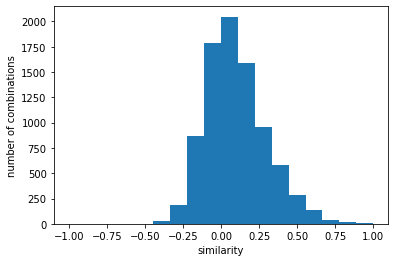

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6068578749161284}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.770e+02
 7.960e+02 1.748e+03 2.013e+03 1.505e+03 8.700e+02 4.690e+02 2.910e+02
 1.460e+02 4.400e+01 1.300e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


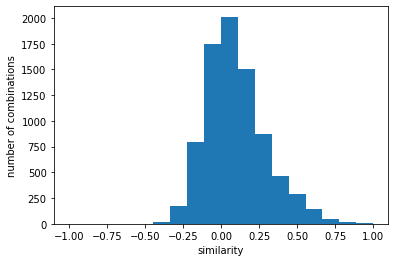

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5900158494890094}
y [  0.   0.   0.   0.   0.   5.  36. 190. 556. 786. 617. 430. 284. 172.
  94.  57.  16.   5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


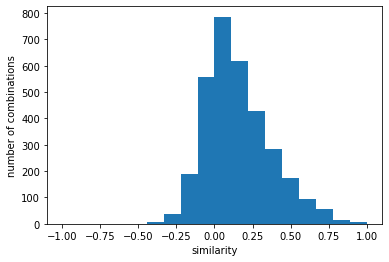

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.7632158274698705}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   45.  274.  876. 1833. 2063. 1474.  932.
  516.  227.   80.   34.   12.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


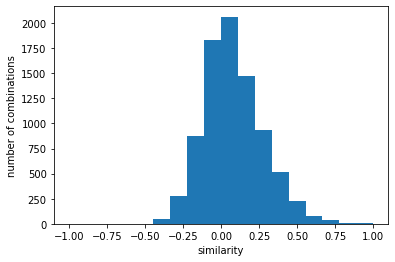

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5757823153857954}
y [  0.   0.   0.   0.   0.   6.  62. 290. 718. 962. 772. 529. 321. 174.
  67.  44.  16.   8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


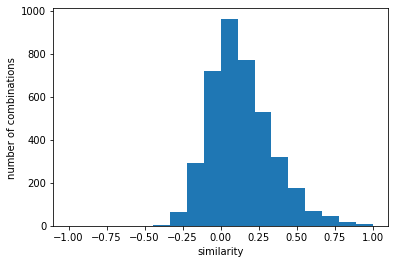

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.7315552502806386}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    9.  157.  767. 1507. 1772. 1417.  970.
  632.  359.  183.   90.   24.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


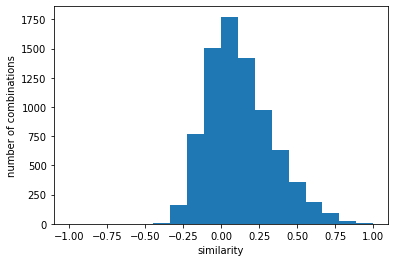

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5805170890264637}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.910e+02
 8.530e+02 1.877e+03 2.101e+03 1.651e+03 1.087e+03 6.530e+02 3.950e+02
 1.780e+02 5.900e+01 2.300e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


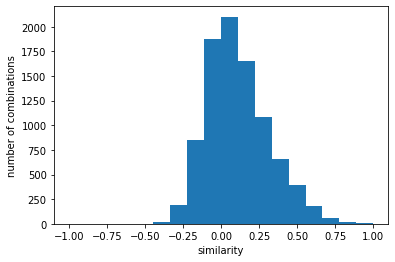

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6244642290029391}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  160.  713. 1647. 2078. 1523.  963.
  547.  269.  115.   38.   11.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


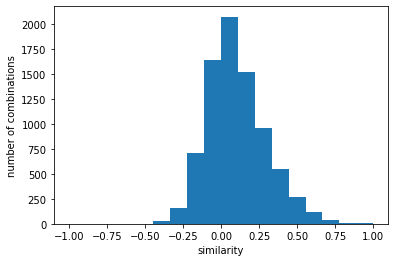

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数B（0098）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5929034278986768}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.600e+01 2.430e+02
 7.740e+02 1.483e+03 1.879e+03 1.591e+03 1.134e+03 7.440e+02 3.470e+02
 1.510e+02 5.500e+01 6.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


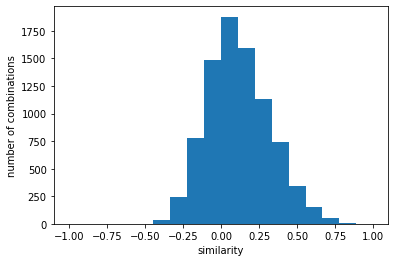

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 'similarity': 0.5721003828928202}
y [   0.    0.    0.    0.    2.   16.   90.  392.  843. 1111. 1012.  674.
  409.  209.  116.   38.   20.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


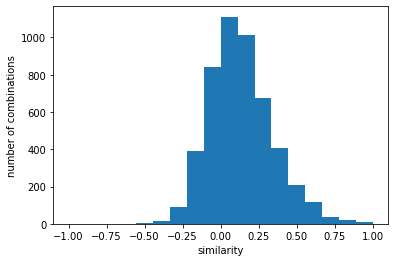

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6980677670418622}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 1.420e+02
 5.110e+02 1.191e+03 1.423e+03 1.254e+03 8.210e+02 4.240e+02 2.320e+02
 8.600e+01 3.200e+01 5.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


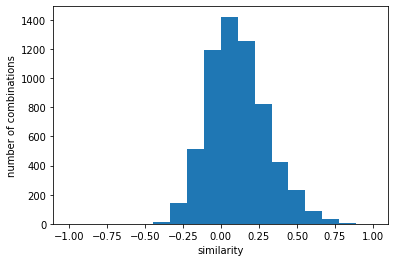

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6082725145483523}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.100e+01 9.400e+01
 4.340e+02 9.320e+02 1.009e+03 8.280e+02 5.320e+02 3.440e+02 1.770e+02
 6.300e+01 2.000e+01 7.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


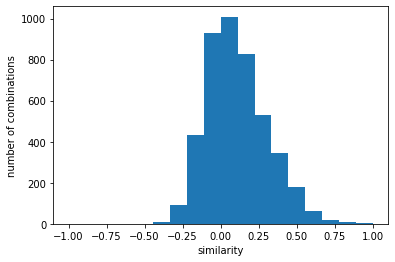

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6466259741274861}
y [  0.   0.   0.   0.   2.  14.  66. 278. 619. 723. 615. 376. 231. 134.
  89.  32.  15.   6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


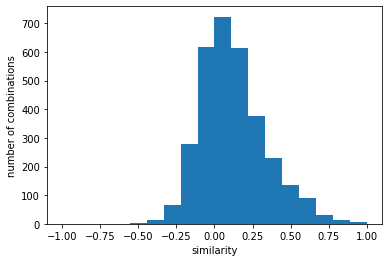

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.7321071848237813}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.900e+01 4.460e+02
 1.535e+03 2.951e+03 3.459e+03 2.924e+03 1.940e+03 1.026e+03 5.230e+02
 2.570e+02 7.800e+01 3.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


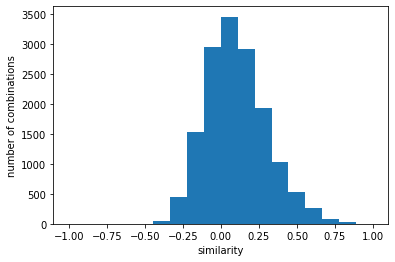

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5442941821397915}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+01 1.710e+02
 5.990e+02 1.096e+03 1.307e+03 1.243e+03 9.150e+02 5.730e+02 2.950e+02
 1.450e+02 7.000e+01 2.200e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


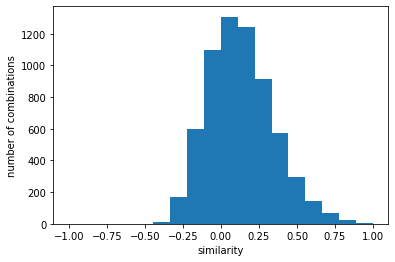

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.648570349279313}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.500e+01 2.070e+02
 7.480e+02 1.397e+03 1.521e+03 1.262e+03 7.900e+02 4.620e+02 2.760e+02
 1.370e+02 6.500e+01 2.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


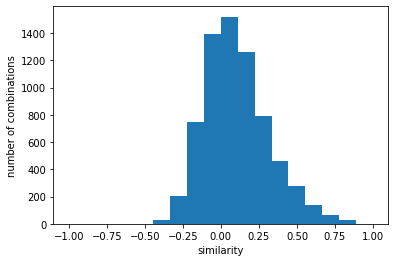

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6115190279399803}
y [  0.   0.   0.   0.   1.   7.  54. 219. 458. 570. 554. 346. 179. 104.
  61.  41.  14.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


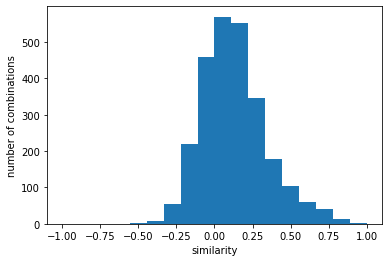

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.7684503394008763}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   34.  176.  673. 1462. 1632. 1278.  842.
  497.  243.  126.   52.   25.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


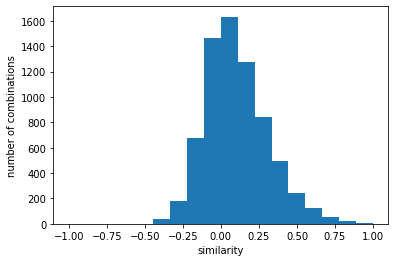

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6335171347350661}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   18.  181.  918. 1887. 2356. 2092. 1500.
  874.  409.  215.   79.   38.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


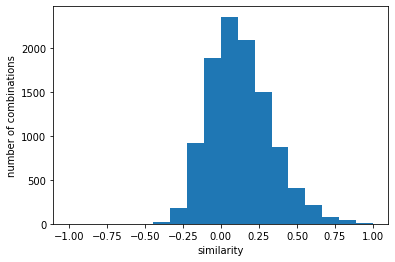

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5959919200873495}
y [  0.   0.   0.   0.   1.  10.  68. 273. 535. 646. 543. 331. 189. 102.
  61.  23.  10.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


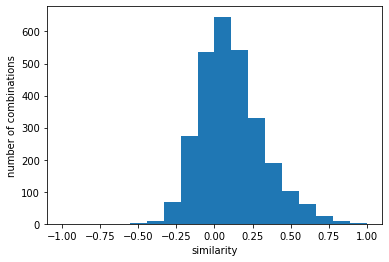

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.730068425059326}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   30.  203.  714. 1587. 1733. 1385.  889.
  502.  245.  121.   49.   16.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


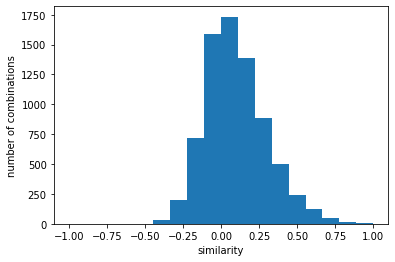

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6326039593861748}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.500e+01 2.090e+02
 7.850e+02 1.641e+03 1.832e+03 1.451e+03 9.000e+02 5.300e+02 3.030e+02
 1.790e+02 4.300e+01 1.100e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


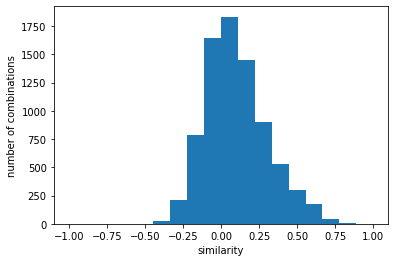

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5975219081444452}
y [  0.   0.   0.   0.   1.   8.  73. 257. 547. 706. 673. 475. 254. 162.
  93.  67.  20.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


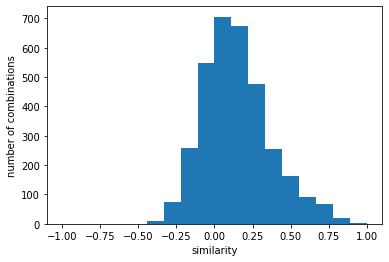

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.753645752001403}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 6.000e+01 3.150e+02
 9.840e+02 2.036e+03 2.263e+03 1.767e+03 1.144e+03 6.830e+02 2.800e+02
 1.010e+02 3.600e+01 1.500e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


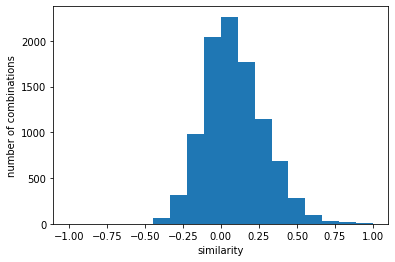

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5511548104562813}
y [  0.   0.   0.   0.   1.   5.  55. 214. 485. 594. 616. 387. 223. 125.
  48.  30.   8.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


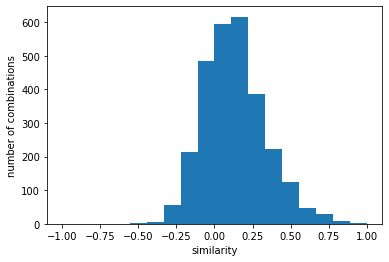

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.7682944874604057}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   16.  149.  698. 1397. 1661. 1475. 1039.
  633.  327.  169.   76.   19.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


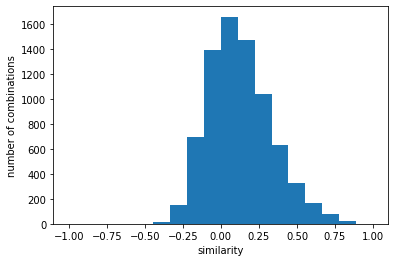

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5875141751258828}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 2.240e+02
 7.930e+02 1.638e+03 1.902e+03 1.661e+03 1.079e+03 6.510e+02 3.700e+02
 2.040e+02 4.500e+01 8.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


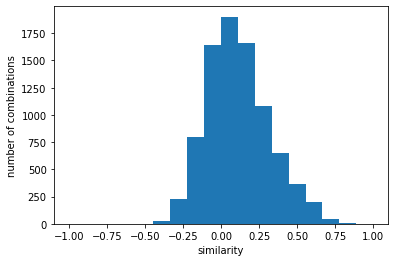

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6383874702792088}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.200e+01 2.060e+02
 7.970e+02 1.720e+03 1.981e+03 1.587e+03 1.037e+03 5.990e+02 2.950e+02
 1.360e+02 3.500e+01 1.700e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


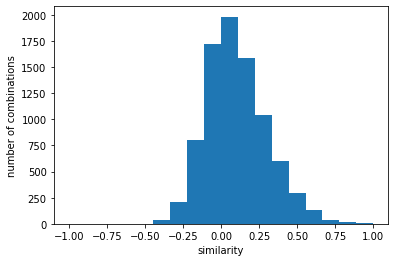

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠB(0019).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5856992499094859}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   23.  185.  642. 1389. 1663. 1378.  980.
  598.  286.  145.   62.   15.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


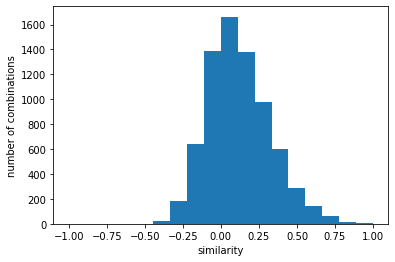

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 'similarity': 0.6147478784760668}
y [   0.    0.    0.    0.    2.   19.  100.  457. 1031. 1164. 1000.  771.
  435.  208.   96.   31.    4.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


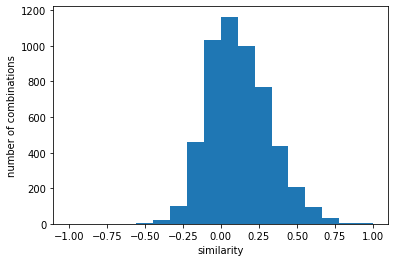

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.6334416993083856}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.900e+01 1.860e+02
 6.590e+02 1.492e+03 1.607e+03 1.140e+03 7.510e+02 5.160e+02 2.830e+02
 9.400e+01 3.500e+01 7.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


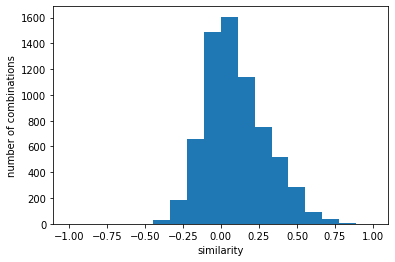

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.5717926422095186}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   30.  166.  599. 1253. 1424. 1098.  740.
  473.  232.   94.   27.   10.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


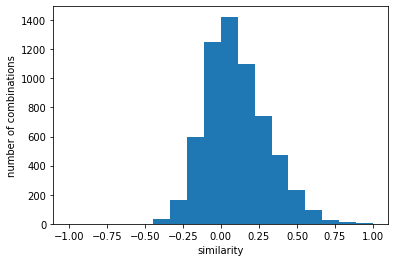

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6244801602493774}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 3.000e+00 3.600e+01 2.820e+02
 9.910e+02 2.109e+03 2.458e+03 2.121e+03 1.570e+03 9.200e+02 4.980e+02
 2.110e+02 6.600e+01 1.300e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


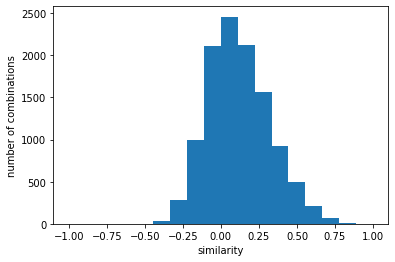

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.6042175536100639}
y [   0.    0.    0.    0.    3.   19.  133.  459.  945. 1172. 1075.  759.
  548.  283.  135.   51.   15.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


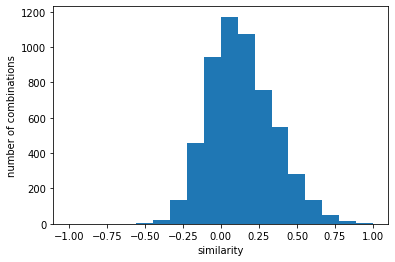

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6700280356042071}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+00 2.400e+01 1.720e+02
 5.600e+02 1.029e+03 1.230e+03 1.124e+03 7.960e+02 5.510e+02 2.670e+02
 1.090e+02 4.300e+01 5.000e+00 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


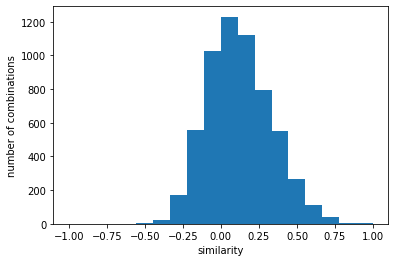

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6413164565661104}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   24.  183.  677. 1374. 1660. 1428.  969.
  589.  274.  135.   54.   11.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


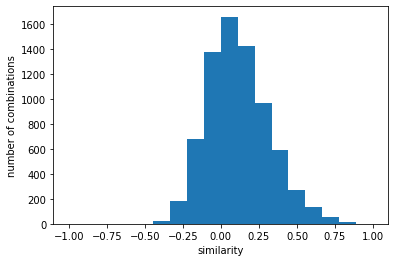

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6089502568643776}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   29.  205.  733. 1567. 1877. 1649. 1152.
  727.  363.  128.   46.   16.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


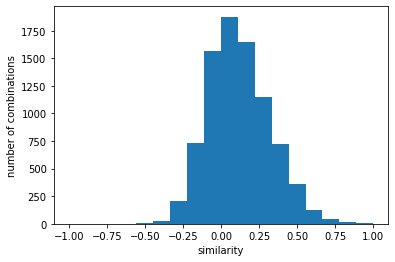

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5926802627584661}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.    9.  128.  687. 1592. 1917. 1766. 1335.
  884.  461.  192.   54.    9.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


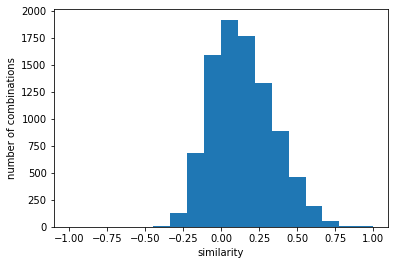

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.6213223010663189}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   21.  154.  517. 1093. 1272. 1057.  694.
  417.  204.   84.   30.    7.    0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


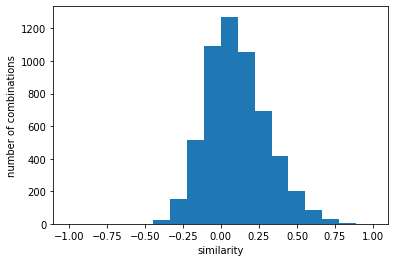

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6364034341355066}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   25.  215.  825. 1663. 2008. 1851. 1297.
  816.  400.  149.   44.    9.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


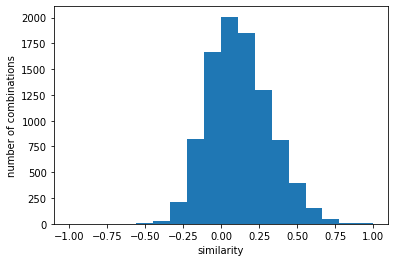

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5860283297418544}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   20.  142.  611. 1198. 1435. 1336.  896.
  514.  287.  109.   27.    4.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


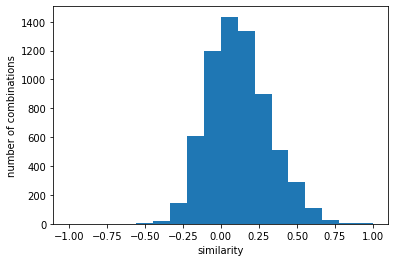

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6291467897169186}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  195.  705. 1401. 1681. 1413.  982.
  560.  301.  133.   43.   10.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


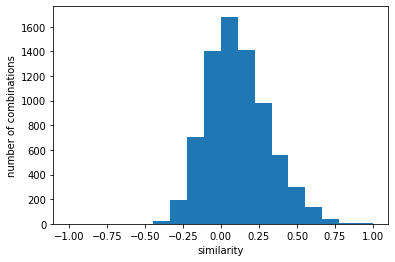

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6125402533714276}
y [  0.   0.   0.   0.   2.  16. 107. 343. 723. 816. 685. 435. 274. 152.
  72.  33.   8.   6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


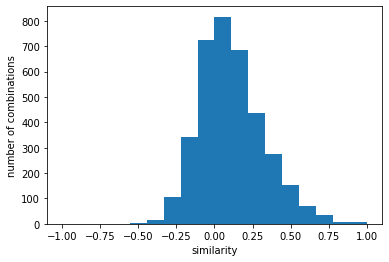

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.7270667117922254}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.700e+01 2.230e+02
 7.260e+02 1.381e+03 1.673e+03 1.413e+03 9.530e+02 5.860e+02 2.750e+02
 1.290e+02 4.300e+01 1.000e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


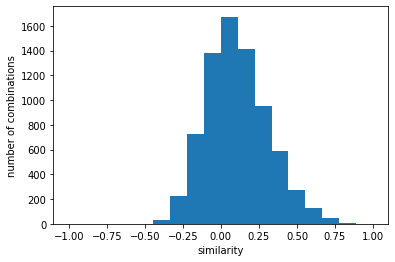

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6157398625393639}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 8.000e+00 1.430e+02
 5.740e+02 1.210e+03 1.416e+03 1.334e+03 1.037e+03 7.010e+02 3.690e+02
 1.320e+02 3.200e+01 9.000e+00 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


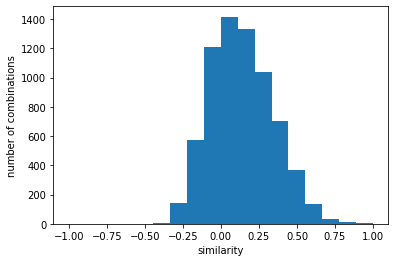

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6027868222339036}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   17.  150.  626. 1310. 1621. 1528. 1088.
  654.  349.  134.   36.    6.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


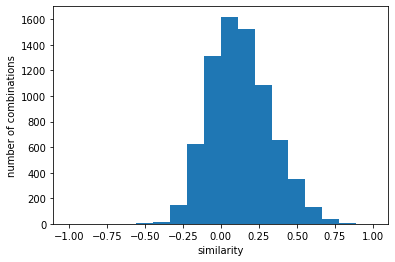

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6582723828196397}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   22.  196.  745. 1570. 1938. 1697. 1253.
  776.  339.  122.   32.    8.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


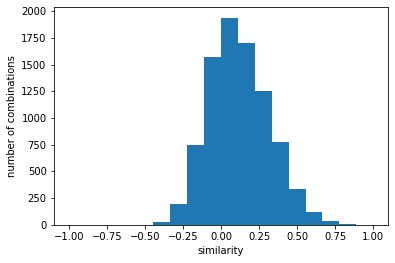

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3コンピュータグラフィックス(2145).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.57279884802}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   16.  110.  575. 1177. 1465. 1267.  779.
  406.  230.   94.   36.   15.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


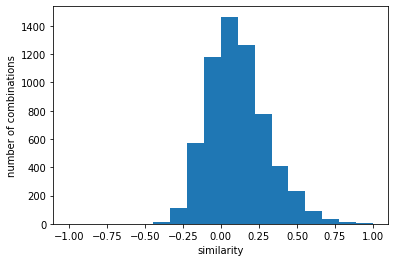

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 'similarity': 0.607379505052156}
y

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


 [   0.    0.    0.    0.    0.   12.   75.  459.  961. 1201.  885.  576.
  280.  166.   83.   30.   32.   14.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


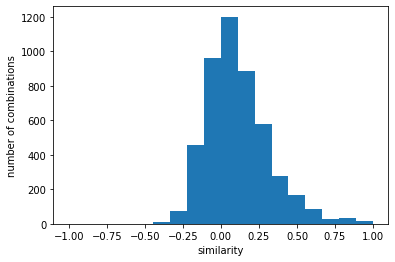

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6408588658534661}
y [  0.   0.   0.   0.   0.   7.  23. 165. 351. 495. 433. 348. 181.  78.
  45.  24.   6.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


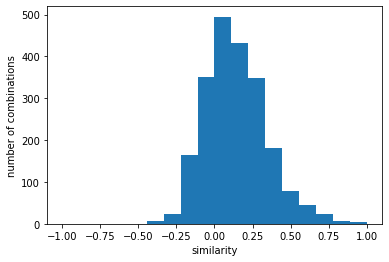

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.7819611280163814}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.800e+01 3.230e+02
 1.281e+03 2.526e+03 2.726e+03 2.204e+03 1.487e+03 8.590e+02 4.300e+02
 2.150e+02 9.700e+01 4.000e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


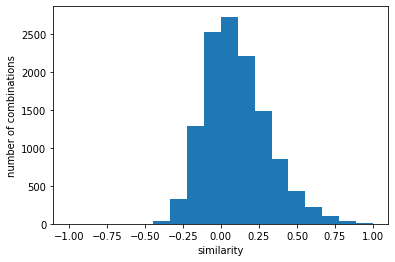

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5882884557306719}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.720e+02
 6.290e+02 1.169e+03 1.469e+03 1.323e+03 9.010e+02 5.650e+02 2.700e+02
 1.240e+02 5.800e+01 2.800e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


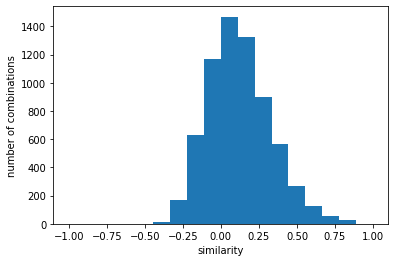

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6373685223151181}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 1.580e+02
 7.230e+02 1.396e+03 1.531e+03 1.115e+03 7.340e+02 4.420e+02 2.430e+02
 1.200e+02 4.900e+01 2.100e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


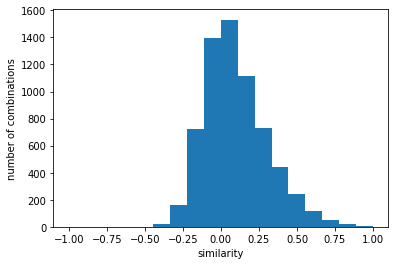

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.618204848100824}
y [  0.   0.   0.   0.   0.   6.  45. 282. 668. 979. 766. 536. 273. 150.
  74.  39.  16.   9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


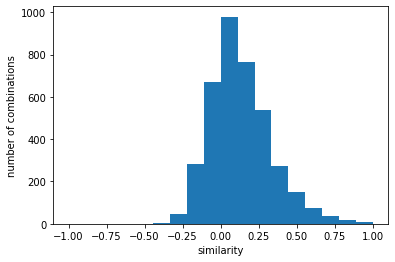

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.7288654222173212}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   24.  151.  751. 1568. 1950. 1507.  909.
  530.  261.  108.   37.   18.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


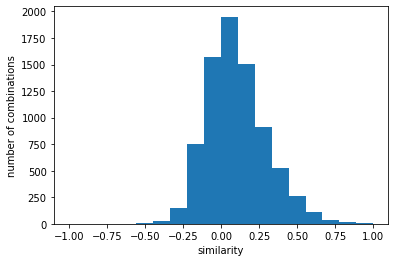

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6121067788124562}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.800e+01 1.800e+02
 9.670e+02 2.002e+03 2.401e+03 1.901e+03 1.289e+03 8.040e+02 4.420e+02
 2.260e+02 8.400e+01 4.900e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


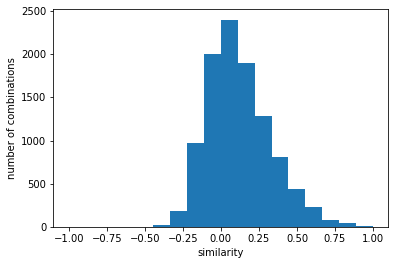

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.592029504059709}
y [  0.   0.   0.   0.   0.   3.  16. 103. 252. 402. 353. 239. 136.  55.
  30.  12.   5.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


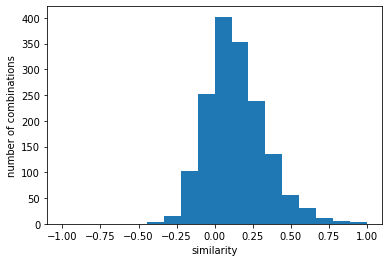

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.7959236340163299}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   20.  183.  857. 1719. 2108. 1635.  936.
  536.  252.  121.   42.   16.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


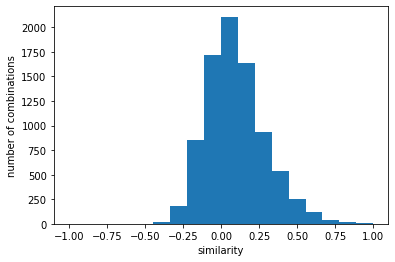

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6062319398412739}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 1.530e+02
 7.630e+02 1.631e+03 1.808e+03 1.424e+03 8.600e+02 4.770e+02 3.030e+02
 1.470e+02 4.300e+01 1.300e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


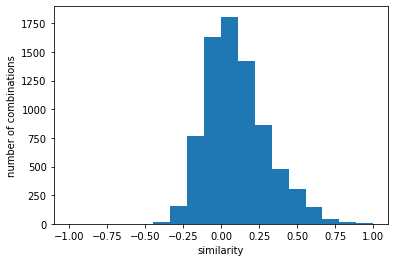

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6010267818727612}
y [  0.   0.   0.   0.   0.   2.  39. 217. 564. 803. 666. 469. 257. 155.
  78.  37.  12.   7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


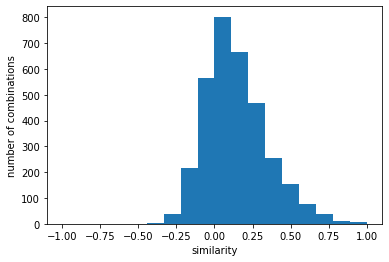

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.7572550975695359}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   45.  254.  872. 1790. 2060. 1595. 1062.
  532.  270.  105.   41.   13.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


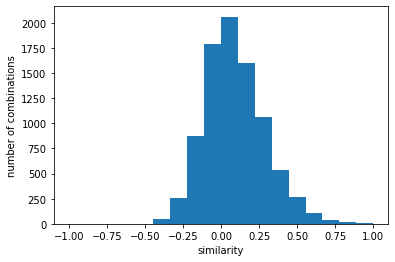

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.571651175020587}
y [   0.    0.    0.    0.    0.    5.   55.  286.  685. 1020.  856.  564.
  285.  159.   67.   29.   10.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


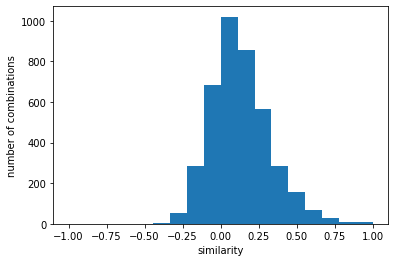

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.7276234496240601}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    5.  133.  769. 1492. 1822. 1473.  999.
  635.  380.  175.   85.   21.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


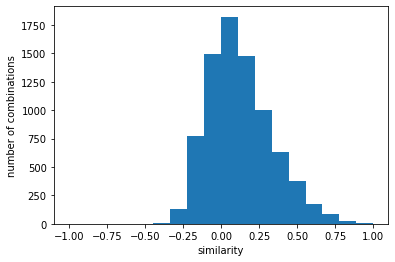

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5770805339241141}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.500e+01 1.900e+02
 9.370e+02 2.002e+03 2.231e+03 1.804e+03 1.169e+03 6.730e+02 4.170e+02
 2.140e+02 5.300e+01 2.100e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


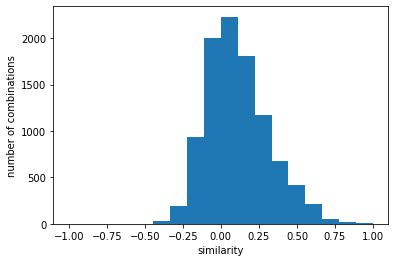

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.607699776152731}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   23.  155.  685. 1582. 1958. 1573. 1003.
  574.  273.  117.   42.   12.   11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


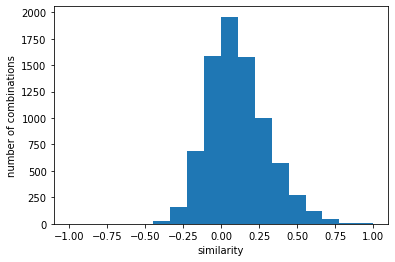

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数A（0097）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.595620211106073}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.600e+01 1.220e+02
 5.280e+02 1.116e+03 1.237e+03 9.940e+02 5.450e+02 2.920e+02 1.840e+02
 5.500e+01 2.100e+01 1.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


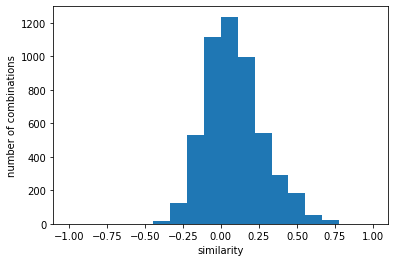

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 'similarity': 0.6400970069998}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   13.  106.  456. 1009. 1190.  947.  524.
  276.  163.   57.   30.    9.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


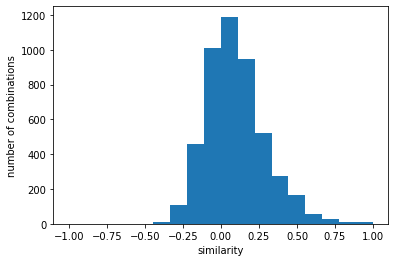

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.6819128186839557}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 1.780e+02
 8.290e+02 1.939e+03 2.284e+03 1.805e+03 1.143e+03 6.380e+02 3.270e+02
 1.590e+02 4.600e+01 1.300e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


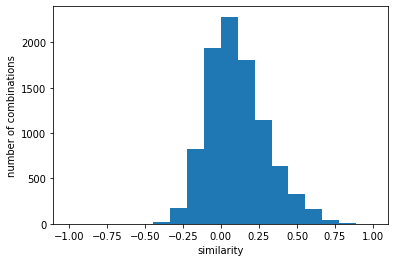

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.6575567212683985}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [  0.   0.   0.   0.   0.   3.  75. 308. 787. 956. 795. 571. 359. 173.
  94.  27.   9.   4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


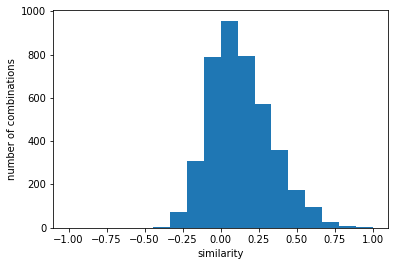

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.7319528773905761}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   19.  111.  437.  871. 1111.  903.  645.
  367.  232.  110.   45.    9.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


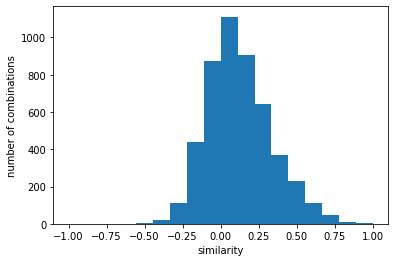

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6972260982813369}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 8.000e+00 1.200e+02
 5.570e+02 1.208e+03 1.423e+03 1.200e+03 7.010e+02 3.330e+02 2.140e+02
 8.300e+01 2.700e+01 5.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


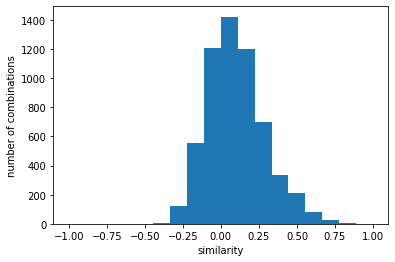

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6612266271469341}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 1.500e+01 9.500e+01
 4.250e+02 9.820e+02 1.247e+03 1.084e+03 7.460e+02 4.470e+02 2.540e+02
 1.090e+02 2.600e+01 7.000e+00 1.000e+00]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.



ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


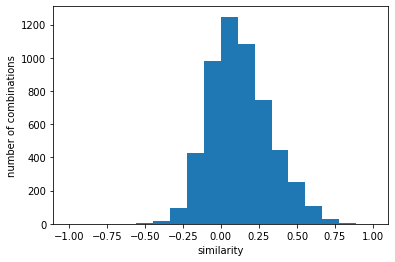

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6987656427816828}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   16.  110.  546. 1354. 1694. 1398.  950.
  559.  280.  150.   37.    4.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


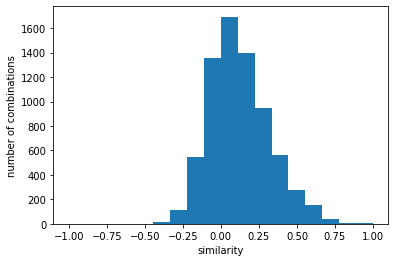

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.6821469062638601}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [  0.   0.   0.   0.   0.   7.  88. 400. 809. 986. 848. 469. 206. 134.
  47.  26.   6.   0.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


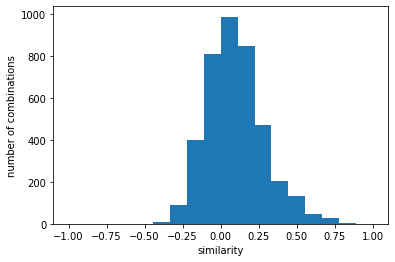

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.7026642765834379}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.240e+02
 5.050e+02 1.108e+03 1.371e+03 1.157e+03 7.770e+02 4.490e+02 2.550e+02
 1.130e+02 3.100e+01 8.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


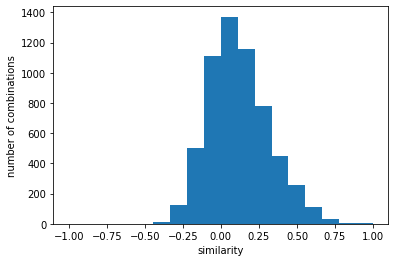

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6922020815616031}
y [   0.    0.    0.    0.    0.   11.   95.  436.  985. 1212.  990.  658.
  364.  207.  137.   43.    4.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


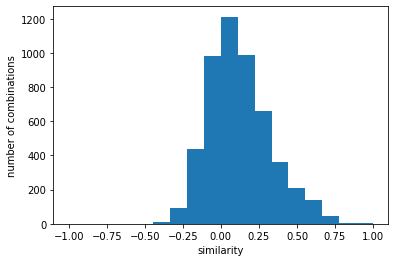

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6948402432126011}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.100e+01 1.270e+02
 5.290e+02 1.126e+03 1.391e+03 1.173e+03 7.090e+02 3.640e+02 2.270e+02
 8.600e+01 2.800e+01 8.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


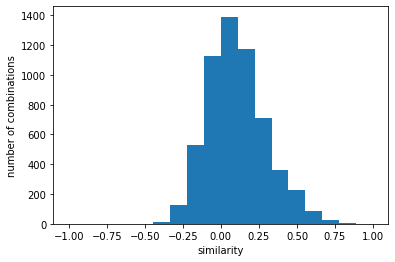

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6731620777660136}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 1.450e+02
 6.200e+02 1.205e+03 1.423e+03 1.093e+03 7.740e+02 3.810e+02 2.050e+02
 7.600e+01 2.600e+01 8.000e+00 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


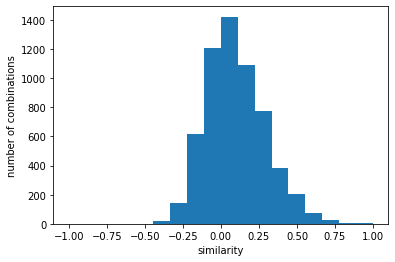

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6598113091625052}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    7.  133.  537. 1129. 1341. 1119.  686.
  341.  206.   78.   25.    6.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


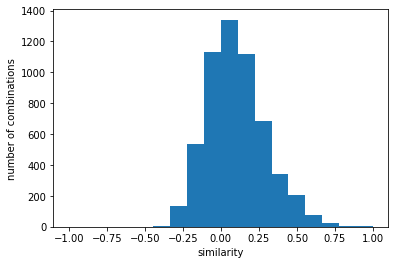

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6808856633854183}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    7.   94.  390.  822. 1043.  902.  611.
  355.  182.   86.   37.    3.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


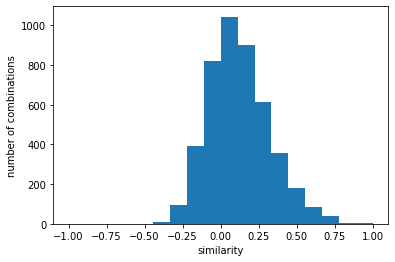

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6909229579046688}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 8.000e+00 8.200e+01
 3.860e+02 8.920e+02 1.107e+03 8.870e+02 5.970e+02 3.710e+02 1.870e+02
 1.290e+02 4.300e+01 1.000e+00 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


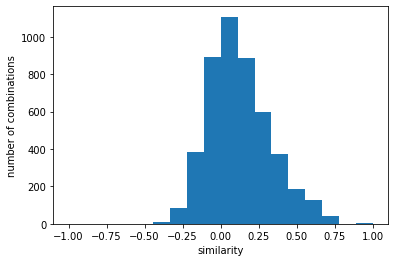

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.7597673337191077}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.100e+01 1.170e+02
 5.430e+02 1.026e+03 1.396e+03 1.188e+03 7.560e+02 4.780e+02 2.360e+02
 1.200e+02 3.300e+01 1.100e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


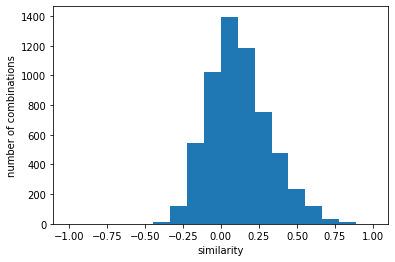

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3エネルギー変換工学A(2117).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6663518954559411}
y [  0.   0.   0.   0.   0.   4.  46. 374. 824. 897. 555. 317. 193. 118.
  58.  19.  29.  11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


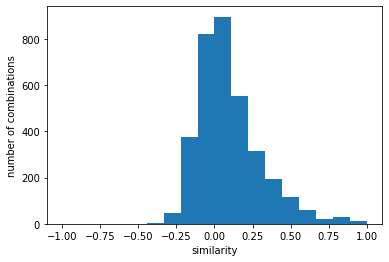

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 'similarity': 0.7336805458011394}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 4.700e+01 3.620e+02
 1.344e+03 2.901e+03 2.999e+03 2.197e+03 1.221e+03 6.760e+02 3.550e+02
 1.570e+02 7.600e+01 3.000e+01 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


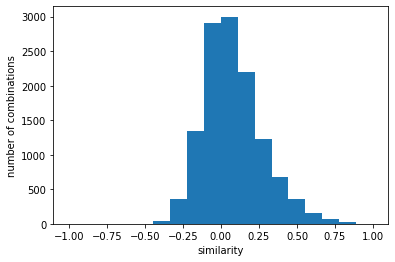

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.5782148626055563}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.700e+01 1.840e+02
 6.870e+02 1.331e+03 1.431e+03 1.214e+03 7.470e+02 4.640e+02 2.560e+02
 1.120e+02 6.600e+01 5.000e+01 2.600e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


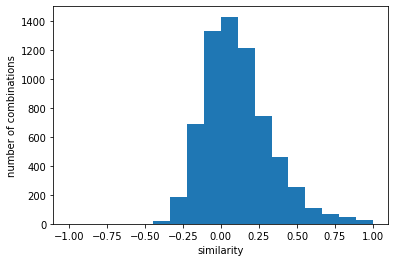

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6213728662798216}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 1.890e+02
 6.330e+02 1.329e+03 1.416e+03 1.022e+03 7.000e+02 4.120e+02 2.520e+02
 9.300e+01 3.800e+01 1.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


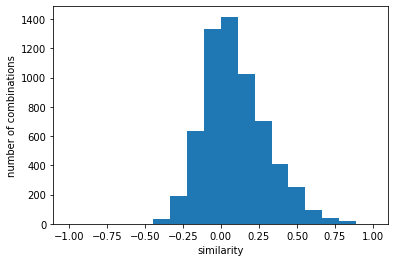

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6197365450025303}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 8.000e+00 7.500e+01
 3.470e+02 9.440e+02 1.113e+03 8.730e+02 5.410e+02 3.210e+02 1.730e+02
 7.600e+01 3.500e+01 7.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


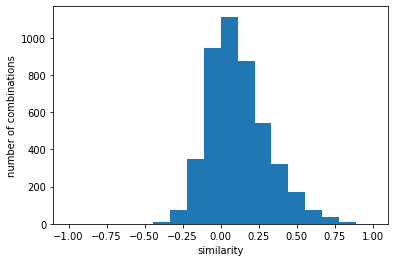

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.685819096940974}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   36.  228.  823. 1675. 1795. 1227.  698.
  421.  253.   89.   35.    9.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


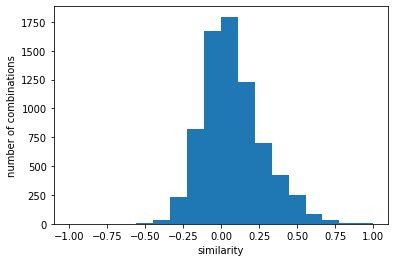

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.599919284473457}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.300e+01 1.780e+02
 7.560e+02 1.937e+03 2.361e+03 1.823e+03 1.172e+03 7.180e+02 3.820e+02
 1.790e+02 6.800e+01 2.700e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


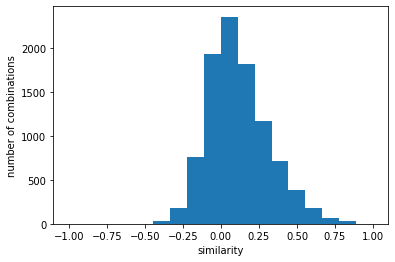

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5901780487721693}
y [  0.   0.   0.   0.   0.   4.  58. 300. 606. 732. 506. 318. 145.  75.
  45.  15.   0.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


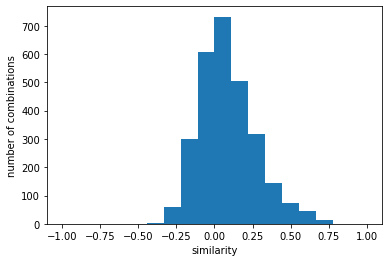

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.7303977727278004}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   33.  238.  841. 1707. 1983. 1233.  680.
  409.  242.   91.   31.    5.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


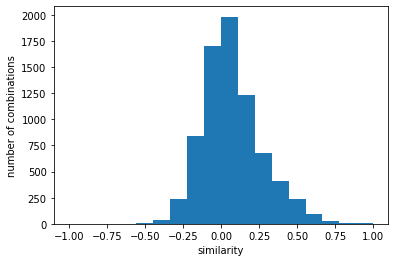

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6038049679626837}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   20.  149.  785. 1522. 1655. 1181.  652.
  402.  242.  120.   34.   18.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


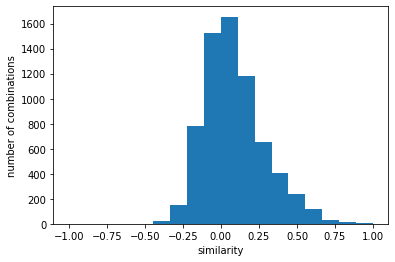

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6288744209338629}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   10.   89.  384.  968. 1153.  891.  560.
  305.  193.   96.   41.    5.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


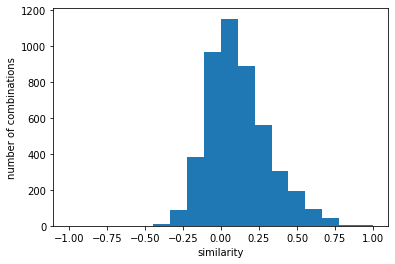

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6860277442645735}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   53.  230.  930. 1888. 1967. 1360.  816.
  444.  247.  100.   34.   13.   18.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


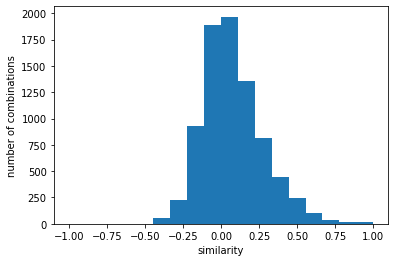

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5874822123175825}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    9.   77.  356.  949. 1008.  812.  525.
  288.  152.   69.   25.    3.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


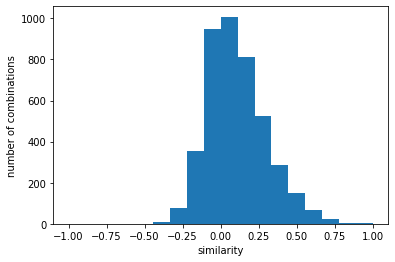

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.7023105947343908}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   14.  136.  539. 1297. 1526. 1105.  698.
  475.  250.  117.   57.    9.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


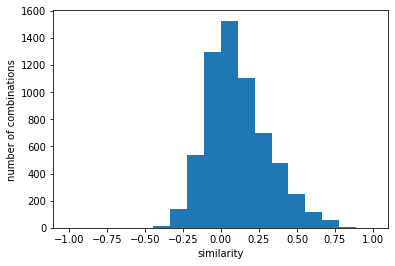

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6281257096580173}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   27.  214.  971. 1828. 1927. 1452.  792.
  506.  322.  145.   36.    9.   18.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


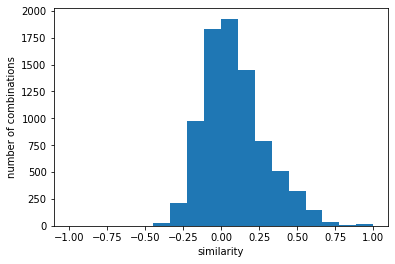

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.618935591724612}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   44.  179.  793. 1762. 1833. 1190.  692.
  464.  201.  110.   33.   10.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


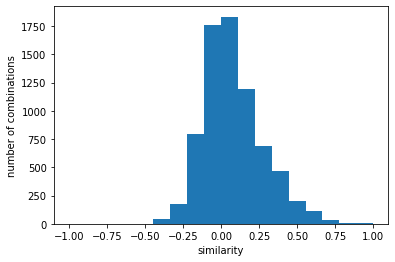

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2解析学Ⅱ（0281）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6062068319074715}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.000e+01 2.930e+02
 1.194e+03 2.476e+03 2.680e+03 2.159e+03 1.421e+03 8.270e+02 4.220e+02
 1.880e+02 7.300e+01 3.700e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


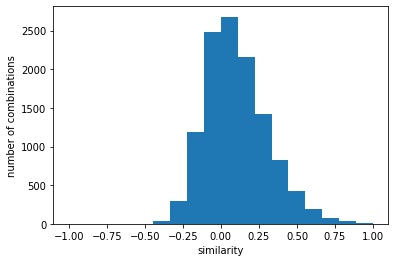

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 'similarity': 0.605218218024106}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   15.  155.  542. 1070. 1245.  987.  720.
  489.  243.  138.   64.   24.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


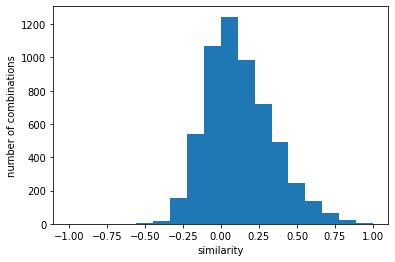

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.6553204815703729}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.900e+01 1.710e+02
 6.910e+02 1.370e+03 1.457e+03 1.087e+03 7.020e+02 4.180e+02 2.360e+02
 9.900e+01 3.100e+01 2.200e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


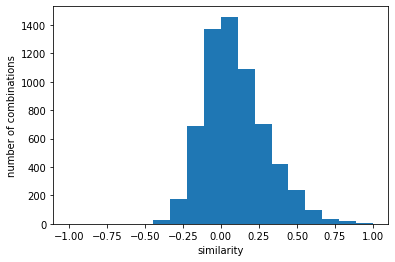

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6135003631311459}
y [  0.   0.   0.   0.   0.  12.  46. 289. 606. 791. 618. 434. 213. 151.
  77.  44.  19.   6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


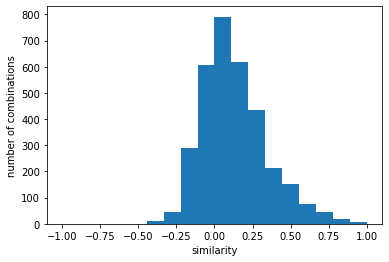

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.7385432845198725}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   33.  146.  673. 1518. 1753. 1399.  814.
  468.  245.   95.   42.   10.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


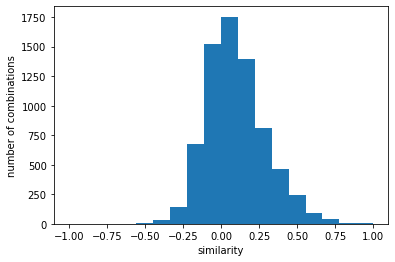

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6166027392915886}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 3.100e+01 2.120e+02
 1.010e+03 2.097e+03 2.498e+03 2.014e+03 1.345e+03 8.460e+02 4.360e+02
 2.270e+02 8.800e+01 4.000e+01 1.000e+01]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


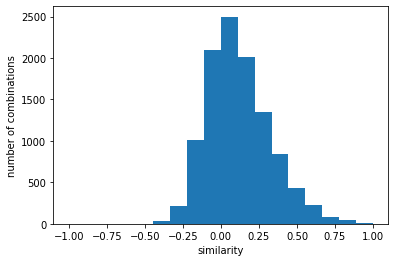

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5702957255852492}
y [  0.   0.   0.   0.   0.   4.  10.  95. 199. 239. 145.  71.  32.  16.
   6.   2.   1.   5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


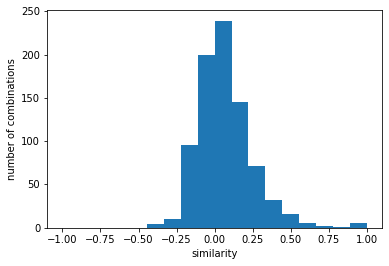

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.8313009033446926}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   28.  172.  803. 1694. 1943. 1539.  864.
  504.  253.  109.   37.   10.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


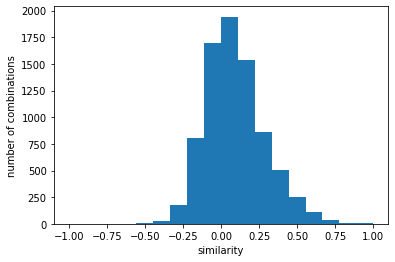

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6066314108124484}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   21.  149.  664. 1481. 1626. 1278.  781.
  430.  257.  133.   37.    9.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


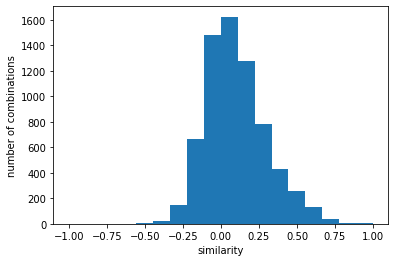

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6311477313283499}
y [  0.   0.   0.   0.   0.   9.  38. 268. 593. 824. 607. 428. 217. 152.
  70.  26.   5.   8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


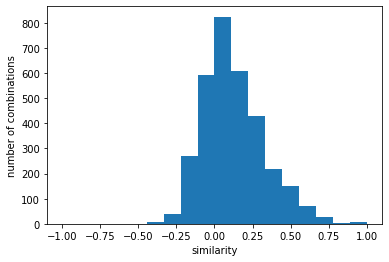

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.7463425295473635}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   42.  222.  764. 1641. 1776. 1318.  886.
  462.  232.   83.   31.   11.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


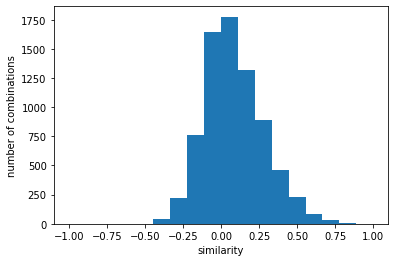

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6086809974546287}
y [  0.   0.   0.   0.   0.   6.  39. 273. 638. 762. 610. 439. 226. 137.
  67.  27.   8.   8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


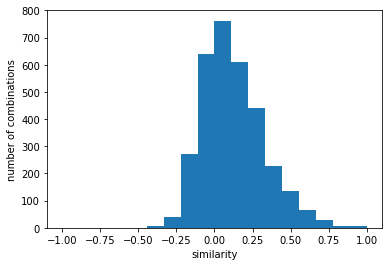

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.7452317765805498}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   10.  105.  602. 1241. 1482. 1210.  839.
  539.  308.  136.   65.   16.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


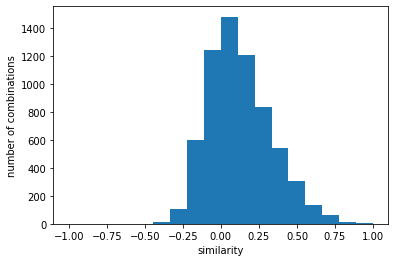

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6241855111068001}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   28.  196.  811. 1707. 1886. 1547.  963.
  563.  351.  151.   41.   14.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


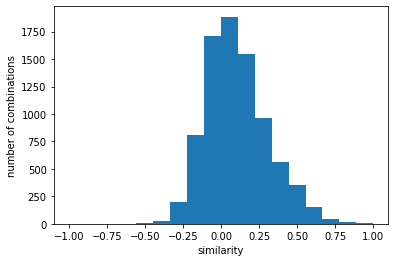

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6278893065181106}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   23.  142.  657. 1445. 1660. 1375.  875.
  517.  226.   86.   25.    7.    9.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


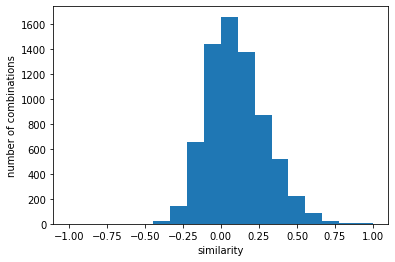

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_2線形代数C（0099）.txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6277917458674598}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.100e+01 2.880e+02
 9.880e+02 2.255e+03 2.739e+03 2.289e+03 1.635e+03 1.008e+03 4.770e+02
 2.020e+02 6.600e+01 2.300e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


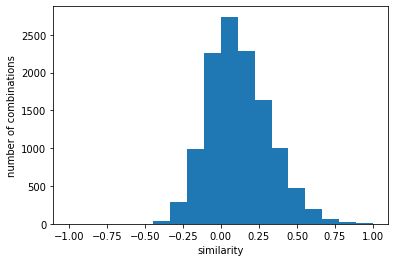

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 'similarity': 0.5022178143124811}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 5.000e+00 4.100e+01 2.660e+02
 1.078e+03 2.232e+03 2.317e+03 1.902e+03 1.453e+03 8.520e+02 5.040e+02
 2.320e+02 1.000e+02 3.200e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


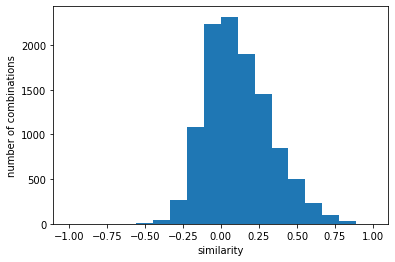

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.5066701357844031}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.400e+01 3.690e+02
 1.293e+03 2.663e+03 3.006e+03 2.499e+03 1.497e+03 7.880e+02 3.940e+02
 1.970e+02 7.500e+01 4.300e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


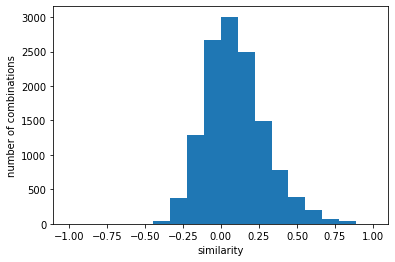

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.4719362868946796}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   31.  251. 1055. 2374. 2896. 2475. 1626.
  897.  489.  240.   96.   34.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


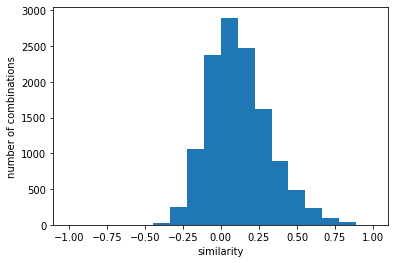

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.5047142504493992}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   28.  239. 1117. 2291. 2718. 2295. 1739.
 1112.  603.  299.  109.   18.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


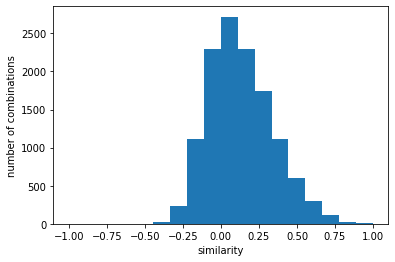

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.5421851042713938}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.700e+01 2.970e+02
 1.102e+03 2.243e+03 2.444e+03 1.863e+03 1.171e+03 5.800e+02 2.950e+02
 1.460e+02 6.600e+01 2.900e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


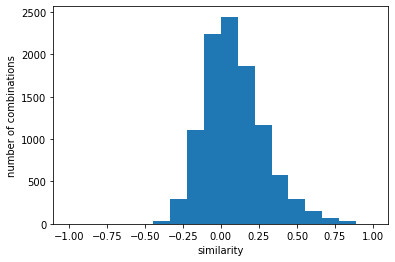

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.48885816228353063}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   37.  252. 1127. 2462. 2991. 2473. 1648.
  959.  530.  286.  113.   37.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


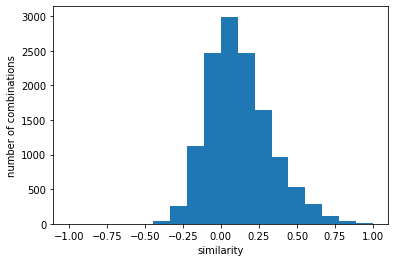

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5105593759547689}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 2.280e+02
 9.730e+02 2.078e+03 2.558e+03 2.221e+03 1.536e+03 9.490e+02 4.700e+02
 2.310e+02 6.100e+01 2.000e+01 0.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


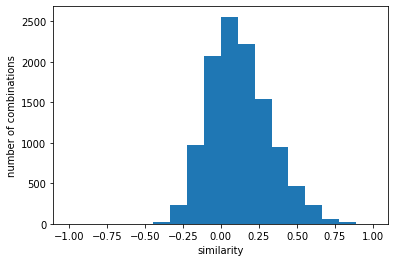

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5323436082977681}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.100e+01 3.470e+02
 1.268e+03 2.654e+03 2.979e+03 2.459e+03 1.555e+03 7.990e+02 4.040e+02
 2.220e+02 6.500e+01 3.600e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


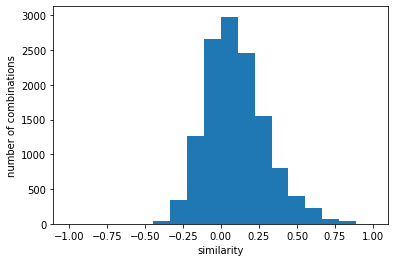

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.480738700193423}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    6.   38.  302. 1218. 2644. 2954. 2366. 1603.
  926.  434.  194.   69.   30.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


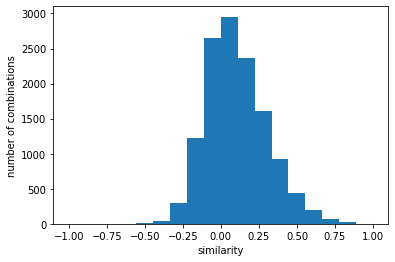

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.500470043620568}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 4.700e+01 3.750e+02
 1.289e+03 2.670e+03 3.037e+03 2.570e+03 1.579e+03 8.460e+02 4.000e+02
 2.010e+02 6.800e+01 2.900e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


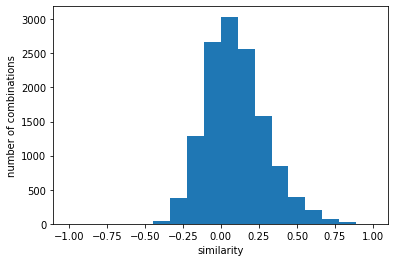

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.48041663858661293}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.200e+01 1.780e+02
 9.020e+02 2.050e+03 2.404e+03 2.021e+03 1.525e+03 1.012e+03 5.550e+02
 2.560e+02 1.010e+02 2.200e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


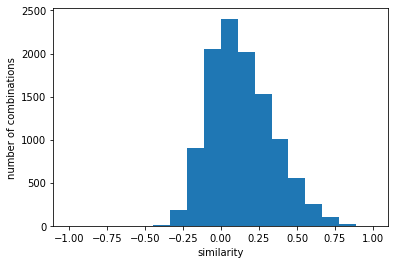

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5200873360507854}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 3.000e+01 2.920e+02
 1.145e+03 2.471e+03 3.058e+03 2.743e+03 1.875e+03 1.134e+03 6.030e+02
 2.990e+02 8.200e+01 1.900e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


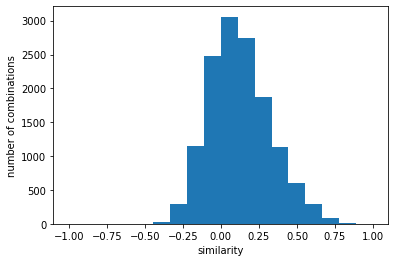

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.5305379286432578}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.600e+01 2.750e+02
 1.138e+03 2.558e+03 3.019e+03 2.506e+03 1.688e+03 9.490e+02 4.670e+02
 1.810e+02 4.600e+01 2.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


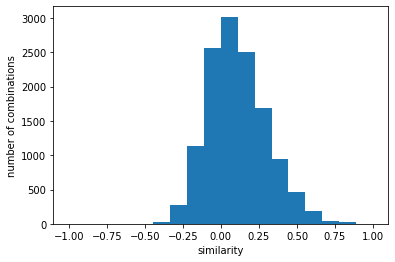

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3メカニズム・設計概論(2153).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.49798857673824215}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   19.  171.  521. 1060. 1184. 1160.  842.
  553.  332.  135.   71.   28.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


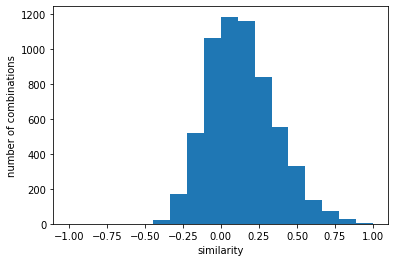

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 'similarity': 0.6508315302257578}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.400e+01 1.880e+02
 6.950e+02 1.333e+03 1.618e+03 1.439e+03 9.450e+02 5.910e+02 3.270e+02
 1.480e+02 5.900e+01 3.200e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


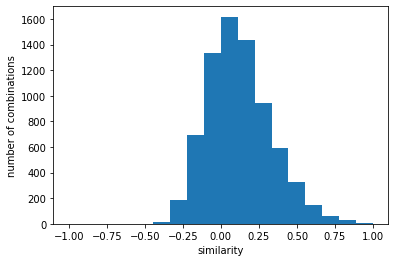

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6205704529038736}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   28.  181.  589. 1413. 1734. 1487. 1073.
  666.  372.  176.   70.   30.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


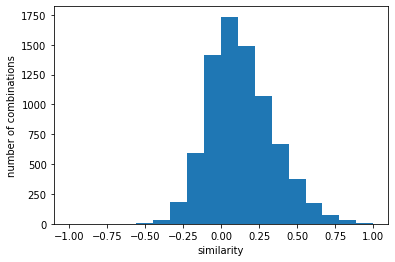

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6243130164210815}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.700e+01 1.510e+02
 6.240e+02 1.471e+03 1.811e+03 1.712e+03 1.354e+03 8.820e+02 4.620e+02
 2.040e+02 7.500e+01 2.800e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


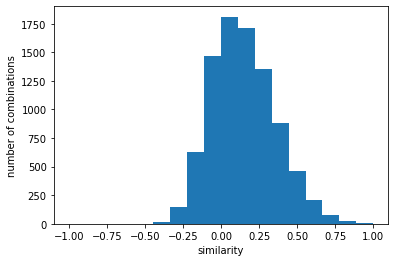

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.6417622129934399}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.100e+01 1.550e+02
 5.150e+02 9.700e+02 1.085e+03 8.960e+02 5.810e+02 3.490e+02 1.850e+02
 1.150e+02 5.400e+01 2.100e+01 2.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


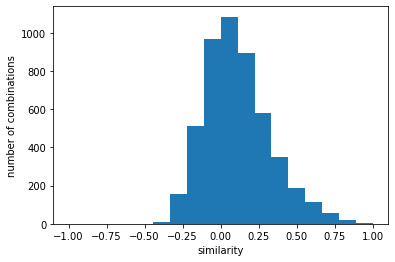

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6631371835395298}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   25.  197.  661. 1517. 1926. 1650. 1237.
  732.  398.  179.   68.   24.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


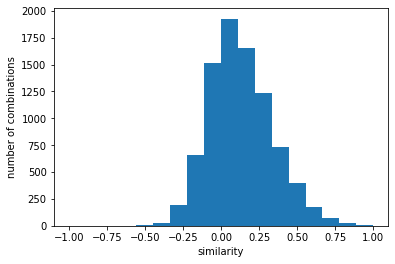

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6169925707460041}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   19.  152.  550. 1221. 1436. 1330.  879.
  541.  323.  131.   33.   12.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


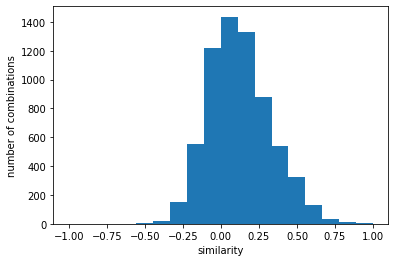

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.640266328293613}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 2.070e+02
 7.050e+02 1.347e+03 1.623e+03 1.441e+03 9.890e+02 6.240e+02 3.710e+02
 1.970e+02 9.300e+01 3.800e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


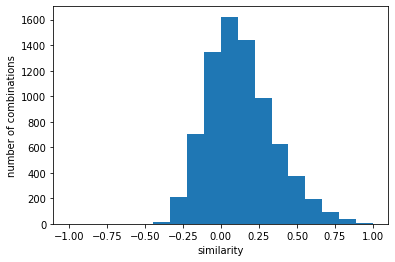

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.624630901466359}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   27.  208.  649. 1275. 1517. 1228.  820.
  453.  244.   88.   26.   13.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


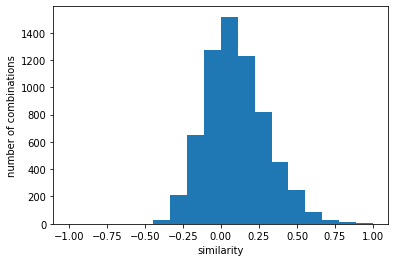

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6322658785491615}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.990e+02
 6.720e+02 1.303e+03 1.578e+03 1.382e+03 8.990e+02 5.710e+02 3.090e+02
 1.350e+02 4.900e+01 2.200e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


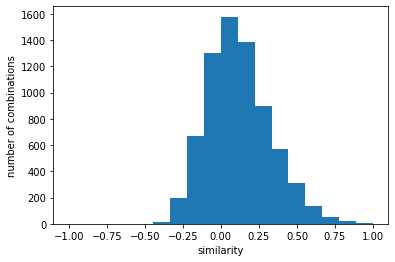

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6364227898131626}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.300e+01 1.150e+02
 4.330e+02 9.840e+02 1.129e+03 1.068e+03 8.790e+02 6.360e+02 3.520e+02
 1.450e+02 6.400e+01 1.800e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


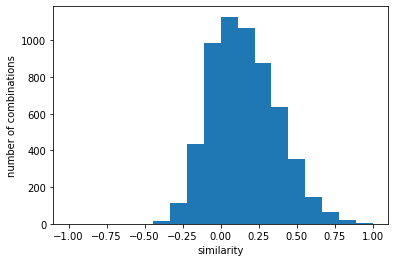

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6474464257260645}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   19.  139.  542. 1261. 1519. 1507. 1012.
  702.  408.  159.   40.   10.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


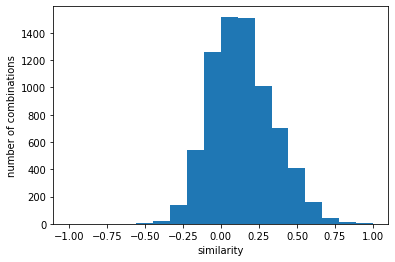

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6789680590994343}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   24.  189.  677. 1499. 1784. 1618. 1152.
  710.  332.  132.   42.   25.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


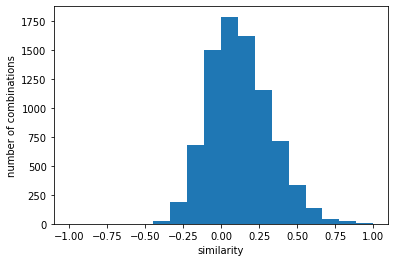

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ディジタル回路ⅠA(2093).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.596849615144414}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.500e+01 2.010e+02
 7.860e+02 1.539e+03 1.651e+03 1.333e+03 7.660e+02 4.530e+02 2.490e+02
 1.480e+02 5.500e+01 2.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


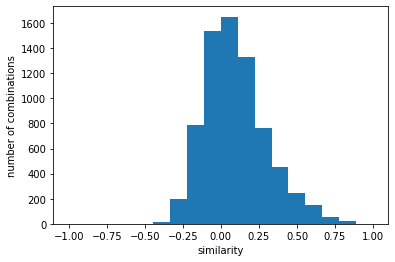

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 'similarity': 0.6083755645822522}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   28.  157.  600. 1260. 1525. 1275.  885.
  490.  290.  157.   88.   25.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


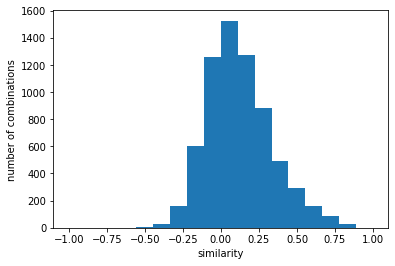

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6448992196403098}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 7.000e+00 1.300e+02
 5.190e+02 1.063e+03 1.315e+03 1.184e+03 8.530e+02 5.010e+02 3.030e+02
 1.630e+02 6.200e+01 3.000e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


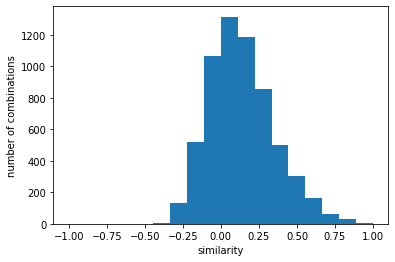

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.6992629316742329}
y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 1.570e+02
 6.010e+02 1.185e+03 1.277e+03 9.760e+02 5.870e+02 2.970e+02 1.590e+02
 8.400e+01 2.800e+01 1.700e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


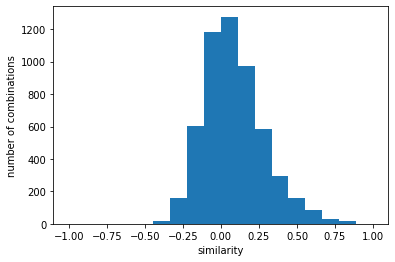

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.63539151243346}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   30.  164.  664. 1369. 1589. 1321.  891.
  474.  272.  139.   67.   21.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


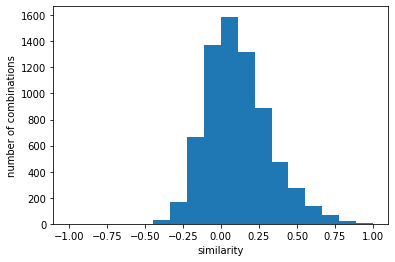

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6461503969572453}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.    6.  154.  546. 1078. 1223.  981.  614.
  307.  159.  102.   38.   23.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


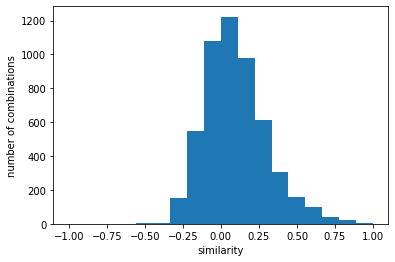

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.674680759957292}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.700e+01 2.040e+02
 8.120e+02 1.578e+03 1.747e+03 1.391e+03 8.690e+02 4.660e+02 2.910e+02
 1.720e+02 7.600e+01 2.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


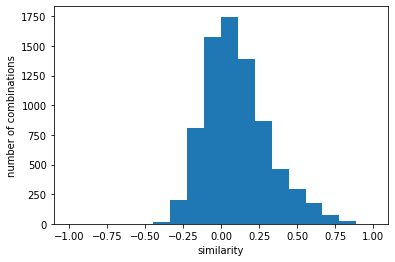

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6068612567435308}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.000e+01 4.900e+01 2.590e+02
 9.120e+02 1.717e+03 1.900e+03 1.385e+03 8.520e+02 4.830e+02 1.950e+02
 7.900e+01 4.100e+01 1.400e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


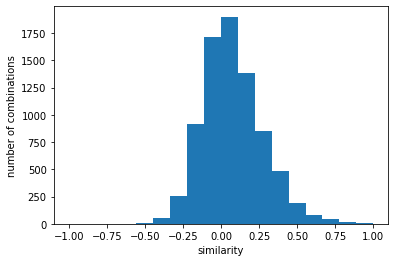

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5870359617183433}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 2.240e+02
 8.830e+02 1.656e+03 1.800e+03 1.495e+03 9.020e+02 5.240e+02 2.770e+02
 1.380e+02 5.000e+01 2.500e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


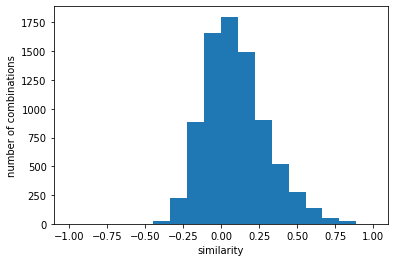

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5998093797054721}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 4.000e+00 1.000e+02
 4.370e+02 8.830e+02 1.043e+03 9.310e+02 6.410e+02 4.130e+02 2.590e+02
 1.460e+02 7.200e+01 3.400e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


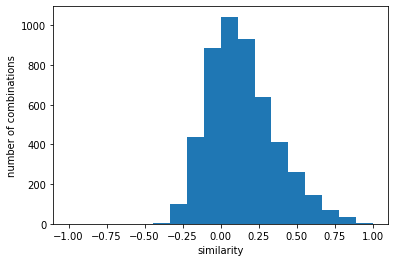

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6664551102912107}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.    8.  160.  602. 1075. 1341. 1174.  784.
  446.  256.  170.   65.   23.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


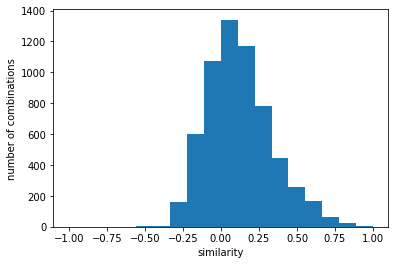

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.7020150036289277}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   21.  178.  679. 1565. 1863. 1491.  993.
  558.  259.  132.   53.   24.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


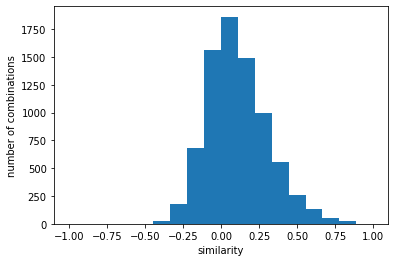

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電磁気学Ⅰ(2065).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.598185872187613}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  188.  741. 1580. 1832. 1454.  888.
  480.  240.  136.   65.   10.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


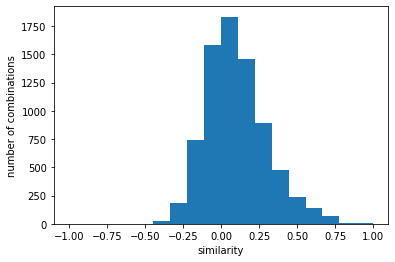

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 'similarity': 0.6160258142109954}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.000e+01 1.800e+02
 9.760e+02 2.134e+03 2.572e+03 2.157e+03 1.387e+03 8.250e+02 4.020e+02
 2.190e+02 6.300e+01 2.900e+01 9.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


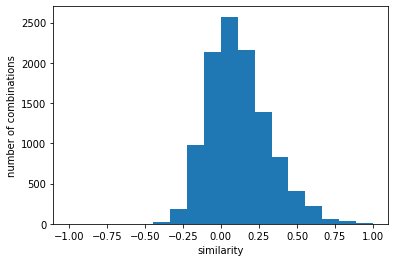

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.577630751422539}
y [  0.   0.   0.   0.   0.   4.  39. 184. 429. 564. 470. 287. 158.  99.
  51.  35.  11.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


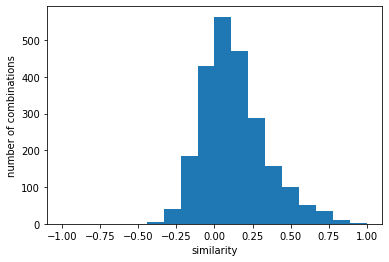

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.7619795691309635}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   25.  209.  773. 1604. 1855. 1429.  861.
  471.  256.  148.   66.    8.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


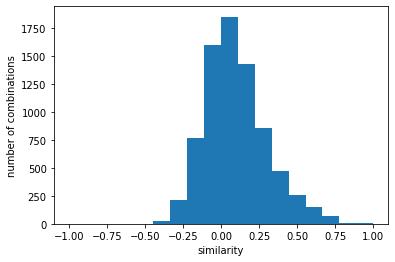

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6245051275009623}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.720e+02
 7.720e+02 1.610e+03 1.761e+03 1.421e+03 8.350e+02 4.340e+02 2.550e+02
 1.460e+02 3.000e+01 9.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


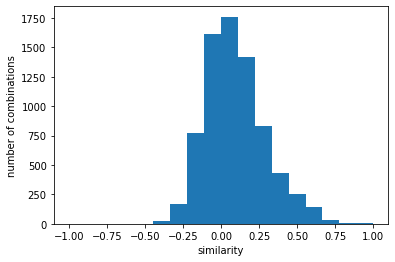

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6029056322914229}
y [ 0.  0.  0.  0.  0.  3. 10. 34. 37. 74. 70. 68. 37. 36. 38. 41. 11.  1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


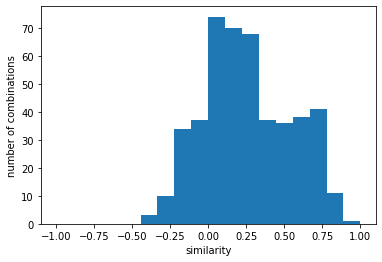

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.9237282104841872}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   53.  257.  841. 1745. 1995. 1559.  940.
  499.  249.   85.   25.   16.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


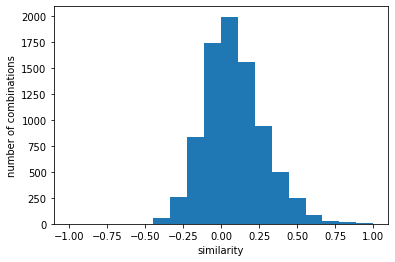

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5782112807271821}
y [  0.   0.   0.   0.   0.   1.  13.  44.  79.  91. 105.  89.  45.  36.
  22.  17.   3.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


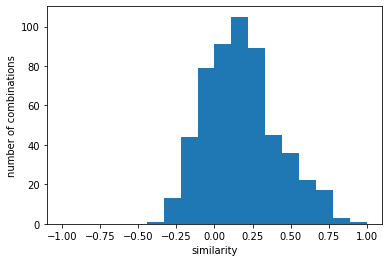

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.9067481157771934}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   11.  155.  722. 1506. 1769. 1498.  910.
  556.  292.  158.   55.   13.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


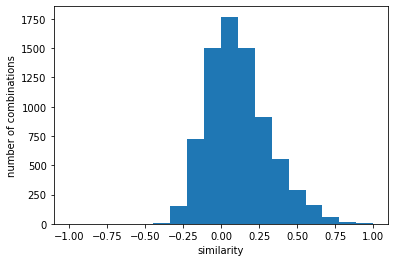

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5804137859666855}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.700e+01 1.970e+02
 8.060e+02 1.681e+03 1.916e+03 1.614e+03 9.290e+02 5.080e+02 3.180e+02
 1.580e+02 3.300e+01 9.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


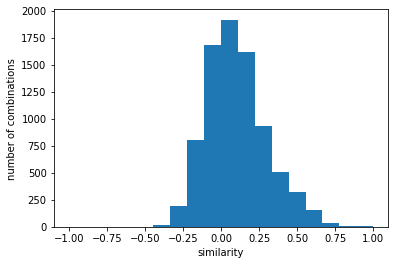

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.638611483646426}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   21.  174.  741. 1495. 1809. 1349.  822.
  463.  254.  124.   34.   12.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


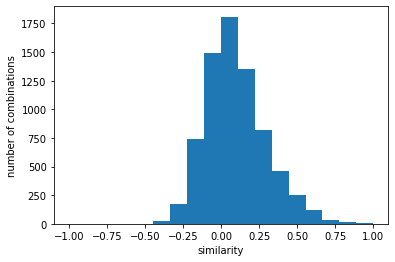

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡB(0028).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6085063680306114}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   30.  168.  751. 1704. 2234. 1962. 1377.
  771.  486.  273.  107.   49.    7.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


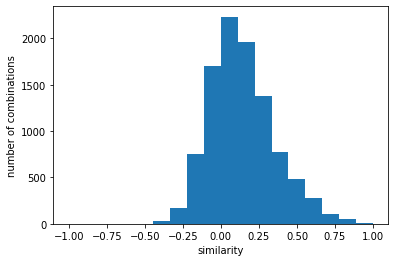

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 'similarity': 0.6114012077855946}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   22.  143.  566. 1290. 1498. 1153.  688.
  368.  168.   70.   40.    8.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


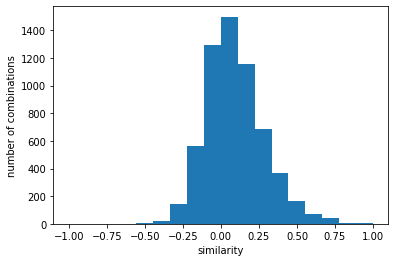

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.6147872819783236}
y [  0.   0.   0.   0.   0.   1.  11.  79. 208. 309. 300. 221. 119.  83.
  47.  14.   5.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


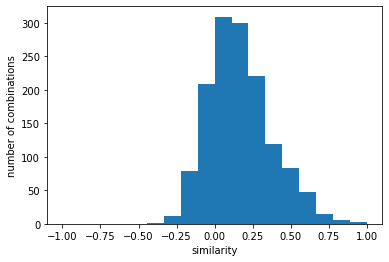

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.849152879760197}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   16.  157.  632. 1490. 1892. 1481.  929.
  508.  333.  202.   76.   21.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


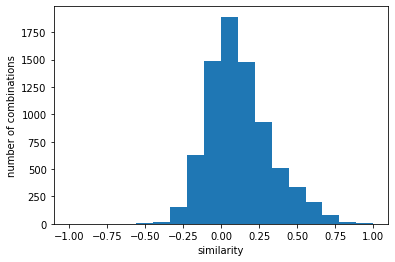

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6072843490572031}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   22.  160.  681. 1423. 1722. 1356.  884.
  499.  256.  143.   56.   14.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


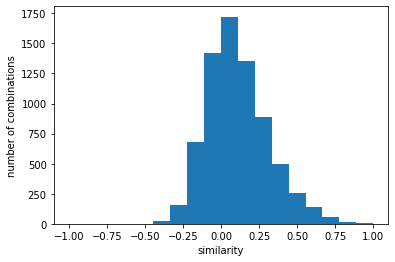

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6219621321923186}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   40.  253.  903. 1984. 2277. 1789. 1233.
  680.  337.  139.   38.   16.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


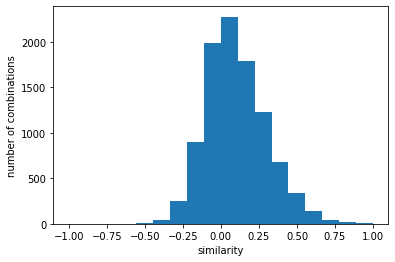

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.554526170418797}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   28.  181.  697. 1574. 1788. 1447.  913.
  518.  259.  113.   39.    6.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


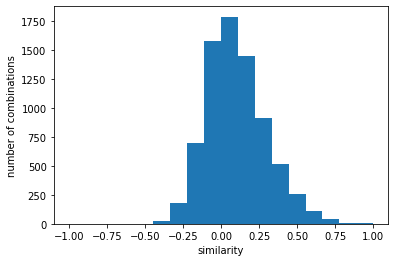

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6099032708486092}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   18.  112.  568. 1321. 1702. 1474. 1077.
  646.  441.  219.  101.   22.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


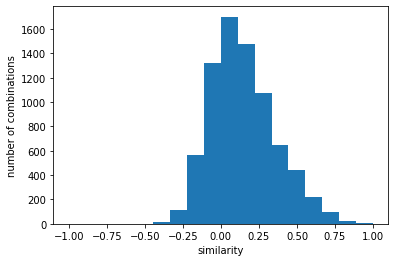

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5942903892972979}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   23.  171.  647. 1405. 1740. 1581. 1028.
  618.  406.  252.  104.   19.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


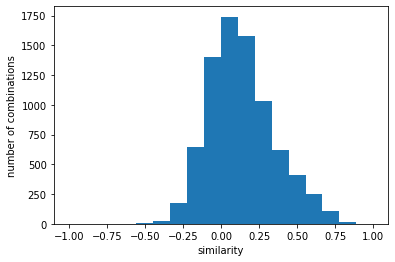

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6580128938391278}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.200e+01 1.020e+02
 3.510e+02 8.480e+02 1.178e+03 9.710e+02 6.610e+02 3.600e+02 1.720e+02
 7.800e+01 2.200e+01 3.000e+00 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


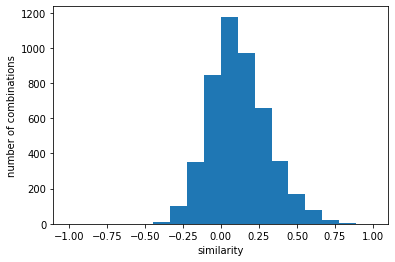

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠA(2036).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6852782310368352}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 2.000e+00 2.100e+01 1.730e+02
 8.450e+02 1.859e+03 2.190e+03 1.724e+03 1.085e+03 6.170e+02 3.320e+02
 1.710e+02 6.700e+01 2.900e+01 5.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


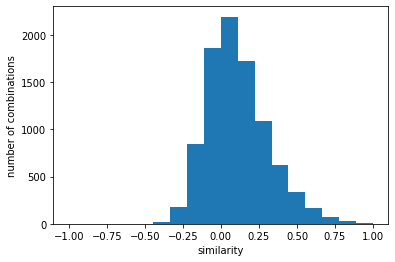

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 'similarity': 0.5332799308810527}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   31.  186.  816. 1901. 2396. 2110. 1468.
  856.  489.  262.  105.   40.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


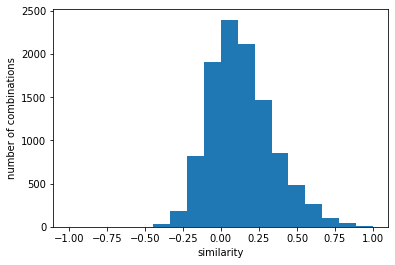

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.5617063865612114}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   13.  152.  756. 1591. 1997. 1667. 1174.
  656.  334.  165.   40.   13.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


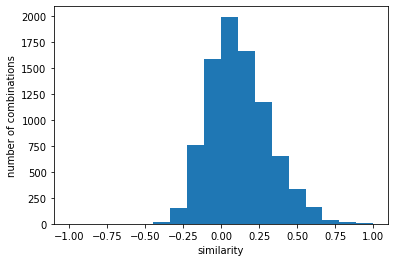

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.5733540857473827}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.200e+01 1.940e+02
 1.005e+03 2.131e+03 2.501e+03 2.153e+03 1.412e+03 8.350e+02 4.490e+02
 2.630e+02 1.010e+02 4.000e+01 8.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


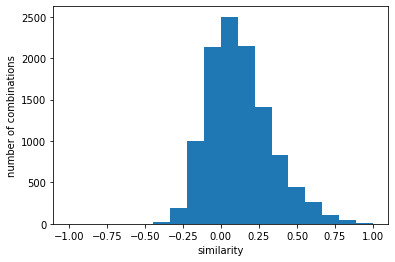

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5285885013343239}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   31.  238. 1001. 2113. 2554. 2044. 1370.
  714.  355.  124.   40.   24.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


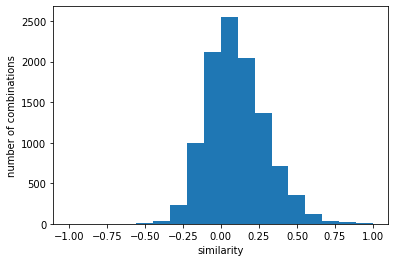

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5261757107504136}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.800e+01 2.080e+02
 9.680e+02 2.124e+03 2.539e+03 2.153e+03 1.372e+03 8.370e+02 4.000e+02
 2.000e+02 6.600e+01 2.200e+01 7.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


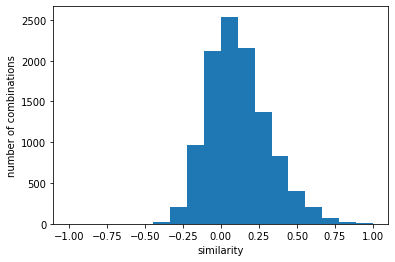

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5322736894487565}
y [  0.   0.   0.   0.   1.   4.  44. 125. 264. 377. 333. 258. 178. 144.
  89.  48.  15.  11.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


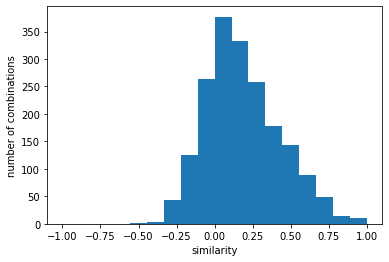

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.7470565570257529}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.600e+01 1.600e+02
 7.580e+02 1.630e+03 2.073e+03 1.914e+03 1.379e+03 8.280e+02 4.850e+02
 2.560e+02 7.200e+01 2.500e+01 6.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


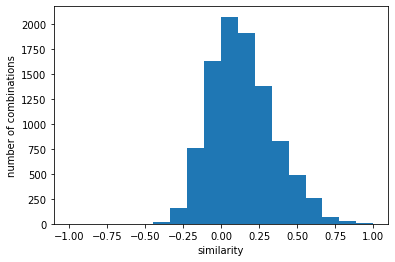

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6121392309310465}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   26.  196.  875. 2029. 2600. 2151. 1561.
  869.  466.  251.   72.   34.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


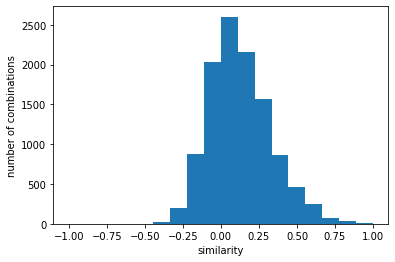

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5245467528400721}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   20.  169.  696. 1496. 1729. 1322.  752.
  384.  172.   77.   32.    6.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


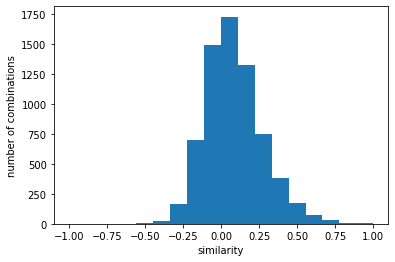

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 'similarity': 0.6418309074472858}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   21.  132.  574. 1179. 1290. 1006.  576.
  291.  190.  111.   30.    7.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


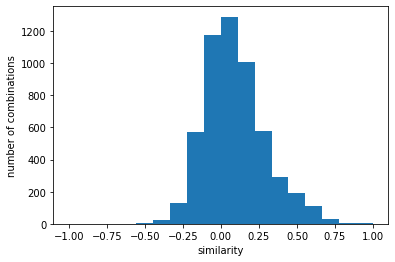

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6652613811093024}
y [  0.   0.   0.   0.   0.   1.  28. 150. 359. 493. 395. 263. 138.  91.
  46.  20.   4.   1.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


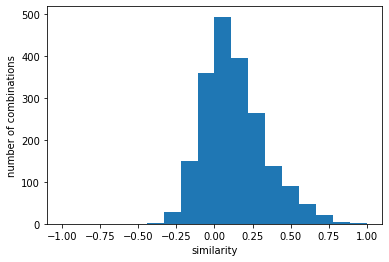

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.8173426400033673}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   45.  222.  710. 1425. 1542. 1181.  777.
  393.  172.   74.   29.   12.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


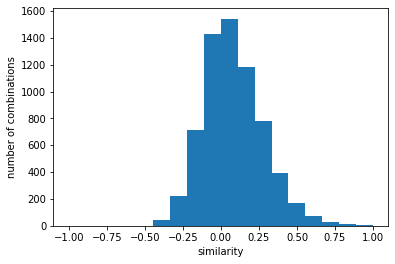

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6252546752229295}
y [  0.   0.   0.   0.   0.   1.  27. 158. 380. 461. 394. 258. 141.  84.
  46.  20.   4.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


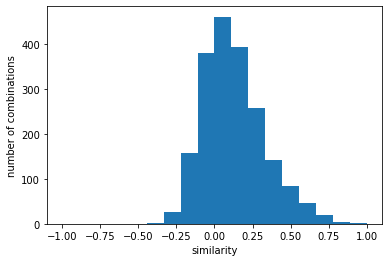

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.8214628607117035}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    6.  114.  595. 1200. 1361. 1139.  714.
  405.  227.   93.   56.   12.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


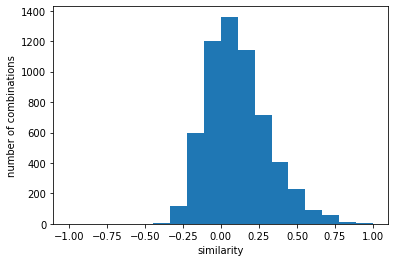

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6302664762757607}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   21.  164.  705. 1421. 1625. 1346.  756.
  396.  276.  136.   41.   10.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


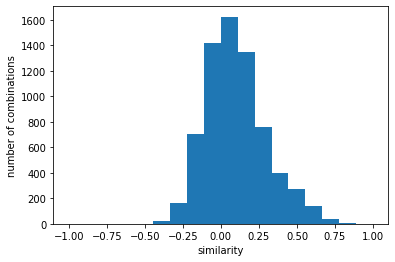

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6750027849523194}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   18.  133.  567. 1268. 1448. 1162.  718.
  405.  187.   87.   28.    8.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


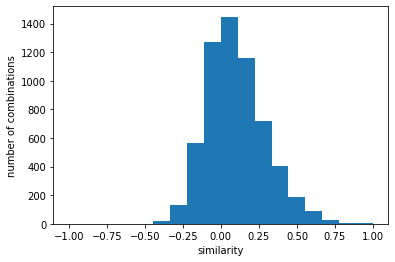

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3線形代数Ⅱ(0017).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6441662477620362}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   20.  179.  699. 1532. 1989. 1541.  935.
  536.  333.  154.   64.   14.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


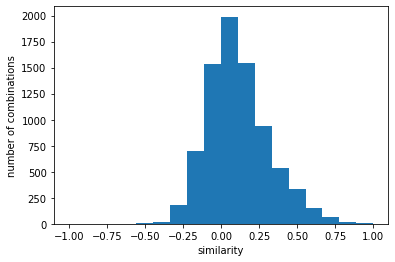

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 'similarity': 0.6020755732017539}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   19.  193.  794. 1573. 1928. 1463.  953.
  502.  305.  174.   65.   16.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


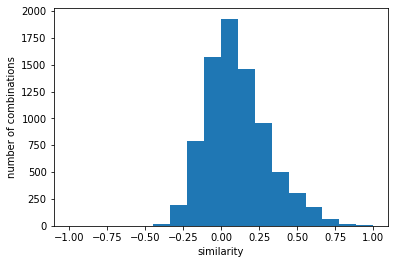

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.6067217689088228}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    4.   42.  263. 1010. 2105. 2480. 2040. 1336.
  734.  371.  152.   40.   13.   10.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


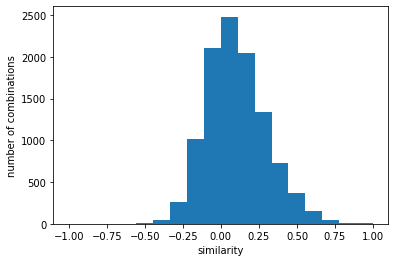

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5412564340780397}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   24.  208.  743. 1576. 1812. 1457.  882.
  500.  262.  127.   42.    7.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


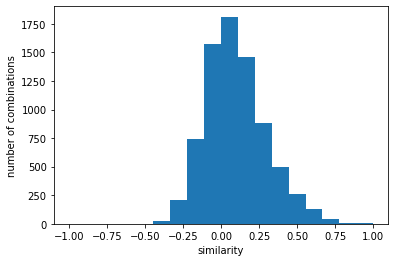

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.6107826073216133}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   20.  129.  595. 1371. 1756. 1498. 1029.
  637.  407.  212.   79.   20.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


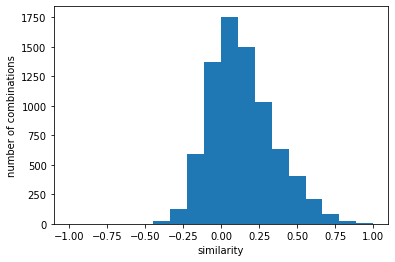

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5933907843951108}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    3.   32.  201.  745. 1598. 2057. 1807. 1155.
  706.  414.  242.   82.   18.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


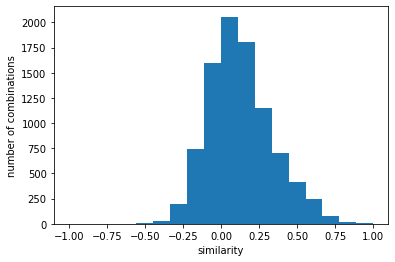

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6365695565233622}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   14.  117.  425.  934. 1224.  994.  679.
  362.  204.  105.   25.   15.    2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


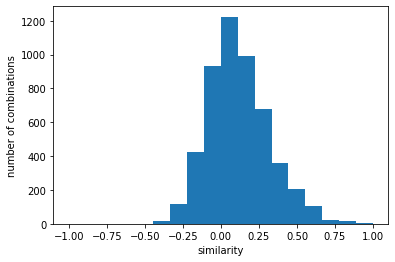

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3応用物理ⅠB(2037).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6780478474748768}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.100e+01 1.740e+02
 8.010e+02 1.688e+03 1.921e+03 1.466e+03 9.060e+02 4.310e+02 2.790e+02
 1.760e+02 4.100e+01 9.000e+00 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


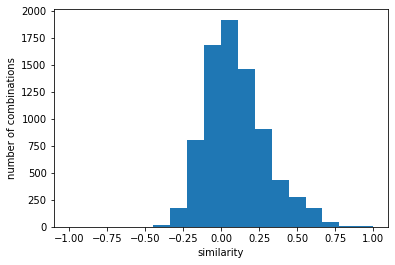

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 'similarity': 0.5856197253587616}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   33.  150.  623. 1264. 1525. 1235.  839.
  464.  212.   91.   26.    9.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


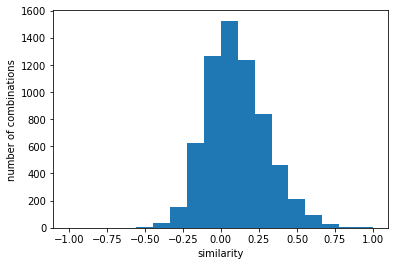

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.6405454194922406}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 1.650e+02
 7.440e+02 1.600e+03 1.822e+03 1.486e+03 9.300e+02 4.710e+02 2.880e+02
 1.580e+02 3.500e+01 1.400e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


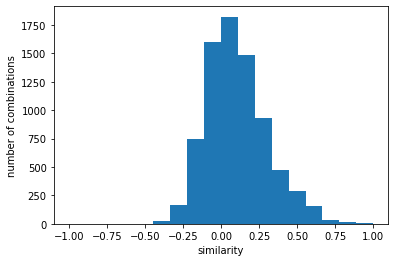

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5963430954846967}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 5.000e+00 7.500e+01
 4.020e+02 9.380e+02 1.147e+03 1.042e+03 7.700e+02 4.560e+02 2.560e+02
 1.460e+02 3.500e+01 1.900e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


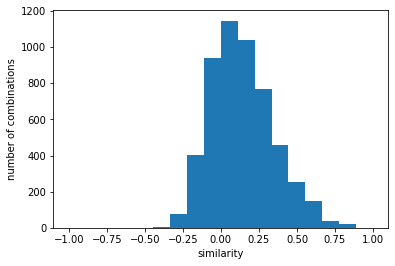

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6627182384182735}
y [  0.   0.   0.   0.   0.   2.  16.  83. 215. 281. 211. 166. 105.  73.
  69.  31.  14.   3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


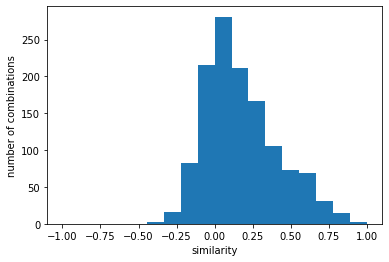

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.8665193348861393}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.900e+01 1.520e+02
 6.260e+02 1.377e+03 1.767e+03 1.553e+03 9.570e+02 5.880e+02 2.910e+02
 1.700e+02 5.100e+01 1.300e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


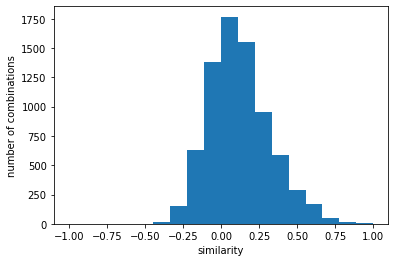

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠB(2084).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6174020447356913}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   47.  231.  832. 1773. 1981. 1570. 1000.
  507.  279.   97.   30.   15.    8.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


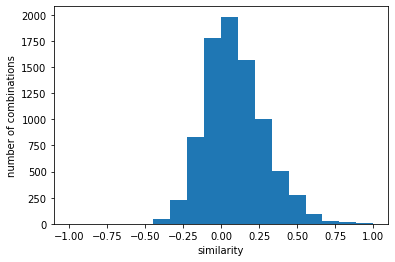

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 'similarity': 0.5805354579883827}
y [  0.   0.   0.   0.   0.   0.   6.  38.  63. 108.  88.  84.  40.  39.
  34.  23.   3.   2.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


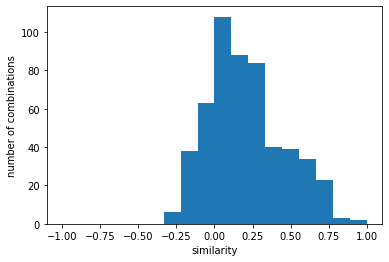

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.9112883789539559}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    7.  125.  712. 1442. 1688. 1478.  932.
  553.  337.  178.   72.   24.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


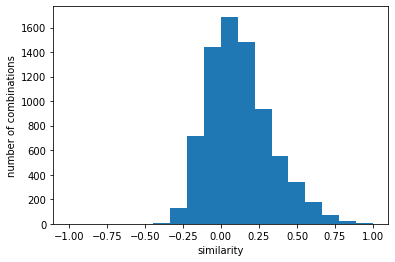

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5891097917715786}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.300e+01 2.210e+02
 8.930e+02 1.856e+03 2.103e+03 1.719e+03 1.059e+03 5.490e+02 3.790e+02
 1.980e+02 5.400e+01 1.400e+01 3.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


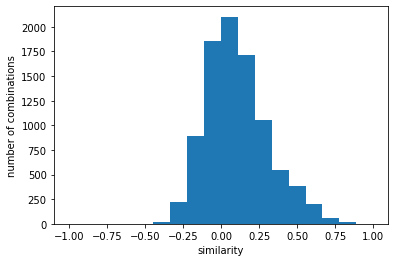

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6224350248736671}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   16.  147.  669. 1388. 1789. 1291.  839.
  484.  257.  123.   36.   10.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


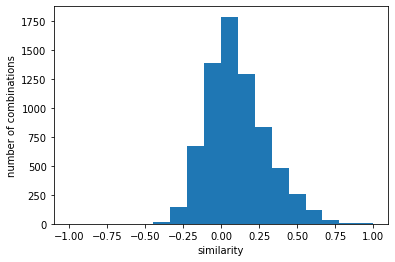

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡA(0027).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6196507255411768}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   53.  239.  802. 1708. 1935. 1542.  987.
  522.  259.   95.   27.   15.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


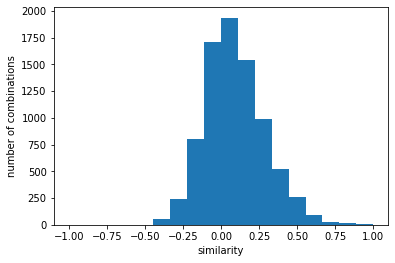

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 'similarity': 0.5868092290558655}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   14.  142.  583. 1272. 1559. 1344.  973.
  583.  309.  102.   40.   16.    3.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


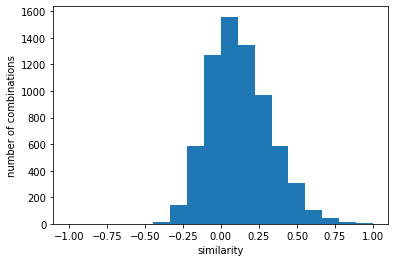

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.6197666725745946}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    5.   36.  240.  844. 1664. 2017. 1528.  986.
  538.  255.  103.   29.   11.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


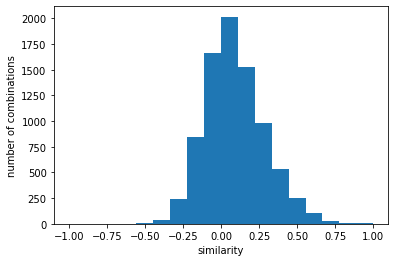

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6313904940851771}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    2.   27.  204.  820. 1712. 1943. 1710. 1177.
  670.  301.  127.   30.   14.    5.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


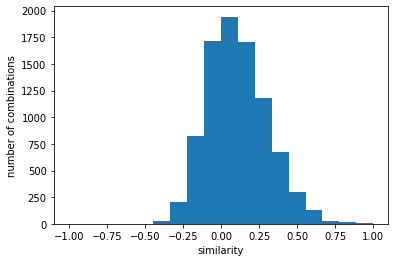

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3ロボットエレクトロニクス(2116).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.590790308111847}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.    8.  126.  623. 1369. 1696. 1524.  913.
  579.  316.  143.   60.   10.    4.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


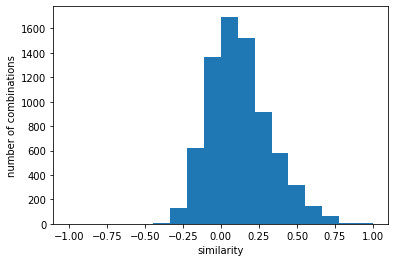

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 'similarity': 0.5930102032276637}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 2.240e+02
 8.620e+02 1.792e+03 2.062e+03 1.742e+03 1.037e+03 5.680e+02 3.550e+02
 1.750e+02 4.200e+01 1.400e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


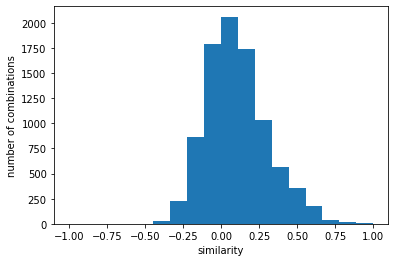

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6257059157837619}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [   0.    0.    0.    0.    0.   20.  158.  677. 1462. 1743. 1351.  868.
  508.  274.  113.   34.   11.    6.]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


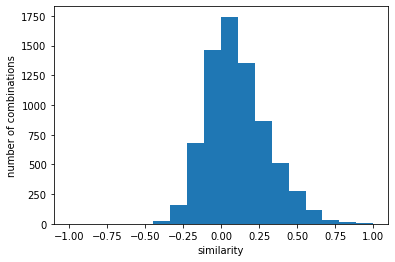

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3微分積分学ⅡC(0229).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6096473414550321}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 1.200e+01 1.200e+02
 5.520e+02 1.221e+03 1.563e+03 1.408e+03 9.830e+02 5.940e+02 3.650e+02
 2.140e+02 7.200e+01 3.100e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


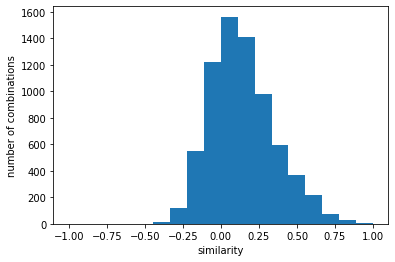

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 'similarity': 0.6787830523691817}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.200e+01 1.150e+02
 5.350e+02 1.285e+03 1.614e+03 1.513e+03 1.102e+03 6.740e+02 3.980e+02
 2.060e+02 7.300e+01 1.600e+01 1.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


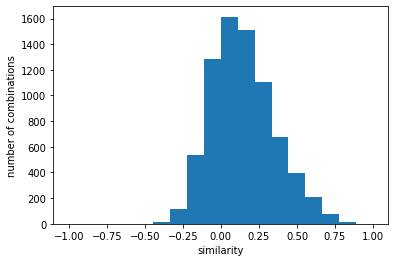

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.6368769867514331}


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  # Remove the CWD from sys.path while we load stuff.


y [0.000e+00 0.000e+00 0.000e+00 0.000e+00 1.000e+00 2.600e+01 2.120e+02
 7.600e+02 1.566e+03 2.082e+03 1.795e+03 1.146e+03 7.110e+02 3.430e+02
 1.780e+02 6.300e+01 1.700e+01 4.000e+00]
ind [-1.         -0.88888889 -0.77777778 -0.66666667 -0.55555556 -0.44444444
 -0.33333333 -0.22222222 -0.11111111  0.          0.11111111  0.22222222
  0.33333333  0.44444444  0.55555556  0.66666667  0.77777778  0.88888889
  1.        ]


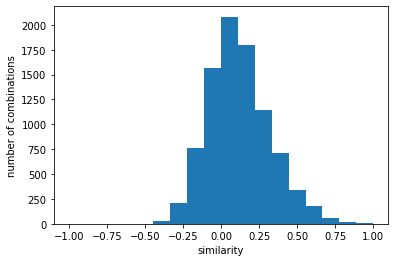

output {'s1': '/content/drive/MyDrive/sosei/meishi/meishi_3電子工学ⅠA(2083).txt', 's2': '/content/drive/MyDrive/sosei/meishi/meishi_3数理演習Ⅰ(0094).txt', 'similarity': 0.5790333170879808}


In [25]:
from gensim.models.word2vec import Word2Vec
from google.colab import files
import csv
import json

def test():
    syllabus_path = [
        '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠA(2078).txt',
        '/content/drive/MyDrive/sosei/meishi/meishi_3電気回路ⅠB(2079).txt',
        '/content/drive/MyDrive/sosei/meishi/meishi_2微分積分学ⅠA(0018).txt'
    ]
    
    output.append(syllabus_similarity(syllabus_path[0], syllabus_path[0]))
    output.append(syllabus_similarity(syllabus_path[0], syllabus_path[1]))
    output.append(syllabus_similarity(syllabus_path[0], syllabus_path[2]))  
  
if __name__ == '__main__':
    output = []
    W2V_MODEL_PATH = '/content/drive/MyDrive/sosei/Pre-Trained Word2Vec Models/latest-ja-word2vec-gensim-model/word2vec.gensim.model'
    w2v_model = Word2Vec.load(W2V_MODEL_PATH)
    
    for combination in get_all_syllabus_combination():
      output.append(syllabus_similarity(combination[0], combination[1]))
    ### このプログラムを実行して得られた全てのデータをファイル出力 ###
    with open(f"/content/drive/MyDrive/sosei/result_data/AB_Syllabus_Completedのjson/946_Data.json", 'w') as f:
        json.dump(output, f, indent=2, ensure_ascii=False)

In [ ]:
import sys
sys.path.append("/content/drive/MyDrive/sosei/function module")

import v8
j1 = v8.sort_json_by_similarity("/content/drive/MyDrive/sosei/result_data/AB_Syllabus_Completedのjson/990_Data.json", "similarity")
v8.get_accuracy(j1)

#similarityの降順のprint

In [ ]:
list_x = sorted(output, key = lambda x:x['similarity'], reverse=True) 
for i in range(30):
  print(list_x[i])